In [47]:
# Narratives:
# - Perfect score -> validation test on subsets -> examine decision tree -> feature selection distribution -> SHAP values of features
# -> Evaluation without URLSimilarityIndex and IsHTTPS.

# Meeting news:
# - Manually tune SVM hyperparameters as Grid Search and Randomised Search was too intensive for my hardware.
# - Made baseline model evaluations on test set for further comparison. RF and SVM final evaluation metrics are worse than baseline on training set.
# - Should I make a graph of all 

In [49]:
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import string
import shap
from urllib.parse import urlparse
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline as ImbPipeline
from sklearn.model_selection import train_test_split, cross_validate, cross_val_predict, StratifiedKFold, LearningCurveDisplay, KFold
from sklearn.model_selection import GridSearchCV, ValidationCurveDisplay, validation_curve, RandomizedSearchCV
from sklearn.compose import make_column_selector as selector
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import OrdinalEncoder, StandardScaler, OneHotEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.feature_selection import mutual_info_classif, SequentialFeatureSelector
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score
from sklearn.tree import plot_tree
from scipy.stats import mode

In [51]:
# To play a sound when a cell is finished executing

from IPython.lib.display import Audio

framerate = 4410
play_time_seconds = 3

t = np.linspace(0, play_time_seconds, framerate*play_time_seconds)
audio_data = np.sin(2*np.pi*300*t) + np.sin(2*np.pi*240*t)

# Audio(audio_data, rate=framerate, autoplay=True)

## 1. Preprocessing Dataset 1 (PhiUSIIL)

In [54]:
PhiUSIIL = pd.read_csv('PhiUSIIL.csv', encoding='latin-1')

In [56]:
PhiUSIIL.head()

,ï»¿FILENAME,URL,URLLength,Domain,DomainLength,IsDomainIP,TLD,URLSimilarityIndex,CharContinuationRate,TLDLegitimateProb,...,Pay,Crypto,HasCopyrightInfo,NoOfImage,NoOfCSS,NoOfJS,NoOfSelfRef,NoOfEmptyRef,NoOfExternalRef,label
0,521848.txt,https://www.southbankmosaics.com,31,www.southbankmosaics.com,24,0,com,100.0,1.000000,0.522907,...,0,0,1,34,20,28,119,0,124,1
1,31372.txt,https://www.uni-mainz.de,23,www.uni-mainz.de,16,0,de,100.0,0.666667,0.032650,...,0,0,1,50,9,8,39,0,217,1
2,597387.txt,https://www.voicefmradio.co.uk,29,www.voicefmradio.co.uk,22,0,uk,100.0,0.866667,0.028555,...,0,0,1,10,2,7,42,2,5,1
3,554095.txt,https://www.sfnmjournal.com,26,www.sfnmjournal.com,19,0,com,100.0,1.000000,0.522907,...,1,1,1,3,27,15,22,1,31,1
4,151578.txt,https://www.rewildingargentina.org,33,www.rewildingargentina.org,26,0,org,100.0,1.000000,0.079963,...,1,0,1,244,15,34,72,1,85,1


In [58]:
PhiUSIIL.groupby('label').describe()

URLLength                                                        \
          count       mean        std   min   25%   50%   75%     max   
label                                                                   
0      100945.0  45.720293  61.145523  13.0  26.0  34.0  48.0  6097.0   
1      134850.0  26.228610   4.815612  15.0  23.0  26.0  29.0    57.0   

      DomainLength             ... NoOfEmptyRef         NoOfExternalRef  \
             count       mean  ...          75%     max           count   
label                          ...                                        
0         100945.0  24.465144  ...          0.0    91.0        100945.0   
1         134850.0  19.228610  ...          3.0  4887.0        134850.0   

                                                               
            mean         std  min   25%   50%    75%      max  
label                                                          
0       1.128119    3.204587  0.0   0.0   0.0    1.0    368.0  
1      85.294601  205.669475  0.0  17.0  46.0  106.0  27516.0  

[2 rows x 400 columns]

In [59]:
PhiUSIIL.columns

Index(['ï»¿FILENAME', 'URL', 'URLLength', 'Domain', 'DomainLength',
       'IsDomainIP', 'TLD', 'URLSimilarityIndex', 'CharContinuationRate',
       'TLDLegitimateProb', 'URLCharProb', 'TLDLength', 'NoOfSubDomain',
       'HasObfuscation', 'NoOfObfuscatedChar', 'ObfuscationRatio',
       'NoOfLettersInURL', 'LetterRatioInURL', 'NoOfDegitsInURL',
       'DegitRatioInURL', 'NoOfEqualsInURL', 'NoOfQMarkInURL',
       'NoOfAmpersandInURL', 'NoOfOtherSpecialCharsInURL',
       'SpacialCharRatioInURL', 'IsHTTPS', 'LineOfCode', 'LargestLineLength',
       'HasTitle', 'Title', 'DomainTitleMatchScore', 'URLTitleMatchScore',
       'HasFavicon', 'Robots', 'IsResponsive', 'NoOfURLRedirect',
       'NoOfSelfRedirect', 'HasDescription', 'NoOfPopup', 'NoOfiFrame',
       'HasExternalFormSubmit', 'HasSocialNet', 'HasSubmitButton',
       'HasHiddenFields', 'HasPasswordField', 'Bank', 'Pay', 'Crypto',
       'HasCopyrightInfo', 'NoOfImage', 'NoOfCSS', 'NoOfJS', 'NoOfSelfRef',
       'NoOfEmptyRef', 'N

### 1.1 Feature Extraction

In [61]:
#Tokenises the domain and path of the URL and return no. of tokens.
def token_count(url):
    parsed = urlparse(url)
    tokens = [parsed.scheme]
    tokens.extend(parsed.netloc.split('.'))
    
    if parsed.path:
        tokens.extend(parsed.path.strip('/').split('/'))
    
    return len(tokens)

#Counts the dots in the URL
def count_dots(url):
    return url.count('.')

# Finds the path token with the longest length.
def longest_path_token(url):
    parsed = urlparse(url)
    
    if parsed.path:
        tokens = []
        tokens.extend(parsed.path.strip('/').split('/'))
    
        return len(max(tokens))

    return -1

# Counts the number of digits in the query part of the URL
def query_digits(url):
    parsed = urlparse(url)
    
    if parsed.query:
        count = 0
        for c in parsed.query:
            if c.isdigit():
                count += 1

        return count
                
    return -1

In [62]:
delimiters = ['!','@','#','$','%','&','-','_','=','+','{','}','|','\\',':',';',',','.','/','?','(',')','[',']','*','^','~','`','<','>','"',"'"]

# Counts how many delimiters are in the domain/path
def count_delimiters(string):
    count = 0
    for c in string:
        if c in delimiters:
            count += 1

    return count

def delimiters_domain(url):
    parsed = urlparse(url)
        
    return count_delimiters(parsed.netloc)


def delimiters_path(url):
    parsed = urlparse(url)

    if parsed.path:
        return count_delimiters(parsed.path)

    return 0

In [63]:
PhiUSIIL['TokenCount'] = PhiUSIIL['URL'].apply(token_count)
PhiUSIIL['DotCount'] = PhiUSIIL['URL'].apply(count_dots)
PhiUSIIL['DelimiterDomainCount'] = PhiUSIIL['URL'].apply(delimiters_domain)
PhiUSIIL['DelimiterPathCount'] = PhiUSIIL['URL'].apply(delimiters_path)
PhiUSIIL['LongestPathToken'] = PhiUSIIL['URL'].apply(longest_path_token)
PhiUSIIL['DigitQueryCount'] = PhiUSIIL['URL'].apply(query_digits)

### 1.2 Dropping Non-Lexical Feature Columns / Train Test Split

In [69]:
# Drop filename, url and domain columns. Also, any features that are not lexical features.
rm_cols = ['ï»¿FILENAME', 'URL', 'Domain', 'LineOfCode', 'LargestLineLength', 'HasTitle', 'Title', 'DomainTitleMatchScore', 'URLTitleMatchScore', 'HasFavicon', 'Robots',
           'IsResponsive', 'NoOfURLRedirect', 'NoOfSelfRedirect', 'HasDescription', 'NoOfPopup', 'NoOfiFrame', 'HasExternalFormSubmit', 
           'HasSocialNet', 'HasSubmitButton', 'HasHiddenFields', 'HasPasswordField', 'Bank', 'Pay', 'Crypto', 'HasCopyrightInfo', 'NoOfImage', 
           'NoOfCSS', 'NoOfJS', 'NoOfSelfRef', 'NoOfEmptyRef', 'NoOfExternalRef']

PhiUSIIL.drop(rm_cols, axis=1, inplace=True)

In [70]:
# Seperate features and target label for PhiUSIIL dataset.
# Swap labels so that 0 = Benign, 1 = Phishing. Because '1' is treated as the positive label by default in sklearn scorers.

phi_encode = {1: 0, 0: 1}

PhiUSIIL['label'] = PhiUSIIL['label'].map(phi_encode)

PhiUSIIL_y = PhiUSIIL['label']
PhiUSIIL_x = PhiUSIIL.drop('label', axis=1)


In [71]:
#Train and Test split
x_train_phi, x_test_phi, y_train_phi, y_test_phi = train_test_split(PhiUSIIL_x, PhiUSIIL_y, test_size=0.2, random_state=42)

## 2. Preprocessing Dataset 2 (ISCXURL-2016)

In [73]:
ISCXURL = pd.read_csv('ISCXURL-2016.csv', encoding='latin-1')

### 2.1 Removing Nan/INF Values

In [75]:
# avgpathtokenlen rows with NaN values are caused by samples with 0 path tokens. Thus, replace them with 0.
ISCXURL['avgpathtokenlen'] = ISCXURL['avgpathtokenlen'].fillna(0)

# NumberRate_DirectoryName and NumberRate_FileName rows with NaN values are caused by samples with no path.
ISCXURL['NumberRate_DirectoryName'] = ISCXURL['NumberRate_DirectoryName'].fillna(0)
ISCXURL['NumberRate_FileName'] = ISCXURL['NumberRate_FileName'].fillna(0)

# Just less than half of the samples had NaN values for NumberRate_Extension. Hence, dropping the column.
ISCXURL.drop('NumberRate_Extension', axis=1, inplace=True)

# Replace NaN values in NumberRate_AfterPath, Entropy_DirectoryName, Entropy_Filename, Entropy_Extension, and Entropy_Afterpath with -1.
ISCXURL['NumberRate_AfterPath'] = ISCXURL['NumberRate_AfterPath'].fillna(-1)
ISCXURL['Entropy_DirectoryName'] = ISCXURL['Entropy_DirectoryName'].fillna(-1)
ISCXURL['Entropy_Filename'] = ISCXURL['Entropy_Filename'].fillna(-1)
ISCXURL['Entropy_Extension'] = ISCXURL['Entropy_Extension'].fillna(-1)
ISCXURL['Entropy_Afterpath'] = ISCXURL['Entropy_Afterpath'].fillna(-1)

# Replace inf values in ArgPathRatio with -1.
ISCXURL.replace([np.inf, -np.inf], -1, inplace=True)

In [76]:
ISCXURL.head()

,Querylength,domain_token_count,path_token_count,avgdomaintokenlen,longdomaintokenlen,avgpathtokenlen,tld,charcompvowels,charcompace,ldl_url,...,SymbolCount_FileName,SymbolCount_Extension,SymbolCount_Afterpath,Entropy_URL,Entropy_Domain,Entropy_DirectoryName,Entropy_Filename,Entropy_Extension,Entropy_Afterpath,URL_Type_obf_Type
0,0,2,12,5.5,8,4.083334,2,15,7,0,...,-1,-1,-1,0.676804,0.860529,-1.000000,-1.000000,-1.00000,-1.000000,benign
1,0,3,12,5.0,10,3.583333,3,12,8,2,...,1,0,-1,0.715629,0.776796,0.693127,0.738315,1.00000,-1.000000,benign
2,2,2,11,4.0,5,4.750000,2,16,11,0,...,2,0,1,0.677701,1.000000,0.677704,0.916667,0.00000,0.898227,benign
3,0,2,7,4.5,7,5.714286,2,15,10,0,...,0,0,-1,0.696067,0.879588,0.818007,0.753585,0.00000,-1.000000,benign
4,19,2,10,6.0,9,2.250000,2,9,5,0,...,5,4,3,0.747202,0.833700,0.655459,0.829535,0.83615,0.823008,benign


In [77]:
ISCXURL.groupby('URL_Type_obf_Type').describe()

Querylength                                                  \
                        count      mean        std  min  25%  50%  75%    max   
URL_Type_obf_Type                                                               
benign                 7781.0  4.057705  12.011172  0.0  0.0  0.0  0.0  167.0   
phishing               7586.0  2.818613  16.029580  0.0  0.0  0.0  0.0  173.0   

                  domain_token_count            ... Entropy_Extension       \
                               count      mean  ...               75%  max   
URL_Type_obf_Type                               ...                          
benign                        7781.0  2.082894  ...          0.827729  1.0   
phishing                      7586.0  3.016346  ...          1.000000  1.0   

                  Entropy_Afterpath                                          \
                              count      mean       std  min  25%  50%  75%   
URL_Type_obf_Type                                                             
benign                       7781.0 -0.641047  0.723443 -1.0 -1.0 -1.0 -1.0   
phishing                     7586.0 -0.808775  0.551493 -1.0 -1.0 -1.0 -1.0   

                        
                   max  
URL_Type_obf_Type       
benign             1.0  
phishing           1.0  

[2 rows x 624 columns]

In [78]:
ISCXURL.columns

Index(['Querylength', 'domain_token_count', 'path_token_count',
       'avgdomaintokenlen', 'longdomaintokenlen', 'avgpathtokenlen', 'tld',
       'charcompvowels', 'charcompace', 'ldl_url', 'ldl_domain', 'ldl_path',
       'ldl_filename', 'ldl_getArg', 'dld_url', 'dld_domain', 'dld_path',
       'dld_filename', 'dld_getArg', 'urlLen', 'domainlength', 'pathLength',
       'subDirLen', 'fileNameLen', 'this.fileExtLen', 'ArgLen', 'pathurlRatio',
       'ArgUrlRatio', 'argDomanRatio', 'domainUrlRatio', 'pathDomainRatio',
       'argPathRatio', 'executable', 'isPortEighty', 'NumberofDotsinURL',
       'ISIpAddressInDomainName', 'CharacterContinuityRate',
       'LongestVariableValue', 'URL_DigitCount', 'host_DigitCount',
       'Directory_DigitCount', 'File_name_DigitCount', 'Extension_DigitCount',
       'Query_DigitCount', 'URL_Letter_Count', 'host_letter_count',
       'Directory_LetterCount', 'Filename_LetterCount',
       'Extension_LetterCount', 'Query_LetterCount', 'LongestPathToken

### 2.2 Train Test Split

In [80]:
# Seperate features and target label for ISCXURL dataset.
# Encoding labels as 0 = Benign, 1 = Phishing
encoded = {'phishing': 1, 'benign': 0}

ISCXURL_x = ISCXURL.drop('URL_Type_obf_Type', axis=1)
ISCXURL_y = ISCXURL['URL_Type_obf_Type'].map(encoded)

In [81]:
#Train and Test split
x_train_ISCX, x_test_ISCX, y_train_ISCX, y_test_ISCX = train_test_split(ISCXURL_x, ISCXURL_y, test_size=0.2, random_state=42)

## 3. Initial Evaluation (Dataset 1 - PhiUSIIL)

In [83]:
class FrequencyEncoder(BaseEstimator, TransformerMixin):
    def __init__(self):
        self.frequencies_ = {}

    def fit(self, X, y=None):
        # X is assumed to be a DataFrame
        for col in X.columns:
            # Calculate frequency for each category
            self.frequencies_[col] = X[col].value_counts() / len(X)
        return self

    def transform(self, X, y=None):
        # Replace each category with its frequency in the column
        X_transformed = X.copy()
        for col in X_transformed.columns:
            X_transformed[col] = X_transformed[col].map(self.frequencies_[col]).fillna(0)
        return X_transformed

In [84]:
# Refer to Using Numerical and Categorical Variables Together  in 1. Predictive Modelling on FUNMOOC Notes

numerical_selector = selector(dtype_exclude=object)
categorical_selector = selector(dtype_include=object)

num_col = numerical_selector(x_train_phi)
cat_col = categorical_selector(x_train_phi)

# Frequency encoding because categorical feature "TLD" is nominal with high cardinality.

preprocessor = ColumnTransformer(
    [
        ("Frequency Encoder", FrequencyEncoder(), cat_col),
        ("Standard Scaler", StandardScaler(), num_col)
    ]
)

RF = make_pipeline(preprocessor, RandomForestClassifier(random_state=42))
GNB = make_pipeline(preprocessor, GaussianNB())
SVM = make_pipeline(preprocessor, SVC(random_state=42))

SVM_linear = make_pipeline(preprocessor, SVC(random_state=42, kernel='linear'))

RF_SMOTE = ImbPipeline(steps=[
    ('preprocessor', preprocessor),
    ('smote', SMOTE(random_state=42)),
    ('classifier', RandomForestClassifier(random_state=42))
])

GNB_SMOTE = ImbPipeline(steps=[
    ('preprocessor', preprocessor),
    ('smote', SMOTE(random_state=42)),
    ('classifier', GaussianNB())
])

SVM_SMOTE = ImbPipeline(steps=[
    ('preprocessor', preprocessor),
    ('smote', SMOTE(random_state=42)),
    ('classifier', SVC(random_state=42))
])

scoring = ['accuracy', 'precision', 'recall', 'f1']

strat = StratifiedKFold()

In [92]:
# For evaluation with removal of URLSimilarityIndex and IsHTTPS after seeing distribution of top features with MMI above 0.2 (below in 5.2).
# These two features have a well-separated distribution between benign and phishing labels.
# To verify the near perfect classification results received in 3.1.1.
rm_top_phi = ['URLSimilarityIndex', 'IsHTTPS']
x_train_phi_rm = x_train_phi.drop(rm_top_phi, axis=1)

num_col_rm = numerical_selector(x_train_phi_rm)
cat_col_rm = categorical_selector(x_train_phi_rm)

preprocessor_rm = ColumnTransformer(
    [
        ("Frequency Encoder", FrequencyEncoder(), cat_col_rm),
        ("Standard Scaler", StandardScaler(), num_col_rm)
    ]
)

RF_rm = make_pipeline(preprocessor_rm, RandomForestClassifier(random_state=42))
GNB_rm = make_pipeline(preprocessor_rm, GaussianNB())
SVM_rm = make_pipeline(preprocessor_rm, SVC(random_state=42))

# To provide more meaningful evaluations on the dataset as these URLSimilarityIndex can be solely used to perfectly classify all samples.
rm_USI = ['URLSimilarityIndex']
x_train_phi_rm_USI = x_train_phi.drop(rm_USI, axis=1)

num_col_rm_USI = numerical_selector(x_train_phi_rm_USI)
cat_col_rm_USI = categorical_selector(x_train_phi_rm_USI)

preprocessor_rm_USI = ColumnTransformer(
    [
        ("Frequency Encoder", FrequencyEncoder(), cat_col_rm_USI),
        ("Standard Scaler", StandardScaler(), num_col_rm_USI)
    ]
)

RF_rm_USI = make_pipeline(preprocessor_rm_USI, RandomForestClassifier(random_state=42))
GNB_rm_USI = make_pipeline(preprocessor_rm_USI, GaussianNB())
SVM_rm_USI = make_pipeline(preprocessor_rm_USI, SVC(random_state=42))

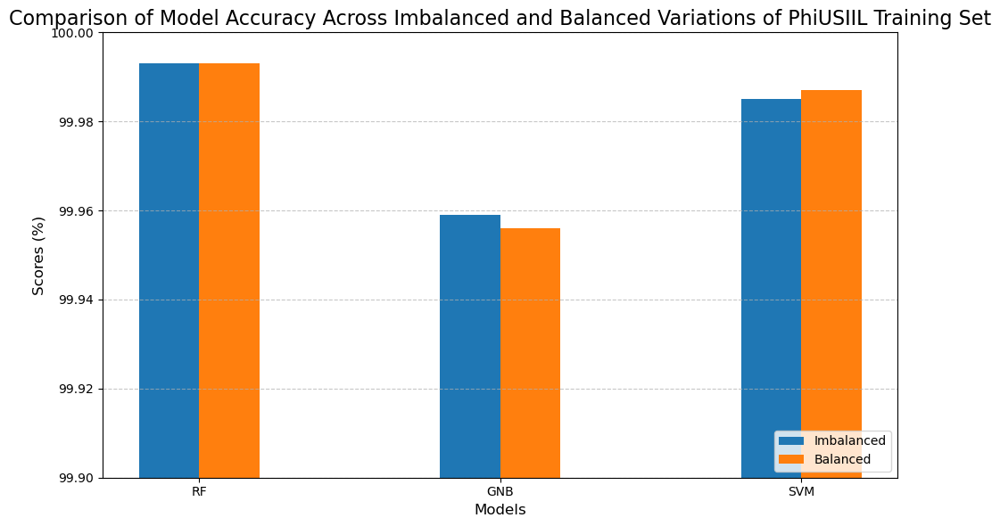

In [228]:
# Metrics for the models
models = ["RF", 'GNB', 'SVM']
imbalanced = [99.993, 99.959, 99.985]
balanced = [99.993, 99.956, 99.987]

# Combine metrics into a single data structure
metrics = [imbalanced, balanced]
metric_names = ['Imbalanced', 'Balanced']

# Bar chart properties
x = np.arange(len(models))  # x positions for groups
width = 0.2  # Width of each bar

# Create the plot
fig, ax = plt.subplots(figsize=(10, 6))

# Plot each metric as a group of bars
for i, metric in enumerate(metrics):
    ax.bar(x + i * width, metric, width, label=metric_names[i])

# Formatting the chart
ax.set_title('Comparison of Model Accuracy Across Imbalanced and Balanced Variations of PhiUSIIL Training Set', fontsize=16)
ax.set_xlabel('Models', fontsize=12)
ax.set_ylabel('Scores (%)', fontsize=12)
ax.set_xticks(x + width/2)  # Center the group labels
ax.set_xticklabels(models, fontsize=10)
ax.legend(loc='lower right', fontsize=10)
ax.set_ylim(99.9, 100)  # Assuming metric scores are between 0 and 1

# Add gridlines for better readability
ax.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot
plt.tight_layout()
plt.show()

### 3.1 Initial Evaluation - No Upsampling (PhiUSIIL)

#### 3.1.1 Random Forest

label
0    107815
1     80821
Name: count, dtype: int64

Results on entire training set:
RF Accuracy: 0.9999257831580675 ± 1.9834534287927584e-05
RF Precision: 0.9999752528845619 ± 3.0308902738657246e-05
RF Recall: 0.9998515241968094 ± 4.9490977792528384e-05
RF F1: 0.999913383564811 ± 2.3148193384297216e-05


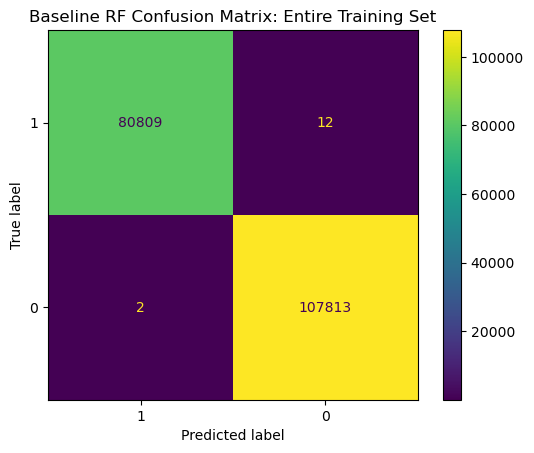

In [435]:
# Evaluation on entire training set.

print(y_train_phi.value_counts())

RF_cv = cross_validate(RF, x_train_phi, y_train_phi, cv=strat, scoring=scoring, n_jobs=-1, error_score='raise')

RF_cv_pred = cross_val_predict(RF, x_train_phi, y_train_phi, cv=strat, n_jobs=-1)

print("\nResults on entire training set:")
print(f"RF Accuracy: {RF_cv['test_accuracy'].mean()} ± {RF_cv['test_accuracy'].std()}")
print(f"RF Precision: {RF_cv['test_precision'].mean()} ± {RF_cv['test_precision'].std()}")
print(f"RF Recall: {RF_cv['test_recall'].mean()} ± {RF_cv['test_recall'].std()}")
print(f"RF F1: {RF_cv['test_f1'].mean()} ± {RF_cv['test_f1'].std()}")

RF_cv_cm = ConfusionMatrixDisplay.from_predictions(y_train_phi, RF_cv_pred, labels=[1, 0], display_labels=[1, 0])
_ = RF_cv_cm.ax_.set(title="Baseline RF Confusion Matrix: Entire Training Set")

label
0    57
1    43
Name: count, dtype: int64

Results on 100 samples:
RF Accuracy: 1.0 ± 0.0
RF Precision: 1.0 ± 0.0
RF Recall: 1.0 ± 0.0
RF F1: 1.0 ± 0.0


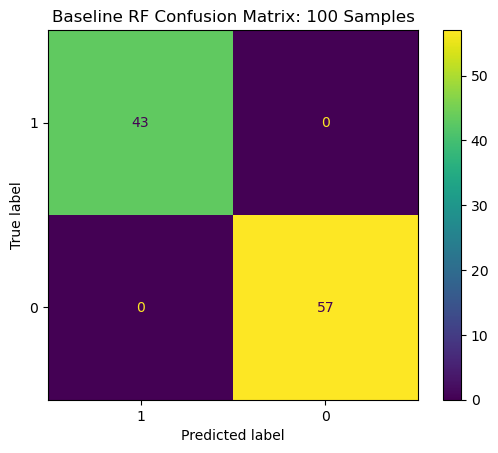

In [437]:
#Evaluation on subset of 100 samples from training set for verification.

x_phi_train_100, _, y_phi_train_100, _ = train_test_split(x_train_phi, y_train_phi, train_size=100, random_state=42)

print(y_phi_train_100.value_counts())

kf = KFold(n_splits=10, shuffle=True, random_state=24)

RF_cv_100 = cross_validate(RF, x_phi_train_100, y_phi_train_100, cv=kf, scoring=scoring, n_jobs=-1)

RF_cv_100_pred = cross_val_predict(RF, x_phi_train_100, y_phi_train_100, cv=kf, n_jobs=-1)

print("\nResults on 100 samples:")
print(f"RF Accuracy: {RF_cv_100['test_accuracy'].mean()} ± {RF_cv_100['test_accuracy'].std()}")
print(f"RF Precision: {RF_cv_100['test_precision'].mean()} ± {RF_cv_100['test_precision'].std()}")
print(f"RF Recall: {RF_cv_100['test_recall'].mean()} ± {RF_cv_100['test_recall'].std()}")
print(f"RF F1: {RF_cv_100['test_f1'].mean()} ± {RF_cv_100['test_f1'].std()}")

RF_cv_100_cm = ConfusionMatrixDisplay.from_predictions(y_phi_train_100, RF_cv_100_pred, labels=[1, 0], display_labels=[1, 0])
_ = RF_cv_100_cm.ax_.set(title="Baseline RF Confusion Matrix: 100 Samples")
# 0 = Phishing 1 and 1 = Benign

label
0    599
1    401
Name: count, dtype: int64

Results on 1000 samples:
RF Accuracy: 1.0 ± 0.0
RF Precision: 1.0 ± 0.0
RF Recall: 1.0 ± 0.0
RF F1: 1.0 ± 0.0


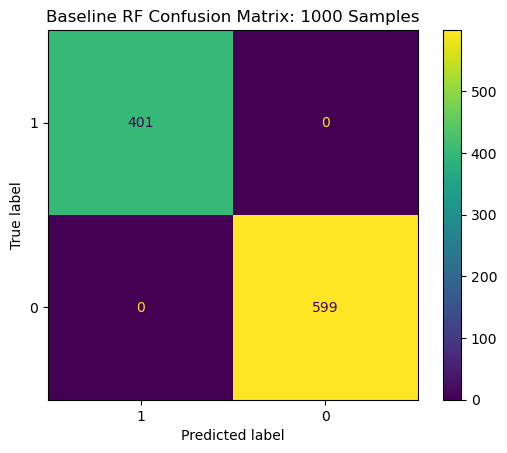

In [439]:
#Evaluation on subset of 1000 samples from training set for verification.

x_phi_train_1000, _, y_phi_train_1000, _ = train_test_split(x_train_phi, y_train_phi, train_size=1000, random_state=42)

print(y_phi_train_1000.value_counts())

kf = KFold(n_splits=10, shuffle=True, random_state=24)

RF_cv_1000 = cross_validate(RF, x_phi_train_1000, y_phi_train_1000, cv=kf, scoring=scoring, n_jobs=-1)

RF_cv_1000_pred = cross_val_predict(RF, x_phi_train_1000, y_phi_train_1000, cv=kf, n_jobs=-1)

print("\nResults on 1000 samples:")
print(f"RF Accuracy: {RF_cv_1000['test_accuracy'].mean()} ± {RF_cv_1000['test_accuracy'].std()}")
print(f"RF Precision: {RF_cv_1000['test_precision'].mean()} ± {RF_cv_1000['test_precision'].std()}")
print(f"RF Recall: {RF_cv_1000['test_recall'].mean()} ± {RF_cv_1000['test_recall'].std()}")
print(f"RF F1: {RF_cv_1000['test_f1'].mean()} ± {RF_cv_1000['test_f1'].std()}")

RF_cv_1000_cm = ConfusionMatrixDisplay.from_predictions(y_phi_train_1000, RF_cv_1000_pred, labels=[1, 0], display_labels=[1, 0])
_ = RF_cv_1000_cm.ax_.set(title="Baseline RF Confusion Matrix: 1000 Samples")
# 0 = Phishing 1 and 1 = Benign

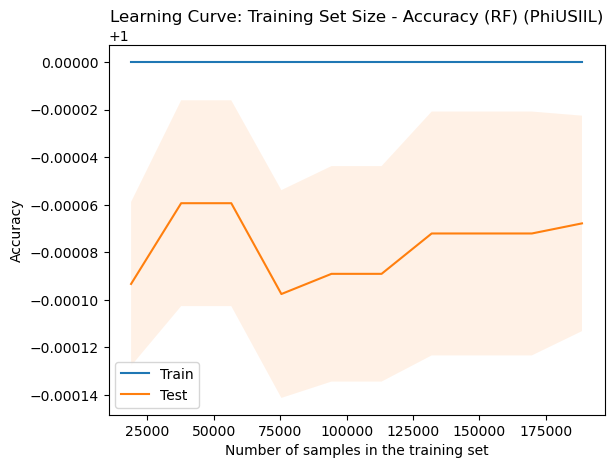

In [55]:
train_size = np.linspace(0.1, 1, 10)

learn_curve_log_loss = LearningCurveDisplay.from_estimator(
    RF,
    PhiUSIIL_x,
    PhiUSIIL_y,
    train_sizes=train_size,
    score_type='both',
    score_name="Accuracy",
    fill_between_kw={"alpha": 0.1},
    n_jobs=-1
    )

_ = learn_curve_log_loss.ax_.set(title="Learning Curve: Training Set Size - Accuracy (RF) (PhiUSIIL)")

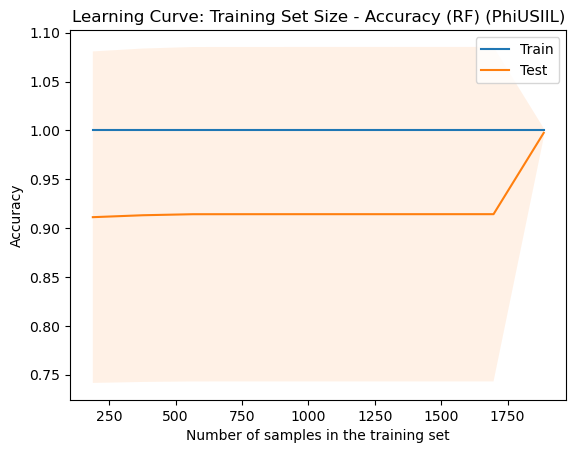

In [186]:
train_size2 = np.linspace(0.001, 0.01, 10)

learn_curve_log_loss = LearningCurveDisplay.from_estimator(
    RF,
    PhiUSIIL_x,
    PhiUSIIL_y,
    train_sizes=train_size2,
    score_type='both',
    score_name="Accuracy",
    fill_between_kw={"alpha": 0.1},
    n_jobs=-1
    )

_ = learn_curve_log_loss.ax_.set(title="Learning Curve: Training Set Size - Accuracy (RF) (PhiUSIIL)")

In [162]:
#Examining a single decision tree in the RF model.

RF.fit(x_train_phi , y_train_phi)
estimators = RF.named_steps['randomforestclassifier'].estimators_
feature_names = x_train_phi.columns.tolist()
class_names = ['1: Phishing', '0: Benign']

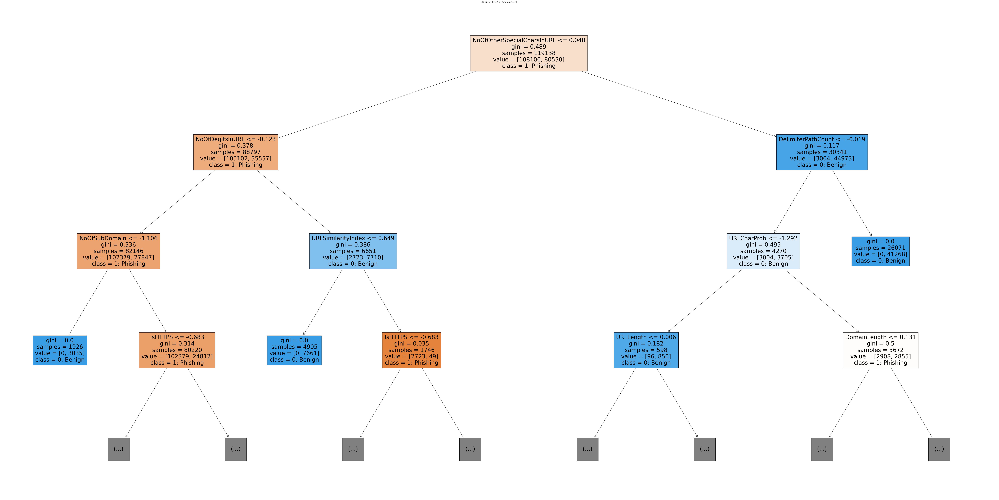

In [447]:
plt.figure(figsize=(100, 50)) 
plot_tree(estimators[0], filled=True, feature_names=feature_names, class_names=class_names, max_depth=3)
plt.title("Decision Tree 1 in RandomForest")
plt.show()

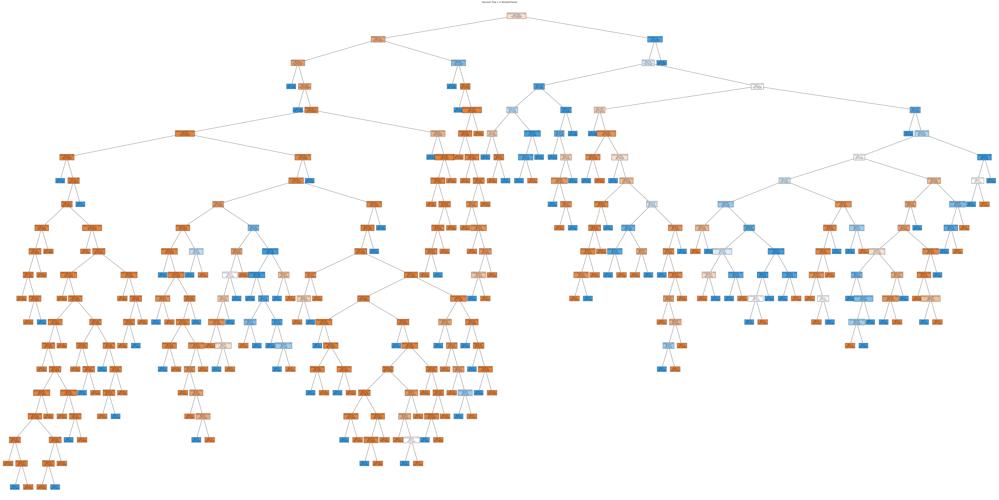

In [449]:
plt.figure(figsize=(100, 50))  # Set the figure size
plot_tree(estimators[0], filled=True, feature_names=feature_names, class_names=class_names, fontsize=5)
plt.title("Decision Tree 1 in RandomForest")
plt.show()

In [450]:
# Choosing which sample to use. Chose 46393.
x_test_phi.head()

,URLLength,DomainLength,IsDomainIP,TLD,URLSimilarityIndex,CharContinuationRate,TLDLegitimateProb,URLCharProb,TLDLength,NoOfSubDomain,...,NoOfAmpersandInURL,NoOfOtherSpecialCharsInURL,SpacialCharRatioInURL,IsHTTPS,TokenCount,DotCount,DelimiterDomainCount,DelimiterPathCount,LongestPathToken,DigitQueryCount
136221,24,17,0,th,100.000000,0.800000,0.000510,0.064490,2,2,...,0,2,0.083,1,5,3,3,0,-1,-1
56609,59,28,0,com,33.522664,1.000000,0.522907,0.060027,3,0,...,0,5,0.085,1,6,2,1,4,13,-1
46393,385,27,0,tc,3.199329,0.458333,0.000046,0.034325,2,3,...,0,24,0.062,1,8,4,4,20,347,-1
129746,19,6,0,to,53.846154,1.000000,0.000896,0.036850,2,0,...,0,2,0.105,0,4,1,1,1,5,-1
131464,35,28,0,au,100.000000,0.857143,0.010086,0.060894,2,2,...,0,2,0.057,1,5,3,3,0,-1,-1


In [455]:
#Finding what label the sample corresponds to. Sample 46393 is phishing.
y_test_phi.head()

136221    0
56609     1
46393     1
129746    1
131464    0
Name: label, dtype: int64

In [164]:
# Calculating SHAP values for each feature. Measures the importance of each feature in predicting whether a sample is phishing or benign.
explainer = shap.TreeExplainer(RF['randomforestclassifier'])
chosen_instance = RF['columntransformer'].transform(x_test_phi.loc[[46393]])
shap_values = explainer.shap_values(chosen_instance)

In [166]:
shap_values.shape

(1, 29, 2)

In [168]:
# Values correspond to [phishing, benign]
explainer.expected_value

array([0.57161814, 0.42838186])

In [465]:
# SHAP values for each feature.
for feature, shap_value in zip(x_test_phi.columns, shap_values[0,:,0]):
    print(f"{feature}: {shap_value:.4f}")

URLLength: -0.0001
DomainLength: -0.0132
IsDomainIP: -0.0025
TLD: 0.0000
URLSimilarityIndex: -0.2147
CharContinuationRate: -0.0095
TLDLegitimateProb: -0.0130
URLCharProb: -0.0096
TLDLength: 0.0009
NoOfSubDomain: 0.0006
HasObfuscation: 0.0000
NoOfObfuscatedChar: 0.0000
ObfuscationRatio: 0.0000
NoOfLettersInURL: -0.0130
LetterRatioInURL: -0.0380
NoOfDegitsInURL: -0.0412
DegitRatioInURL: -0.0127
NoOfEqualsInURL: 0.0000
NoOfQMarkInURL: 0.0000
NoOfAmpersandInURL: 0.0000
NoOfOtherSpecialCharsInURL: -0.0434
SpacialCharRatioInURL: -0.0061
IsHTTPS: 0.0240
TokenCount: -0.0102
DotCount: 0.0018
DelimiterDomainCount: 0.0019
DelimiterPathCount: -0.0942
LongestPathToken: -0.0793
DigitQueryCount: 0.0000


In [467]:
# Force plot of SHAP values for sample 46393.
shap.initjs()
shap.plots.force(explainer.expected_value[1], shap_values[0,:,1], x_test_phi.loc[[46393]], x_test_phi.columns)

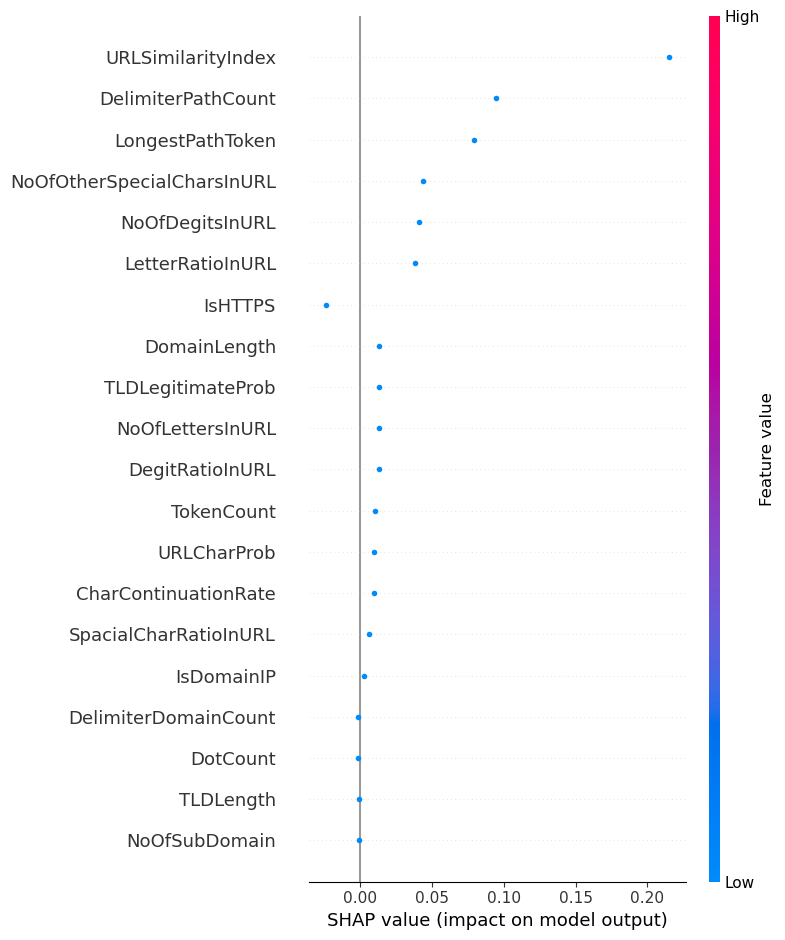

In [170]:
# Summary plot of SHAP values for sample 46393.
shap.summary_plot(shap_values[:,:,1], chosen_instance, x_test_phi.columns.tolist())

label
0    107815
1     80821
Name: count, dtype: int64

Results on entire training set:
RF Accuracy: 0.9944602276144273 ± 0.0002879779000972393
RF Precision: 0.9940547846895011 ± 0.0002519079391641853
RF Recall: 0.9930092288653121 ± 0.000665287792535247
RF F1: 0.9935315918119192 ± 0.00033805959847495117


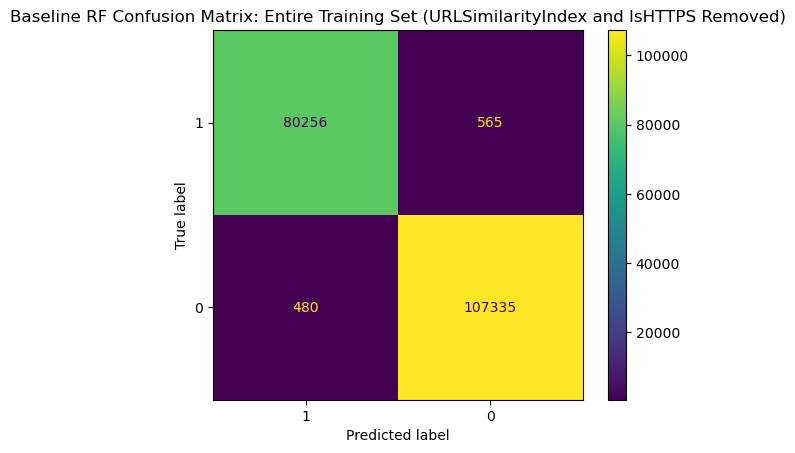

In [471]:
# Evaluation on entire training set (URLSimilarityIndex and IsHTTPS Removed)

print(y_train_phi.value_counts())

RF_rm_cv = cross_validate(RF_rm, x_train_phi_rm, y_train_phi, cv=strat, scoring=scoring, n_jobs=-1, error_score='raise')

RF_rm_cv_pred = cross_val_predict(RF_rm, x_train_phi_rm, y_train_phi, cv=strat, n_jobs=-1)

print("\nResults on entire training set:")
print(f"RF Accuracy: {RF_rm_cv['test_accuracy'].mean()} ± {RF_rm_cv['test_accuracy'].std()}")
print(f"RF Precision: {RF_rm_cv['test_precision'].mean()} ± {RF_rm_cv['test_precision'].std()}")
print(f"RF Recall: {RF_rm_cv['test_recall'].mean()} ± {RF_rm_cv['test_recall'].std()}")
print(f"RF F1: {RF_rm_cv['test_f1'].mean()} ± {RF_rm_cv['test_f1'].std()}")

RF_rm_cv_cm = ConfusionMatrixDisplay.from_predictions(y_train_phi, RF_rm_cv_pred, values_format='d', labels=[1, 0], display_labels=[1, 0])
_ = RF_rm_cv_cm.ax_.set(title="Baseline RF Confusion Matrix: Entire Training Set (URLSimilarityIndex and IsHTTPS Removed)")

label
0    107815
1     80821
Name: count, dtype: int64

Results on entire training set:
RF Accuracy: 0.9973493916373857 ± 0.00015993153104425003
RF Precision: 0.9979912325410603 ± 0.00018182694668349066
RF Recall: 0.9958179166175833 ± 0.0003447000019639177
RF F1: 0.996903348938582 ± 0.0001872288332201732


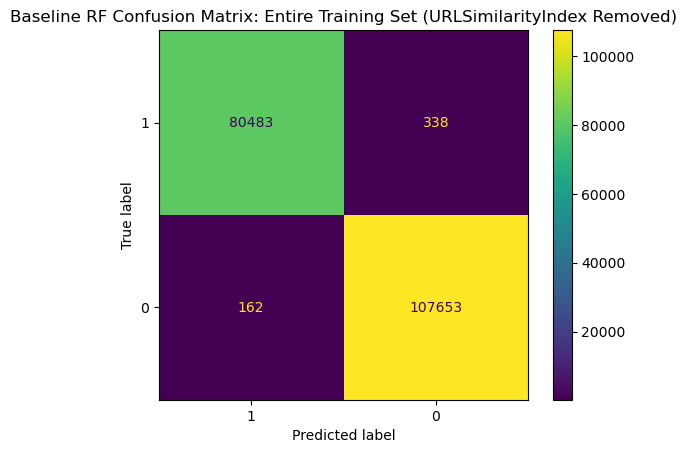

In [473]:
# Evaluation on entire training set (URLSimilarityIndex Removed)
# To provide meaninful results without the inflation of URLSimilarity Index.

print(y_train_phi.value_counts())

RF_rm_USI_cv = cross_validate(RF_rm_USI, x_train_phi_rm_USI, y_train_phi, cv=strat, scoring=scoring, n_jobs=-1, error_score='raise')

RF_rm_USI_cv_pred = cross_val_predict(RF_rm_USI, x_train_phi_rm_USI, y_train_phi, cv=strat, n_jobs=-1)

print("\nResults on entire training set:")
print(f"RF Accuracy: {RF_rm_USI_cv['test_accuracy'].mean()} ± {RF_rm_USI_cv['test_accuracy'].std()}")
print(f"RF Precision: {RF_rm_USI_cv['test_precision'].mean()} ± {RF_rm_USI_cv['test_precision'].std()}")
print(f"RF Recall: {RF_rm_USI_cv['test_recall'].mean()} ± {RF_rm_USI_cv['test_recall'].std()}")
print(f"RF F1: {RF_rm_USI_cv['test_f1'].mean()} ± {RF_rm_USI_cv['test_f1'].std()}")

RF_rm_USI_cv_cm = ConfusionMatrixDisplay.from_predictions(y_train_phi, RF_rm_USI_cv_pred, values_format='d', labels=[1, 0], display_labels=[1, 0])
_ = RF_rm_USI_cv_cm.ax_.set(title="Baseline RF Confusion Matrix: Entire Training Set (URLSimilarityIndex Removed)")

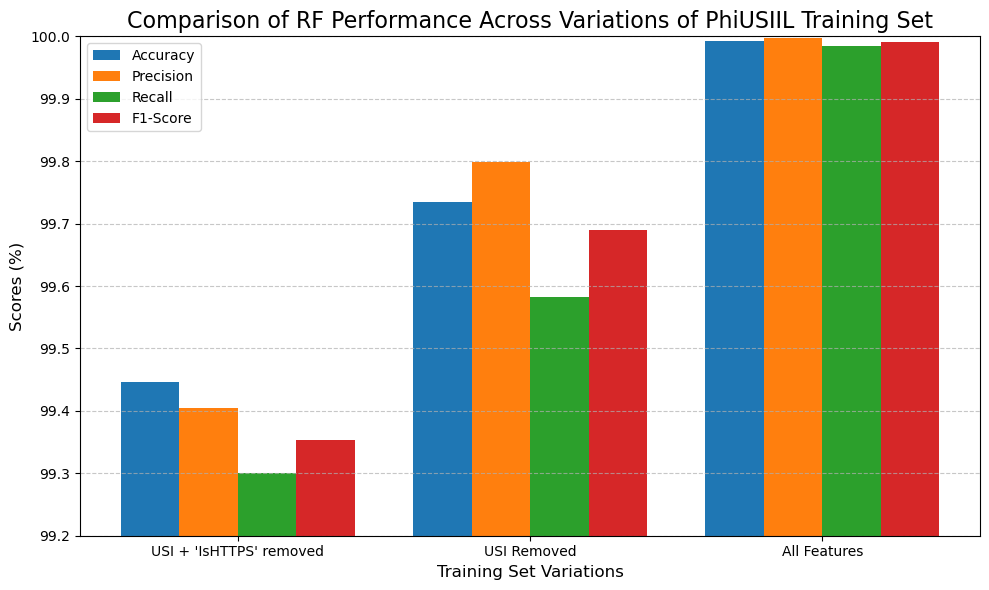

In [230]:
# Metrics for the models
models = ["USI + 'IsHTTPS' removed", 'USI Removed', 'All Features']
accuracy = [99.446, 99.735, 99.993]
precision = [99.405, 99.799, 99.998]
recall = [99.301, 99.582, 99.985]
f1_score = [99.353, 99.690, 99.991]

# Combine metrics into a single data structure
metrics = [accuracy, precision, recall, f1_score]
metric_names = ['Accuracy', 'Precision', 'Recall', 'F1-Score']

# Bar chart properties
x = np.arange(len(models))  # x positions for groups
width = 0.2  # Width of each bar

# Create the plot
fig, ax = plt.subplots(figsize=(10, 6))

# Plot each metric as a group of bars
for i, metric in enumerate(metrics):
    ax.bar(x + i * width, metric, width, label=metric_names[i])

# Formatting the chart
ax.set_title('Comparison of RF Performance Across Variations of PhiUSIIL Training Set', fontsize=16)
ax.set_xlabel('Training Set Variations', fontsize=12)
ax.set_ylabel('Scores (%)', fontsize=12)
ax.set_xticks(x + 1.5 * width)  # Center the group labels
ax.set_xticklabels(models, fontsize=10)
ax.legend(loc='upper left', fontsize=10)
ax.set_ylim(99.2, 100)  # Assuming metric scores are between 0 and 1

# Add gridlines for better readability
ax.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot
plt.tight_layout()
plt.show()

#### 3.1.2 Gaussian Naive Bayes

label
0    107815
1     80821
Name: count, dtype: int64

Results on entire training set:
GNB Accuracy: 0.9995865050021321 ± 9.571730864520993e-05
GNB Precision: 0.9992086591136081 ± 0.00021182136522544782
GNB Recall: 0.999826778612326 ± 7.214423766641956e-05
GNB F1: 0.9995176106924248 ± 0.00011161531275517082


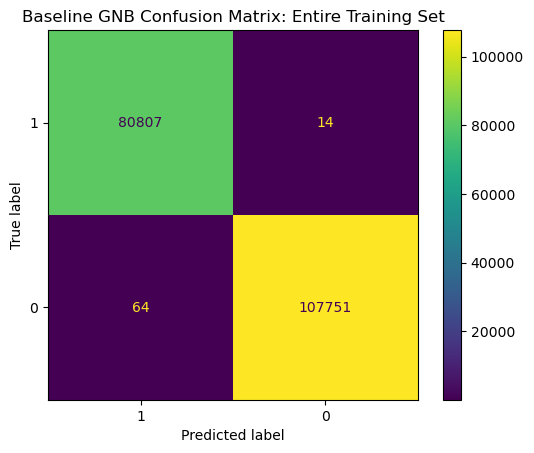

In [475]:
# Evaluation on entire training set.

print(y_train_phi.value_counts())

GNB_cv = cross_validate(GNB, x_train_phi, y_train_phi, cv=strat, scoring=scoring, n_jobs=-1, error_score='raise')

GNB_cv_pred = cross_val_predict(GNB, x_train_phi, y_train_phi, cv=strat, n_jobs=-1)

print("\nResults on entire training set:")
print(f"GNB Accuracy: {GNB_cv['test_accuracy'].mean()} ± {GNB_cv['test_accuracy'].std()}")
print(f"GNB Precision: {GNB_cv['test_precision'].mean()} ± {GNB_cv['test_precision'].std()}")
print(f"GNB Recall: {GNB_cv['test_recall'].mean()} ± {GNB_cv['test_recall'].std()}")
print(f"GNB F1: {GNB_cv['test_f1'].mean()} ± {GNB_cv['test_f1'].std()}")

GNB_cv_cm = ConfusionMatrixDisplay.from_predictions(y_train_phi, GNB_cv_pred, labels=[1, 0], display_labels=[1, 0])
_ = GNB_cv_cm.ax_.set(title="Baseline GNB Confusion Matrix: Entire Training Set")

label
0    107815
1     80821
Name: count, dtype: int64

Results on entire training set:
GNB Accuracy: 0.9926472177758552 ± 0.00042291457254175287
GNB Precision: 0.9988196340220823 ± 0.00026938445771597207
GNB Recall: 0.9840017021630973 ± 0.0010872591760643427
GNB F1: 0.9913549083903351 ± 0.0005021016624993679


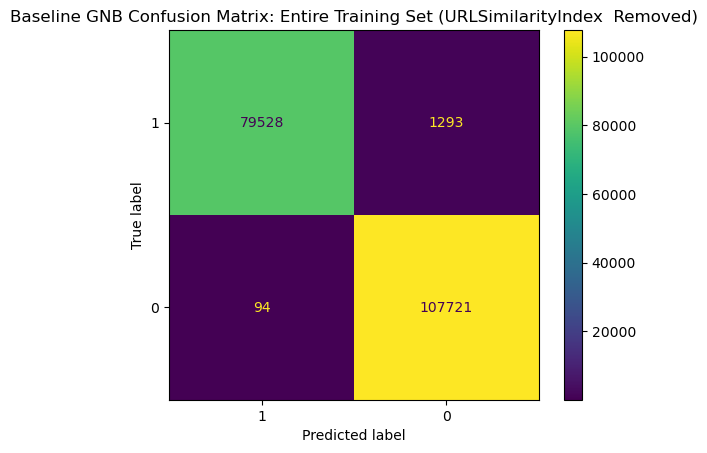

In [477]:
# Evaluation on entire training set (URLSimilarityIndex Removed)
# To provide meaninful results without the inflation of URLSimilarity Index.

print(y_train_phi.value_counts())

GNB_rm_USI_cv = cross_validate(GNB_rm_USI, x_train_phi_rm_USI, y_train_phi, cv=strat, scoring=scoring, n_jobs=-1, error_score='raise')

GNB_rm_USI_cv_pred = cross_val_predict(GNB_rm_USI, x_train_phi_rm_USI, y_train_phi, cv=strat, n_jobs=-1)

print("\nResults on entire training set:")
print(f"GNB Accuracy: {GNB_rm_USI_cv['test_accuracy'].mean()} ± {GNB_rm_USI_cv['test_accuracy'].std()}")
print(f"GNB Precision: {GNB_rm_USI_cv['test_precision'].mean()} ± {GNB_rm_USI_cv['test_precision'].std()}")
print(f"GNB Recall: {GNB_rm_USI_cv['test_recall'].mean()} ± {GNB_rm_USI_cv['test_recall'].std()}")
print(f"GNB F1: {GNB_rm_USI_cv['test_f1'].mean()} ± {GNB_rm_USI_cv['test_f1'].std()}")

GNB_rm_USI_cv_cm = ConfusionMatrixDisplay.from_predictions(y_train_phi, GNB_rm_USI_cv_pred, values_format='d', labels=[1, 0], display_labels=[1, 0])
_ = GNB_rm_USI_cv_cm.ax_.set(title="Baseline GNB Confusion Matrix: Entire Training Set (URLSimilarityIndex  Removed)")

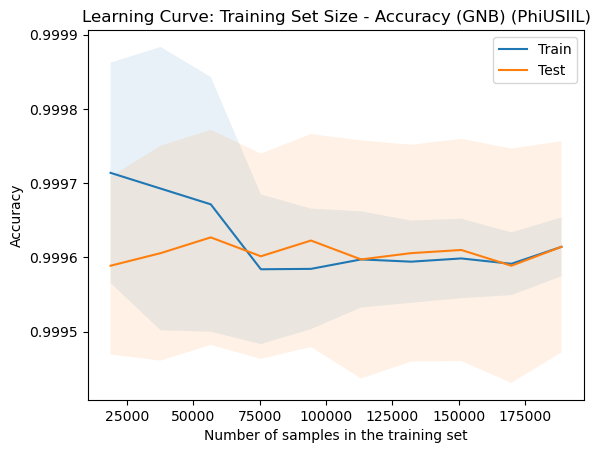

In [68]:
train_size = np.linspace(0.1, 1, 10)

learn_curve_log_loss = LearningCurveDisplay.from_estimator(
    GNB,
    PhiUSIIL_x,
    PhiUSIIL_y,
    train_sizes=train_size,
    score_type='both',
    score_name="Accuracy",
    fill_between_kw={"alpha": 0.1},
    n_jobs=-1
    )

_ = learn_curve_log_loss.ax_.set(title="Learning Curve: Training Set Size - Accuracy (GNB) (PhiUSIIL)")

#### 3.1.3 Support Vector Machine

label
0    107815
1     80821
Name: count, dtype: int64
SVM Accuracy: 0.9998462649324811 ± 4.2409207482441784e-05
SVM Precision: 1.0 ± 0.0
SVM Recall: 0.9996411832842655 ± 9.898138164486363e-05
SVM F1: 0.9998205569984533 ± 4.9506386152687676e-05


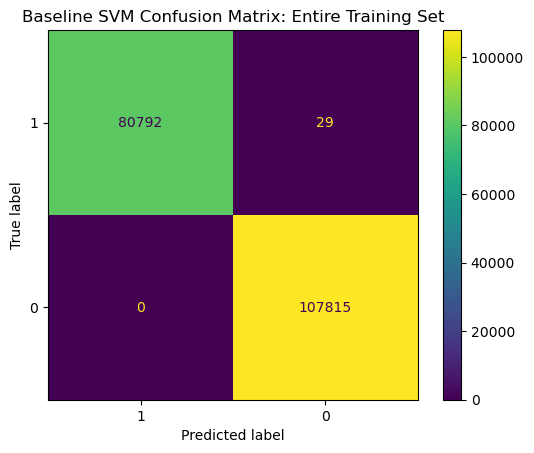

In [41]:
# Evaluation on entire training set.

print(y_train_phi.value_counts())

SVM_cv = cross_validate(SVM, x_train_phi, y_train_phi, cv=strat, scoring=scoring, n_jobs=-1, error_score='raise')

SVM_cv_pred = cross_val_predict(SVM, x_train_phi, y_train_phi, cv=strat, n_jobs=-1)

print(f"SVM Accuracy: {SVM_cv['test_accuracy'].mean()} ± {SVM_cv['test_accuracy'].std()}")
print(f"SVM Precision: {SVM_cv['test_precision'].mean()} ± {SVM_cv['test_precision'].std()}")
print(f"SVM Recall: {SVM_cv['test_recall'].mean()} ± {SVM_cv['test_recall'].std()}")
print(f"SVM F1: {SVM_cv['test_f1'].mean()} ± {SVM_cv['test_f1'].std()}")

SVM_cv_cm = ConfusionMatrixDisplay.from_predictions(y_train_phi, SVM_cv_pred, labels=[1, 0], display_labels=[1, 0])
_ = SVM_cv_cm.ax_.set(title="Baseline SVM Confusion Matrix: Entire Training Set")

label
0    107815
1     80821
Name: count, dtype: int64

Results on entire training set:
SVM Accuracy: 0.9978265019744882 ± 0.00016339339701847358
SVM Precision: 0.9998881253850535 ± 7.24567059764104e-05
SVM Recall: 0.9950384180767609 ± 0.0004221429189632364
SVM F1: 0.9974573211272716 ± 0.00019168871674426704


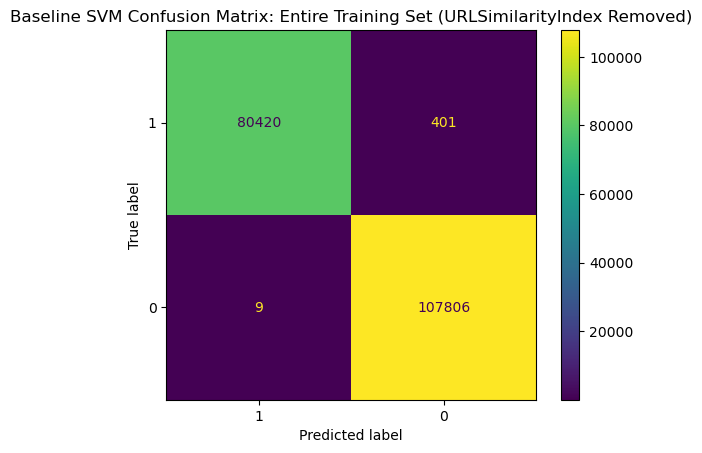

In [481]:
# Evaluation on entire training set (URLSimilarityIndex Removed)
# To provide meaninful results without the inflation of URLSimilarity Index.

print(y_train_phi.value_counts())

SVM_rm_USI_cv = cross_validate(SVM_rm_USI, x_train_phi_rm_USI, y_train_phi, cv=strat, scoring=scoring, n_jobs=-1, error_score='raise')

SVM_rm_USI_cv_pred = cross_val_predict(SVM_rm_USI, x_train_phi_rm_USI, y_train_phi, cv=strat, n_jobs=-1)

print("\nResults on entire training set:")
print(f"SVM Accuracy: {SVM_rm_USI_cv['test_accuracy'].mean()} ± {SVM_rm_USI_cv['test_accuracy'].std()}")
print(f"SVM Precision: {SVM_rm_USI_cv['test_precision'].mean()} ± {SVM_rm_USI_cv['test_precision'].std()}")
print(f"SVM Recall: {SVM_rm_USI_cv['test_recall'].mean()} ± {SVM_rm_USI_cv['test_recall'].std()}")
print(f"SVM F1: {SVM_rm_USI_cv['test_f1'].mean()} ± {SVM_rm_USI_cv['test_f1'].std()}")

SVM_rm_USI_cv_cm = ConfusionMatrixDisplay.from_predictions(y_train_phi, SVM_rm_USI_cv_pred, values_format='d', labels=[1, 0], display_labels=[1, 0])
_ = SVM_rm_USI_cv_cm.ax_.set(title="Baseline SVM Confusion Matrix: Entire Training Set (URLSimilarityIndex Removed)")

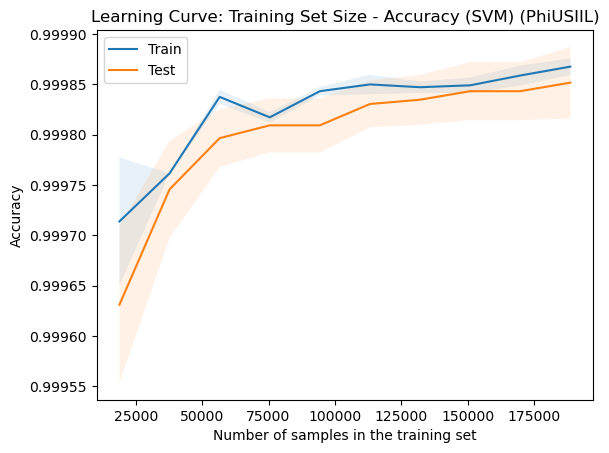

In [71]:
train_size = np.linspace(0.1, 1, 10)

learn_curve_log_loss = LearningCurveDisplay.from_estimator(
    SVM,
    PhiUSIIL_x,
    PhiUSIIL_y,
    train_sizes=train_size,
    score_type='both',
    score_name="Accuracy",
    fill_between_kw={"alpha": 0.1},
    n_jobs=-1
    )

_ = learn_curve_log_loss.ax_.set(title="Learning Curve: Training Set Size - Accuracy (SVM) (PhiUSIIL)")

### 3.2 Initial Evaluation - With Upsampling (PhiUSIIL)

#### 3.2.1 Random Forest


Results on entire training set:
RF + SMOTE Accuracy: 0.9999257831580675 ± 1.9834534287927584e-05
RF + SMOTE Precision: 0.9999752528845619 ± 3.0308902738657246e-05
RF + SMOTE Recall: 0.9998515241968094 ± 4.9490977792528384e-05
RF + SMOTE F1: 0.999913383564811 ± 2.3148193384297216e-05


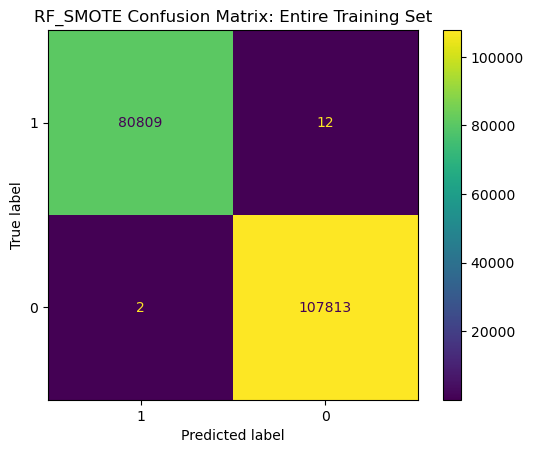

In [483]:
RF_SMOTE_cv = cross_validate(RF_SMOTE, x_train_phi, y_train_phi, cv=strat, scoring=scoring, n_jobs=-1, error_score='raise')

RF_SMOTE_cv_pred = cross_val_predict(RF_SMOTE, x_train_phi, y_train_phi, cv=strat, n_jobs=-1)

print("\nResults on entire training set:")
print(f"RF + SMOTE Accuracy: {RF_SMOTE_cv['test_accuracy'].mean()} ± {RF_SMOTE_cv['test_accuracy'].std()}")
print(f"RF + SMOTE Precision: {RF_SMOTE_cv['test_precision'].mean()} ± {RF_SMOTE_cv['test_precision'].std()}")
print(f"RF + SMOTE Recall: {RF_SMOTE_cv['test_recall'].mean()} ± {RF_SMOTE_cv['test_recall'].std()}")
print(f"RF + SMOTE F1: {RF_SMOTE_cv['test_f1'].mean()} ± {RF_SMOTE_cv['test_f1'].std()}")

RF_SMOTE_cv_cm = ConfusionMatrixDisplay.from_predictions(y_train_phi, RF_SMOTE_cv_pred, labels=[1, 0], display_labels=[1, 0])
_ = RF_SMOTE_cv_cm.ax_.set(title="RF_SMOTE Confusion Matrix: Entire Training Set")

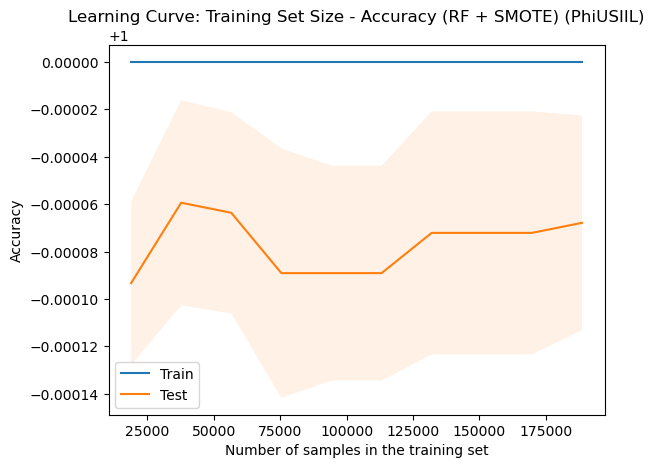

In [74]:
train_size = np.linspace(0.1, 1, 10)

learn_curve_log_loss = LearningCurveDisplay.from_estimator(
    RF_SMOTE,
    PhiUSIIL_x,
    PhiUSIIL_y,
    train_sizes=train_size,
    score_type='both',
    score_name="Accuracy",
    fill_between_kw={"alpha": 0.1},
    n_jobs=-1
    )

_ = learn_curve_log_loss.ax_.set(title="Learning Curve: Training Set Size - Accuracy (RF + SMOTE) (PhiUSIIL)")

#### 3.2.2 Gaussian Naive Bayes


Results on entire training set:
GNB + SMOTE Accuracy: 0.9995599989269367 ± 9.860972909255712e-05
GNB + SMOTE Precision: 0.999146892630721 ± 0.000225745079979977
GNB + SMOTE Recall: 0.999826778612326 ± 7.214423766641956e-05
GNB + SMOTE F1: 0.9994867051038844 ± 0.0001149785209729566


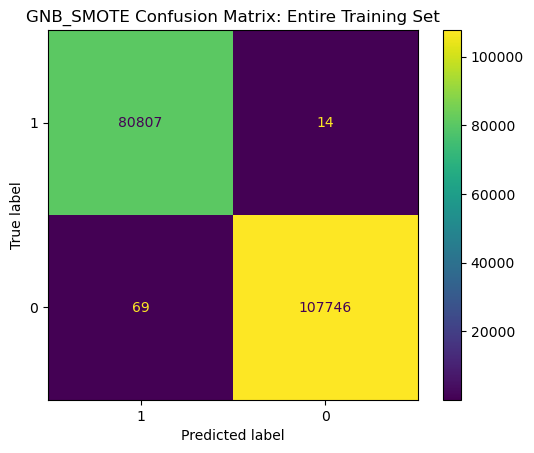

In [491]:
GNB_SMOTE_cv = cross_validate(GNB_SMOTE, x_train_phi, y_train_phi, cv=strat, scoring=scoring, n_jobs=-1, error_score='raise')

GNB_SMOTE_cv_pred = cross_val_predict(GNB_SMOTE, x_train_phi, y_train_phi, cv=strat, n_jobs=-1)

print("\nResults on entire training set:")
print(f"GNB + SMOTE Accuracy: {GNB_SMOTE_cv['test_accuracy'].mean()} ± {GNB_SMOTE_cv['test_accuracy'].std()}")
print(f"GNB + SMOTE Precision: {GNB_SMOTE_cv['test_precision'].mean()} ± {GNB_SMOTE_cv['test_precision'].std()}")
print(f"GNB + SMOTE Recall: {GNB_SMOTE_cv['test_recall'].mean()} ± {GNB_SMOTE_cv['test_recall'].std()}")
print(f"GNB + SMOTE F1: {GNB_SMOTE_cv['test_f1'].mean()} ± {GNB_SMOTE_cv['test_f1'].std()}")

GNB_SMOTE_cv_cm = ConfusionMatrixDisplay.from_predictions(y_train_phi, GNB_SMOTE_cv_pred, labels=[1, 0], display_labels=[1, 0])
_ = GNB_SMOTE_cv_cm.ax_.set(title="GNB_SMOTE Confusion Matrix: Entire Training Set")

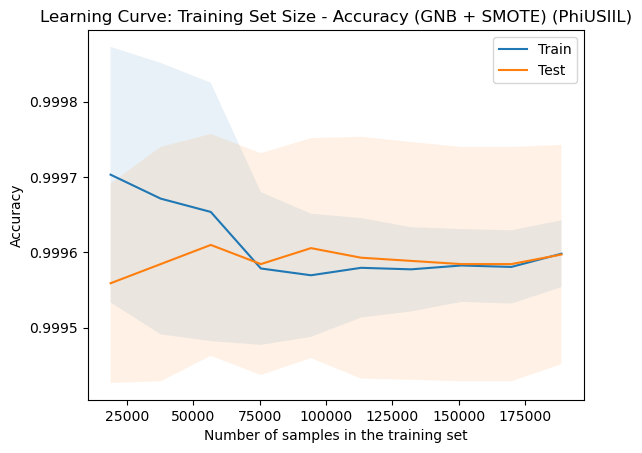

In [76]:
train_size = np.linspace(0.1, 1, 10)

learn_curve_log_loss = LearningCurveDisplay.from_estimator(
    GNB_SMOTE,
    PhiUSIIL_x,
    PhiUSIIL_y,
    train_sizes=train_size,
    score_type='both',
    score_name="Accuracy",
    fill_between_kw={"alpha": 0.1},
    n_jobs=-1
    )

_ = learn_curve_log_loss.ax_.set(title="Learning Curve: Training Set Size - Accuracy (GNB + SMOTE) (PhiUSIIL)")

#### 3.2.3 Support Vector Machine


Results on entire training set:
SVM + SMOTE Accuracy: 0.9998674697645351 ± 3.748485363138286e-05
SVM + SMOTE Precision: 1.0 ± 0.0
SVM + SMOTE Recall: 0.9996906752186623 ± 8.748831214454209e-05
SVM + SMOTE F1: 0.9998453117707365 ± 4.375769068611196e-05


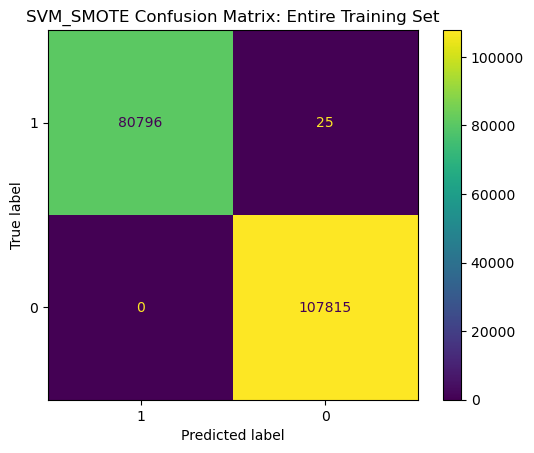

In [494]:
SVM_SMOTE_cv = cross_validate(SVM_SMOTE, x_train_phi, y_train_phi, cv=strat, scoring=scoring, n_jobs=-1, error_score='raise')

SVM_SMOTE_cv_pred = cross_val_predict(SVM_SMOTE, x_train_phi, y_train_phi, cv=strat, n_jobs=-1)

print("\nResults on entire training set:")
print(f"SVM + SMOTE Accuracy: {SVM_SMOTE_cv['test_accuracy'].mean()} ± {SVM_SMOTE_cv['test_accuracy'].std()}")
print(f"SVM + SMOTE Precision: {SVM_SMOTE_cv['test_precision'].mean()} ± {SVM_SMOTE_cv['test_precision'].std()}")
print(f"SVM + SMOTE Recall: {SVM_SMOTE_cv['test_recall'].mean()} ± {SVM_SMOTE_cv['test_recall'].std()}")
print(f"SVM + SMOTE F1: {SVM_SMOTE_cv['test_f1'].mean()} ± {SVM_SMOTE_cv['test_f1'].std()}")

SVM_SMOTE_cv_cm = ConfusionMatrixDisplay.from_predictions(y_train_phi, SVM_SMOTE_cv_pred, labels=[1, 0], display_labels=[1, 0])
_ = SVM_SMOTE_cv_cm.ax_.set(title="SVM_SMOTE Confusion Matrix: Entire Training Set")

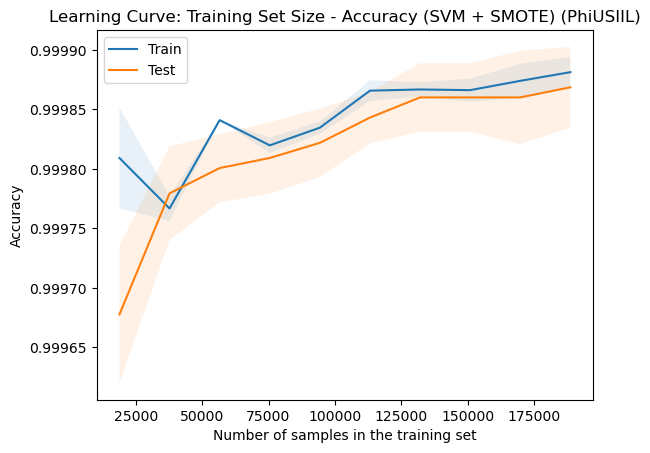

In [78]:
train_size = np.linspace(0.1, 1, 10)

learn_curve_log_loss = LearningCurveDisplay.from_estimator(
    SVM_SMOTE,
    PhiUSIIL_x,
    PhiUSIIL_y,
    train_sizes=train_size,
    score_type='both',
    score_name="Accuracy",
    fill_between_kw={"alpha": 0.1},
    n_jobs=-1
    )

_ = learn_curve_log_loss.ax_.set(title="Learning Curve: Training Set Size - Accuracy (SVM + SMOTE) (PhiUSIIL)")

## 4. Initial Evaluation (Dataset 2 - ISCXURL-2016)

In [342]:
RF_ISCX = make_pipeline(StandardScaler(), RandomForestClassifier(random_state=42, n_jobs=-1))
GNB_ISCX = make_pipeline(StandardScaler(), GaussianNB())
SVM_ISCX = make_pipeline(StandardScaler(), SVC(random_state=42))

RF_SMOTE_ISCX = ImbPipeline(steps=[
    ('standard scaler', StandardScaler()),
    ('smote', SMOTE(random_state=42)),
    ('classifier', RandomForestClassifier(random_state=42))
])

GNB_SMOTE_ISCX = ImbPipeline(steps=[
    ('standard scaler', StandardScaler()),
    ('smote', SMOTE(random_state=42)),
    ('classifier', GaussianNB())
])

SVM_SMOTE_ISCX = ImbPipeline(steps=[
    ('standard scaler', StandardScaler()),
    ('smote', SMOTE(random_state=42)),
    ('classifier', SVC(random_state=42))
])

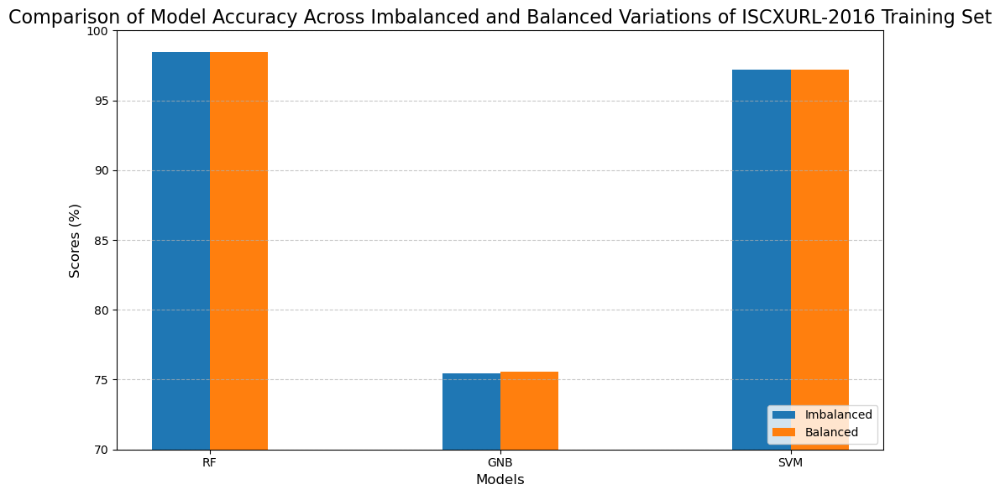

In [232]:
# Metrics for the models
models = ["RF", 'GNB', 'SVM']
imbalanced = [98.446, 75.433, 97.210]
balanced = [98.430, 75.572, 97.218]

# Combine metrics into a single data structure
metrics = [imbalanced, balanced]
metric_names = ['Imbalanced', 'Balanced']

# Bar chart properties
x = np.arange(len(models))  # x positions for groups
width = 0.2  # Width of each bar

# Create the plot
fig, ax = plt.subplots(figsize=(10, 6))

# Plot each metric as a group of bars
for i, metric in enumerate(metrics):
    ax.bar(x + i * width, metric, width, label=metric_names[i])

# Formatting the chart
ax.set_title('Comparison of Model Accuracy Across Imbalanced and Balanced Variations of ISCXURL-2016 Training Set', fontsize=16)
ax.set_xlabel('Models', fontsize=12)
ax.set_ylabel('Scores (%)', fontsize=12)
ax.set_xticks(x + width/2)  # Center the group labels
ax.set_xticklabels(models, fontsize=10)
ax.legend(loc='lower right', fontsize=10)
ax.set_ylim(70, 100)  # Assuming metric scores are between 0 and 1

# Add gridlines for better readability
ax.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot
plt.tight_layout()
plt.show()

### 4.1 Initial Evaluation - No Upsampling (ISCXURL-2016)

#### 4.1.1 Random Forest

URL_Type_obf_Type
0    6222
1    6071
Name: count, dtype: int64

Results on entire training set:
RF Accuracy: 0.9844627811486738 ± 0.0025771917351721544
RF Precision: 0.9883874595479641 ± 0.003936035039835312
RF Recall: 0.9800691520735454 ± 0.0029194734561288926
RF F1: 0.9842054266608585 ± 0.002603058077359124


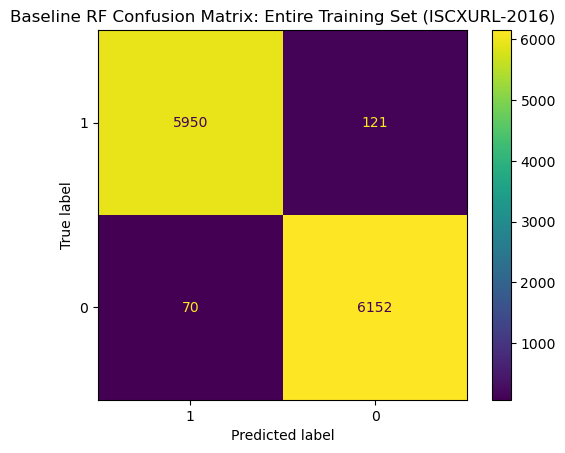

In [498]:
# Evaluation on entire training set.

print(y_train_ISCX.value_counts())

RF_ISCX_cv = cross_validate(RF_ISCX, x_train_ISCX, y_train_ISCX, cv=StratifiedKFold(), scoring=scoring, n_jobs=-1, error_score='raise')

RF_ISCX_cv_pred = cross_val_predict(RF_ISCX, x_train_ISCX, y_train_ISCX, cv=StratifiedKFold(), n_jobs=-1)

print("\nResults on entire training set:")
print(f"RF Accuracy: {RF_ISCX_cv['test_accuracy'].mean()} ± {RF_ISCX_cv['test_accuracy'].std()}")
print(f"RF Precision: {RF_ISCX_cv['test_precision'].mean()} ± {RF_ISCX_cv['test_precision'].std()}")
print(f"RF Recall: {RF_ISCX_cv['test_recall'].mean()} ± {RF_ISCX_cv['test_recall'].std()}")
print(f"RF F1: {RF_ISCX_cv['test_f1'].mean()} ± {RF_ISCX_cv['test_f1'].std()}")

RF_ISCX_cv_cm = ConfusionMatrixDisplay.from_predictions(y_train_ISCX, RF_ISCX_cv_pred, labels=[1, 0], display_labels=[1, 0])
_ = RF_ISCX_cv_cm.ax_.set(title="Baseline RF Confusion Matrix: Entire Training Set (ISCXURL-2016)")

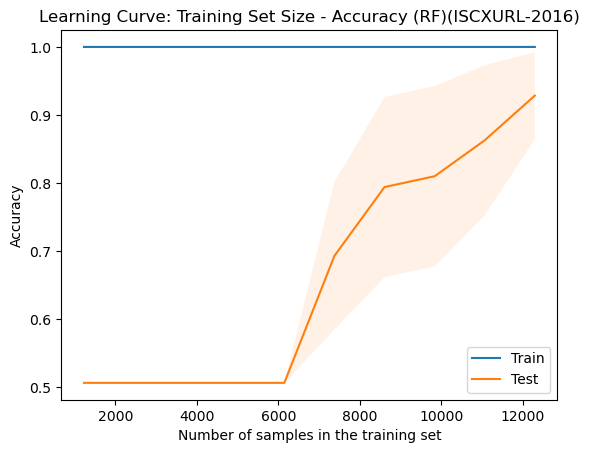

In [143]:
train_size = np.linspace(0.1, 1, 10)

learn_curve_log_loss = LearningCurveDisplay.from_estimator(
    RF_ISCX,
    ISCXURL_x,
    ISCXURL_y,
    train_sizes=train_size,
    score_type='both',
    score_name="Accuracy",
    fill_between_kw={"alpha": 0.1},
    n_jobs=-1
    )

_ = learn_curve_log_loss.ax_.set(title="Learning Curve: Training Set Size - Accuracy (RF) (ISCXURL-2016)")

#### 4.1.2 Gaussian Naive Bayes

URL_Type_obf_Type
0    6222
1    6071
Name: count, dtype: int64
GNB Accuracy: 0.7543328818828957 ± 0.01982625520989689
GNB Precision: 0.9745937218839144 ± 0.005279279591707823
GNB Recall: 0.515895756638938 ± 0.039516222811944154
GNB F1: 0.6738565619533776 ± 0.033631283522614554


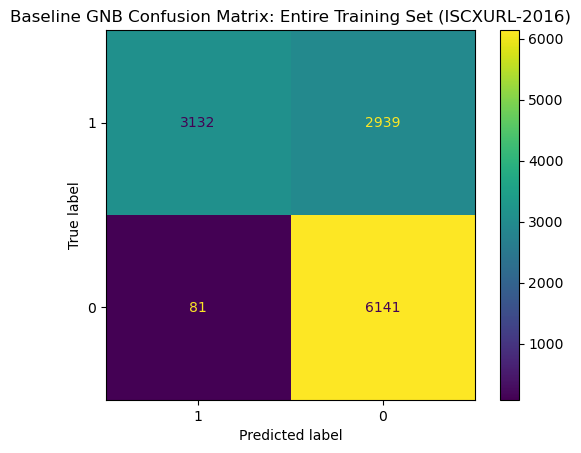

In [500]:
# Evaluation on entire training set.
# Good at identifying benign samples.

print(y_train_ISCX.value_counts())

GNB_ISCX_cv = cross_validate(GNB_ISCX, x_train_ISCX, y_train_ISCX, cv=StratifiedKFold(), scoring=scoring, n_jobs=-1, error_score='raise')

GNB_ISCX_cv_pred = cross_val_predict(GNB_ISCX, x_train_ISCX, y_train_ISCX, cv=StratifiedKFold(), n_jobs=-1)

print(f"GNB Accuracy: {GNB_ISCX_cv['test_accuracy'].mean()} ± {GNB_ISCX_cv['test_accuracy'].std()}")
print(f"GNB Precision: {GNB_ISCX_cv['test_precision'].mean()} ± {GNB_ISCX_cv['test_precision'].std()}")
print(f"GNB Recall: {GNB_ISCX_cv['test_recall'].mean()} ± {GNB_ISCX_cv['test_recall'].std()}")
print(f"GNB F1: {GNB_ISCX_cv['test_f1'].mean()} ± {GNB_ISCX_cv['test_f1'].std()}")

GNB_ISCX_cv_cm = ConfusionMatrixDisplay.from_predictions(y_train_ISCX, GNB_ISCX_cv_pred, labels=[1, 0], display_labels=[1, 0])
_ = GNB_ISCX_cv_cm.ax_.set(title="Baseline GNB Confusion Matrix: Entire Training Set (ISCXURL-2016)")

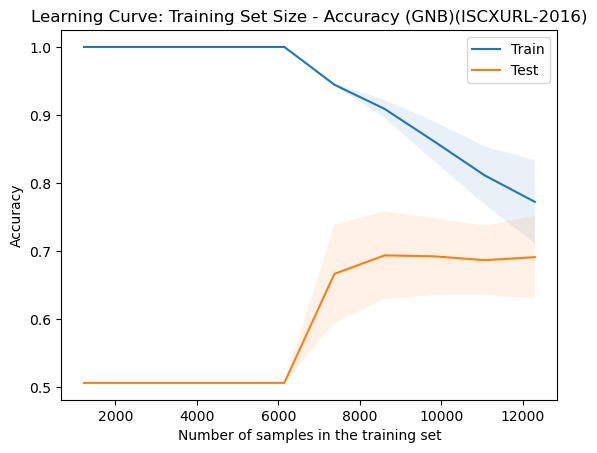

In [56]:
train_size = np.linspace(0.1, 1, 10)

learn_curve_log_loss = LearningCurveDisplay.from_estimator(
    GNB_ISCX,
    ISCXURL_x,
    ISCXURL_y,
    train_sizes=train_size,
    score_type='both',
    score_name="Accuracy",
    fill_between_kw={"alpha": 0.1},
    n_jobs=-1
    )

_ = learn_curve_log_loss.ax_.set(title="Learning Curve: Training Set Size - Accuracy (GNB) (ISCXURL-2016)")

#### 4.1.3 Support Vector Machine

URL_Type_obf_Type
0    6222
1    6071
Name: count, dtype: int64
SVM Accuracy: 0.9720983445015751 ± 0.005614799206423904
SVM Precision: 0.9779882781613587 ± 0.005792624472866676
SVM Recall: 0.9652447102053546 ± 0.0078728670146743
SVM F1: 0.9715591836239001 ± 0.005735905585330828


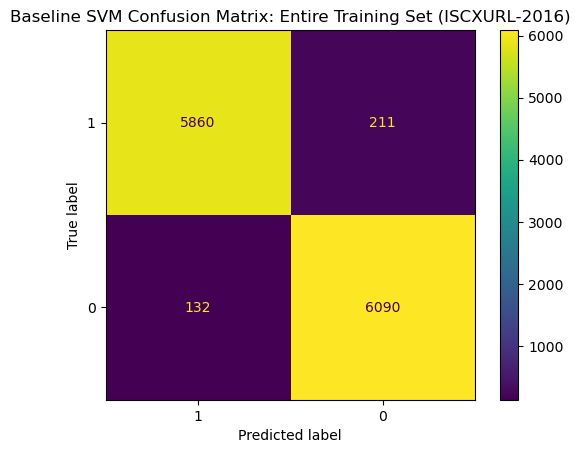

In [502]:
# Evaluation on entire training set.

print(y_train_ISCX.value_counts())

SVM_ISCX_cv = cross_validate(SVM_ISCX, x_train_ISCX, y_train_ISCX, cv=StratifiedKFold(), scoring=scoring, n_jobs=-1, error_score='raise')

SVM_ISCX_cv_pred = cross_val_predict(SVM_ISCX, x_train_ISCX, y_train_ISCX, cv=StratifiedKFold(), n_jobs=-1)

print(f"SVM Accuracy: {SVM_ISCX_cv['test_accuracy'].mean()} ± {SVM_ISCX_cv['test_accuracy'].std()}")
print(f"SVM Precision: {SVM_ISCX_cv['test_precision'].mean()} ± {SVM_ISCX_cv['test_precision'].std()}")
print(f"SVM Recall: {SVM_ISCX_cv['test_recall'].mean()} ± {SVM_ISCX_cv['test_recall'].std()}")
print(f"SVM F1: {SVM_ISCX_cv['test_f1'].mean()} ± {SVM_ISCX_cv['test_f1'].std()}")

SVM_ISCX_cv_cm = ConfusionMatrixDisplay.from_predictions(y_train_ISCX, SVM_ISCX_cv_pred, labels=[1, 0], display_labels=[1, 0])
_ = SVM_ISCX_cv_cm.ax_.set(title="Baseline SVM Confusion Matrix: Entire Training Set (ISCXURL-2016)")

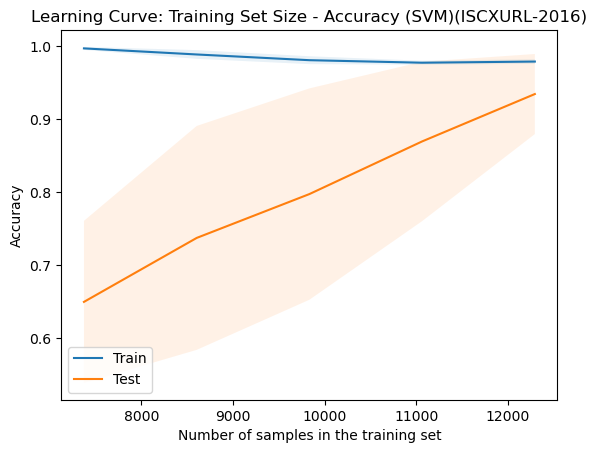

In [60]:
train_size = np.linspace(0.1, 1, 10)

learn_curve_log_loss = LearningCurveDisplay.from_estimator(
    SVM_ISCX,
    ISCXURL_x,
    ISCXURL_y,
    train_sizes=train_size,
    score_type='both',
    score_name="Accuracy",
    fill_between_kw={"alpha": 0.1},
    n_jobs=-1
    )

_ = learn_curve_log_loss.ax_.set(title="Learning Curve: Training Set Size - Accuracy (SVM) (ISCXURL-2016)")

### 4.2 Initial Evaluation - With Upsampling (ISCXURL-2016)

#### 4.2.1 Random Forest


Results on entire training set:
RF + SMOTE Accuracy: 0.9842998486819312 ± 0.0031262921293069732
RF + SMOTE Precision: 0.9877244451531062 ± 0.0030957034476589936
RF + SMOTE Recall: 0.9803986413651431 ± 0.004371051606591285
RF + SMOTE F1: 0.9840435731063236 ± 0.003190431046662177


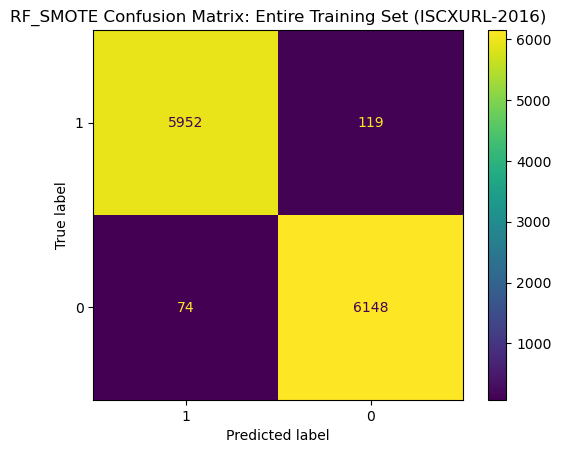

In [506]:
# Evaluation on entire training set.

RF_SMOTE_ISCX_cv = cross_validate(RF_SMOTE_ISCX, x_train_ISCX, y_train_ISCX, cv=StratifiedKFold(), scoring=scoring, n_jobs=-1, error_score='raise')

RF_SMOTE_ISCX_cv_pred = cross_val_predict(RF_SMOTE_ISCX, x_train_ISCX, y_train_ISCX, cv=StratifiedKFold(), n_jobs=-1)

print("\nResults on entire training set:")
print(f"RF + SMOTE Accuracy: {RF_SMOTE_ISCX_cv['test_accuracy'].mean()} ± {RF_SMOTE_ISCX_cv['test_accuracy'].std()}")
print(f"RF + SMOTE Precision: {RF_SMOTE_ISCX_cv['test_precision'].mean()} ± {RF_SMOTE_ISCX_cv['test_precision'].std()}")
print(f"RF + SMOTE Recall: {RF_SMOTE_ISCX_cv['test_recall'].mean()} ± {RF_SMOTE_ISCX_cv['test_recall'].std()}")
print(f"RF + SMOTE F1: {RF_SMOTE_ISCX_cv['test_f1'].mean()} ± {RF_SMOTE_ISCX_cv['test_f1'].std()}")

RF_SMOTE_ISCX_cv_cm = ConfusionMatrixDisplay.from_predictions(y_train_ISCX, RF_SMOTE_ISCX_cv_pred, labels=[1, 0], display_labels=[1, 0])
_ = RF_SMOTE_ISCX_cv_cm.ax_.set(title="RF_SMOTE Confusion Matrix: Entire Training Set (ISCXURL-2016)")

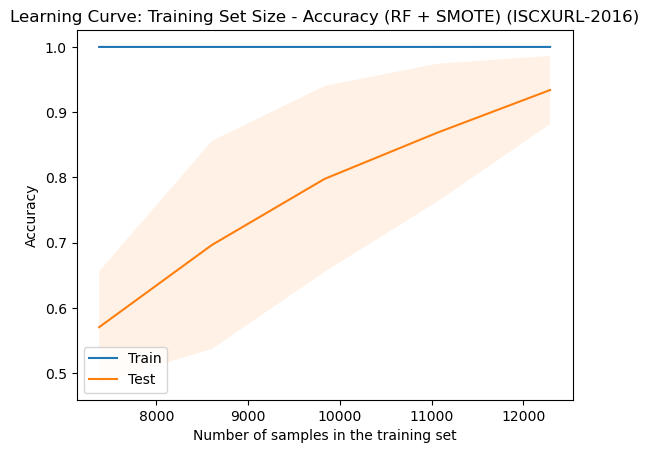

In [68]:
train_size = np.linspace(0.1, 1, 10)

learn_curve_log_loss = LearningCurveDisplay.from_estimator(
    RF_SMOTE_ISCX,
    ISCXURL_x,
    ISCXURL_y,
    train_sizes=train_size,
    score_type='both',
    score_name="Accuracy",
    fill_between_kw={"alpha": 0.1},
    n_jobs=-1
    )

_ = learn_curve_log_loss.ax_.set(title="Learning Curve: Training Set Size - Accuracy (RF + SMOTE) (ISCXURL-2016)")

#### 4.2.2 Gaussian Naive Bayes


Results on entire training set:
GNB + SMOTE Accuracy: 0.7557156239463078 ± 0.01959426901340137
GNB + SMOTE Precision: 0.9747207830240386 ± 0.005306664842310725
GNB + SMOTE Recall: 0.5186958732483169 ± 0.03896115599093486
GNB + SMOTE F1: 0.6763059310046454 ± 0.033172496173958246


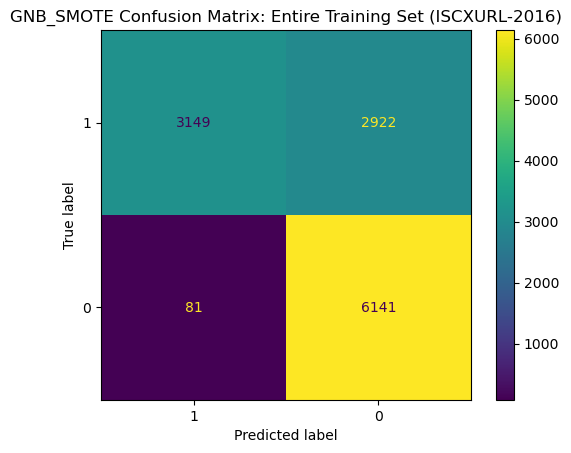

In [508]:
# Evaluation on entire training set.

GNB_SMOTE_ISCX_cv = cross_validate(GNB_SMOTE_ISCX, x_train_ISCX, y_train_ISCX, cv=StratifiedKFold(), scoring=scoring, n_jobs=-1, error_score='raise')

GNB_SMOTE_ISCX_cv_pred = cross_val_predict(GNB_SMOTE_ISCX, x_train_ISCX, y_train_ISCX, cv=StratifiedKFold(), n_jobs=-1)

print("\nResults on entire training set:")
print(f"GNB + SMOTE Accuracy: {GNB_SMOTE_ISCX_cv['test_accuracy'].mean()} ± {GNB_SMOTE_ISCX_cv['test_accuracy'].std()}")
print(f"GNB + SMOTE Precision: {GNB_SMOTE_ISCX_cv['test_precision'].mean()} ± {GNB_SMOTE_ISCX_cv['test_precision'].std()}")
print(f"GNB + SMOTE Recall: {GNB_SMOTE_ISCX_cv['test_recall'].mean()} ± {GNB_SMOTE_ISCX_cv['test_recall'].std()}")
print(f"GNB + SMOTE F1: {GNB_SMOTE_ISCX_cv['test_f1'].mean()} ± {GNB_SMOTE_ISCX_cv['test_f1'].std()}")

GNB_SMOTE_ISCX_cv_cm = ConfusionMatrixDisplay.from_predictions(y_train_ISCX, GNB_SMOTE_ISCX_cv_pred, labels=[1, 0], display_labels=[1, 0])
_ = GNB_SMOTE_ISCX_cv_cm.ax_.set(title="GNB_SMOTE Confusion Matrix: Entire Training Set (ISCXURL-2016)")

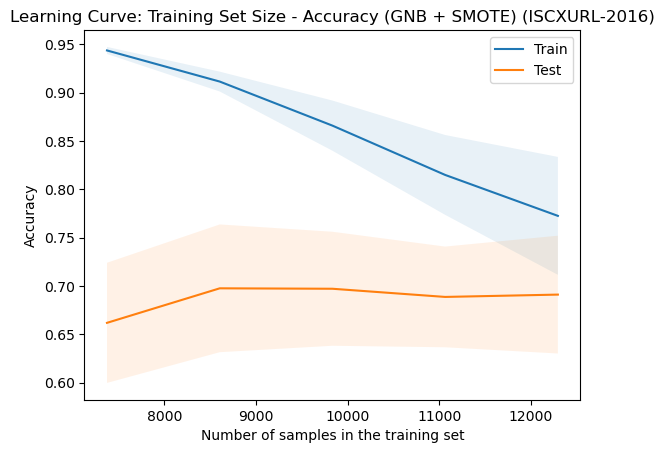

In [72]:
train_size = np.linspace(0.1, 1, 10)

learn_curve_log_loss = LearningCurveDisplay.from_estimator(
    GNB_SMOTE_ISCX,
    ISCXURL_x,
    ISCXURL_y,
    train_sizes=train_size,
    score_type='both',
    score_name="Accuracy",
    fill_between_kw={"alpha": 0.1},
    n_jobs=-1
    )

_ = learn_curve_log_loss.ax_.set(title="Learning Curve: Training Set Size - Accuracy (GNB + SMOTE) (ISCXURL-2016)")

#### 4.2.3 Support Vector Machine


Results on entire training set:
SVM + SMOTE Accuracy: 0.9721796783771344 ± 0.00532441632067761
SVM + SMOTE Precision: 0.977513030331146 ± 0.005628829408481548
SVM + SMOTE Recall: 0.9659035531962494 ± 0.007248385066365116
SVM + SMOTE F1: 0.9716604644459685 ± 0.005432789560866656


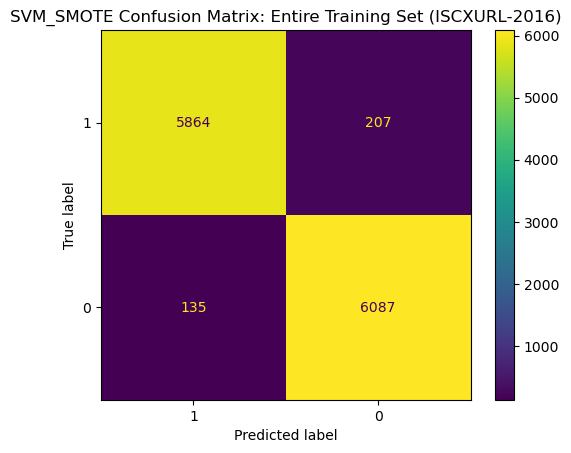

In [510]:
# Evaluation on entire training set.

SVM_SMOTE_ISCX_cv = cross_validate(SVM_SMOTE_ISCX, x_train_ISCX, y_train_ISCX, cv=StratifiedKFold(), scoring=scoring, n_jobs=-1, error_score='raise')

SVM_SMOTE_ISCX_cv_pred = cross_val_predict(SVM_SMOTE_ISCX, x_train_ISCX, y_train_ISCX, cv=StratifiedKFold(), n_jobs=-1)

print("\nResults on entire training set:")
print(f"SVM + SMOTE Accuracy: {SVM_SMOTE_ISCX_cv['test_accuracy'].mean()} ± {SVM_SMOTE_ISCX_cv['test_accuracy'].std()}")
print(f"SVM + SMOTE Precision: {SVM_SMOTE_ISCX_cv['test_precision'].mean()} ± {SVM_SMOTE_ISCX_cv['test_precision'].std()}")
print(f"SVM + SMOTE Recall: {SVM_SMOTE_ISCX_cv['test_recall'].mean()} ± {SVM_SMOTE_ISCX_cv['test_recall'].std()}")
print(f"SVM + SMOTE F1: {SVM_SMOTE_ISCX_cv['test_f1'].mean()} ± {SVM_SMOTE_ISCX_cv['test_f1'].std()}")

SVM_SMOTE_ISCX_cv_cm = ConfusionMatrixDisplay.from_predictions(y_train_ISCX, SVM_SMOTE_ISCX_cv_pred, labels=[1, 0], display_labels=[1, 0])
_ = SVM_SMOTE_ISCX_cv_cm.ax_.set(title="SVM_SMOTE Confusion Matrix: Entire Training Set (ISCXURL-2016)")

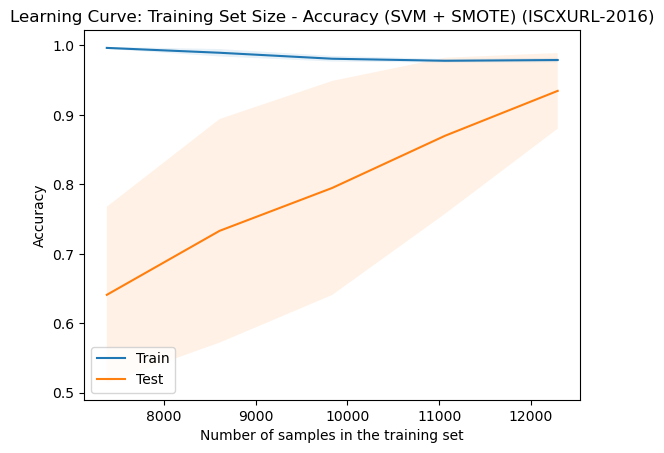

In [76]:
train_size = np.linspace(0.1, 1, 10)

learn_curve_log_loss = LearningCurveDisplay.from_estimator(
    SVM_SMOTE_ISCX,
    ISCXURL_x,
    ISCXURL_y,
    train_sizes=train_size,
    score_type='both',
    score_name="Accuracy",
    fill_between_kw={"alpha": 0.1},
    n_jobs=-1
    )

_ = learn_curve_log_loss.ax_.set(title="Learning Curve: Training Set Size - Accuracy (SVM + SMOTE) (ISCXURL-2016)")

## 5. Feature Selection (PhiUSIIL)

### 5.1 Mutual Information (MMI) (PhiUSIIL)

In [57]:
x_transformed = preprocessor.fit_transform(PhiUSIIL_x)

mmi_scores = mutual_info_classif(x_transformed, PhiUSIIL_y)

mmi_feature_importance = pd.DataFrame({'Feature': x_train_phi.columns, 'MMI Score': mmi_scores})
mmi_feature_importance = mmi_feature_importance.sort_values(by='MMI Score', ascending=False)

print(mmi_feature_importance)

                       Feature  MMI Score
4           URLSimilarityIndex   0.672150
14            LetterRatioInURL   0.380717
26          DelimiterPathCount   0.282845
27            LongestPathToken   0.281986
22                     IsHTTPS   0.241582
20  NoOfOtherSpecialCharsInURL   0.237773
21       SpacialCharRatioInURL   0.206014
0                    URLLength   0.189766
6            TLDLegitimateProb   0.187849
16             DegitRatioInURL   0.176795
15             NoOfDegitsInURL   0.171460
23                  TokenCount   0.168350
1                 DomainLength   0.167290
5         CharContinuationRate   0.162377
13            NoOfLettersInURL   0.151321
7                  URLCharProb   0.135084
25        DelimiterDomainCount   0.108013
2                   IsDomainIP   0.092288
24                    DotCount   0.075460
9                NoOfSubDomain   0.072802
18              NoOfQMarkInURL   0.025926
28             DigitQueryCount   0.025027
8                    TLDLength   0

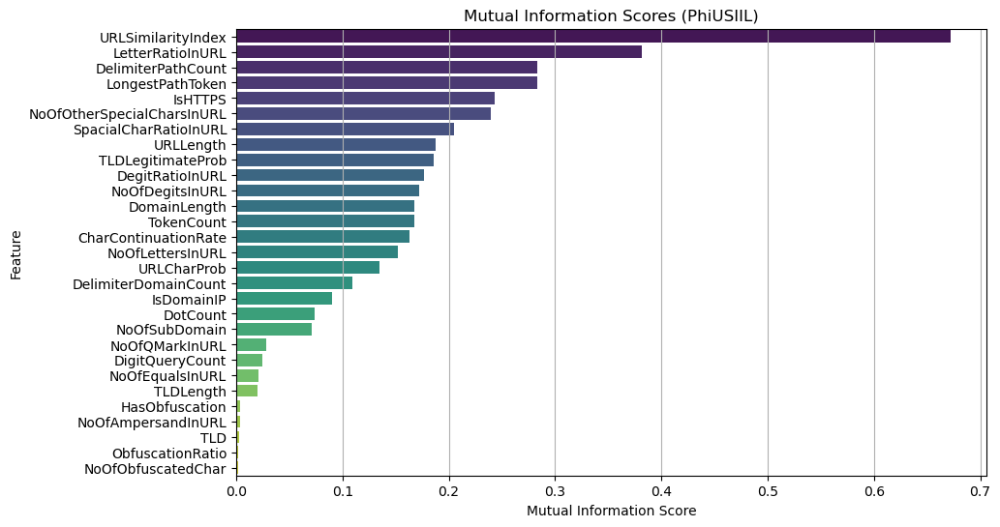

In [158]:
plt.figure(figsize=(10, 6))
sns.barplot(x='MMI Score', y='Feature', data=mmi_feature_importance, palette='viridis')
plt.title('Mutual Information Scores (PhiUSIIL)')
plt.xlabel('Mutual Information Score')
plt.ylabel('Feature')
plt.grid(axis='x')
plt.show()

### 5.2 Feature Distribution (PhiUSIIL)

C:\Users\hugha\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


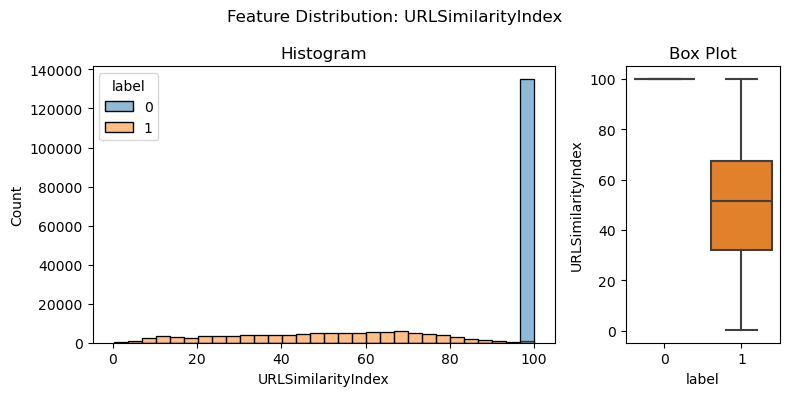

In [144]:
# The following are the feature distributions for all features with MMI > 0.2

fig, (ax_hist, ax_box) = plt.subplots(1, 2, sharey=False, gridspec_kw={"width_ratios": (3, 1)}, figsize=(8, 4))

sns.boxplot(x='label', y='URLSimilarityIndex', data=PhiUSIIL, ax=ax_box)
ax_box.set_title('Box Plot')

sns.histplot(data=PhiUSIIL, x='URLSimilarityIndex', hue='label', bins=30, ax=ax_hist)
ax_hist.set_title('Histogram')

fig.suptitle('Feature Distribution: URLSimilarityIndex')

plt.tight_layout()
plt.show()

C:\Users\hugha\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


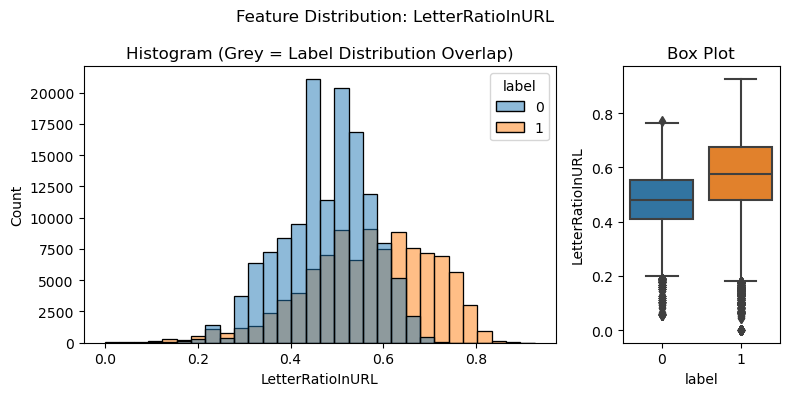

In [146]:
fig, (ax_hist, ax_box) = plt.subplots(1, 2, sharey=False, gridspec_kw={"width_ratios": (3, 1)}, figsize=(8, 4))

sns.boxplot(x='label', y='LetterRatioInURL', data=PhiUSIIL, ax=ax_box)
ax_box.set_title('Box Plot')

sns.histplot(data=PhiUSIIL, x='LetterRatioInURL', hue='label', bins=30, ax=ax_hist)
ax_hist.set_title('Histogram (Grey = Label Distribution Overlap)')

fig.suptitle('Feature Distribution: LetterRatioInURL')

plt.tight_layout()
plt.show()

C:\Users\hugha\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


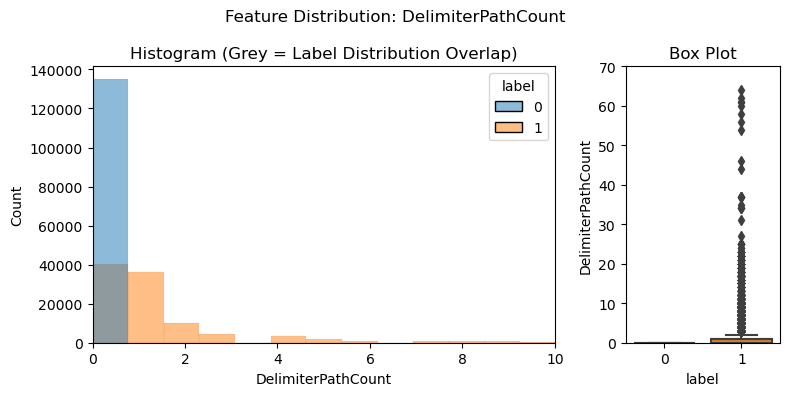

In [148]:
fig, (ax_hist, ax_box) = plt.subplots(1, 2, sharey=False, gridspec_kw={"width_ratios": (3, 1)}, figsize=(8, 4))

sns.boxplot(x='label', y='DelimiterPathCount', data=PhiUSIIL, ax=ax_box)
ax_box.set_ylim(0, 70)
ax_box.set_title('Box Plot')

sns.histplot(data=PhiUSIIL, x='DelimiterPathCount', hue='label', bins=1000, ax=ax_hist)
ax_hist.set_xlim(0, 10)
ax_hist.set_title('Histogram (Grey = Label Distribution Overlap)')

fig.suptitle('Feature Distribution: DelimiterPathCount')

plt.tight_layout()
plt.show()

C:\Users\hugha\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


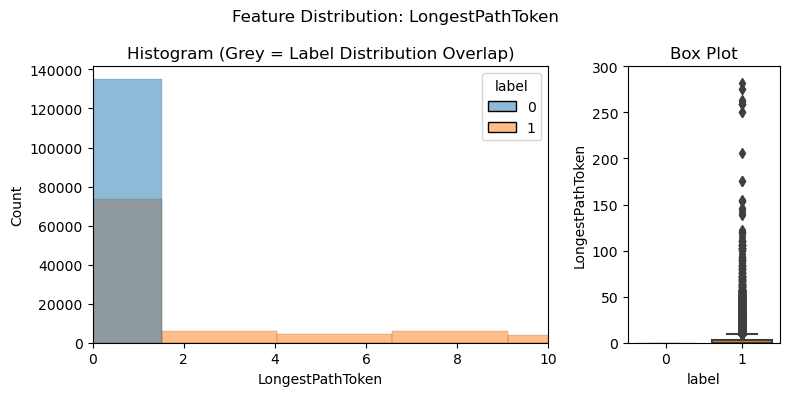

In [149]:
fig, (ax_hist, ax_box) = plt.subplots(1, 2, sharey=False, gridspec_kw={"width_ratios": (3, 1)}, figsize=(8, 4))

sns.boxplot(x='label', y='LongestPathToken', data=PhiUSIIL, ax=ax_box)
ax_box.set_ylim(0, 300)
ax_box.set_title('Box Plot')

sns.histplot(data=PhiUSIIL, x='LongestPathToken', hue='label', bins=300, ax=ax_hist)
ax_hist.set_xlim(0, 10)
ax_hist.set_title('Histogram (Grey = Label Distribution Overlap)')

fig.suptitle('Feature Distribution: LongestPathToken')

plt.tight_layout()
plt.show()

C:\Users\hugha\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


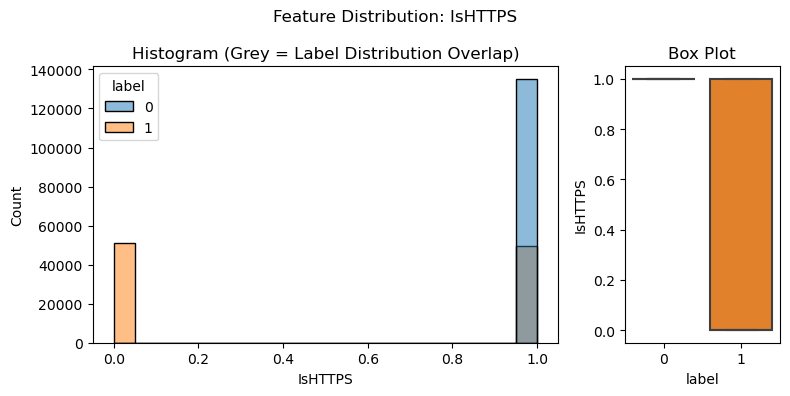

In [150]:
fig, (ax_hist, ax_box) = plt.subplots(1, 2, sharey=False, gridspec_kw={"width_ratios": (3, 1)}, figsize=(8, 4))

sns.boxplot(x='label', y='IsHTTPS', data=PhiUSIIL, ax=ax_box)
ax_box.set_title('Box Plot')

sns.histplot(data=PhiUSIIL, x='IsHTTPS', hue='label', bins=20, ax=ax_hist)
ax_hist.set_title('Histogram (Grey = Label Distribution Overlap)')

fig.suptitle('Feature Distribution: IsHTTPS')

plt.tight_layout()
plt.show()

C:\Users\hugha\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


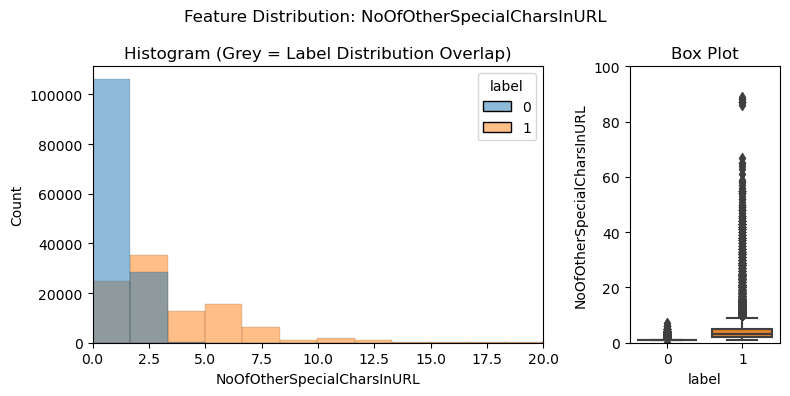

In [152]:
fig, (ax_hist, ax_box) = plt.subplots(1, 2, sharey=False, gridspec_kw={"width_ratios": (3, 1)}, figsize=(8, 4))

sns.boxplot(x='label', y='NoOfOtherSpecialCharsInURL', data=PhiUSIIL, ax=ax_box)
ax_box.set_ylim(0, 100)
ax_box.set_title('Box Plot')

sns.histplot(data=PhiUSIIL, x='NoOfOtherSpecialCharsInURL', hue='label', bins=300, ax=ax_hist)
ax_hist.set_xlim(0, 20)
ax_hist.set_title('Histogram (Grey = Label Distribution Overlap)')

fig.suptitle('Feature Distribution: NoOfOtherSpecialCharsInURL')

plt.tight_layout()
plt.show()

C:\Users\hugha\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


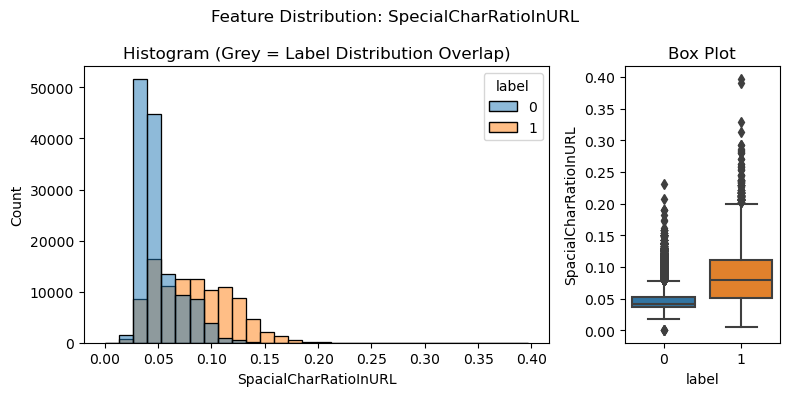

In [154]:
fig, (ax_hist, ax_box) = plt.subplots(1, 2, sharey=False, gridspec_kw={"width_ratios": (3, 1)}, figsize=(8, 4))

sns.boxplot(x='label', y='SpacialCharRatioInURL', data=PhiUSIIL, ax=ax_box)
# ax_box.set_ylim(0, 100)
ax_box.set_title('Box Plot')

sns.histplot(data=PhiUSIIL, x='SpacialCharRatioInURL', hue='label', bins=30, ax=ax_hist)
# ax_hist.set_xlim(0, 20)
ax_hist.set_title('Histogram (Grey = Label Distribution Overlap)')

fig.suptitle('Feature Distribution: SpecialCharRatioInURL')

plt.tight_layout()
plt.show()

### 5.3 RF - Gini Importance (MDI) (PhiUSIIL)

                       Feature  Gini Importance
4           URLSimilarityIndex         0.348596
22                     IsHTTPS         0.206498
26          DelimiterPathCount         0.108320
27            LongestPathToken         0.095714
20  NoOfOtherSpecialCharsInURL         0.066083
15             NoOfDegitsInURL         0.048823
14            LetterRatioInURL         0.015159
16             DegitRatioInURL         0.013759
21       SpacialCharRatioInURL         0.013232
1                 DomainLength         0.012255
5         CharContinuationRate         0.010459
13            NoOfLettersInURL         0.009590
9                NoOfSubDomain         0.009581
6            TLDLegitimateProb         0.009121
23                  TokenCount         0.008529
7                  URLCharProb         0.008256
24                    DotCount         0.004380
2                   IsDomainIP         0.004242
0                    URLLength         0.003273
25        DelimiterDomainCount         0

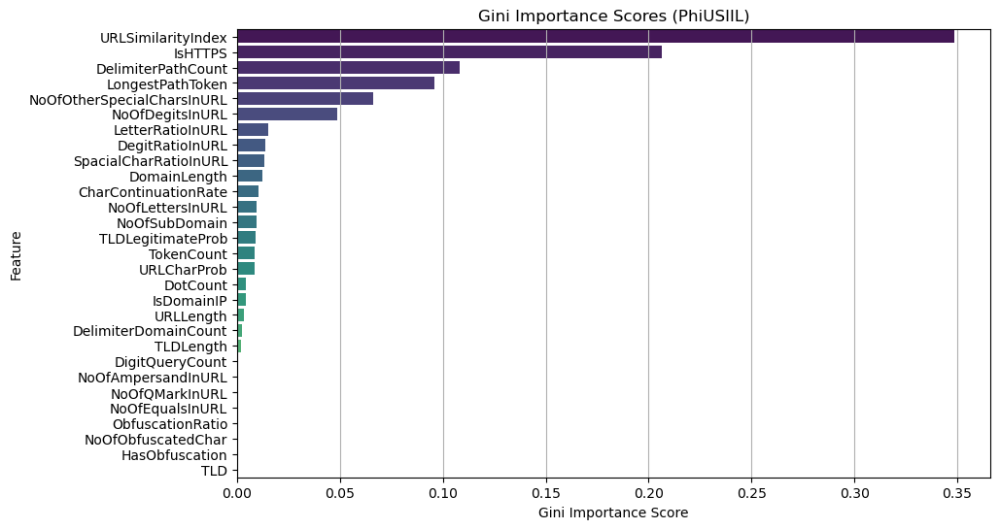

In [160]:

RF.fit(x_train_phi, y_train_phi)

gini_scores = RF.named_steps['randomforestclassifier'].feature_importances_

gini_importance = pd.DataFrame({'Feature': x_train_phi.columns, 'Gini Importance': gini_scores})
gini_importance = gini_importance.sort_values(by='Gini Importance', ascending=False)

print(gini_importance)

plt.figure(figsize=(10, 6))
sns.barplot(x='Gini Importance', y='Feature', data=gini_importance, palette='viridis')
plt.title('Gini Importance Scores (PhiUSIIL)')
plt.xlabel('Gini Importance Score')
plt.ylabel('Feature')
plt.grid(axis='x')
plt.show()

### 5.4 GNB - Sequential Feature Selection (SFS) (PhiUSIIL)

In [64]:
# SFS only selects the features which contributed most to improving accuracy.

GNB_SFS_phi = make_pipeline(preprocessor, SequentialFeatureSelector(GaussianNB(), direction='forward'), GaussianNB())

GNB_SFS_phi.fit(x_train_phi, y_train_phi)

GNB_phi_selected_features = GNB_SFS_phi.named_steps['sequentialfeatureselector'].get_support(indices=True)

GNB_phi_feature_names = x_train_phi.columns[GNB_phi_selected_features]
print(GNB_phi_feature_names)

Index(['URLLength', 'DomainLength', 'IsDomainIP', 'TLD', 'URLSimilarityIndex',
       'CharContinuationRate', 'TLDLegitimateProb', 'URLCharProb', 'TLDLength',
       'NoOfSubDomain', 'HasObfuscation', 'NoOfObfuscatedChar', 'IsHTTPS',
       'DelimiterPathCount'],
      dtype='object')


### 5.5 SVM - Sequential Feature Selection (SFS) (PhiUSIIL)

In [ ]:
# Takes too long to run. Just follow MMI results.

SVM_SFS_phi = make_pipeline(preprocessor, SequentialFeatureSelector(SVC(random_state=42), direction='forward'), SVC(random_state=42))

SVM_SFS_phi.fit(x_train_phi, y_train_phi)

SVM_phi_selected_features = SVM_SFS_phi.named_steps['sequentialfeatureselector'].get_support(indices=True)

SVM_phi_feature_names = x_train_phi.columns[SVM_phi_selected_features]
print(SVM_phi_feature_names)

## 6. Feature Selection (ISCXURL-2016)

### 6.1 Mutual Information (MMI) (ISCXURL-2016)

In [65]:
x_transformed_ISCX = StandardScaler().fit_transform(x_train_ISCX)

mmi_scores_ISCX = mutual_info_classif(x_transformed_ISCX, y_train_ISCX)

mmi_feature_importance_ISCX = pd.DataFrame({'Feature': x_train_ISCX.columns, 'MMI Score': mmi_scores_ISCX})
mmi_feature_importance_ISCX = mmi_feature_importance_ISCX.sort_values(by='MMI Score', ascending=False)

pd.set_option('display.max_rows', None)

print(mmi_feature_importance_ISCX)

                            Feature  MMI Score
73                   Entropy_Domain   0.439941
29                   domainUrlRatio   0.390836
26                     pathurlRatio   0.390755
30                  pathDomainRatio   0.374969
50           LongestPathTokenLength   0.356944
36          CharacterContinuityRate   0.339400
28                    argDomanRatio   0.329056
20                     domainlength   0.313885
3                 avgdomaintokenlen   0.273992
45                host_letter_count   0.268614
34                NumberofDotsinURL   0.250475
6                               tld   0.244140
31                     argPathRatio   0.244098
75                 Entropy_Filename   0.241024
1                domain_token_count   0.240878
67               SymbolCount_Domain   0.237005
22                        subDirLen   0.228553
21                       pathLength   0.224461
59                   delimeter_path   0.217401
5                   avgpathtokenlen   0.209695
2            

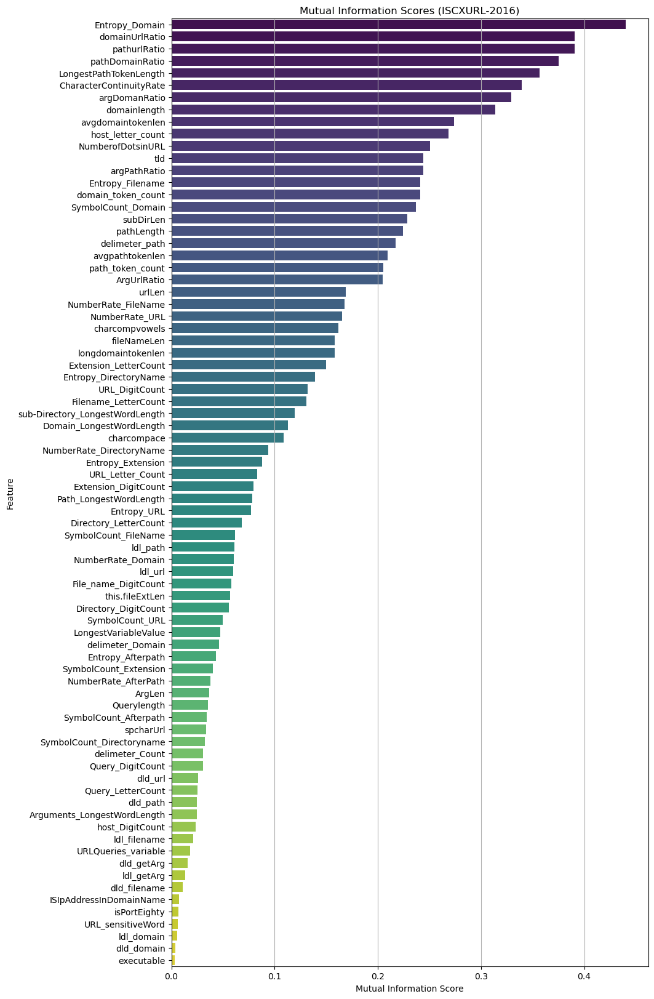

In [73]:
plt.figure(figsize=(10, 20))
sns.barplot(x='MMI Score', y='Feature', data=mmi_feature_importance_ISCX, palette='viridis')
plt.title('Mutual Information Scores (ISCXURL-2016)')
plt.xlabel('Mutual Information Score')
plt.ylabel('Feature')
plt.grid(axis='x')
plt.show()

### 6.2 RF - Gini Importance (MDI) (ISCXURL-2016)

                            Feature  Gini Importance
29                   domainUrlRatio         0.083560
6                               tld         0.074016
1                domain_token_count         0.057484
67               SymbolCount_Domain         0.054483
34                NumberofDotsinURL         0.053521
30                  pathDomainRatio         0.053238
50           LongestPathTokenLength         0.049902
20                     domainlength         0.042091
26                     pathurlRatio         0.034857
45                host_letter_count         0.032259
59                   delimeter_path         0.031576
28                    argDomanRatio         0.027862
19                           urlLen         0.025457
21                       pathLength         0.024404
22                        subDirLen         0.023518
36          CharacterContinuityRate         0.018800
9                           ldl_url         0.018662
73                   Entropy_Domain         0.

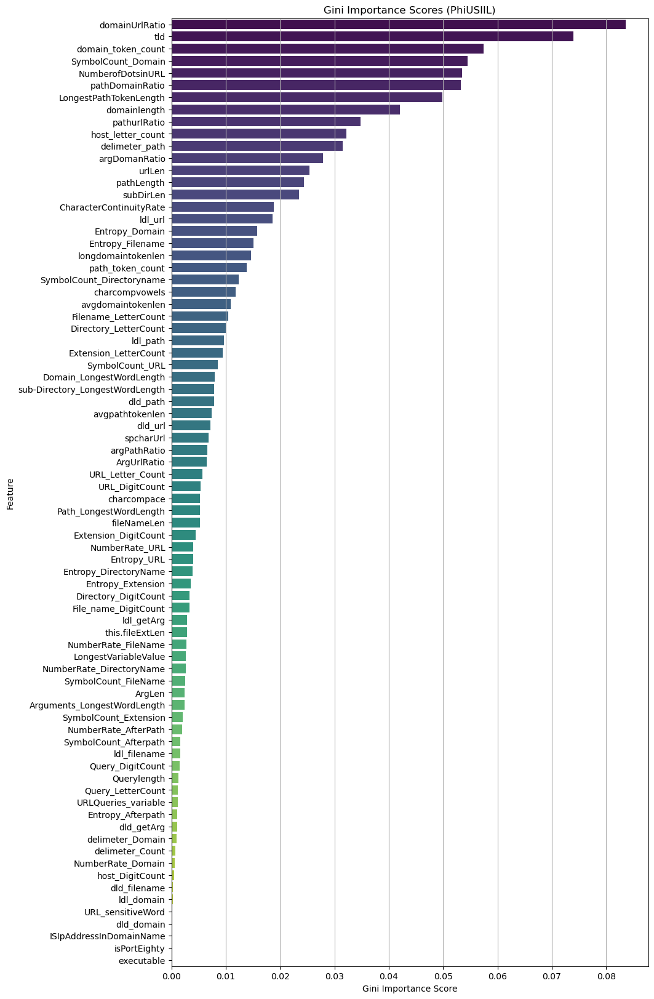

In [84]:

RF_ISCX.fit(x_train_ISCX, y_train_ISCX)

gini_scores_ISCX = RF_ISCX.named_steps['randomforestclassifier'].feature_importances_

gini_importance_ISCX = pd.DataFrame({'Feature': x_train_ISCX.columns, 'Gini Importance': gini_scores_ISCX})
gini_importance_ISCX = gini_importance_ISCX.sort_values(by='Gini Importance', ascending=False)

print(gini_importance_ISCX)

plt.figure(figsize=(10, 20))
sns.barplot(x='Gini Importance', y='Feature', data=gini_importance_ISCX, palette='viridis')
plt.title('Gini Importance Scores (PhiUSIIL)')
plt.xlabel('Gini Importance Score')
plt.ylabel('Feature')
plt.grid(axis='x')
plt.show()

### 6.3 GNB - Sequential Feature Selection (SFS) (ISCXURL-2016)

In [88]:
# SFS only selects the features which contributed most to improving accuracy.

GNB_SFS_ISCX = make_pipeline(StandardScaler(), SequentialFeatureSelector(GaussianNB(), direction='forward'), GaussianNB())

GNB_SFS_ISCX.fit(x_train_ISCX, y_train_ISCX)

GNB_ISCX_selected_features = GNB_SFS_ISCX.named_steps['sequentialfeatureselector'].get_support(indices=True)

GNB_ISCX_feature_names = x_train_ISCX.columns[GNB_ISCX_selected_features]
print(GNB_ISCX_feature_names)

C:\Users\hugha\anaconda3\Lib\site-packages\sklearn\naive_bayes.py:510: RuntimeWarning: divide by zero encountered in log
  n_ij = -0.5 * np.sum(np.log(2.0 * np.pi * self.var_[i, :]))
C:\Users\hugha\anaconda3\Lib\site-packages\sklearn\naive_bayes.py:511: RuntimeWarning: invalid value encountered in divide
  n_ij -= 0.5 * np.sum(((X - self.theta_[i, :]) ** 2) / (self.var_[i, :]), 1)
C:\Users\hugha\anaconda3\Lib\site-packages\sklearn\naive_bayes.py:510: RuntimeWarning: divide by zero encountered in log
  n_ij = -0.5 * np.sum(np.log(2.0 * np.pi * self.var_[i, :]))
C:\Users\hugha\anaconda3\Lib\site-packages\sklearn\naive_bayes.py:511: RuntimeWarning: invalid value encountered in divide
  n_ij -= 0.5 * np.sum(((X - self.theta_[i, :]) ** 2) / (self.var_[i, :]), 1)
C:\Users\hugha\anaconda3\Lib\site-packages\sklearn\naive_bayes.py:510: RuntimeWarning: divide by zero encountered in log
  n_ij = -0.5 * np.sum(np.log(2.0 * np.pi * self.var_[i, :]))
C:\Users\hugha\anaconda3\Lib\site-packages\sklear

Index(['domain_token_count', 'charcompvowels', 'charcompace', 'ldl_url',
       'ldl_domain', 'ldl_filename', 'urlLen', 'domainlength', 'fileNameLen',
       'this.fileExtLen', 'pathurlRatio', 'ArgUrlRatio', 'argDomanRatio',
       'argPathRatio', 'NumberofDotsinURL', 'ISIpAddressInDomainName',
       'URL_DigitCount', 'Directory_DigitCount', 'File_name_DigitCount',
       'URL_Letter_Count', 'host_letter_count', 'Directory_LetterCount',
       'Query_LetterCount', 'LongestPathTokenLength',
       'Domain_LongestWordLength', 'Path_LongestWordLength', 'spcharUrl',
       'delimeter_path', 'NumberRate_DirectoryName', 'NumberRate_FileName',
       'NumberRate_AfterPath', 'SymbolCount_URL', 'SymbolCount_Directoryname',
       'Entropy_URL', 'Entropy_Domain', 'Entropy_DirectoryName',
       'Entropy_Filename', 'Entropy_Extension', 'Entropy_Afterpath'],
      dtype='object')


### 6.4 SVM - Sequential Feature Selection (SFS) (ISCXURL-2016)

In [56]:
SVM_SFS_ISCX = make_pipeline(StandardScaler(), SequentialFeatureSelector(SVC(random_state=42), direction='forward'), SVC(random_state=42))

SVM_SFS_ISCX.fit(x_train_ISCX, y_train_ISCX)

SVM_ISCX_selected_features = SVM_SFS_ISCX.named_steps['sequentialfeatureselector'].get_support(indices=True)

SVM_ISCX_feature_names = x_train_ISCX.columns[SVM_ISCX_selected_features]
print(SVM_ISCX_feature_names)

KeyboardInterrupt: 

## 7. Post-Feature Selection Evaluation (PhiUSIIL)

In [100]:
# PhiUSIIL dataset has 29 features total.

# New training set for RF to only include features with a Gini > 0.01 (Refer to Section 5.3)
# Selected features are numerical.

RF_phi_features = ['URLSimilarityIndex', 'IsHTTPS', 'DelimiterPathCount', 'LongestPathToken', 'NoOfOtherSpecialCharsInURL', 
                   'NoOfDegitsInURL', 'LetterRatioInURL', 'DegitRatioInURL', 'SpacialCharRatioInURL', 'DomainLength', 'CharContinuationRate']

x_train_phi_RF = x_train_phi[RF_phi_features]
x_test_phi_RF = x_test_phi[RF_phi_features]

# New training set for RF to only include features with a Gini > 0.1 (Refer to Section 5.3)
# Selected features are numerical.

RF_phi_features2 = ['URLSimilarityIndex', 'IsHTTPS', 'DelimiterPathCount']

x_train_phi_RF2 = x_train_phi[RF_phi_features2]

# New training set for GNB to only include features selected during SFE along with the removal of features with MMI < 0.02 (Refer to Section 5.4 and 5.1)

GNB_phi_features = ['URLLength', 'DomainLength', 'IsDomainIP', 'URLSimilarityIndex', 'CharContinuationRate', 'TLDLegitimateProb', 
                    'URLCharProb', 'TLDLength', 'NoOfSubDomain', 'IsHTTPS', 'DelimiterPathCount']

x_train_phi_GNB = x_train_phi[GNB_phi_features]
x_test_phi_GNB = x_test_phi[GNB_phi_features]

# New training set for SVM to only include features with MMI > 0.1 (Refer to Section 5.1)
# Selected features are numerical.


SVM_phi_features_rm = ['IsDomainIP', 'DotCount', 'NoOfSubDomain', 'NoOfQMarkInURL', 'DigitQueryCount', 'TLDLength', 'NoOfEqualsInURL',
                      'NoOfAmpersandInURL', 'ObfuscationRatio', 'HasObfuscation', 'TLD', 'NoOfObfuscatedChar']

x_train_phi_SVM = x_train_phi.drop(SVM_phi_features_rm, axis=1)
x_test_phi_SVM = x_test_phi.drop(SVM_phi_features_rm, axis=1)

# New training set for SVM to only include features with MMI > 0.2 (Refer to Section 5.1)
# Selected features are numerical.

SVM_phi_features_rm2 = ['URLSimilarityIndex', 'LetterRatioInURL', 'DelimiterPathCount', 'LongestPathToken', 'IsHTTPS', 'NoOfOtherSpecialCharsInURL',
                       'SpacialCharRatioInURL']

x_train_phi_SVM2 = x_train_phi[SVM_phi_features_rm2]

# New training set for SVM to only include features with MMI > 0.02 (Refer to Section 5.1)
# Selected features are numerical.

SVM_phi_features_rm3 = ['NoOfAmpersandInURL', 'ObfuscationRatio', 'HasObfuscation', 'TLD', 'NoOfObfuscatedChar']

x_train_phi_SVM3 = x_train_phi.drop(SVM_phi_features_rm3, axis=1)
x_test_phi_SVM3 = x_test_phi.drop(SVM_phi_features_rm3, axis=1)

# New pipelines as only standard scaler is needed for numerical features.
# No new pipeline for GNB as 'TLD' was included in the output of selected features from SFE.

RF_v2 = make_pipeline(StandardScaler(), RandomForestClassifier(random_state=42, n_jobs=-1))
GNB_v2 = make_pipeline(StandardScaler(), GaussianNB())
SVM_v2 = make_pipeline(StandardScaler(), SVC(random_state=42))

# Datasets with URLSimilarityIndex removed.

x_train_phi_RF_rm_USI = x_train_phi_RF.drop('URLSimilarityIndex', axis=1)
x_train_phi_GNB_rm_USI = x_train_phi_GNB.drop('URLSimilarityIndex', axis=1)
x_train_phi_SVM_rm_USI = x_train_phi_SVM.drop('URLSimilarityIndex', axis=1)
x_train_phi_SVM2_rm_USI = x_train_phi_SVM2.drop('URLSimilarityIndex', axis=1)
x_train_phi_SVM3_rm_USI = x_train_phi_SVM3.drop('URLSimilarityIndex', axis=1)

x_test_phi_RF_rm_USI = x_test_phi_RF.drop('URLSimilarityIndex', axis=1)
x_test_phi_GNB_rm_USI = x_test_phi_GNB.drop('URLSimilarityIndex', axis=1)
x_test_phi_SVM_rm_USI = x_test_phi_SVM.drop('URLSimilarityIndex', axis=1)
x_test_phi_SVM3_rm_USI = x_test_phi_SVM3.drop('URLSimilarityIndex', axis=1)

### 7.1 Random Forest

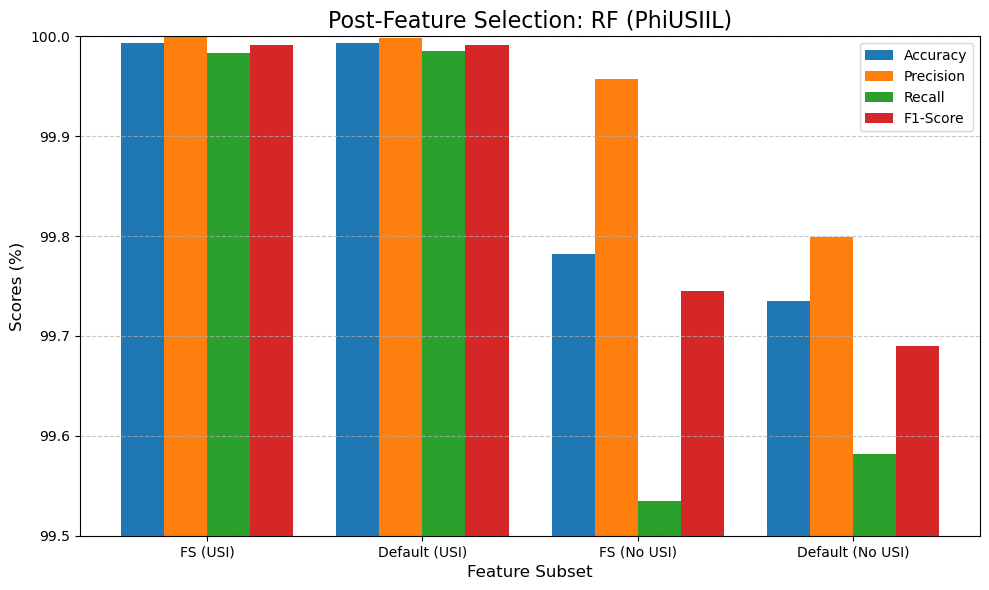

In [17]:
# Metrics for the models
models = ["FS (USI)", 'Default (USI)', 'FS (No USI)', 'Default (No USI)']
accuracy = [99.993, 99.993, 99.782, 99.735]
precision = [100, 99.998, 99.957, 99.799]
recall = [99.983, 99.985, 99.535, 99.582]
f1_score = [99.991, 99.991, 99.745, 99.690]

# Combine metrics into a single data structure
metrics = [accuracy, precision, recall, f1_score]
metric_names = ['Accuracy', 'Precision', 'Recall', 'F1-Score']

# Bar chart properties
x = np.arange(len(models))  # x positions for groups
width = 0.2  # Width of each bar

# Create the plot
fig, ax = plt.subplots(figsize=(10, 6))

# Plot each metric as a group of bars
for i, metric in enumerate(metrics):
    ax.bar(x + i * width, metric, width, label=metric_names[i])

# Formatting the chart
ax.set_title('Post-Feature Selection: RF (PhiUSIIL)', fontsize=16)
ax.set_xlabel('Feature Subset', fontsize=12)
ax.set_ylabel('Scores (%)', fontsize=12)
ax.set_xticks(x + 1.5 * width)  # Center the group labels
ax.set_xticklabels(models, fontsize=10)
ax.legend(loc='upper right', fontsize=10)
ax.set_ylim(99.5, 100)  # Assuming metric scores are between 0 and 1

# Add gridlines for better readability
ax.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot
plt.tight_layout()
plt.show()

label
0    107815
1     80821
Name: count, dtype: int64

Results on entire training set:
RF Accuracy: 0.9999257831580675 ± 3.091071541276589e-05
RF Precision: 1.0 ± 0.0
RF Recall: 0.999826778612326 ± 7.214423766641956e-05
RF F1: 0.999913380502582 ± 3.6077895440676326e-05


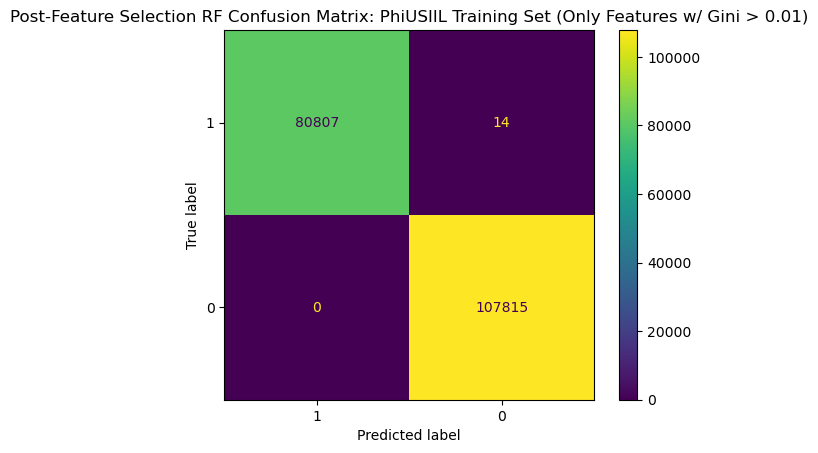

In [519]:
# Evaluation on entire training set. Only using features with Gini > 0.01 (11 Features). Refer to Section 5.3.

print(y_train_phi.value_counts())

RF_v2_cv = cross_validate(RF_v2, x_train_phi_RF, y_train_phi, cv=StratifiedKFold(), scoring=scoring, n_jobs=-1, error_score='raise')

RF_v2_cv_pred = cross_val_predict(RF_v2, x_train_phi_RF, y_train_phi, cv=StratifiedKFold(), n_jobs=-1)

print("\nResults on entire training set:")
print(f"RF Accuracy: {RF_v2_cv['test_accuracy'].mean()} ± {RF_v2_cv['test_accuracy'].std()}")
print(f"RF Precision: {RF_v2_cv['test_precision'].mean()} ± {RF_v2_cv['test_precision'].std()}")
print(f"RF Recall: {RF_v2_cv['test_recall'].mean()} ± {RF_v2_cv['test_recall'].std()}")
print(f"RF F1: {RF_v2_cv['test_f1'].mean()} ± {RF_v2_cv['test_f1'].std()}")

RF_v2_cv_cm = ConfusionMatrixDisplay.from_predictions(y_train_phi, RF_v2_cv_pred, values_format='d', labels=[1, 0], display_labels=[1, 0])
_ = RF_v2_cv_cm.ax_.set(title="Post-Feature Selection RF Confusion Matrix: PhiUSIIL Training Set (Only Features w/ Gini > 0.01)")

label
0    107815
1     80821
Name: count, dtype: int64

Results on entire training set:
RF Accuracy: 0.9999257831580675 ± 3.091071541276589e-05
RF Precision: 1.0 ± 0.0
RF Recall: 0.999826778612326 ± 7.214423766641956e-05
RF F1: 0.999913380502582 ± 3.6077895440676326e-05


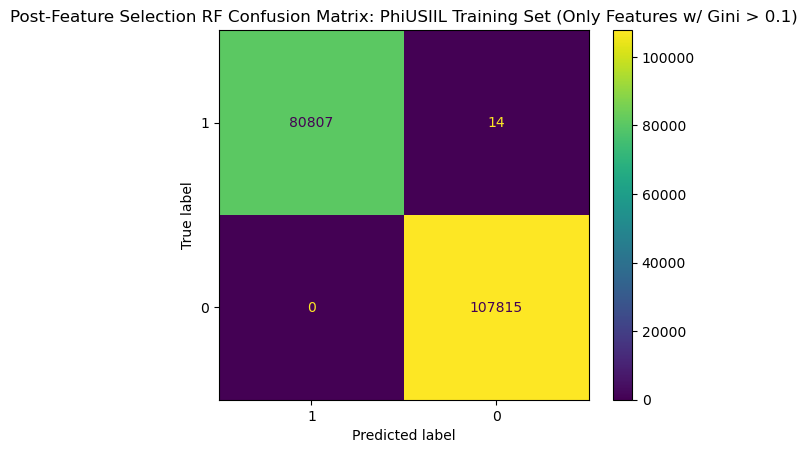

In [523]:
# Evaluation on entire training set. Only using features with Gini > 0.1 (3 features)

print(y_train_phi.value_counts())

RF_v2_cv2 = cross_validate(RF_v2, x_train_phi_RF2, y_train_phi, cv=StratifiedKFold(), scoring=scoring, n_jobs=-1, error_score='raise')

RF_v2_cv2_pred = cross_val_predict(RF_v2, x_train_phi_RF2, y_train_phi, cv=StratifiedKFold(), n_jobs=-1)

print("\nResults on entire training set:")
print(f"RF Accuracy: {RF_v2_cv2['test_accuracy'].mean()} ± {RF_v2_cv2['test_accuracy'].std()}")
print(f"RF Precision: {RF_v2_cv2['test_precision'].mean()} ± {RF_v2_cv2['test_precision'].std()}")
print(f"RF Recall: {RF_v2_cv2['test_recall'].mean()} ± {RF_v2_cv2['test_recall'].std()}")
print(f"RF F1: {RF_v2_cv2['test_f1'].mean()} ± {RF_v2_cv2['test_f1'].std()}")

RF_v2_cv2_cm = ConfusionMatrixDisplay.from_predictions(y_train_phi, RF_v2_cv2_pred, values_format='d', labels=[1, 0], display_labels=[1, 0])
_ = RF_v2_cv2_cm.ax_.set(title="Post-Feature Selection RF Confusion Matrix: PhiUSIIL Training Set (Only Features w/ Gini > 0.1)")

label
0    107815
1     80821
Name: count, dtype: int64

Results on entire training set:
RF Accuracy: 0.9978212005908345 ± 0.00021363446617504088
RF Precision: 0.9995650846160288 ± 0.00014707666944991656
RF Recall: 0.9953477428580986 ± 0.0003658057594395053
RF F1: 0.997451940347071 ± 0.00025011202506984315


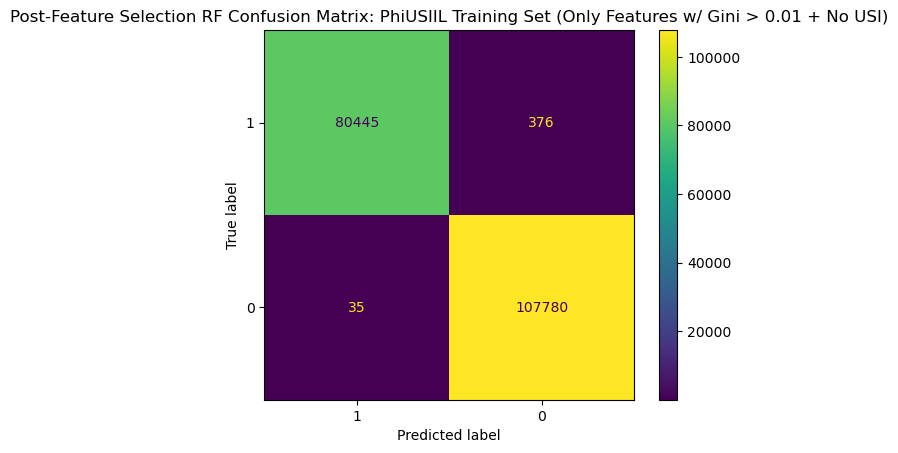

In [136]:
# Evaluation on entire training set. Only using features with Gini > 0.01 (10 Features).
# URLSimilarity Index removed to provide meaningful results without the inflation.

print(y_train_phi.value_counts())

RF_v2_cv = cross_validate(RF_v2, x_train_phi_RF_rm_USI, y_train_phi, cv=StratifiedKFold(), scoring=scoring, n_jobs=-1, error_score='raise')

RF_v2_cv_pred = cross_val_predict(RF_v2, x_train_phi_RF_rm_USI, y_train_phi, cv=StratifiedKFold(), n_jobs=-1)

print("\nResults on entire training set:")
print(f"RF Accuracy: {RF_v2_cv['test_accuracy'].mean()} ± {RF_v2_cv['test_accuracy'].std()}")
print(f"RF Precision: {RF_v2_cv['test_precision'].mean()} ± {RF_v2_cv['test_precision'].std()}")
print(f"RF Recall: {RF_v2_cv['test_recall'].mean()} ± {RF_v2_cv['test_recall'].std()}")
print(f"RF F1: {RF_v2_cv['test_f1'].mean()} ± {RF_v2_cv['test_f1'].std()}")

RF_v2_cv_cm = ConfusionMatrixDisplay.from_predictions(y_train_phi, RF_v2_cv_pred, values_format='d', labels=[1, 0], display_labels=[1, 0])
_ = RF_v2_cv_cm.ax_.set(title="Post-Feature Selection RF Confusion Matrix: PhiUSIIL Training Set (Only Features w/ Gini > 0.01 + No USI)")

### 7.2 Gaussian Naive Bayes

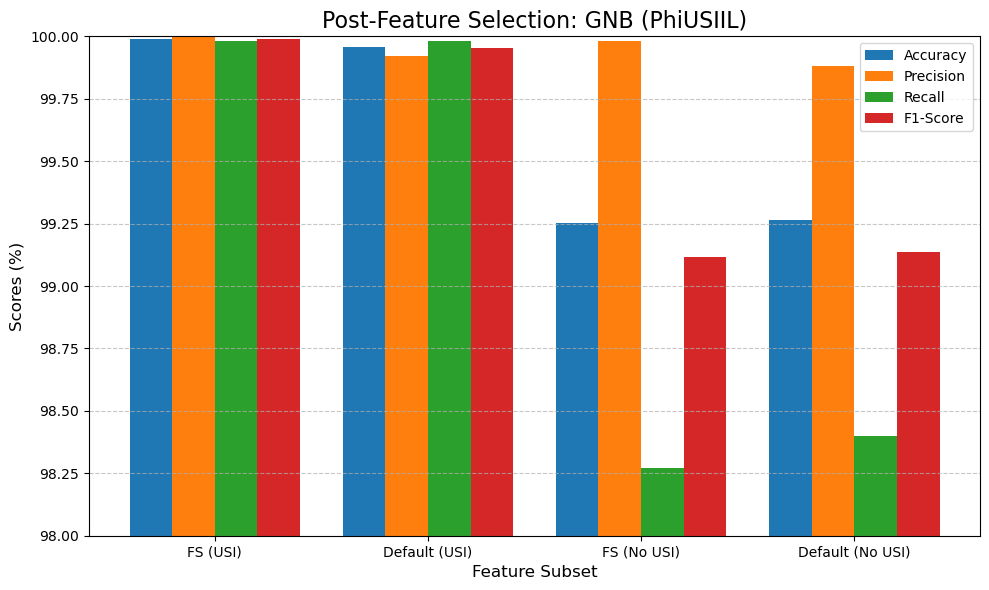

In [31]:
# Metrics for the models
models = ["FS (USI)", 'Default (USI)', 'FS (No USI)', 'Default (No USI)']
accuracy = [99.991, 99.959, 99.251, 99.265]
precision = [99.996, 99.921, 99.981, 99.882]
recall = [99.982, 99.983, 98.270, 98.400]
f1_score = [99.989, 99.952 , 99.118, 99.135]

# Combine metrics into a single data structure
metrics = [accuracy, precision, recall, f1_score]
metric_names = ['Accuracy', 'Precision', 'Recall', 'F1-Score']

# Bar chart properties
x = np.arange(len(models))  # x positions for groups
width = 0.2  # Width of each bar

# Create the plot
fig, ax = plt.subplots(figsize=(10, 6))

# Plot each metric as a group of bars
for i, metric in enumerate(metrics):
    ax.bar(x + i * width, metric, width, label=metric_names[i])

# Formatting the chart
ax.set_title('Post-Feature Selection: GNB (PhiUSIIL)', fontsize=16)
ax.set_xlabel('Feature Subset', fontsize=12)
ax.set_ylabel('Scores (%)', fontsize=12)
ax.set_xticks(x + 1.5 * width)  # Center the group labels
ax.set_xticklabels(models, fontsize=10)
ax.legend(loc='upper right', fontsize=10)
ax.set_ylim(98, 100)  # Assuming metric scores are between 0 and 1

# Add gridlines for better readability
ax.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot
plt.tight_layout()
plt.show()

label
0    107815
1     80821
Name: count, dtype: int64

Results on entire training set:
GNB Accuracy: 0.999909879569155 ± 3.5953951628892345e-05
GNB Precision: 0.9999628766473172 ± 3.0311090570329114e-05
GNB Recall: 0.999826778612326 ± 7.214423766641956e-05
GNB F1: 0.9998948216971536 ± 4.196213048341187e-05


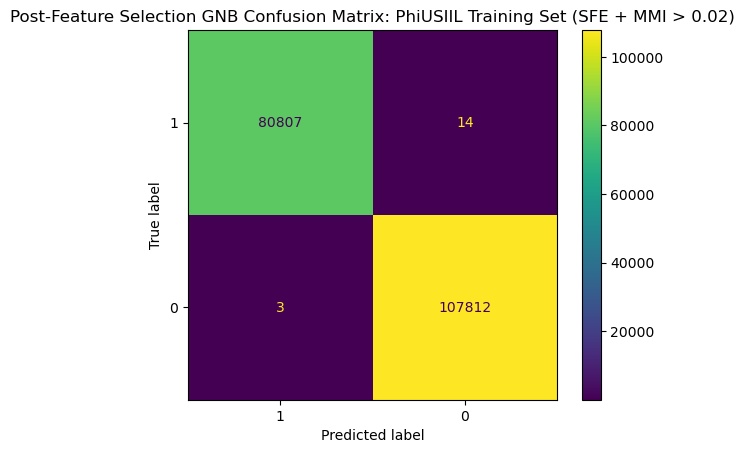

In [521]:
# Evaluation on entire training set. Only using features output from SFE and features with MMI > 0.02 (11 Features). Refer to Section 5.4.

print(y_train_phi.value_counts())

GNB_v2_cv = cross_validate(GNB_v2, x_train_phi_GNB, y_train_phi, cv=StratifiedKFold(), scoring=scoring, n_jobs=-1, error_score='raise')

GNB_v2_cv_pred = cross_val_predict(GNB_v2, x_train_phi_GNB, y_train_phi, cv=StratifiedKFold(), n_jobs=-1)

print("\nResults on entire training set:")
print(f"GNB Accuracy: {GNB_v2_cv['test_accuracy'].mean()} ± {GNB_v2_cv['test_accuracy'].std()}")
print(f"GNB Precision: {GNB_v2_cv['test_precision'].mean()} ± {GNB_v2_cv['test_precision'].std()}")
print(f"GNB Recall: {GNB_v2_cv['test_recall'].mean()} ± {GNB_v2_cv['test_recall'].std()}")
print(f"GNB F1: {GNB_v2_cv['test_f1'].mean()} ± {GNB_v2_cv['test_f1'].std()}")

GNB_v2_cv_cm = ConfusionMatrixDisplay.from_predictions(y_train_phi, GNB_v2_cv_pred, values_format='d', labels=[1, 0], display_labels=[1, 0])
_ = GNB_v2_cv_cm.ax_.set(title="Post-Feature Selection GNB Confusion Matrix: PhiUSIIL Training Set (SFE + MMI > 0.02)")

label
0    107815
1     80821
Name: count, dtype: int64

Results on entire training set:
GNB Accuracy: 0.9925093884049312 ± 0.0006322236012726329
GNB Precision: 0.999811104190794 ± 5.652998057777156e-05
GNB Recall: 0.9827025432864025 ± 0.0014258110417000116
GNB F1: 0.9911825164424547 ± 0.0007502902858100036


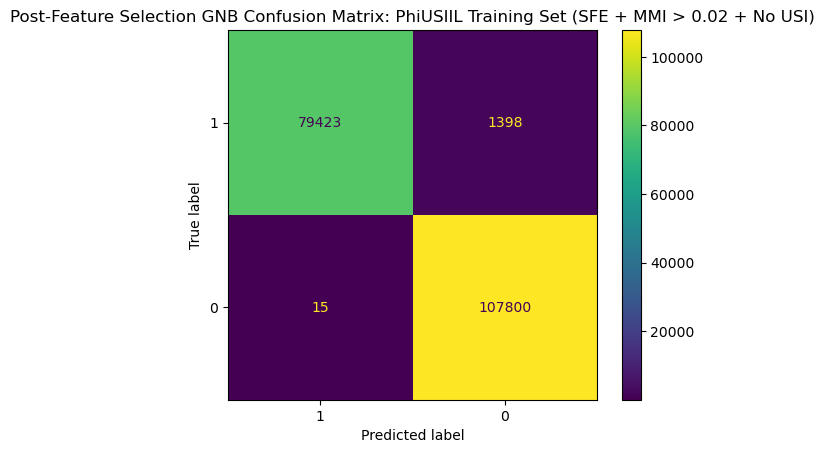

In [526]:
# Evaluation on entire training set. Only using features output from SFE and features with MMI > 0.02 (10 Features). Refer to Section 5.4.
# URLSimilarity Index removed to provide meaningful results without the inflation.

print(y_train_phi.value_counts())

GNB_v2_cv = cross_validate(GNB_v2, x_train_phi_GNB_rm_USI, y_train_phi, cv=StratifiedKFold(), scoring=scoring, n_jobs=-1, error_score='raise')

GNB_v2_cv_pred = cross_val_predict(GNB_v2, x_train_phi_GNB_rm_USI, y_train_phi, cv=StratifiedKFold(), n_jobs=-1)

print("\nResults on entire training set:")
print(f"GNB Accuracy: {GNB_v2_cv['test_accuracy'].mean()} ± {GNB_v2_cv['test_accuracy'].std()}")
print(f"GNB Precision: {GNB_v2_cv['test_precision'].mean()} ± {GNB_v2_cv['test_precision'].std()}")
print(f"GNB Recall: {GNB_v2_cv['test_recall'].mean()} ± {GNB_v2_cv['test_recall'].std()}")
print(f"GNB F1: {GNB_v2_cv['test_f1'].mean()} ± {GNB_v2_cv['test_f1'].std()}")

GNB_v2_cv_cm = ConfusionMatrixDisplay.from_predictions(y_train_phi, GNB_v2_cv_pred, values_format='d', labels=[1, 0], display_labels=[1, 0])
_ = GNB_v2_cv_cm.ax_.set(title="Post-Feature Selection GNB Confusion Matrix: PhiUSIIL Training Set (SFE + MMI > 0.02 + No USI)")

### 7.3 Support Vector Machine

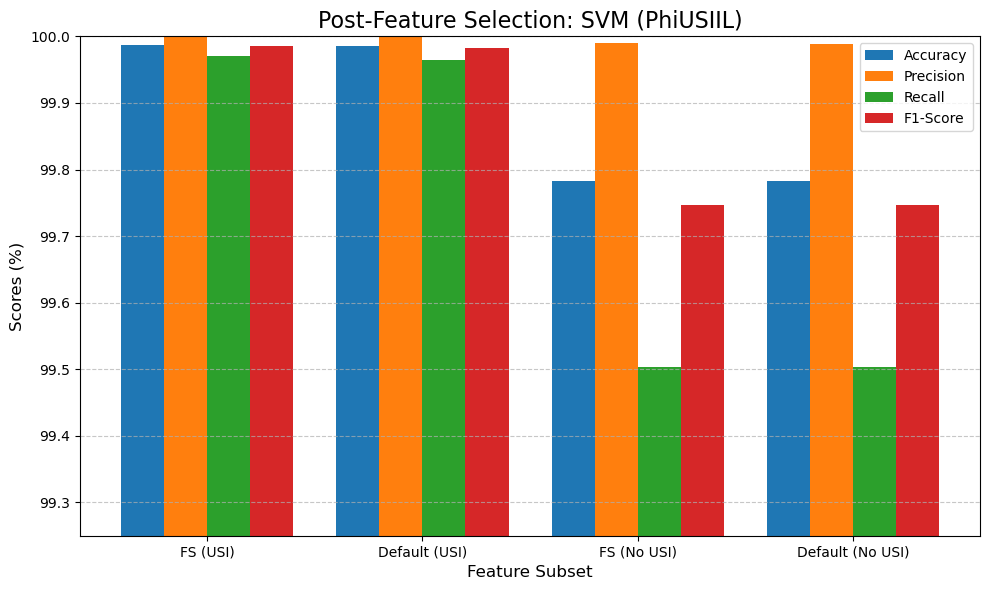

In [41]:
# Metrics for the models
models = ["FS (USI)", 'Default (USI)', 'FS (No USI)', 'Default (No USI)']
accuracy = [99.987, 99.985, 99.783, 99.783]
precision = [100, 100, 99.990, 99.989]
recall = [99.970, 99.964 , 99.504, 99.504]
f1_score = [99.985, 99.982 , 99.746, 99.746]

# Combine metrics into a single data structure
metrics = [accuracy, precision, recall, f1_score]
metric_names = ['Accuracy', 'Precision', 'Recall', 'F1-Score']

# Bar chart properties
x = np.arange(len(models))  # x positions for groups
width = 0.2  # Width of each bar

# Create the plot
fig, ax = plt.subplots(figsize=(10, 6))

# Plot each metric as a group of bars
for i, metric in enumerate(metrics):
    ax.bar(x + i * width, metric, width, label=metric_names[i])

# Formatting the chart
ax.set_title('Post-Feature Selection: SVM (PhiUSIIL)', fontsize=16)
ax.set_xlabel('Feature Subset', fontsize=12)
ax.set_ylabel('Scores (%)', fontsize=12)
ax.set_xticks(x + 1.5 * width)  # Center the group labels
ax.set_xticklabels(models, fontsize=10)
ax.legend(loc='upper right', fontsize=10)
ax.set_ylim(99.25, 100)  # Assuming metric scores are between 0 and 1

# Add gridlines for better readability
ax.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot
plt.tight_layout()
plt.show()

label
0    107815
1     80821
Name: count, dtype: int64

Results on entire training set:
SVM Accuracy: 0.9998727707266524 ± 3.895632805299272e-05
SVM Precision: 1.0 ± 0.0
SVM Recall: 0.999703046862759 ± 9.09255622062977e-05
SVM F1: 0.9998514993149963 ± 4.5477003810928324e-05


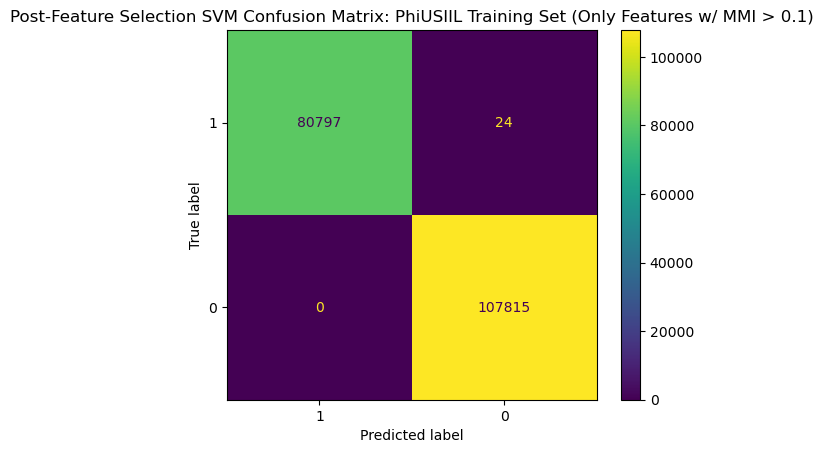

In [529]:
# Evaluation on entire training set. Only using features with MMI > 0.1 (17 Features). Refer to Section 5.1
# Much faster training time of 182 seconds compared to baseline evaluation which took 100+ seconds.

print(y_train_phi.value_counts())

SVM_v2_cv = cross_validate(SVM_v2, x_train_phi_SVM, y_train_phi, cv=StratifiedKFold(), scoring=scoring, n_jobs=-1, error_score='raise')

SVM_v2_cv_pred = cross_val_predict(SVM_v2, x_train_phi_SVM, y_train_phi, cv=StratifiedKFold(), n_jobs=-1)

print("\nResults on entire training set:")
print(f"SVM Accuracy: {SVM_v2_cv['test_accuracy'].mean()} ± {SVM_v2_cv['test_accuracy'].std()}")
print(f"SVM Precision: {SVM_v2_cv['test_precision'].mean()} ± {SVM_v2_cv['test_precision'].std()}")
print(f"SVM Recall: {SVM_v2_cv['test_recall'].mean()} ± {SVM_v2_cv['test_recall'].std()}")
print(f"SVM F1: {SVM_v2_cv['test_f1'].mean()} ± {SVM_v2_cv['test_f1'].std()}")

SVM_v2_cv_cm = ConfusionMatrixDisplay.from_predictions(y_train_phi, SVM_v2_cv_pred, values_format='d', labels=[1, 0], display_labels=[1, 0])
_ = SVM_v2_cv_cm.ax_.set(title="Post-Feature Selection SVM Confusion Matrix: PhiUSIIL Training Set (Only Features w/ MMI > 0.1)")

label
0    107815
1     80821
Name: count, dtype: int64

Results on entire training set:
SVM Accuracy: 0.9998409636893397 ± 4.435279450962697e-05
SVM Precision: 1.0 ± 0.0
SVM Recall: 0.9996288101093087 ± 0.00010351820735777622
SVM F1: 0.9998143679223152 ± 5.177763535037682e-05


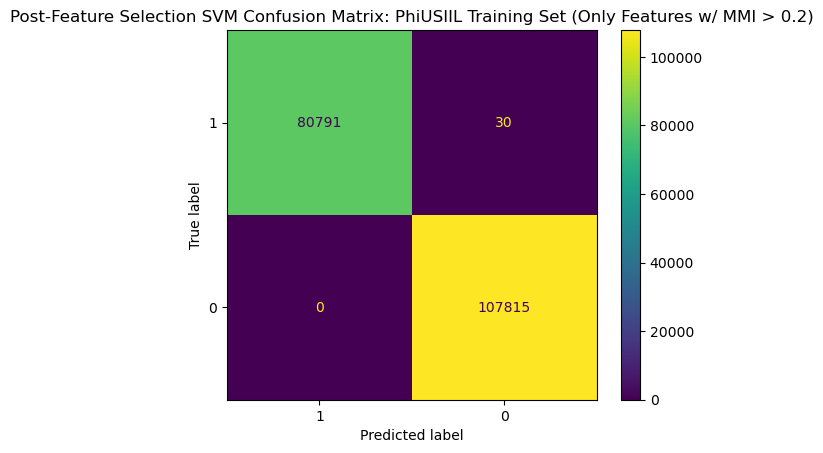

In [530]:
# Evaluation on entire training set. Only using features with MMI > 0.2 (7 Features). Refer to Section 5.1

print(y_train_phi.value_counts())

SVM_v2_cv2 = cross_validate(SVM_v2, x_train_phi_SVM2, y_train_phi, cv=StratifiedKFold(), scoring=scoring, n_jobs=-1, error_score='raise')

SVM_v2_cv2_pred = cross_val_predict(SVM_v2, x_train_phi_SVM2, y_train_phi, cv=StratifiedKFold(), n_jobs=-1)

print("\nResults on entire training set:")
print(f"SVM Accuracy: {SVM_v2_cv2['test_accuracy'].mean()} ± {SVM_v2_cv2['test_accuracy'].std()}")
print(f"SVM Precision: {SVM_v2_cv2['test_precision'].mean()} ± {SVM_v2_cv2['test_precision'].std()}")
print(f"SVM Recall: {SVM_v2_cv2['test_recall'].mean()} ± {SVM_v2_cv2['test_recall'].std()}")
print(f"SVM F1: {SVM_v2_cv2['test_f1'].mean()} ± {SVM_v2_cv2['test_f1'].std()}")

SVM_v2_cv2_cm = ConfusionMatrixDisplay.from_predictions(y_train_phi, SVM_v2_cv2_pred, values_format='d', labels=[1, 0], display_labels=[1, 0])
_ = SVM_v2_cv2_cm.ax_.set(title="Post-Feature Selection SVM Confusion Matrix: PhiUSIIL Training Set (Only Features w/ MMI > 0.2)")

label
0    107815
1     80821
Name: count, dtype: int64

Results on entire training set:
SVM Accuracy: 0.9973758988366784 ± 0.0001265595040737939
SVM Precision: 0.9999377823114454 ± 6.815012595669458e-05
SVM Recall: 0.9939372215796437 ± 0.0003410628620263202
SVM F1: 0.9969284336131172 ± 0.00014872906322555663


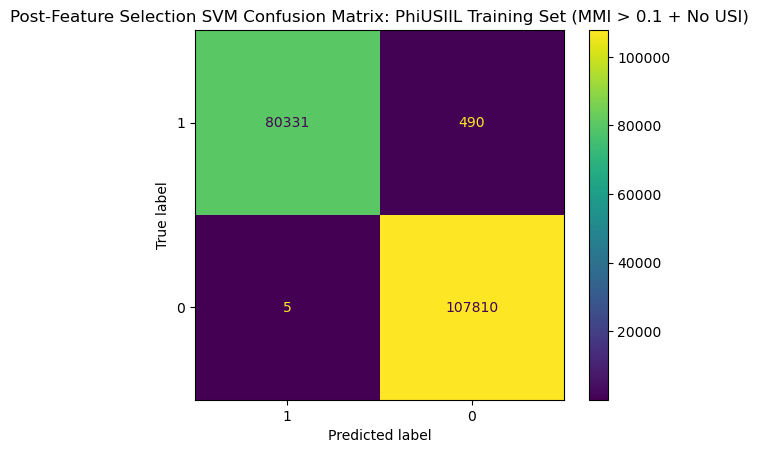

In [531]:
# Evaluation on entire training set. Only using features with MMI > 0.1 (16 Features). Refer to Section 5.1
# URLSimilarity Index removed to provide meaningful results without the inflation.

print(y_train_phi.value_counts())

SVM_v2_cv = cross_validate(SVM_v2, x_train_phi_SVM_rm_USI, y_train_phi, cv=StratifiedKFold(), scoring=scoring, n_jobs=-1, error_score='raise')

SVM_v2_cv_pred = cross_val_predict(SVM_v2, x_train_phi_SVM_rm_USI, y_train_phi, cv=StratifiedKFold(), n_jobs=-1)

print("\nResults on entire training set:")
print(f"SVM Accuracy: {SVM_v2_cv['test_accuracy'].mean()} ± {SVM_v2_cv['test_accuracy'].std()}")
print(f"SVM Precision: {SVM_v2_cv['test_precision'].mean()} ± {SVM_v2_cv['test_precision'].std()}")
print(f"SVM Recall: {SVM_v2_cv['test_recall'].mean()} ± {SVM_v2_cv['test_recall'].std()}")
print(f"SVM F1: {SVM_v2_cv['test_f1'].mean()} ± {SVM_v2_cv['test_f1'].std()}")

SVM_v2_cv_cm = ConfusionMatrixDisplay.from_predictions(y_train_phi, SVM_v2_cv_pred, values_format='d', labels=[1, 0], display_labels=[1, 0])
_ = SVM_v2_cv_cm.ax_.set(title="Post-Feature Selection SVM Confusion Matrix: PhiUSIIL Training Set (MMI > 0.1 + No USI)")

label
0    107815
1     80821
Name: count, dtype: int64

Results on entire training set:
SVM Accuracy: 0.9950168619381152 ± 0.0004098903967390709
SVM Precision: 0.9997496486751375 ± 0.00027148216584083106
SVM Recall: 0.988616835952979 ± 0.000695251055013814
SVM F1: 0.9941520264070529 ± 0.00048231320765543636


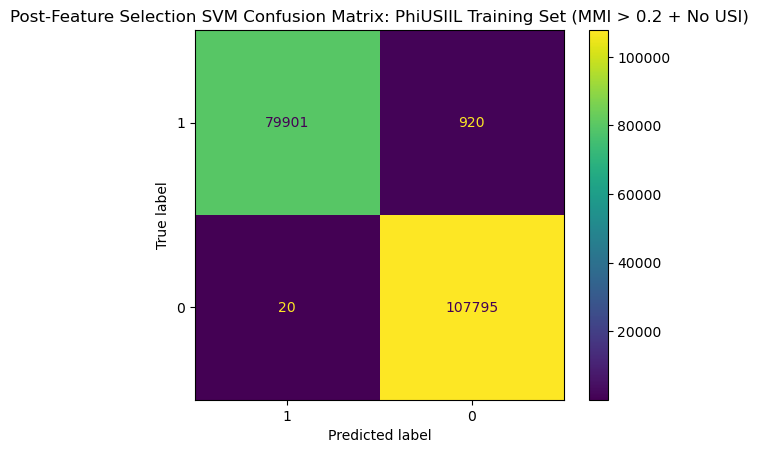

In [532]:
# Evaluation on entire training set. Only using features with MMI > 0.2 (6 Features). Refer to Section 5.1
# URLSimilarity Index removed to provide meaningful results without the inflation.

print(y_train_phi.value_counts())

SVM_v2_cv2 = cross_validate(SVM_v2, x_train_phi_SVM2_rm_USI, y_train_phi, cv=StratifiedKFold(), scoring=scoring, n_jobs=-1, error_score='raise')

SVM_v2_cv2_pred = cross_val_predict(SVM_v2, x_train_phi_SVM2_rm_USI, y_train_phi, cv=StratifiedKFold(), n_jobs=-1)

print("\nResults on entire training set:")
print(f"SVM Accuracy: {SVM_v2_cv2['test_accuracy'].mean()} ± {SVM_v2_cv2['test_accuracy'].std()}")
print(f"SVM Precision: {SVM_v2_cv2['test_precision'].mean()} ± {SVM_v2_cv2['test_precision'].std()}")
print(f"SVM Recall: {SVM_v2_cv2['test_recall'].mean()} ± {SVM_v2_cv2['test_recall'].std()}")
print(f"SVM F1: {SVM_v2_cv2['test_f1'].mean()} ± {SVM_v2_cv2['test_f1'].std()}")

SVM_v2_cv2_cm = ConfusionMatrixDisplay.from_predictions(y_train_phi, SVM_v2_cv2_pred, values_format='d', labels=[1, 0], display_labels=[1, 0])
_ = SVM_v2_cv2_cm.ax_.set(title="Post-Feature Selection SVM Confusion Matrix: PhiUSIIL Training Set (MMI > 0.2 + No USI)")

label
0    107815
1     80821
Name: count, dtype: int64

Results on entire training set:
SVM Accuracy: 0.9978318030771176 ± 0.0001465288606628261
SVM Precision: 0.9999005763258797 ± 9.297241887397289e-05
SVM Recall: 0.9950384180767609 ± 0.0004221429189632364
SVM F1: 0.997463507465618 ± 0.00017201709405041142


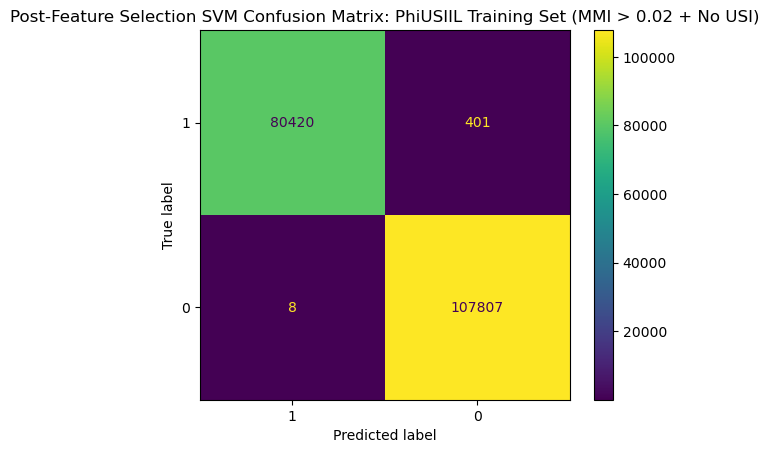

In [478]:
# Evaluation on entire training set. Only using features with MMI > 0.02 (13 Features). Refer to Section 5.1
# URLSimilarity Index removed to provide meaningful results without the inflation.

print(y_train_phi.value_counts())

SVM_v2_cv3 = cross_validate(SVM_v2, x_train_phi_SVM3_rm_USI, y_train_phi, cv=StratifiedKFold(), scoring=scoring, n_jobs=-1, error_score='raise')

SVM_v2_cv3_pred = cross_val_predict(SVM_v2, x_train_phi_SVM3_rm_USI, y_train_phi, cv=StratifiedKFold(), n_jobs=-1)

print("\nResults on entire training set:")
print(f"SVM Accuracy: {SVM_v2_cv3['test_accuracy'].mean()} ± {SVM_v2_cv3['test_accuracy'].std()}")
print(f"SVM Precision: {SVM_v2_cv3['test_precision'].mean()} ± {SVM_v2_cv3['test_precision'].std()}")
print(f"SVM Recall: {SVM_v2_cv3['test_recall'].mean()} ± {SVM_v2_cv3['test_recall'].std()}")
print(f"SVM F1: {SVM_v2_cv3['test_f1'].mean()} ± {SVM_v2_cv3['test_f1'].std()}")

SVM_v2_cv3_cm = ConfusionMatrixDisplay.from_predictions(y_train_phi, SVM_v2_cv3_pred, values_format='d', labels=[1, 0], display_labels=[1, 0])
_ = SVM_v2_cv3_cm.ax_.set(title="Post-Feature Selection SVM Confusion Matrix: PhiUSIIL Training Set (MMI > 0.02 + No USI)")

## 8. Post-Feature Selection Evaluation (ISCXURL-2016)

In [102]:
# ISCXURL-2016 dataset contains  78 features.

# New training set for RF to only include features with a Gini > 0.01 (Refer to Section 6.2)
# Selected features are numerical.

RF_ISCX_features = ['domainUrlRatio', 'tld', 'domain_token_count', 'SymbolCount_Domain', 'NumberofDotsinURL', 'pathDomainRatio', 
                    'LongestPathTokenLength', 'domainlength', 'pathurlRatio', 'host_letter_count', 'delimeter_path', 'argDomanRatio',
                    'urlLen', 'pathLength', 'subDirLen', 'CharacterContinuityRate', 'ldl_url', 'Entropy_Domain', 'Entropy_Filename',
                    'longdomaintokenlen', 'path_token_count', 'SymbolCount_Directoryname', 'charcompvowels', 'avgdomaintokenlen',
                    'Filename_LetterCount']

x_train_ISCX_RF = x_train_ISCX[RF_ISCX_features]

# New training set for RF to only include features with a Gini > 0.001 (Refer to Section 6.2)
# Selected features are numerical.

RF_ISCX_features2 = ['delimeter_Domain', 'delimeter_Count', 'NumberRate_Domain', 'host_DigitCount', 'dld_filename', 'ldl_domain', 'URL_sensitiveWord',
                    'dld_domain', 'ISIpAddressInDomainName', 'isPortEighty', 'executable']

x_train_ISCX_RF2 = x_train_ISCX.drop(RF_ISCX_features2, axis=1)
x_test_ISCX_RF = x_test_ISCX.drop(RF_ISCX_features2, axis=1)

# New training set for GNB to only include features selected during SFE
# (Refer to Section 6.3)

GNB_ISCX_features = ['domain_token_count', 'charcompvowels', 'charcompace', 'ldl_url', 'ldl_domain', 'ldl_filename', 'urlLen', 'domainlength', 
                     'fileNameLen', 'this.fileExtLen', 'pathurlRatio', 'ArgUrlRatio', 'argDomanRatio', 'argPathRatio', 'NumberofDotsinURL', 
                     'ISIpAddressInDomainName', 'URL_DigitCount', 'Directory_DigitCount', 'File_name_DigitCount', 'URL_Letter_Count', 
                     'host_letter_count', 'Directory_LetterCount', 'Query_LetterCount', 'LongestPathTokenLength', 'Domain_LongestWordLength', 
                     'Path_LongestWordLength', 'spcharUrl', 'delimeter_path', 'NumberRate_DirectoryName', 'NumberRate_FileName',
                     'NumberRate_AfterPath', 'SymbolCount_URL', 'SymbolCount_Directoryname', 'Entropy_URL', 'Entropy_Domain', 'Entropy_DirectoryName',
                     'Entropy_Filename', 'Entropy_Extension', 'Entropy_Afterpath']

x_train_ISCX_GNB = x_train_ISCX[GNB_ISCX_features]
x_test_ISCX_GNB = x_test_ISCX[GNB_ISCX_features]

# New training set for GNB to only include features selected during SFE along with the removal of features with MMI < 0.02 
# (Refer to Section 6.1 and 6.3)

GNB_ISCX_features2 = ['domain_token_count', 'charcompvowels', 'charcompace', 'ldl_url', 'ldl_filename', 'urlLen', 'domainlength', 
                     'fileNameLen', 'this.fileExtLen', 'pathurlRatio', 'ArgUrlRatio', 'argDomanRatio', 'argPathRatio', 'NumberofDotsinURL', 
                    'URL_DigitCount', 'Directory_DigitCount', 'File_name_DigitCount', 'URL_Letter_Count', 
                     'host_letter_count', 'Directory_LetterCount', 'Query_LetterCount', 'LongestPathTokenLength', 'Domain_LongestWordLength', 
                     'Path_LongestWordLength', 'spcharUrl', 'delimeter_path', 'NumberRate_DirectoryName', 'NumberRate_FileName',
                     'NumberRate_AfterPath', 'SymbolCount_URL', 'SymbolCount_Directoryname', 'Entropy_URL', 'Entropy_Domain', 'Entropy_DirectoryName',
                     'Entropy_Filename', 'Entropy_Extension', 'Entropy_Afterpath']

x_train_ISCX_GNB2 = x_train_ISCX[GNB_ISCX_features2]


# New training set for SVM to only include features with MMI > 0.1 (Refer to Section 6.1)
# Selected features are numerical.


SVM_ISCX_features = ['Entropy_Domain', 'domainUrlRatio', 'pathurlRatio', 'pathDomainRatio', 'LongestPathTokenLength', 'argDomanRatio',
                    'domainlength', 'avgdomaintokenlen', 'host_letter_count', 'NumberofDotsinURL', 'tld', 'argPathRatio', 'Entropy_Filename',
                    'domain_token_count', 'SymbolCount_Domain', 'subDirLen', 'pathLength', 'delimeter_path', 'avgpathtokenlen',
                    'path_token_count', 'ArgUrlRatio', 'urlLen', 'NumberRate_FileName', 'NumberRate_URL', 'charcompvowels', 'fileNameLen',
                    'longdomaintokenlen', 'Extension_LetterCount', 'Entropy_DirectoryName', 'URL_DigitCount', 'Filename_LetterCount',
                    'sub-Directory_LongestWordLength', 'Domain_LongestWordLength', 'charcompace']

x_train_ISCX_SVM = x_train_ISCX[SVM_ISCX_features]

# New training set for SVM to only include features with MMI > 0.05 (Refer to Section 6.1)
# Selected features are numerical.


SVM_ISCX_features2 = ['Entropy_Domain', 'domainUrlRatio', 'pathurlRatio', 'pathDomainRatio', 'LongestPathTokenLength', 'argDomanRatio',
                    'domainlength', 'avgdomaintokenlen', 'host_letter_count', 'NumberofDotsinURL', 'tld', 'argPathRatio', 'Entropy_Filename',
                    'domain_token_count', 'SymbolCount_Domain', 'subDirLen', 'pathLength', 'delimeter_path', 'avgpathtokenlen',
                    'path_token_count', 'ArgUrlRatio', 'urlLen', 'NumberRate_FileName', 'NumberRate_URL', 'charcompvowels', 'fileNameLen',
                    'longdomaintokenlen', 'Extension_LetterCount', 'Entropy_DirectoryName', 'URL_DigitCount', 'Filename_LetterCount',
                    'sub-Directory_LongestWordLength', 'Domain_LongestWordLength', 'charcompace', 'NumberRate_DirectoryName', 'Entropy_Extension',
                     'URL_Letter_Count', 'Extension_DigitCount', 'Path_LongestWordLength', 'Entropy_URL', 'Directory_LetterCount', 
                    'SymbolCount_FileName', 'ldl_path', 'NumberRate_Domain', 'ldl_url', 'File_name_DigitCount', 'this.fileExtLen', 
                    'Directory_DigitCount']

x_train_ISCX_SVM2 = x_train_ISCX[SVM_ISCX_features2]

# New training set for SVM to only include features with MMI > 0.01 (Refer to Section 6.1)
# Selected features are numerical.


SVM_ISCX_features3 = ['ISIpAddressInDomainName', 'isPortEighty', 'URL_sensitiveWord', 'ldl_domain', 'dld_domain', 'executable']

x_train_ISCX_SVM3 = x_train_ISCX.drop(SVM_ISCX_features3, axis=1)
x_test_ISCX_SVM = x_test_ISCX.drop(SVM_ISCX_features3, axis=1)

### 8.1 Random Forest

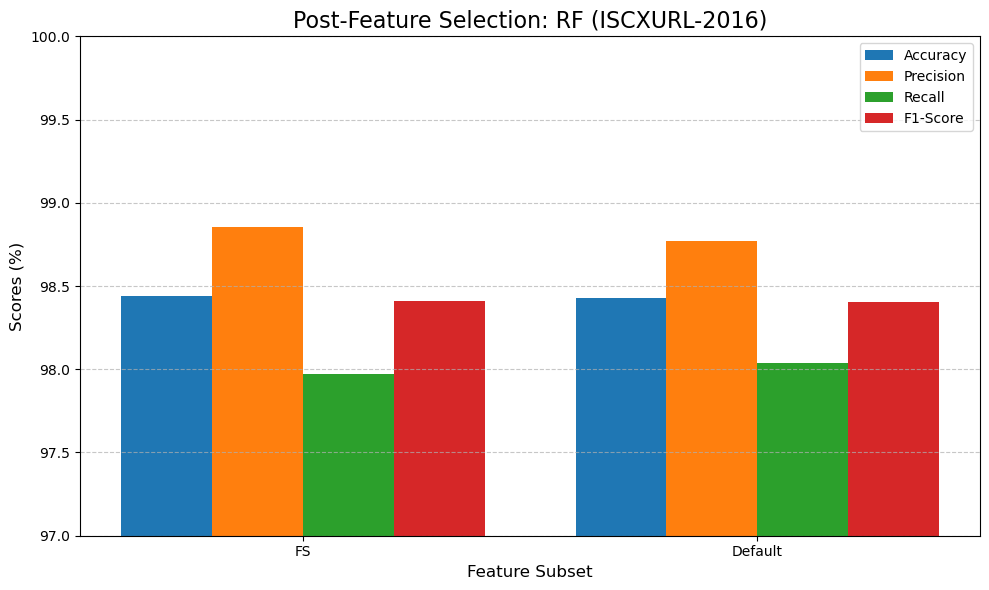

In [25]:
# Metrics for the models
models = ["FS", 'Default']
accuracy = [98.438, 98.430]
precision = [98.854, 98.772 ]
recall = [97.974, 98.040 ]
f1_score = [98.412, 98.404 ]

# Combine metrics into a single data structure
metrics = [accuracy, precision, recall, f1_score]
metric_names = ['Accuracy', 'Precision', 'Recall', 'F1-Score']

# Bar chart properties
x = np.arange(len(models))  # x positions for groups
width = 0.2  # Width of each bar

# Create the plot
fig, ax = plt.subplots(figsize=(10, 6))

# Plot each metric as a group of bars
for i, metric in enumerate(metrics):
    ax.bar(x + i * width, metric, width, label=metric_names[i])

# Formatting the chart
ax.set_title('Post-Feature Selection: RF (ISCXURL-2016)', fontsize=16)
ax.set_xlabel('Feature Subset', fontsize=12)
ax.set_ylabel('Scores (%)', fontsize=12)
ax.set_xticks(x + 1.5 * width)  # Center the group labels
ax.set_xticklabels(models, fontsize=10)
ax.legend(loc='upper right', fontsize=10)
ax.set_ylim(97, 100)  # Assuming metric scores are between 0 and 1

# Add gridlines for better readability
ax.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot
plt.tight_layout()
plt.show()

URL_Type_obf_Type
0    6222
1    6071
Name: count, dtype: int64

Results on entire training set:
RF Accuracy: 0.9812089959634177 ± 0.0030364678820274157
RF Precision: 0.9863547589941726 ± 0.003972520023900784
RF Recall: 0.9754571155449794 ± 0.003548528754408461
RF F1: 0.9808708780522645 ± 0.0030790291459772533


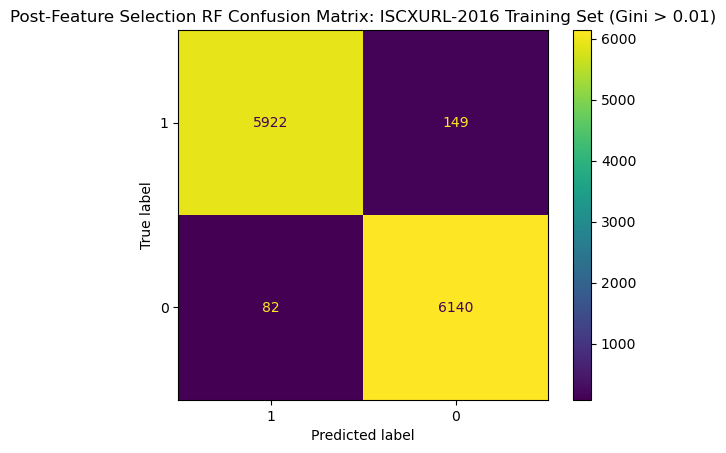

In [541]:
## Evaluation on entire training set. Only using features with Gini > 0.01 (25 Features). Refer to Section 6.2.

print(y_train_ISCX.value_counts())

RF_ISCX_cv = cross_validate(RF_ISCX, x_train_ISCX_RF, y_train_ISCX, cv=StratifiedKFold(), scoring=scoring, n_jobs=-1, error_score='raise')

RF_ISCX_cv_pred = cross_val_predict(RF_ISCX, x_train_ISCX_RF, y_train_ISCX, cv=StratifiedKFold(), n_jobs=-1)

print("\nResults on entire training set:")
print(f"RF Accuracy: {RF_ISCX_cv['test_accuracy'].mean()} ± {RF_ISCX_cv['test_accuracy'].std()}")
print(f"RF Precision: {RF_ISCX_cv['test_precision'].mean()} ± {RF_ISCX_cv['test_precision'].std()}")
print(f"RF Recall: {RF_ISCX_cv['test_recall'].mean()} ± {RF_ISCX_cv['test_recall'].std()}")
print(f"RF F1: {RF_ISCX_cv['test_f1'].mean()} ± {RF_ISCX_cv['test_f1'].std()}")

RF_ISCX_cv_cm = ConfusionMatrixDisplay.from_predictions(y_train_ISCX, RF_ISCX_cv_pred, values_format='d', labels=[1, 0], display_labels=[1, 0])
_ = RF_ISCX_cv_cm.ax_.set(title="Post-Feature Selection RF Confusion Matrix: ISCXURL-2016 Training Set (Gini > 0.01)")

URL_Type_obf_Type
0    6222
1    6071
Name: count, dtype: int64

Results on entire training set:
RF Accuracy: 0.9843814141836618 ± 0.0027048533453204147
RF Precision: 0.9885434937017715 ± 0.0036104567953229383
RF Recall: 0.9797400695588504 ± 0.0032344901716222446
RF F1: 0.984117780814554 ± 0.0027403608220188825


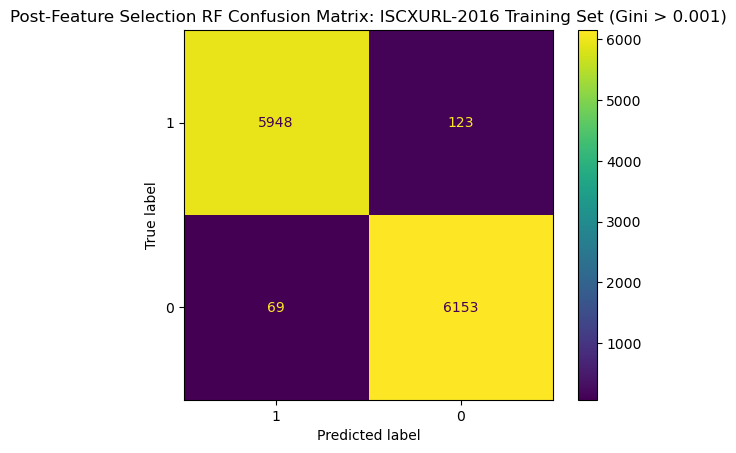

In [543]:
## Evaluation on entire training set. Only using features with Gini > 0.001 (67 Features). Refer to Section 6.2.

print(y_train_ISCX.value_counts())

RF_ISCX_cv = cross_validate(RF_ISCX, x_train_ISCX_RF2, y_train_ISCX, cv=StratifiedKFold(), scoring=scoring, n_jobs=-1, error_score='raise')

RF_ISCX_cv_pred = cross_val_predict(RF_ISCX, x_train_ISCX_RF2, y_train_ISCX, cv=StratifiedKFold(), n_jobs=-1)

print("\nResults on entire training set:")
print(f"RF Accuracy: {RF_ISCX_cv['test_accuracy'].mean()} ± {RF_ISCX_cv['test_accuracy'].std()}")
print(f"RF Precision: {RF_ISCX_cv['test_precision'].mean()} ± {RF_ISCX_cv['test_precision'].std()}")
print(f"RF Recall: {RF_ISCX_cv['test_recall'].mean()} ± {RF_ISCX_cv['test_recall'].std()}")
print(f"RF F1: {RF_ISCX_cv['test_f1'].mean()} ± {RF_ISCX_cv['test_f1'].std()}")

RF_ISCX_cv_cm = ConfusionMatrixDisplay.from_predictions(y_train_ISCX, RF_ISCX_cv_pred, values_format='d', labels=[1, 0], display_labels=[1, 0])
_ = RF_ISCX_cv_cm.ax_.set(title="Post-Feature Selection RF Confusion Matrix: ISCXURL-2016 Training Set (Gini > 0.001)")

### 8.2 Gaussian Naive Bayes

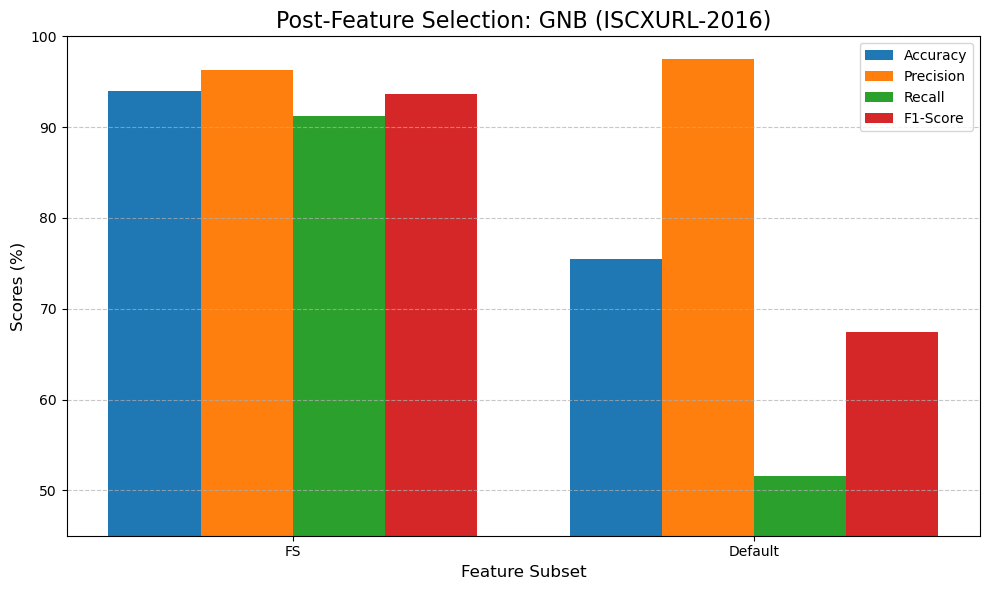

In [37]:
# Metrics for the models
models = ["FS", 'Default']
accuracy = [93.932, 75.433]
precision = [96.279, 97.459 ]
recall = [91.237, 51.590 ]
f1_score = [93.690, 67.386]

# Combine metrics into a single data structure
metrics = [accuracy, precision, recall, f1_score]
metric_names = ['Accuracy', 'Precision', 'Recall', 'F1-Score']

# Bar chart properties
x = np.arange(len(models))  # x positions for groups
width = 0.2  # Width of each bar

# Create the plot
fig, ax = plt.subplots(figsize=(10, 6))

# Plot each metric as a group of bars
for i, metric in enumerate(metrics):
    ax.bar(x + i * width, metric, width, label=metric_names[i])

# Formatting the chart
ax.set_title('Post-Feature Selection: GNB (ISCXURL-2016)', fontsize=16)
ax.set_xlabel('Feature Subset', fontsize=12)
ax.set_ylabel('Scores (%)', fontsize=12)
ax.set_xticks(x + 1.5 * width)  # Center the group labels
ax.set_xticklabels(models, fontsize=10)
ax.legend(loc='upper right', fontsize=10)
ax.set_ylim(45, 100)  # Assuming metric scores are between 0 and 1

# Add gridlines for better readability
ax.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot
plt.tight_layout()
plt.show()

URL_Type_obf_Type
0    6222
1    6071
Name: count, dtype: int64

Results on entire training set:
GNB Accuracy: 0.9393150019969486 ± 0.004683456108909068
GNB Precision: 0.9627941404296351 ± 0.0031205509179745732
GNB Recall: 0.9123698144419361 ± 0.007328657839091698
GNB F1: 0.9368951798905087 ± 0.005032612191374605


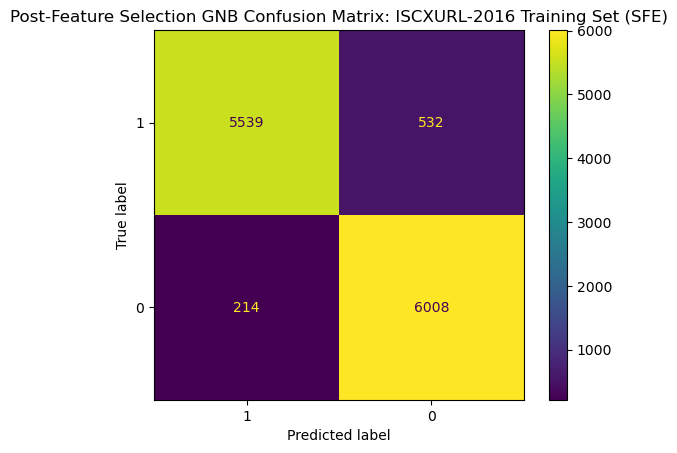

In [545]:
# Evaluation on entire training set. Only using features selected in SFE (39 Features). Refer to Section 6.3.

print(y_train_ISCX.value_counts())

GNB_ISCX_cv = cross_validate(GNB_ISCX, x_train_ISCX_GNB, y_train_ISCX, cv=StratifiedKFold(), scoring=scoring, n_jobs=-1, error_score='raise')

GNB_ISCX_cv_pred = cross_val_predict(GNB_ISCX, x_train_ISCX_GNB, y_train_ISCX, cv=StratifiedKFold(), n_jobs=-1)

print("\nResults on entire training set:")
print(f"GNB Accuracy: {GNB_ISCX_cv['test_accuracy'].mean()} ± {GNB_ISCX_cv['test_accuracy'].std()}")
print(f"GNB Precision: {GNB_ISCX_cv['test_precision'].mean()} ± {GNB_ISCX_cv['test_precision'].std()}")
print(f"GNB Recall: {GNB_ISCX_cv['test_recall'].mean()} ± {GNB_ISCX_cv['test_recall'].std()}")
print(f"GNB F1: {GNB_ISCX_cv['test_f1'].mean()} ± {GNB_ISCX_cv['test_f1'].std()}")

GNB_ISCX_cv_cm = ConfusionMatrixDisplay.from_predictions(y_train_ISCX, GNB_ISCX_cv_pred, values_format='d', labels=[1, 0], display_labels=[1, 0])
_ = GNB_ISCX_cv_cm.ax_.set(title="Post-Feature Selection GNB Confusion Matrix: ISCXURL-2016 Training Set (SFE)")

URL_Type_obf_Type
0    6222
1    6071
Name: count, dtype: int64

Results on entire training set:
GNB Accuracy: 0.9367120201739777 ± 0.004376469478145326
GNB Precision: 0.943671953062899 ± 0.0027150998019199487
GNB Recall: 0.9271941207178257 ± 0.007985796069981045
GNB F1: 0.9353450639786685 ± 0.004689799703633795


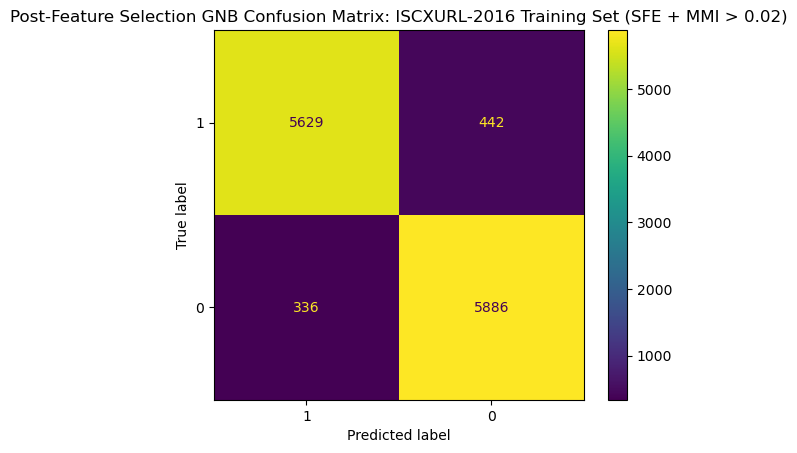

In [547]:
# Evaluation on entire training set. Only using features selected in SFE with MMI > 0.02 (37 Features). Refer to Section 6.1 and 6.3.
# Less FN, but more FP. 

print(y_train_ISCX.value_counts())

GNB_ISCX_cv = cross_validate(GNB_ISCX, x_train_ISCX_GNB2, y_train_ISCX, cv=StratifiedKFold(), scoring=scoring, n_jobs=-1, error_score='raise')

GNB_ISCX_cv_pred = cross_val_predict(GNB_ISCX, x_train_ISCX_GNB2, y_train_ISCX, cv=StratifiedKFold(), n_jobs=-1)

print("\nResults on entire training set:")
print(f"GNB Accuracy: {GNB_ISCX_cv['test_accuracy'].mean()} ± {GNB_ISCX_cv['test_accuracy'].std()}")
print(f"GNB Precision: {GNB_ISCX_cv['test_precision'].mean()} ± {GNB_ISCX_cv['test_precision'].std()}")
print(f"GNB Recall: {GNB_ISCX_cv['test_recall'].mean()} ± {GNB_ISCX_cv['test_recall'].std()}")
print(f"GNB F1: {GNB_ISCX_cv['test_f1'].mean()} ± {GNB_ISCX_cv['test_f1'].std()}")

GNB_ISCX_cv_cm = ConfusionMatrixDisplay.from_predictions(y_train_ISCX, GNB_ISCX_cv_pred, values_format='d', labels=[1, 0], display_labels=[1, 0])
_ = GNB_ISCX_cv_cm.ax_.set(title="Post-Feature Selection GNB Confusion Matrix: ISCXURL-2016 Training Set (SFE + MMI > 0.02)")

### 8.3 Support Vector Machine

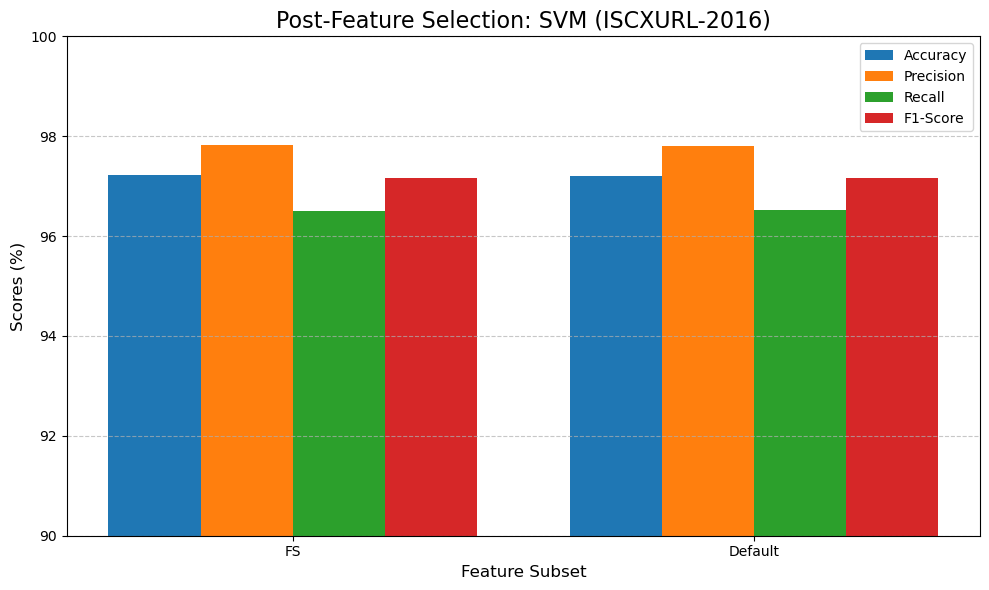

In [45]:
# Metrics for the models
models = ["FS", 'Default']
accuracy = [97.218, 97.210]
precision = [97.830, 97.799 ]
recall = [96.508, 96.524]
f1_score = [97.163, 97.156]

# Combine metrics into a single data structure
metrics = [accuracy, precision, recall, f1_score]
metric_names = ['Accuracy', 'Precision', 'Recall', 'F1-Score']

# Bar chart properties
x = np.arange(len(models))  # x positions for groups
width = 0.2  # Width of each bar

# Create the plot
fig, ax = plt.subplots(figsize=(10, 6))

# Plot each metric as a group of bars
for i, metric in enumerate(metrics):
    ax.bar(x + i * width, metric, width, label=metric_names[i])

# Formatting the chart
ax.set_title('Post-Feature Selection: SVM (ISCXURL-2016)', fontsize=16)
ax.set_xlabel('Feature Subset', fontsize=12)
ax.set_ylabel('Scores (%)', fontsize=12)
ax.set_xticks(x + 1.5 * width)  # Center the group labels
ax.set_xticklabels(models, fontsize=10)
ax.legend(loc='upper right', fontsize=10)
ax.set_ylim(90, 100)  # Assuming metric scores are between 0 and 1

# Add gridlines for better readability
ax.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot
plt.tight_layout()
plt.show()

URL_Type_obf_Type
0    6222
1    6071
Name: count, dtype: int64

Results on entire training set:
SVM Accuracy: 0.9672174185527931 ± 0.005262307463367308
SVM Precision: 0.9739332660122397 ± 0.006312266328109136
SVM Recall: 0.9593144453257944 ± 0.00567576837461266
SVM F1: 0.966560997702314 ± 0.0053561472948343925


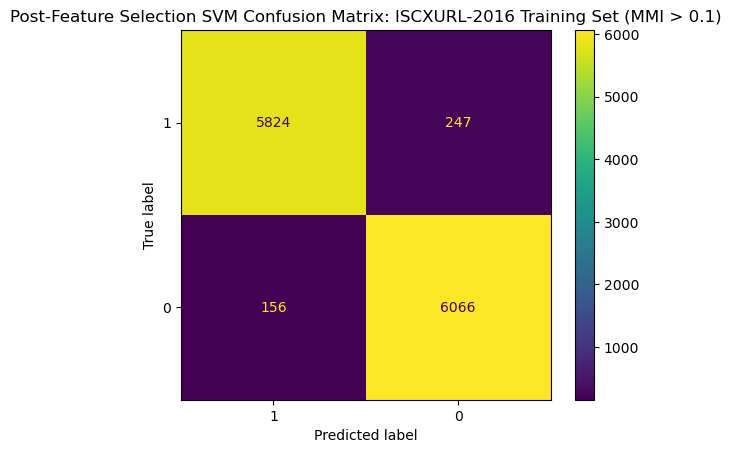

In [62]:
# Evaluation on entire training set. Only using features with MMI > 0.1 (34 Features). Refer to Section 6.1.

print(y_train_ISCX.value_counts())

SVM_ISCX_cv = cross_validate(SVM_ISCX, x_train_ISCX_SVM, y_train_ISCX, cv=StratifiedKFold(), scoring=scoring, n_jobs=-1, error_score='raise')

SVM_ISCX_cv_pred = cross_val_predict(SVM_ISCX, x_train_ISCX_SVM, y_train_ISCX, cv=StratifiedKFold(), n_jobs=-1)

print("\nResults on entire training set:")
print(f"SVM Accuracy: {SVM_ISCX_cv['test_accuracy'].mean()} ± {SVM_ISCX_cv['test_accuracy'].std()}")
print(f"SVM Precision: {SVM_ISCX_cv['test_precision'].mean()} ± {SVM_ISCX_cv['test_precision'].std()}")
print(f"SVM Recall: {SVM_ISCX_cv['test_recall'].mean()} ± {SVM_ISCX_cv['test_recall'].std()}")
print(f"SVM F1: {SVM_ISCX_cv['test_f1'].mean()} ± {SVM_ISCX_cv['test_f1'].std()}")

SVM_ISCX_cv_cm = ConfusionMatrixDisplay.from_predictions(y_train_ISCX, SVM_ISCX_cv_pred, values_format='d', labels=[1, 0], display_labels=[1, 0])
_ = SVM_ISCX_cv_cm.ax_.set(title="Post-Feature Selection SVM Confusion Matrix: ISCXURL-2016 Training Set (MMI > 0.1)")

URL_Type_obf_Type
0    6222
1    6071
Name: count, dtype: int64

Results on entire training set:
SVM Accuracy: 0.9713660749059183 ± 0.003888216391022592
SVM Precision: 0.9762117378854454 ± 0.005291526730440053
SVM Recall: 0.9655735215354472 ± 0.00495657584412989
SVM F1: 0.970852424093992 ± 0.0039461165368434616


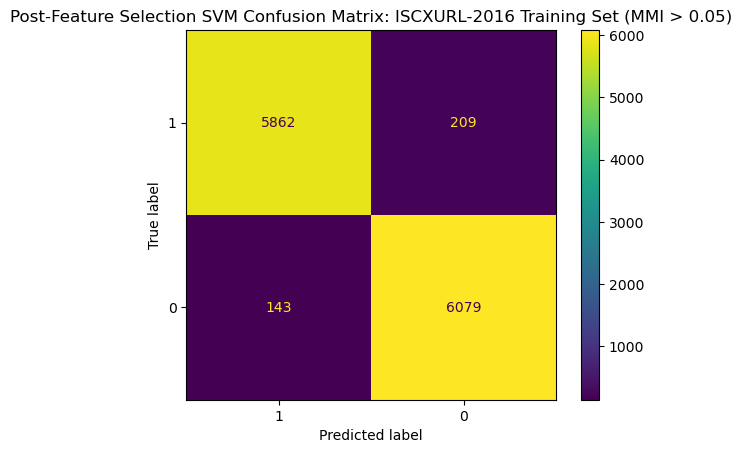

In [139]:
# Evaluation on entire training set. Only using featureswith MMI > 0.05 (48 Features). Refer to Section 6.1.

print(y_train_ISCX.value_counts())

SVM_ISCX_cv = cross_validate(SVM_ISCX, x_train_ISCX_SVM2, y_train_ISCX, cv=StratifiedKFold(), scoring=scoring, n_jobs=-1, error_score='raise')

SVM_ISCX_cv_pred = cross_val_predict(SVM_ISCX, x_train_ISCX_SVM2, y_train_ISCX, cv=StratifiedKFold(), n_jobs=-1)

print("\nResults on entire training set:")
print(f"SVM Accuracy: {SVM_ISCX_cv['test_accuracy'].mean()} ± {SVM_ISCX_cv['test_accuracy'].std()}")
print(f"SVM Precision: {SVM_ISCX_cv['test_precision'].mean()} ± {SVM_ISCX_cv['test_precision'].std()}")
print(f"SVM Recall: {SVM_ISCX_cv['test_recall'].mean()} ± {SVM_ISCX_cv['test_recall'].std()}")
print(f"SVM F1: {SVM_ISCX_cv['test_f1'].mean()} ± {SVM_ISCX_cv['test_f1'].std()}")

SVM_ISCX_cv_cm = ConfusionMatrixDisplay.from_predictions(y_train_ISCX, SVM_ISCX_cv_pred, values_format='d', labels=[1, 0], display_labels=[1, 0])
_ = SVM_ISCX_cv_cm.ax_.set(title="Post-Feature Selection SVM Confusion Matrix: ISCXURL-2016 Training Set (MMI > 0.05)")

URL_Type_obf_Type
0    6222
1    6071
Name: count, dtype: int64

Results on entire training set:
SVM Accuracy: 0.9721795791087754 ± 0.004917885427126681
SVM Precision: 0.9782987451409466 ± 0.004409738926626841
SVM Recall: 0.9650799655595556 ± 0.007154153924587564
SVM F1: 0.9716339888541048 ± 0.005043661720589204


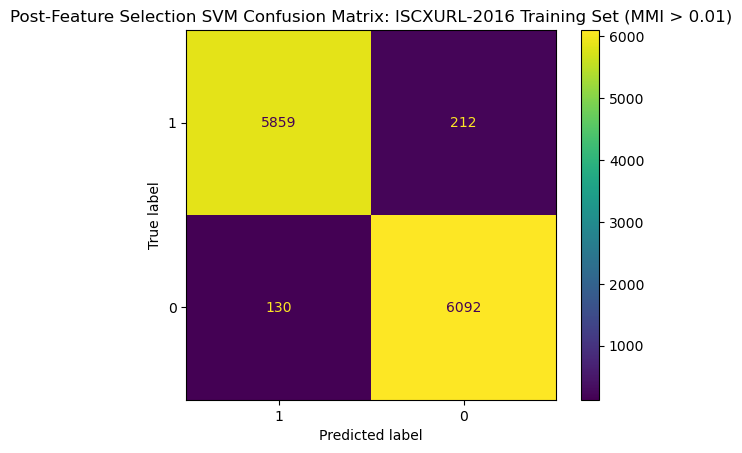

In [76]:
# Evaluation on entire training set. Only using features with MMI > 0.01 (72 Features). Refer to Section 6.1.

print(y_train_ISCX.value_counts())

SVM_ISCX_cv = cross_validate(SVM_ISCX, x_train_ISCX_SVM3, y_train_ISCX, cv=StratifiedKFold(), scoring=scoring, n_jobs=-1, error_score='raise')

SVM_ISCX_cv_pred = cross_val_predict(SVM_ISCX, x_train_ISCX_SVM3, y_train_ISCX, cv=StratifiedKFold(), n_jobs=-1)

print("\nResults on entire training set:")
print(f"SVM Accuracy: {SVM_ISCX_cv['test_accuracy'].mean()} ± {SVM_ISCX_cv['test_accuracy'].std()}")
print(f"SVM Precision: {SVM_ISCX_cv['test_precision'].mean()} ± {SVM_ISCX_cv['test_precision'].std()}")
print(f"SVM Recall: {SVM_ISCX_cv['test_recall'].mean()} ± {SVM_ISCX_cv['test_recall'].std()}")
print(f"SVM F1: {SVM_ISCX_cv['test_f1'].mean()} ± {SVM_ISCX_cv['test_f1'].std()}")

SVM_ISCX_cv_cm = ConfusionMatrixDisplay.from_predictions(y_train_ISCX, SVM_ISCX_cv_pred, values_format='d', labels=[1, 0], display_labels=[1, 0])
_ = SVM_ISCX_cv_cm.ax_.set(title="Post-Feature Selection SVM Confusion Matrix: ISCXURL-2016 Training Set (MMI > 0.01)")

## 9. Hyperparameter Tuning (PhiUSIIL)

### 9.1 Random Forest

In [62]:
RF_v2.get_params()

{'memory': None,
 'steps': [('standardscaler', StandardScaler()),
  ('randomforestclassifier', RandomForestClassifier(random_state=42))],
 'verbose': False,
 'standardscaler': StandardScaler(),
 'randomforestclassifier': RandomForestClassifier(random_state=42),
 'standardscaler__copy': True,
 'standardscaler__with_mean': True,
 'standardscaler__with_std': True,
 'randomforestclassifier__bootstrap': True,
 'randomforestclassifier__ccp_alpha': 0.0,
 'randomforestclassifier__class_weight': None,
 'randomforestclassifier__criterion': 'gini',
 'randomforestclassifier__max_depth': None,
 'randomforestclassifier__max_features': 'sqrt',
 'randomforestclassifier__max_leaf_nodes': None,
 'randomforestclassifier__max_samples': None,
 'randomforestclassifier__min_impurity_decrease': 0.0,
 'randomforestclassifier__min_samples_leaf': 1,
 'randomforestclassifier__min_samples_split': 2,
 'randomforestclassifier__min_weight_fraction_leaf': 0.0,
 'randomforestclassifier__n_estimators': 100,
 'randomfore

#### 9.1.1 With URLSimilarityIndex

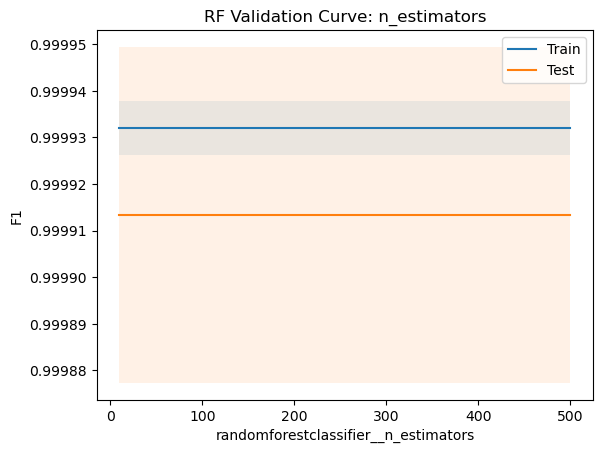

In [65]:
# Manual hyperparameter tuning because GridSearh
# Chosen values: 100 (Default)

n_est_size = [10, 100, 200, 300, 400, 500]

val_curve_nest = ValidationCurveDisplay.from_estimator(
    RF_v2,
    x_train_phi_RF,
    y_train_phi,
    param_name="randomforestclassifier__n_estimators",
    param_range=n_est_size,
    fill_between_kw={"alpha": 0.1},
    score_name="F1",
    scoring="f1",
    n_jobs=-1,
    error_score='raise'
)

_ = val_curve_nest.ax_.set(title="RF Validation Curve: n_estimators")

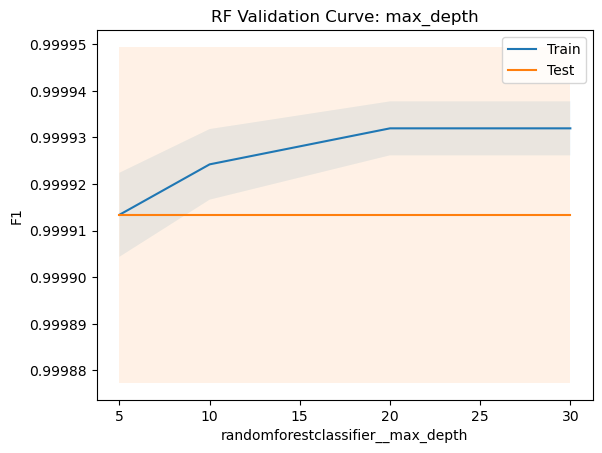

In [81]:
#Chosen values: 5, 10

mdepth_size = [5, 10, 20, 30]

val_curve_mdepth = ValidationCurveDisplay.from_estimator(
    RF_v2,
    x_train_phi_RF,
    y_train_phi,
    param_name="randomforestclassifier__max_depth",
    param_range=mdepth_size,
    fill_between_kw={"alpha": 0.1},
    score_name="F1",
    scoring="f1",
    n_jobs=-1,
)

_ = val_curve_mdepth.ax_.set(title="RF Validation Curve: max_depth")

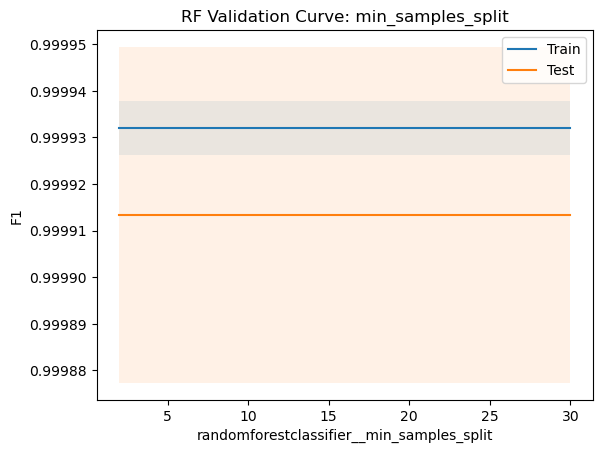

In [67]:
# Chosen values: 2 (Default), 10

minsplit_size = [2, 5, 10, 20, 30]

val_curve_minsplit = ValidationCurveDisplay.from_estimator(
    RF_v2,
    x_train_phi_RF,
    y_train_phi,
    param_name="randomforestclassifier__min_samples_split",
    param_range=minsplit_size,
    fill_between_kw={"alpha": 0.1},
    score_name="F1",
    scoring="f1",
    n_jobs=-1,
    error_score='raise'
)

_ = val_curve_minsplit.ax_.set(title="RF Validation Curve: min_samples_split")

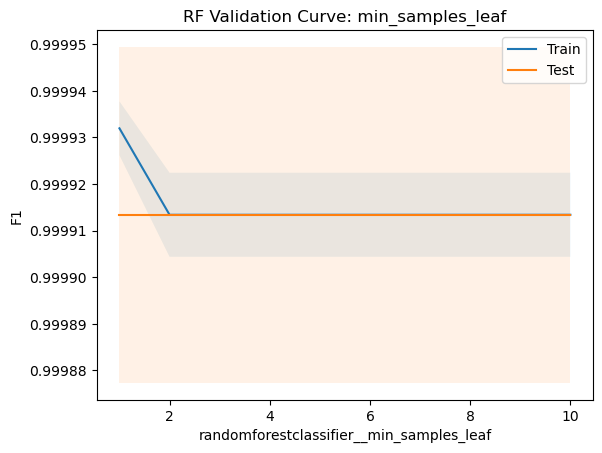

In [68]:
# Chosen values: 2 (Default)

minleaf_size = [1, 2, 5, 10]

val_curve_minleaf = ValidationCurveDisplay.from_estimator(
    RF_v2,
    x_train_phi_RF,
    y_train_phi,
    param_name="randomforestclassifier__min_samples_leaf",
    param_range=minleaf_size,
    fill_between_kw={"alpha": 0.1},
    score_name="F1",
    scoring="f1",
    n_jobs=-1,
    error_score='raise'
)

_ = val_curve_minleaf.ax_.set(title="RF Validation Curve: min_samples_leaf")

In [157]:
# Using default n_estimators, min_samples_leaf

RF_params = {
    'randomforestclassifier__max_depth': [5, 10],
    'randomforestclassifier__min_samples_split': [2, 10],
    'randomforestclassifier__max_features': ['sqrt', 'log2'],
}

RF_grid = GridSearchCV(RF_v2, param_grid=RF_params, scoring='f1', n_jobs=-1)

RF_grid_cv = cross_validate(RF_grid, x_train_phi_RF, y_train_phi, scoring='f1', cv=StratifiedKFold(), return_estimator=True, n_jobs=-1)

In [158]:
# Default parameters are best apart from max_depth = 5

best_params = []
for estimator in RF_grid_cv['estimator']:
    # For each estimator (the GridSearchCV of each fold), get the best parameters and score
    best_params.append(estimator.best_params_)
    best_params.append(estimator.best_score_)

best_params

[{'randomforestclassifier__max_depth': 5,
  'randomforestclassifier__max_features': 'sqrt',
  'randomforestclassifier__min_samples_split': 2},
 0.9999226604793199,
 {'randomforestclassifier__max_depth': 5,
  'randomforestclassifier__max_features': 'sqrt',
  'randomforestclassifier__min_samples_split': 2},
 0.9999071925751977,
 {'randomforestclassifier__max_depth': 5,
  'randomforestclassifier__max_features': 'sqrt',
  'randomforestclassifier__min_samples_split': 2},
 0.9998994589222299,
 {'randomforestclassifier__max_depth': 5,
  'randomforestclassifier__max_features': 'sqrt',
  'randomforestclassifier__min_samples_split': 2},
 0.9999226622737405,
 {'randomforestclassifier__max_depth': 5,
  'randomforestclassifier__max_features': 'sqrt',
  'randomforestclassifier__min_samples_split': 2},
 0.9999149268261902]

In [159]:
RF_grid_cv['test_score']

array([0.99987626, 0.99993813, 0.99996907, 0.99987625, 0.99990719])

#### 9.1.2 No URLSimilarityIndex

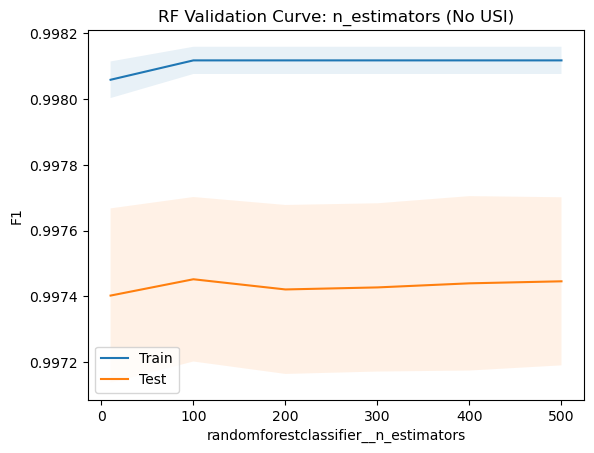

In [111]:
# Chosen values: 100 (Default)

n_est_size = [10, 100, 200, 300, 400, 500]

val_curve_rm_nest = ValidationCurveDisplay.from_estimator(
    RF_v2,
    x_train_phi_RF_rm_USI,
    y_train_phi,
    param_name="randomforestclassifier__n_estimators",
    param_range=n_est_size,
    fill_between_kw={"alpha": 0.1},
    score_name="F1",
    scoring="f1",
    n_jobs=-1,
    error_score='raise'
)

_ = val_curve_rm_nest.ax_.set(title="RF Validation Curve: n_estimators (No USI)")

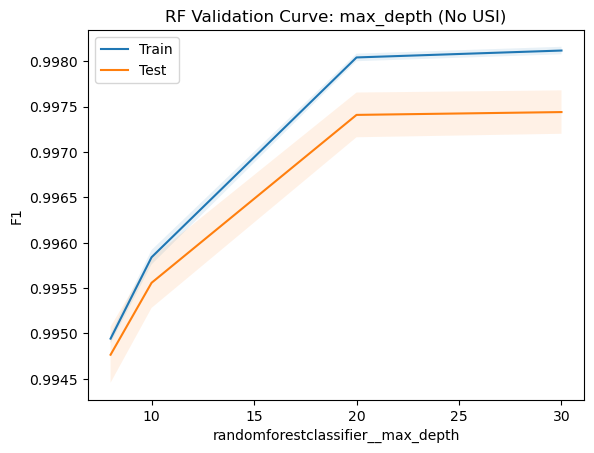

In [112]:
#Chosen values: 10, 20

mdepth_size = [8, 10, 20, 30]

val_curve_rm_mdepth = ValidationCurveDisplay.from_estimator(
    RF_v2,
    x_train_phi_RF_rm_USI,
    y_train_phi,
    param_name="randomforestclassifier__max_depth",
    param_range=mdepth_size,
    fill_between_kw={"alpha": 0.1},
    score_name="F1",
    scoring="f1",
    n_jobs=-1,
)

_ = val_curve_rm_mdepth.ax_.set(title="RF Validation Curve: max_depth (No USI)")

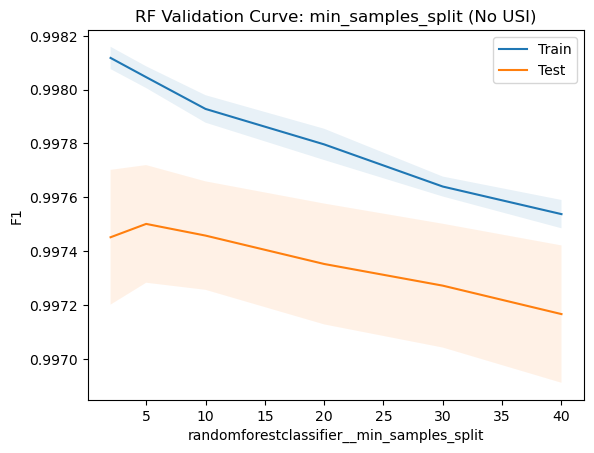

In [113]:
# Chosen values: 2 (Default), 5

minsplit_size = [2, 5, 10, 20, 30, 40]

val_curve_rm_minsplit = ValidationCurveDisplay.from_estimator(
    RF_v2,
    x_train_phi_RF_rm_USI,
    y_train_phi,
    param_name="randomforestclassifier__min_samples_split",
    param_range=minsplit_size,
    fill_between_kw={"alpha": 0.1},
    score_name="F1",
    scoring="f1",
    n_jobs=-1,
    error_score='raise'
)

_ = val_curve_rm_minsplit.ax_.set(title="RF Validation Curve: min_samples_split (No USI)")

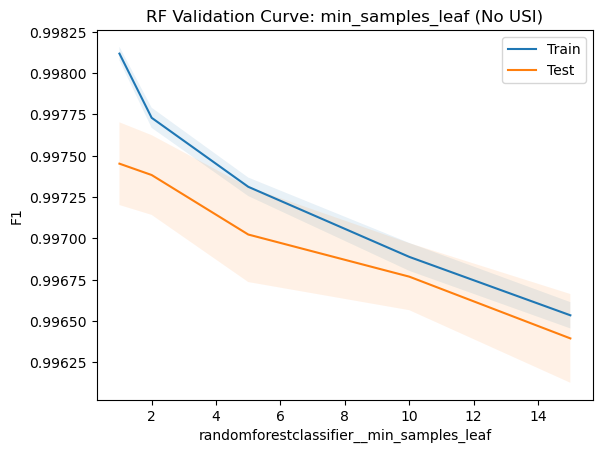

In [120]:
# Chosen values: 1, 2 (Default), 10

minleaf_size = [1, 2, 5, 10, 15]

val_curve_rm_minleaf = ValidationCurveDisplay.from_estimator(
    RF_v2,
    x_train_phi_RF_rm_USI,
    y_train_phi,
    param_name="randomforestclassifier__min_samples_leaf",
    param_range=minleaf_size,
    fill_between_kw={"alpha": 0.1},
    score_name="F1",
    scoring="f1",
    n_jobs=-1,
    error_score='raise'
)

_ = val_curve_rm_minleaf.ax_.set(title="RF Validation Curve: min_samples_leaf (No USI)")

In [95]:
# Using default values for n_estimators

RF_rm_params = {
    'randomforestclassifier__max_depth': [10, 20],
    'randomforestclassifier__min_samples_split': [2, 5],
    'randomforestclassifier__min_samples_leaf': [1, 2, 10],
    'randomforestclassifier__max_features': ['sqrt', 'log2'],
}

RF_rm_grid = GridSearchCV(RF_v2, param_grid=RF_rm_params, scoring='f1', n_jobs=-1)

RF_rm_grid_cv = cross_validate(RF_rm_grid, x_train_phi_RF_rm_USI, y_train_phi, scoring='f1', cv=StratifiedKFold(), return_estimator=True, n_jobs=-1)

In [96]:
# Default parameters are best apart from max_depth = 20 and min_samples_split = 5

best_params_rm = []
for estimator in RF_rm_grid_cv['estimator']:
    # For each estimator (the GridSearchCV of each fold), get the best parameters and score
    best_params_rm.append(estimator.best_params_)
    best_params_rm.append(estimator.best_score_)

best_params_rm

[{'randomforestclassifier__max_depth': 20,
  'randomforestclassifier__max_features': 'sqrt',
  'randomforestclassifier__min_samples_leaf': 1,
  'randomforestclassifier__min_samples_split': 5},
 0.997364917128667,
 {'randomforestclassifier__max_depth': 20,
  'randomforestclassifier__max_features': 'sqrt',
  'randomforestclassifier__min_samples_leaf': 1,
  'randomforestclassifier__min_samples_split': 5},
 0.9972950790495728,
 {'randomforestclassifier__max_depth': 20,
  'randomforestclassifier__max_features': 'sqrt',
  'randomforestclassifier__min_samples_leaf': 1,
  'randomforestclassifier__min_samples_split': 2},
 0.9974892422704634,
 {'randomforestclassifier__max_depth': 20,
  'randomforestclassifier__max_features': 'sqrt',
  'randomforestclassifier__min_samples_leaf': 1,
  'randomforestclassifier__min_samples_split': 5},
 0.9973880029821476,
 {'randomforestclassifier__max_depth': 20,
  'randomforestclassifier__max_features': 'sqrt',
  'randomforestclassifier__min_samples_leaf': 1,
  '

In [97]:
RF_rm_grid_cv['test_score']

array([0.99755122, 0.99773763, 0.99699271, 0.9974266 , 0.99742692])

### 9.2 Gaussian Naive Bayes

In [59]:
GNB_v2.get_params()

{'memory': None,
 'steps': [('standardscaler', StandardScaler()), ('gaussiannb', GaussianNB())],
 'verbose': False,
 'standardscaler': StandardScaler(),
 'gaussiannb': GaussianNB(),
 'standardscaler__copy': True,
 'standardscaler__with_mean': True,
 'standardscaler__with_std': True,
 'gaussiannb__priors': None,
 'gaussiannb__var_smoothing': 1e-09}

#### 9.2.1 With URLSimilarityIndex

AttributeError: 'list' object has no attribute 'min'

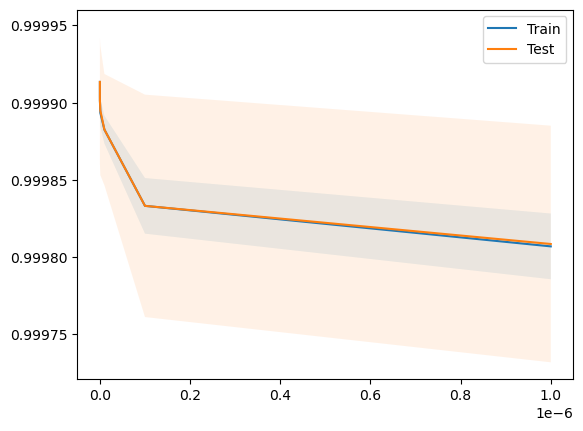

In [67]:
vsmooth_size = [1e-12, 1e-11, 1e-10, 1e-9, 1e-8, 1e-7, 1e-6]

val_curve_vsmooth = ValidationCurveDisplay.from_estimator(
    GNB_v2,
    x_train_phi_GNB,
    y_train_phi,
    param_name="gaussiannb__var_smoothing",
    param_range=vsmooth_size,
    fill_between_kw={"alpha": 0.1},
    score_name="F1",
    scoring="f1",
    n_jobs=-1,
)

_ = val_curve_vsmooth.ax_.set(title="GNB Validation Curve: var_smoothing")

In [87]:
GNB_params = {
    'gaussiannb__var_smoothing': [1e-12, 1e-11, 1e-10, 1e-9, 1e-8, 1e-7, 1e-6]
}

GNB_grid = GridSearchCV(GNB_v2, param_grid=GNB_params, scoring='f1', n_jobs=-1)

GNB_grid_cv = cross_validate(GNB_grid, x_train_phi_GNB, y_train_phi, scoring='f1', cv=StratifiedKFold(), return_estimator=True, n_jobs=-1)

In [107]:
# Chosen values: var_smoothing = 1e-12

GNB_best_params = []
for estimator in GNB_grid_cv['estimator']:
    # For each estimator (the GridSearchCV of each fold), get the best parameters and score
    GNB_best_params.append(estimator.best_params_)
    GNB_best_params.append(estimator.best_score_)

GNB_best_params

[{'gaussiannb__var_smoothing': 1e-12},
 0.9999226604793199,
 {'gaussiannb__var_smoothing': 1e-12},
 0.9999071925751977,
 {'gaussiannb__var_smoothing': 1e-12},
 0.9998994589222299,
 {'gaussiannb__var_smoothing': 1e-12},
 0.9999226622737405,
 {'gaussiannb__var_smoothing': 1e-12},
 0.9999149268261902]

In [109]:
GNB_grid_cv['test_score']

array([0.99987626, 0.99993813, 0.99996907, 0.99987625, 0.99990719])

#### 9.2.2 No URLSimilarityIndex

AttributeError: 'list' object has no attribute 'min'

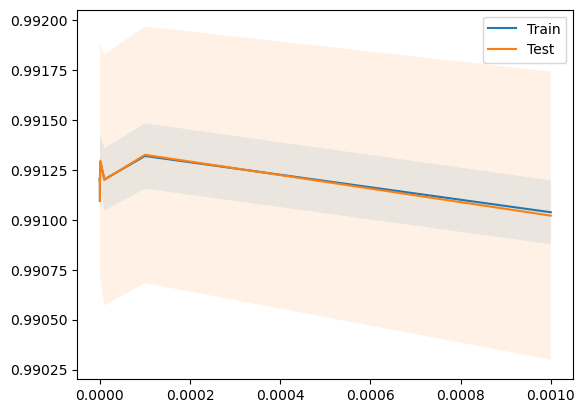

In [131]:
vsmooth_size = [1e-10, 1e-9, 1e-8, 1e-7, 1e-6, 1e-5, 1e-4, 1e-3]

val_curve_vsmooth = ValidationCurveDisplay.from_estimator(
    GNB_v2,
    x_train_phi_GNB_rm_USI,
    y_train_phi,
    param_name="gaussiannb__var_smoothing",
    param_range=vsmooth_size,
    fill_between_kw={"alpha": 0.1},
    score_name="F1",
    scoring="f1",
    n_jobs=-1,
    error_score='raise'
)

_ = val_curve_vsmooth.ax_.set(title="GNB Validation Curve: var_smoothing (No USI)")

In [133]:
GNB_rm_params = {
    'gaussiannb__var_smoothing': [1e-10, 1e-9, 1e-8, 1e-7, 1e-6, 1e-5, 1e-4, 1e-3]
}

GNB_rm_grid = GridSearchCV(GNB_v2, param_grid=GNB_rm_params, scoring='f1', n_jobs=-1)

GNB_rm_grid_cv = cross_validate(GNB_rm_grid, x_train_phi_GNB_rm_USI, y_train_phi, scoring='f1', cv=StratifiedKFold(), return_estimator=True, n_jobs=-1)

In [134]:
# Chosen values: var_smoothing = 1e-4

GNB_best_params_rm = []
for estimator in GNB_rm_grid_cv['estimator']:
    # For each estimator (the GridSearchCV of each fold), get the best parameters and score
    GNB_best_params_rm.append(estimator.best_params_)
    GNB_best_params_rm.append(estimator.best_score_)

GNB_best_params_rm

[{'gaussiannb__var_smoothing': 0.0001},
 0.9915866899577546,
 {'gaussiannb__var_smoothing': 1e-06},
 0.9911767941241056,
 {'gaussiannb__var_smoothing': 0.0001},
 0.9911557262449577,
 {'gaussiannb__var_smoothing': 0.0001},
 0.9914076814065031,
 {'gaussiannb__var_smoothing': 0.0001},
 0.9913833411620988]

In [135]:
GNB_rm_grid_cv['test_score']

array([0.99034328, 0.99180353, 0.99206818, 0.9910909 , 0.99112619])

### 9.3 Support Vector Machine

In [139]:
SVM_v2.get_params()

{'memory': None,
 'steps': [('standardscaler', StandardScaler()),
  ('svc', SVC(random_state=42))],
 'verbose': False,
 'standardscaler': StandardScaler(),
 'svc': SVC(random_state=42),
 'standardscaler__copy': True,
 'standardscaler__with_mean': True,
 'standardscaler__with_std': True,
 'svc__C': 1.0,
 'svc__break_ties': False,
 'svc__cache_size': 200,
 'svc__class_weight': None,
 'svc__coef0': 0.0,
 'svc__decision_function_shape': 'ovr',
 'svc__degree': 3,
 'svc__gamma': 'scale',
 'svc__kernel': 'rbf',
 'svc__max_iter': -1,
 'svc__probability': False,
 'svc__random_state': 42,
 'svc__shrinking': True,
 'svc__tol': 0.001,
 'svc__verbose': False}

#### 9.3.1 With URLSimilarityIndex

In [67]:
# End Result (With USI): Default parameters best except for kernel = linear, and C = 3.

SVM_v2_USI = make_pipeline(StandardScaler(), SVC(kernel='linear', C=3, random_state=42))

In [61]:
# Manual hyperparameter tuning performed using validation curves as GridSearch and RandomisedSearch are too hardware intensive and take too long.

SVM_params = {
    'svc__kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
}

SVM_grid = GridSearchCV(SVM_v2, param_grid=SVM_params, scoring='f1', n_jobs=12)

SVM_grid_cv = cross_validate(SVM_grid, x_train_phi_SVM, y_train_phi, scoring='f1', cv=StratifiedKFold(), return_estimator=True, n_jobs=12)

In [63]:
SVM_best_params = []
for estimator in SVM_grid_cv['estimator']:
    # For each estimator (the GridSearchCV of each fold), get the best parameters and score
    SVM_best_params.append(estimator.best_params_)
    SVM_best_params.append(estimator.best_score_)

SVM_best_params

[{'svc__kernel': 'linear'},
 0.99987625018688,
 {'svc__kernel': 'linear'},
 0.9998685171319597,
 {'svc__kernel': 'linear'},
 0.9998839862323159,
 {'svc__kernel': 'linear'},
 0.9998994577257878,
 {'svc__kernel': 'linear'},
 0.9998994559309742]

In [117]:
SVM_v2_poly = make_pipeline(StandardScaler(), SVC(kernel='poly', random_state=42))

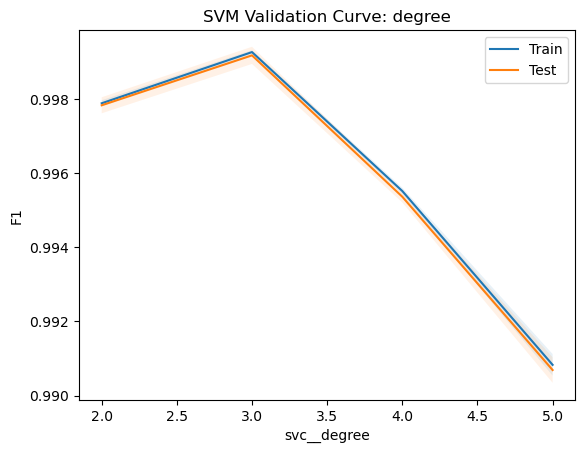

In [119]:
# Chosen values: linear, as poly uses degree = 3 by default.

degree_size = [2, 3, 4, 5]

val_curve_degree = ValidationCurveDisplay.from_estimator(
    SVM_v2_poly,
    x_train_phi_SVM,
    y_train_phi,
    param_name="svc__degree",
    param_range=degree_size,
    fill_between_kw={"alpha": 0.1},
    score_name="F1",
    scoring="f1",
    n_jobs=-1,
)

_ = val_curve_degree.ax_.set(title="SVM Validation Curve: degree")

In [65]:
SVM_v2 = make_pipeline(StandardScaler(), SVC(kernel='linear', random_state=42))

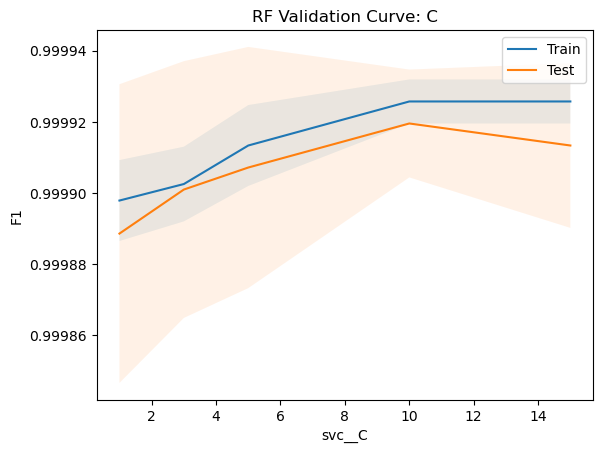

In [71]:
# Chosen values: 3

c_size = [1, 3, 5, 10, 15]

val_curve_c = ValidationCurveDisplay.from_estimator(
    SVM_v2,
    x_train_phi_SVM,
    y_train_phi,
    param_name="svc__C",
    param_range=c_size,
    fill_between_kw={"alpha": 0.1},
    score_name="F1",
    scoring="f1",
    n_jobs=-1,
)

_ = val_curve_c.ax_.set(title="SVM Validation Curve: C")

In [73]:
SVM_v2 = make_pipeline(StandardScaler(), SVC(kernel='linear', C=3, random_state=42))

AttributeError: 'list' object has no attribute 'min'

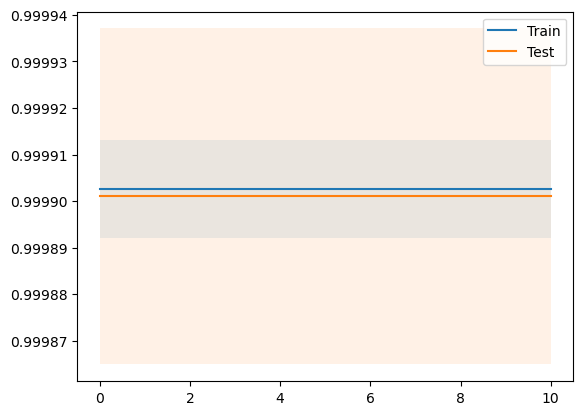

In [81]:
# Chosen values: scale (Default)

gamma_size = [0.001, 0.01, 0.1, 1, 10]

val_curve_gamma = ValidationCurveDisplay.from_estimator(
    SVM_v2,
    x_train_phi_SVM,
    y_train_phi,
    param_name="svc__gamma",
    param_range=gamma_size,
    fill_between_kw={"alpha": 0.1},
    score_name="F1",
    scoring="f1",
    n_jobs=-1,
)

_ = val_curve_gamma.ax_.set(title="SVM Validation Curve: gamma")

In [77]:
SVM_params = {
    'svc__gamma': ['scale', 'auto', 0.001, 0.01, 0.1, 1, 10],
}

SVM_grid = GridSearchCV(SVM_v2, param_grid=SVM_params, scoring='f1', n_jobs=12)

SVM_grid_cv = cross_validate(SVM_grid, x_train_phi_SVM, y_train_phi, scoring='f1', cv=StratifiedKFold(), return_estimator=True, n_jobs=12)

In [79]:
# Chosen value: scale (default)

SVM_best_params = []
for estimator in SVM_grid_cv['estimator']:
    # For each estimator (the GridSearchCV of each fold), get the best parameters and score
    SVM_best_params.append(estimator.best_params_)
    SVM_best_params.append(estimator.best_score_)

SVM_best_params

[{'svc__gamma': 'scale'},
 0.9998994553331115,
 {'svc__gamma': 'scale'},
 0.9998917222781912,
 {'svc__gamma': 'scale'},
 0.9998839862323159,
 {'svc__gamma': 'scale'},
 0.9998994577258571,
 {'svc__gamma': 'scale'},
 0.9999071907802686]

#### 9.3.2 No URLSimilarityIndex

In [65]:
# End Result: Default parameters best except for C = 3.

SVM_v2_rm_USI = make_pipeline(StandardScaler(), SVC(C=3, random_state=42))

In [85]:
SVM_v2 = make_pipeline(StandardScaler(), SVC(random_state=42))

In [87]:
# Chosen value = rbf (Default)

SVM_params = {
    'svc__kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
}

SVM_rm_USI_grid = GridSearchCV(SVM_v2, param_grid=SVM_params, scoring='f1', n_jobs=12)

SVM_rm_USI_grid_cv = cross_validate(SVM_rm_USI_grid, x_train_phi_SVM_rm_USI, y_train_phi, scoring='f1', cv=StratifiedKFold(), 
                                    return_estimator=True, n_jobs=12)

In [91]:
# Chosen values: rbf

SVM_best_params_rm = []
for estimator in SVM_rm_USI_grid_cv['estimator']:
    # For each estimator (the GridSearchCV of each fold), get the best parameters and score
    SVM_best_params_rm.append(estimator.best_params_)
    SVM_best_params_rm.append(estimator.best_score_)

SVM_best_params_rm

[{'svc__kernel': 'rbf'},
 0.9968817339501473,
 {'svc__kernel': 'rbf'},
 0.9968584382355742,
 {'svc__kernel': 'rbf'},
 0.9969595094567362,
 {'svc__kernel': 'rbf'},
 0.9968738843981312,
 {'svc__kernel': 'rbf'},
 0.9969440856940477]

In [59]:
SVM_v2_poly = make_pipeline(StandardScaler(), SVC(kernel='poly', random_state=42))

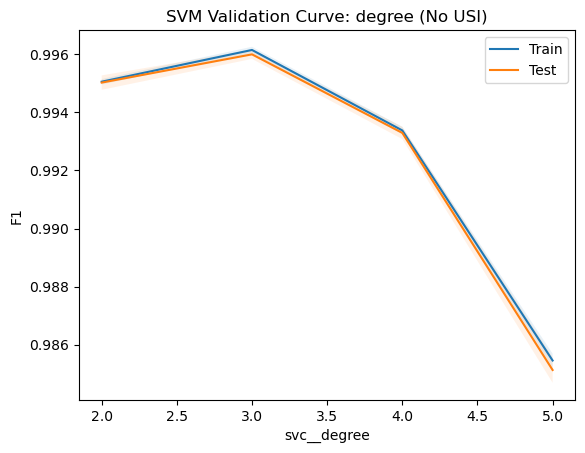

In [61]:
# Chosen values: rbf (Default), as poly uses degree = 3 by default.

degree_size = [2, 3, 4, 5]

val_curve_rm_degree = ValidationCurveDisplay.from_estimator(
    SVM_v2_poly,
    x_train_phi_SVM_rm_USI,
    y_train_phi,
    param_name="svc__degree",
    param_range=degree_size,
    fill_between_kw={"alpha": 0.1},
    score_name="F1",
    scoring="f1",
    n_jobs=-1,
)

_ = val_curve_rm_degree.ax_.set(title="SVM Validation Curve: degree (No USI)")

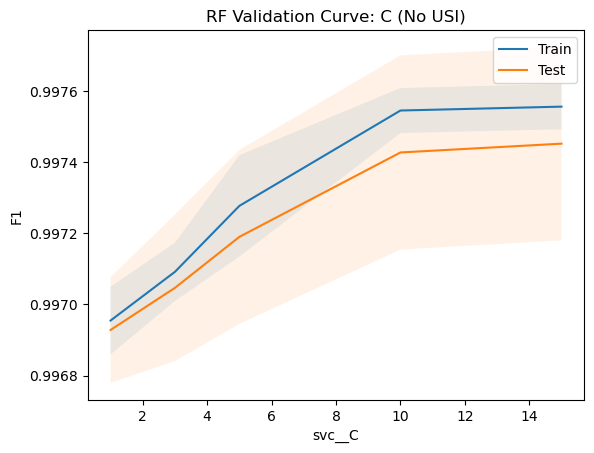

In [93]:
# Chosen value = 10.
c_size = [1, 3, 5, 10, 15]

val_curve_rm_c = ValidationCurveDisplay.from_estimator(
    SVM_v2,
    x_train_phi_SVM_rm_USI,
    y_train_phi,
    param_name="svc__C",
    param_range=c_size,
    fill_between_kw={"alpha": 0.1},
    score_name="F1",
    scoring="f1",
    n_jobs=-1,
)

_ = val_curve_rm_c.ax_.set(title="SVM Validation Curve: C (No USI)")

In [59]:
SVM_v2 = make_pipeline(StandardScaler(), SVC(C=10, random_state=42))

AttributeError: 'list' object has no attribute 'min'

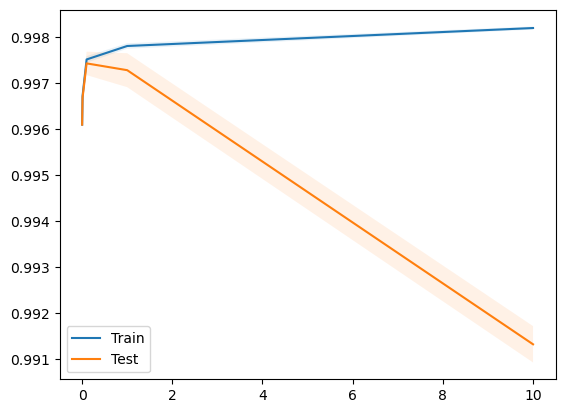

In [63]:
gamma_size = [0.001, 0.01, 0.1, 1, 10]

val_curve_rm_gamma = ValidationCurveDisplay.from_estimator(
    SVM_v2,
    x_train_phi_SVM_rm_USI,
    y_train_phi,
    param_name="svc__gamma",
    param_range=gamma_size,
    fill_between_kw={"alpha": 0.1},
    score_name="F1",
    scoring="f1",
    n_jobs=-1,
    error_score='raise'
)

_ = val_curve_rm_gamma.ax_.set(title="SVM Validation Curve: gamma (No USI)")

AttributeError: 'list' object has no attribute 'min'

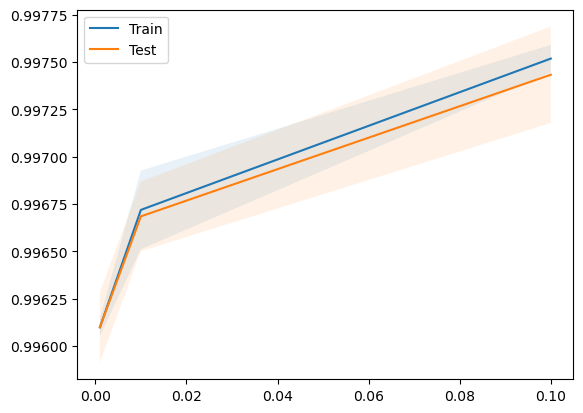

In [61]:
gamma_size = [0.001, 0.01, 0.1]

val_curve_rm_gamma = ValidationCurveDisplay.from_estimator(
    SVM_v2,
    x_train_phi_SVM_rm_USI,
    y_train_phi,
    param_name="svc__gamma",
    param_range=gamma_size,
    fill_between_kw={"alpha": 0.1},
    score_name="F1",
    scoring="f1",
    n_jobs=-1,
)

_ = val_curve_rm_gamma.ax_.set(title="SVM Validation Curve: gamma (No USI)")

In [ ]:
SVM_params_rm = {
    'svc__gamma': ['scale', 'auto', 0.001, 0.01, 0.1],
}

SVM_rm_USI_grid = GridSearchCV(SVM_v2, param_grid=SVM_params_rm, scoring='f1', n_jobs=12)

SVM_rm_USI_grid_cv = cross_validate(SVM_rm_USI_grid, x_train_phi_SVM_rm_USI, y_train_phi, scoring='f1', cv=StratifiedKFold(), 
                                    return_estimator=True, n_jobs=12)

In [62]:
# Chosen value: scale (Default)

SVM_best_params_rm = []
for estimator in SVM_rm_USI_grid_cv['estimator']:
    # For each estimator (the GridSearchCV of each fold), get the best parameters and score
    SVM_best_params_rm.append(estimator.best_params_)
    SVM_best_params_rm.append(estimator.best_score_)

SVM_best_params_rm

[{'svc__gamma': 'scale'},
 0.9970450363432237,
 {'svc__gamma': 'scale'},
 0.9970140364389934,
 {'svc__gamma': 'scale'},
 0.9971773662657959,
 {'svc__gamma': 'scale'},
 0.9970218563631115,
 {'svc__gamma': 'scale'},
 0.997006312319812]

## 10. Hyperparameter Tuning (ISCXURL-2016)

### 10.1 Random Forest

In [69]:
RF_ISCX.get_params()

{'memory': None,
 'steps': [('standardscaler', StandardScaler()),
  ('randomforestclassifier',
   RandomForestClassifier(n_jobs=-1, random_state=42))],
 'verbose': False,
 'standardscaler': StandardScaler(),
 'randomforestclassifier': RandomForestClassifier(n_jobs=-1, random_state=42),
 'standardscaler__copy': True,
 'standardscaler__with_mean': True,
 'standardscaler__with_std': True,
 'randomforestclassifier__bootstrap': True,
 'randomforestclassifier__ccp_alpha': 0.0,
 'randomforestclassifier__class_weight': None,
 'randomforestclassifier__criterion': 'gini',
 'randomforestclassifier__max_depth': None,
 'randomforestclassifier__max_features': 'sqrt',
 'randomforestclassifier__max_leaf_nodes': None,
 'randomforestclassifier__max_samples': None,
 'randomforestclassifier__min_impurity_decrease': 0.0,
 'randomforestclassifier__min_samples_leaf': 1,
 'randomforestclassifier__min_samples_split': 2,
 'randomforestclassifier__min_weight_fraction_leaf': 0.0,
 'randomforestclassifier__n_estim

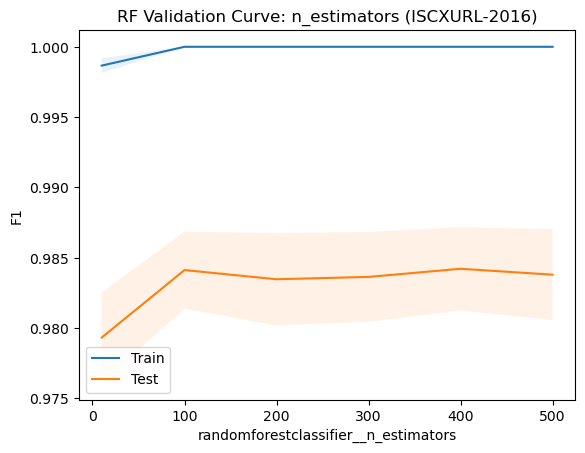

In [71]:
#Validation Curves used to determine ranges to be used for Grid Search
# Chosen values: 100 (Default)

n_est_size = [10, 100, 200, 300, 400, 500]

val_curve_ISCX_nest = ValidationCurveDisplay.from_estimator(
    RF_ISCX,
    x_train_ISCX_RF2,
    y_train_ISCX,
    param_name="randomforestclassifier__n_estimators",
    param_range=n_est_size,
    fill_between_kw={"alpha": 0.1},
    score_name="F1",
    scoring="f1",
    n_jobs=-1,
)

_ = val_curve_ISCX_nest.ax_.set(title="RF Validation Curve: n_estimators (ISCXURL-2016)")

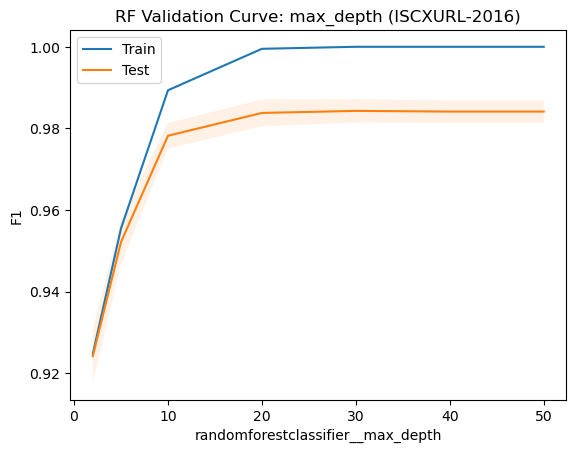

In [89]:
# Chosen values: 10, 20

mdepth_size = minsplit_size = [2, 5, 10, 20, 30, 40, 50]

val_curve_ISCX_mdepth = ValidationCurveDisplay.from_estimator(
    RF_ISCX,
    x_train_ISCX_RF2,
    y_train_ISCX,
    param_name="randomforestclassifier__max_depth",
    param_range=mdepth_size,
    fill_between_kw={"alpha": 0.1},
    score_name="F1",
    scoring="f1",
    n_jobs=-1,
)

_ = val_curve_ISCX_mdepth.ax_.set(title="RF Validation Curve: max_depth (ISCXURL-2016)")

AttributeError: 'list' object has no attribute 'min'

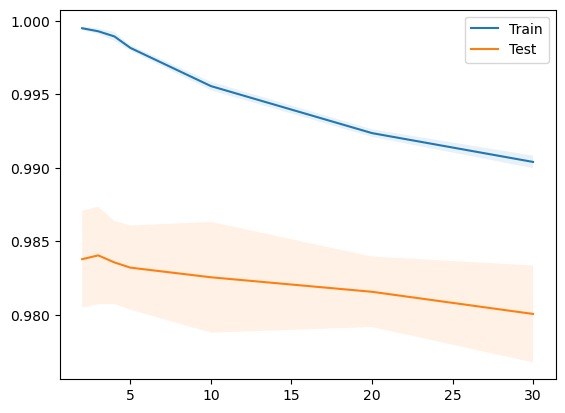

In [263]:
# Chosen values: 2 (Default), 5

minsplit_size = [2, 3, 4, 5, 10, 20, 30]

val_curve_ISCX_minsplit = ValidationCurveDisplay.from_estimator(
    RF_ISCX,
    x_train_ISCX_RF2,
    y_train_ISCX,
    param_name="randomforestclassifier__min_samples_split",
    param_range=minsplit_size,
    fill_between_kw={"alpha": 0.1},
    score_name="F1",
    scoring="f1",
    n_jobs=-1,
)

_ = val_curve_ISCX_minsplit.ax_.set(title="RF Validation Curve: min_samples_split (ISCXURL-2016)")

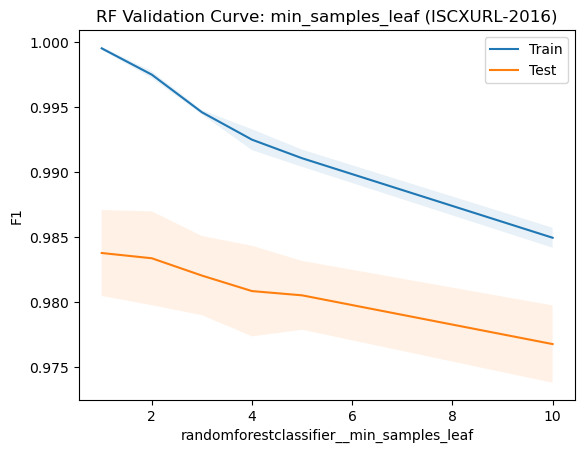

In [110]:
# Chosen values: 1, 2 (Default), 3, 4, 5

minleaf_size = [1, 2, 3, 4, 5, 10]

val_curve_ISCX_minleaf = ValidationCurveDisplay.from_estimator(
    RF_ISCX,
    x_train_ISCX_RF2,
    y_train_ISCX,
    param_name="randomforestclassifier__min_samples_leaf",
    param_range=minleaf_size,
    fill_between_kw={"alpha": 0.1},
    score_name="F1",
    scoring="f1",
    n_jobs=-1,
)

_ = val_curve_ISCX_minleaf.ax_.set(title="RF Validation Curve: min_samples_leaf (ISCXURL-2016)")

In [265]:
# Using default n_estimators

RF_params_ISCX = {
    'randomforestclassifier__max_depth': [10, 20],
    'randomforestclassifier__min_samples_split': [2, 3, 4, 5],
    'randomforestclassifier__min_samples_leaf': [1, 2, 5],
    'randomforestclassifier__max_features': ['sqrt', 'log2'],
}

RF_grid_ISCX = GridSearchCV(RF_ISCX, param_grid=RF_params_ISCX, scoring='f1', n_jobs=-1)

RF_grid_ISCX_cv = cross_validate(RF_grid_ISCX, x_train_ISCX_RF2, y_train_ISCX, scoring='f1', cv=StratifiedKFold(), return_estimator=True, n_jobs=-1)

In [267]:
# Best parameters are max_depth = 20, max_features = log2, min_samples_leaf = 1, min_samples_split = 3

best_params_ISCX_RF = []
for estimator in RF_grid_ISCX_cv['estimator']:
    # For each estimator (the GridSearchCV of each fold), get the best parameters and score
    best_params_ISCX_RF.append(estimator.best_params_)
    best_params_ISCX_RF.append(estimator.best_score_)

best_params_ISCX_RF

[{'randomforestclassifier__max_depth': 20,
  'randomforestclassifier__max_features': 'log2',
  'randomforestclassifier__min_samples_leaf': 1,
  'randomforestclassifier__min_samples_split': 2},
 0.9819027205571345,
 {'randomforestclassifier__max_depth': 20,
  'randomforestclassifier__max_features': 'sqrt',
  'randomforestclassifier__min_samples_leaf': 1,
  'randomforestclassifier__min_samples_split': 3},
 0.9833387087560694,
 {'randomforestclassifier__max_depth': 20,
  'randomforestclassifier__max_features': 'sqrt',
  'randomforestclassifier__min_samples_leaf': 1,
  'randomforestclassifier__min_samples_split': 5},
 0.9833628772137605,
 {'randomforestclassifier__max_depth': 20,
  'randomforestclassifier__max_features': 'log2',
  'randomforestclassifier__min_samples_leaf': 1,
  'randomforestclassifier__min_samples_split': 3},
 0.9834587068799958,
 {'randomforestclassifier__max_depth': 20,
  'randomforestclassifier__max_features': 'log2',
  'randomforestclassifier__min_samples_leaf': 1,
  

In [269]:
RF_grid_ISCX_cv['test_score']

array([0.98675497, 0.98470442, 0.97979381, 0.98760331, 0.98215027])

### 10.2 Gaussian Naive Bayes

In [99]:
GNB_ISCX.get_params()

{'memory': None,
 'steps': [('standardscaler', StandardScaler()), ('gaussiannb', GaussianNB())],
 'verbose': False,
 'standardscaler': StandardScaler(),
 'gaussiannb': GaussianNB(),
 'standardscaler__copy': True,
 'standardscaler__with_mean': True,
 'standardscaler__with_std': True,
 'gaussiannb__priors': None,
 'gaussiannb__var_smoothing': 1e-09}

AttributeError: 'list' object has no attribute 'min'

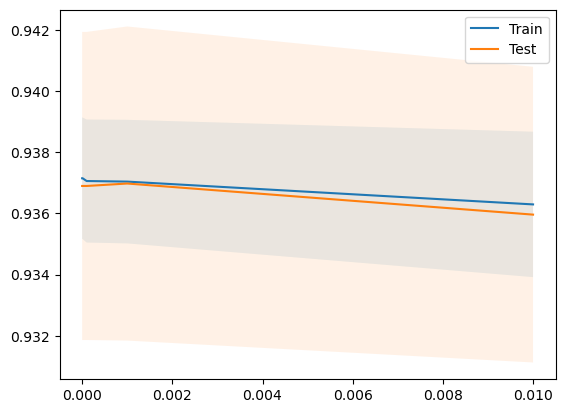

In [344]:
vsmooth_size = [1e-11, 1e-10, 1e-9, 1e-8, 1e-7, 1e-6, 1e-5, 1e-4, 1e-3, 1e-2]

val_curve_ISCX_vsmooth = ValidationCurveDisplay.from_estimator(
    GNB_ISCX,
    x_train_ISCX_GNB,
    y_train_ISCX,
    param_name="gaussiannb__var_smoothing",
    param_range=vsmooth_size,
    fill_between_kw={"alpha": 0.1},
    score_name="F1",
    scoring="f1",
    n_jobs=-1,
)

_ = val_curve_ISCX_vsmooth.ax_.set(title="GNB Validation Curve: var_smoothing (ISCXURL-2016)")

In [131]:
GNB_params_ISCX = {
    'gaussiannb__var_smoothing': [1e-11, 1e-10, 1e-9, 1e-8, 1e-7, 1e-6, 1e-5, 1e-4, 1e-3, 1e-2]
}

GNB_grid_ISCX = GridSearchCV(GNB_ISCX, param_grid=GNB_params_ISCX, scoring='f1', n_jobs=-1)

GNB_grid_ISCX_cv = cross_validate(GNB_grid_ISCX, x_train_ISCX_GNB2, y_train_ISCX, scoring='f1', cv=StratifiedKFold(), return_estimator=True, n_jobs=-1)

In [133]:
# Chosen values: var_smoothing = 1e-2

GNB_best_params_ISCX = []
for estimator in GNB_grid_ISCX_cv['estimator']:
    # For each estimator (the GridSearchCV of each fold), get the best parameters and score
    GNB_best_params_ISCX.append(estimator.best_params_)
    GNB_best_params_ISCX.append(estimator.best_score_)

GNB_best_params_ISCX

[{'gaussiannb__var_smoothing': 0.01},
 0.934964864454366,
 {'gaussiannb__var_smoothing': 0.01},
 0.9393746374773373,
 {'gaussiannb__var_smoothing': 0.01},
 0.9371066962312078,
 {'gaussiannb__var_smoothing': 0.001},
 0.9333015897381527,
 {'gaussiannb__var_smoothing': 0.001},
 0.9388047524181603]

In [135]:
GNB_grid_ISCX_cv['test_score']

array([0.94240401, 0.92869128, 0.93853821, 0.94078675, 0.93155259])

### 10.3 Support Vector Machine

In [137]:
SVM_ISCX.get_params()

{'memory': None,
 'steps': [('standardscaler', StandardScaler()),
  ('svc', SVC(random_state=42))],
 'verbose': False,
 'standardscaler': StandardScaler(),
 'svc': SVC(random_state=42),
 'standardscaler__copy': True,
 'standardscaler__with_mean': True,
 'standardscaler__with_std': True,
 'svc__C': 1.0,
 'svc__break_ties': False,
 'svc__cache_size': 200,
 'svc__class_weight': None,
 'svc__coef0': 0.0,
 'svc__decision_function_shape': 'ovr',
 'svc__degree': 3,
 'svc__gamma': 'scale',
 'svc__kernel': 'rbf',
 'svc__max_iter': -1,
 'svc__probability': False,
 'svc__random_state': 42,
 'svc__shrinking': True,
 'svc__tol': 0.001,
 'svc__verbose': False}

In [115]:
# End Result: Default parameters best except for C=4 and gamma=0.1

SVM_ISCX = make_pipeline(StandardScaler(), SVC(C=4, gamma=0.1, random_state=42))

In [141]:
# Manual hyperparameter tuning performed using validation curves as GridSearch and RandomisedSearch are too hardware intensive and take too long.

SVM_params_ISCX = {
    'svc__kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
}

SVM_grid_ISCX = GridSearchCV(SVM_ISCX, param_grid=SVM_params_ISCX, scoring='f1', n_jobs=12)

SVM_grid_ISCX_cv = cross_validate(SVM_grid_ISCX, x_train_ISCX_SVM3, y_train_ISCX, scoring='f1', cv=StratifiedKFold(), return_estimator=True, n_jobs=12)

In [143]:
# Chosen value: rbf (Default)

SVM_best_params_ISCX = []
for estimator in SVM_grid_ISCX_cv['estimator']:
    # For each estimator (the GridSearchCV of each fold), get the best parameters and score
    SVM_best_params_ISCX.append(estimator.best_params_)
    SVM_best_params_ISCX.append(estimator.best_score_)

SVM_best_params_ISCX

[{'svc__kernel': 'rbf'},
 0.9686405192084994,
 {'svc__kernel': 'rbf'},
 0.97036658880065,
 {'svc__kernel': 'rbf'},
 0.9712115805391326,
 {'svc__kernel': 'rbf'},
 0.9693288691703013,
 {'svc__kernel': 'rbf'},
 0.9720183631494546]

In [ ]:
SVM_ISCX_poly = make_pipeline(StandardScaler(), SVC(kernel='poly', random_state=42))

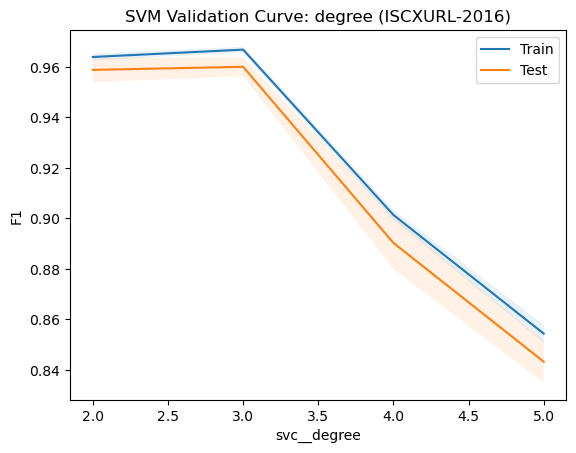

In [105]:
degree_size = [2, 3, 4, 5]

val_curve_ISCX_degree = ValidationCurveDisplay.from_estimator(
    SVM_ISCX_poly,
    x_train_ISCX_SVM3,
    y_train_ISCX,
    param_name="svc__degree",
    param_range=degree_size,
    fill_between_kw={"alpha": 0.1},
    score_name="F1",
    scoring="f1",
    n_jobs=-1,
)

_ = val_curve_ISCX_degree.ax_.set(title="SVM Validation Curve: degree (ISCXURL-2016)")

In [111]:
SVM_params_ISCX = {
    'svc__kernel': ['poly', 'rbf'],
    'svc__degree': [2, 3],
}

SVM_grid_ISCX = GridSearchCV(SVM_ISCX, param_grid=SVM_params_ISCX, scoring='f1', n_jobs=12)

SVM_grid_ISCX_cv = cross_validate(SVM_grid_ISCX, x_train_ISCX_SVM3, y_train_ISCX, scoring='f1', cv=StratifiedKFold(), return_estimator=True, n_jobs=12)

In [113]:
# Chosen value: rbf (Default)

SVM_best_params_ISCX = []
for estimator in SVM_grid_ISCX_cv['estimator']:
    # For each estimator (the GridSearchCV of each fold), get the best parameters and score
    SVM_best_params_ISCX.append(estimator.best_params_)
    SVM_best_params_ISCX.append(estimator.best_score_)

SVM_best_params_ISCX

[{'svc__degree': 2, 'svc__kernel': 'rbf'},
 0.9686405192084994,
 {'svc__degree': 2, 'svc__kernel': 'rbf'},
 0.97036658880065,
 {'svc__degree': 2, 'svc__kernel': 'rbf'},
 0.9712115805391326,
 {'svc__degree': 2, 'svc__kernel': 'rbf'},
 0.9693288691703013,
 {'svc__degree': 2, 'svc__kernel': 'rbf'},
 0.9720183631494546]

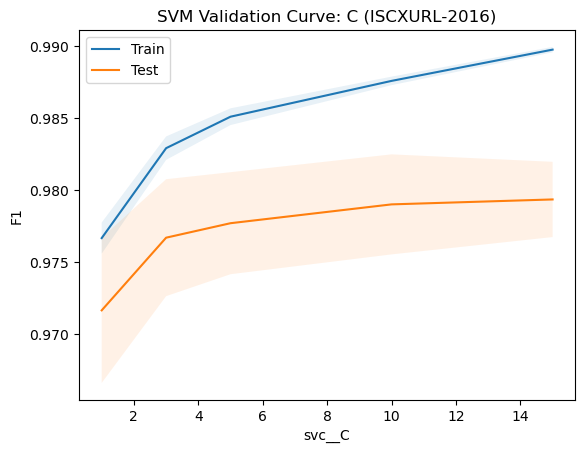

In [145]:
c_size = [1, 3, 5, 10, 15]

val_curve_ISCX_c = ValidationCurveDisplay.from_estimator(
    SVM_ISCX,
    x_train_ISCX_SVM3,
    y_train_ISCX,
    param_name="svc__C",
    param_range=c_size,
    fill_between_kw={"alpha": 0.1},
    score_name="F1",
    scoring="f1",
    n_jobs=-1,
)

_ = val_curve_ISCX_c.ax_.set(title="SVM Validation Curve: C (ISCXURL-2016)")

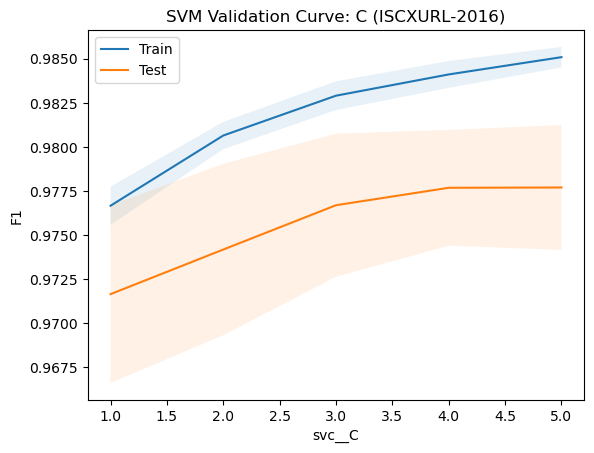

In [147]:
# Chosen values: 4

c_size = [1, 2, 3, 4, 5]

val_curve_ISCX_c = ValidationCurveDisplay.from_estimator(
    SVM_ISCX,
    x_train_ISCX_SVM3,
    y_train_ISCX,
    param_name="svc__C",
    param_range=c_size,
    fill_between_kw={"alpha": 0.1},
    score_name="F1",
    scoring="f1",
    n_jobs=-1,
)

_ = val_curve_ISCX_c.ax_.set(title="SVM Validation Curve: C (ISCXURL-2016)")

In [57]:
SVM_ISCX = make_pipeline(StandardScaler(), SVC(C=4, random_state=42))

AttributeError: 'list' object has no attribute 'min'

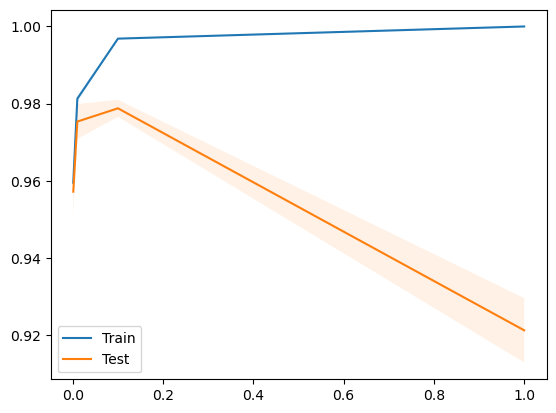

In [59]:
gamma_size = [0.001, 0.01, 0.1, 1]

val_curve_ISCX_gamma = ValidationCurveDisplay.from_estimator(
    SVM_ISCX,
    x_train_ISCX_SVM3,
    y_train_ISCX,
    param_name="svc__gamma",
    param_range=gamma_size,
    fill_between_kw={"alpha": 0.1},
    score_name="F1",
    scoring="f1",
    n_jobs=-1,
)

_ = val_curve_ISCX_gamma.ax_.set(title="SVM Validation Curve: gamma (ISCXURL-2016)")

In [61]:
SVM_params_ISCX = {
    'svc__gamma': ['scale', 'auto', 0.001, 0.01, 0.1],
}

SVM_grid_ISCX = GridSearchCV(SVM_ISCX, param_grid=SVM_params_ISCX, scoring='f1', n_jobs=12)

SVM_grid_ISCX_cv = cross_validate(SVM_grid_ISCX, x_train_ISCX_SVM3, y_train_ISCX, scoring='f1', cv=StratifiedKFold(), return_estimator=True, n_jobs=12)

In [63]:
# Chosen value: 0.1

SVM_best_params_ISCX = []
for estimator in SVM_grid_ISCX_cv['estimator']:
    # For each estimator (the GridSearchCV of each fold), get the best parameters and score
    SVM_best_params_ISCX.append(estimator.best_params_)
    SVM_best_params_ISCX.append(estimator.best_score_)

SVM_best_params_ISCX

[{'svc__gamma': 0.1},
 0.9754517018053657,
 {'svc__gamma': 0.1},
 0.9763495343350451,
 {'svc__gamma': 'scale'},
 0.9770478754972081,
 {'svc__gamma': 0.1},
 0.9770533004397937,
 {'svc__gamma': 0.01},
 0.9765528475936371]

## 11. Final Post-Hyperparameter Tuning Evaluation (PhiUSIIL)

In [106]:
# Final models being evaluated

RF_v2_phi = make_pipeline(StandardScaler(), RandomForestClassifier(max_depth=5, random_state=42, n_jobs=-1))
GNB_v2_phi = make_pipeline(StandardScaler(), GaussianNB(var_smoothing=1e-12))
SVM_v2_phi = make_pipeline(StandardScaler(), SVC(kernel='linear', C=3, random_state=42))

# URLSimilarityIndex removed.

RF_v2_phi_rm_USI = make_pipeline(StandardScaler(), RandomForestClassifier(max_depth=20, min_samples_split=5, random_state=42, n_jobs=-1))
GNB_v2_phi_rm_USI = make_pipeline(StandardScaler(), GaussianNB(var_smoothing=1e-4))
SVM_v2_phi_rm_USI = make_pipeline(StandardScaler(), SVC(C=10, random_state=42))


### 11.a Post-Hyperparameter Tuning Accuracy Graphs

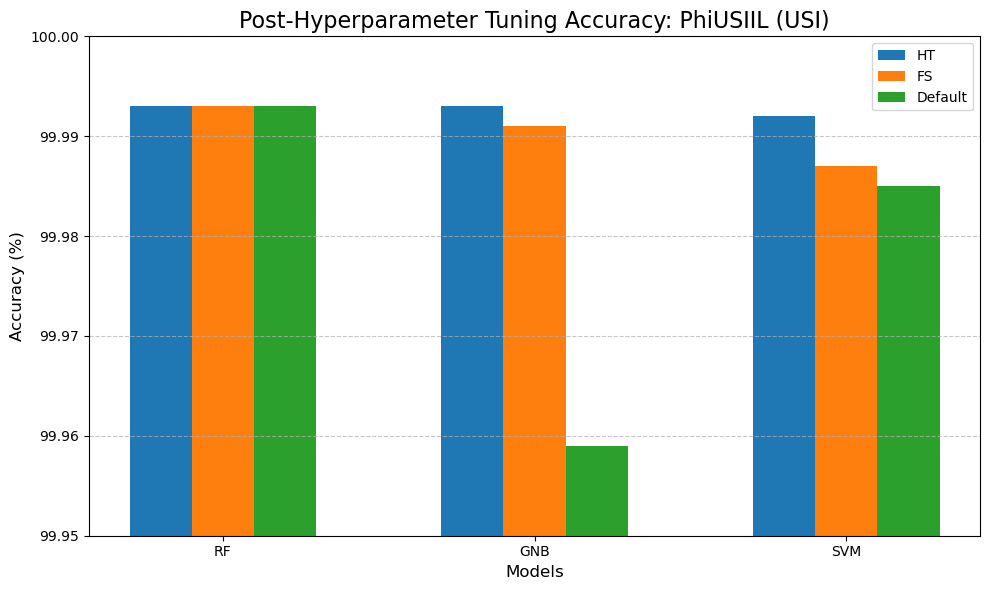

In [182]:
# Metrics for the models
models = ["RF", 'GNB', 'SVM']
ht = [99.993, 99.993, 99.992]
fs = [99.993, 99.991 , 99.987]
default = [99.993 , 99.959 , 99.985]

# Combine metrics into a single data structure
metrics = [ht, fs, default]
metric_names = ['HT', 'FS', 'Default']

# Bar chart properties
x = np.arange(len(models))  # x positions for groups
width = 0.2  # Width of each bar

# Create the plot
fig, ax = plt.subplots(figsize=(10, 6))

# Plot each metric as a group of bars
for i, metric in enumerate(metrics):
    ax.bar(x + i * width, metric, width, label=metric_names[i])

# Formatting the chart
ax.set_title('Post-Hyperparameter Tuning Accuracy: PhiUSIIL (USI)', fontsize=16)
ax.set_xlabel('Models', fontsize=12)
ax.set_ylabel('Accuracy (%)', fontsize=12)
ax.set_xticks(x + width)  # Center the group labels
ax.set_xticklabels(models, fontsize=10)
ax.legend(loc='upper right', fontsize=10)
ax.set_ylim(99.950, 100)  # Assuming metric scores are between 0 and 1

# Add gridlines for better readability
ax.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot
plt.tight_layout()
plt.show()

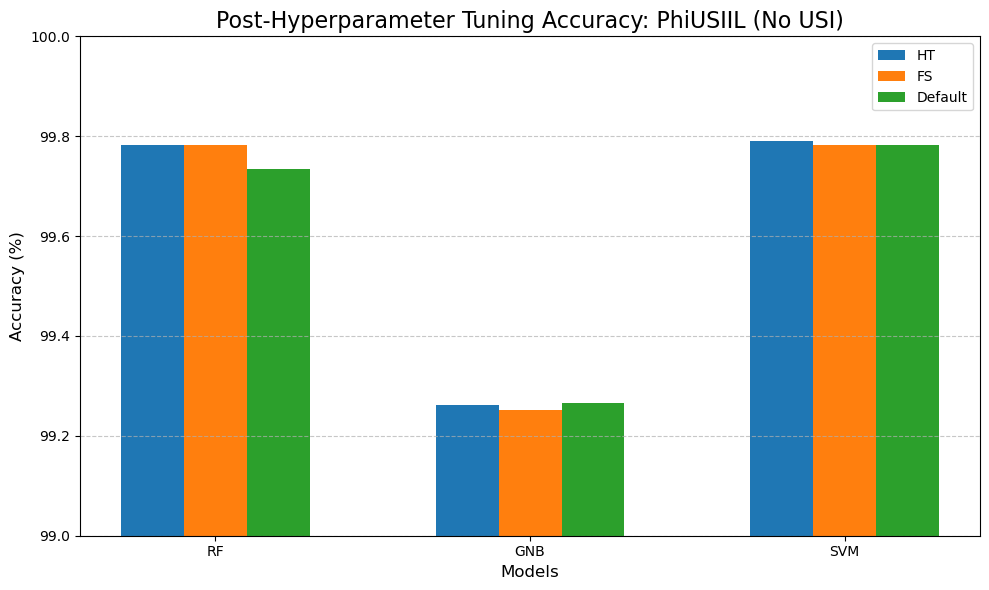

In [184]:
# Metrics for the models
models = ["RF", 'GNB', 'SVM']
ht = [99.783, 99.262, 99.790]
fs = [99.782 , 99.251, 99.783]
default = [99.735, 99.265, 99.783 ]

# Combine metrics into a single data structure
metrics = [ht, fs, default]
metric_names = ['HT', 'FS', 'Default']

# Bar chart properties
x = np.arange(len(models))  # x positions for groups
width = 0.2  # Width of each bar

# Create the plot
fig, ax = plt.subplots(figsize=(10, 6))

# Plot each metric as a group of bars
for i, metric in enumerate(metrics):
    ax.bar(x + i * width, metric, width, label=metric_names[i])

# Formatting the chart
ax.set_title('Post-Hyperparameter Tuning Accuracy: PhiUSIIL (No USI)', fontsize=16)
ax.set_xlabel('Models', fontsize=12)
ax.set_ylabel('Accuracy (%)', fontsize=12)
ax.set_xticks(x + width)  # Center the group labels
ax.set_xticklabels(models, fontsize=10)
ax.legend(loc='upper right', fontsize=10)
ax.set_ylim(99, 100)  # Assuming metric scores are between 0 and 1

# Add gridlines for better readability
ax.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot
plt.tight_layout()
plt.show()

### 11.b Final Evaluation Graphs

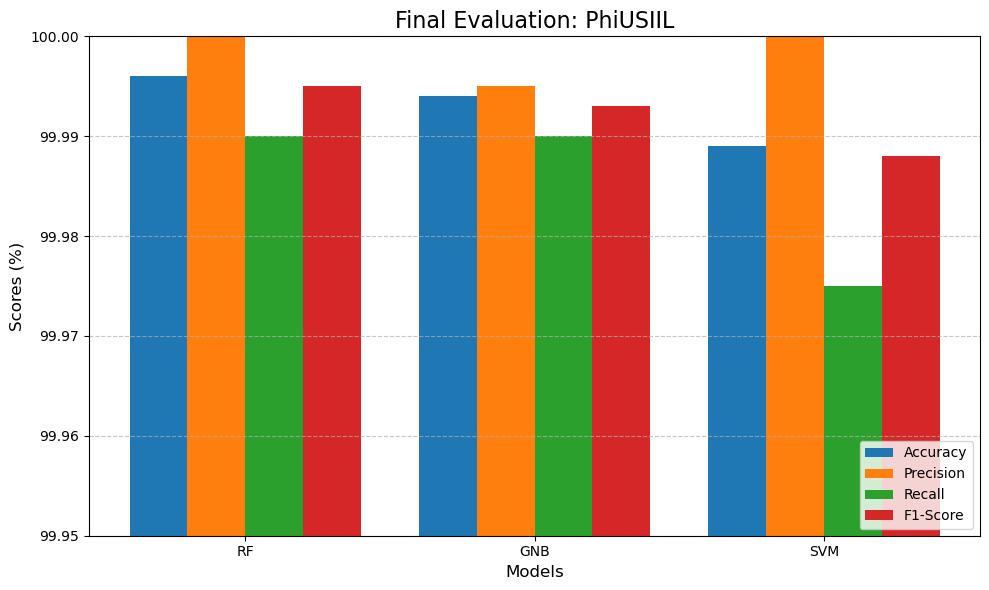

In [244]:
# Metrics for the models
models = ["RF", 'GNB', 'SVM']
accuracy = [99.996, 99.994, 99.989]
precision = [100, 99.995, 100]
recall = [99.990, 99.990, 99.975]
f1_score = [99.995, 99.993, 99.988]

# Combine metrics into a single data structure
metrics = [accuracy, precision, recall, f1_score]
metric_names = ['Accuracy', 'Precision', 'Recall', 'F1-Score']

# Bar chart properties
x = np.arange(len(models))  # x positions for groups
width = 0.2  # Width of each bar

# Create the plot
fig, ax = plt.subplots(figsize=(10, 6))

# Plot each metric as a group of bars
for i, metric in enumerate(metrics):
    ax.bar(x + i * width, metric, width, label=metric_names[i])

# Formatting the chart
ax.set_title('Final Evaluation: PhiUSIIL', fontsize=16)
ax.set_xlabel('Models', fontsize=12)
ax.set_ylabel('Scores (%)', fontsize=12)
ax.set_xticks(x + 1.5 * width)  # Center the group labels
ax.set_xticklabels(models, fontsize=10)
ax.legend(loc='lower right', fontsize=10)
ax.set_ylim(99.950, 100)  # Assuming metric scores are between 0 and 1

# Add gridlines for better readability
ax.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot
plt.tight_layout()
plt.show()

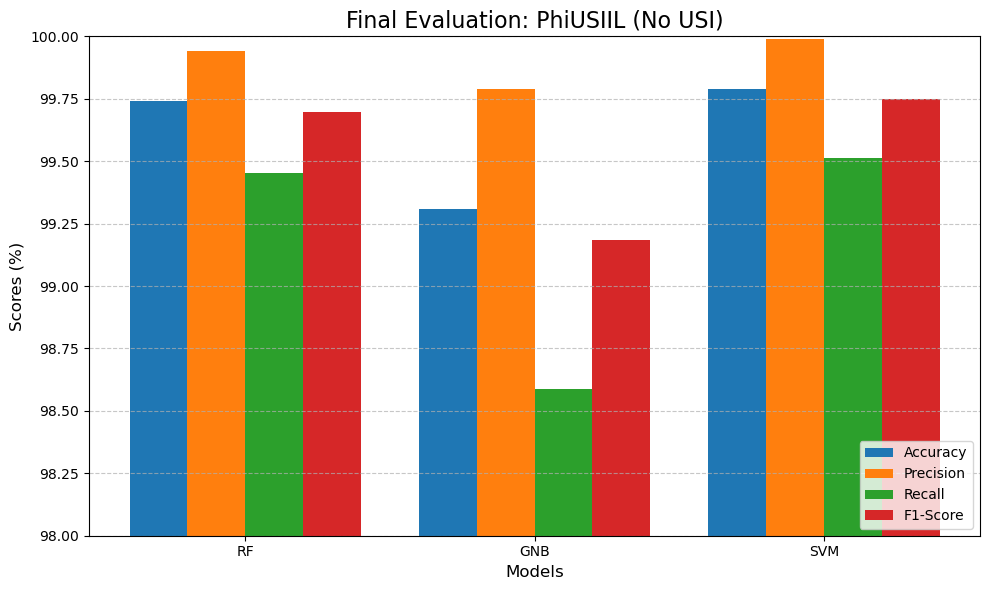

In [188]:
# Metrics for the models
models = ["RF", 'GNB', 'SVM']
accuracy = [99.741, 99.308, 99.788]
precision = [99.940, 99.789, 99.990]
recall = [99.453, 98.589, 99.512]
f1_score = [99.696, 99.185, 99.751]

# Combine metrics into a single data structure
metrics = [accuracy, precision, recall, f1_score]
metric_names = ['Accuracy', 'Precision', 'Recall', 'F1-Score']

# Bar chart properties
x = np.arange(len(models))  # x positions for groups
width = 0.2  # Width of each bar

# Create the plot
fig, ax = plt.subplots(figsize=(10, 6))

# Plot each metric as a group of bars
for i, metric in enumerate(metrics):
    ax.bar(x + i * width, metric, width, label=metric_names[i])

# Formatting the chart
ax.set_title('Final Evaluation: PhiUSIIL (No USI)', fontsize=16)
ax.set_xlabel('Models', fontsize=12)
ax.set_ylabel('Scores (%)', fontsize=12)
ax.set_xticks(x + 1.5 * width)  # Center the group labels
ax.set_xticklabels(models, fontsize=10)
ax.legend(loc='lower right', fontsize=10)
ax.set_ylim(98, 100)  # Assuming metric scores are between 0 and 1

# Add gridlines for better readability
ax.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot
plt.tight_layout()
plt.show()

### 11.1 Random Forest

#### 11.1.1 With URLSimilarityIndex

label
0    107815
1     80821
Name: count, dtype: int64

Results on entire training set:
RF Accuracy: 0.9999257831580675 ± 3.091071541276589e-05
RF Precision: 1.0 ± 0.0
RF Recall: 0.999826778612326 ± 7.214423766641956e-05
RF F1: 0.999913380502582 ± 3.6077895440676326e-05


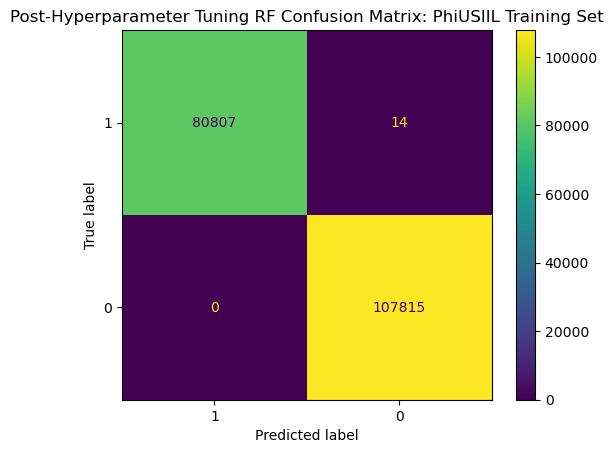

In [108]:
# Post hyperparameter tuning evaluation on entire training set. Refer to Section 8.

print(y_train_phi.value_counts())

RF_v2_cv = cross_validate(RF_v2_phi, x_train_phi_RF, y_train_phi, cv=StratifiedKFold(), scoring=scoring, n_jobs=-1, error_score='raise')

RF_v2_cv_pred = cross_val_predict(RF_v2_phi, x_train_phi_RF, y_train_phi, cv=StratifiedKFold(), n_jobs=-1)

print("\nResults on entire training set:")
print(f"RF Accuracy: {RF_v2_cv['test_accuracy'].mean()} ± {RF_v2_cv['test_accuracy'].std()}")
print(f"RF Precision: {RF_v2_cv['test_precision'].mean()} ± {RF_v2_cv['test_precision'].std()}")
print(f"RF Recall: {RF_v2_cv['test_recall'].mean()} ± {RF_v2_cv['test_recall'].std()}")
print(f"RF F1: {RF_v2_cv['test_f1'].mean()} ± {RF_v2_cv['test_f1'].std()}")

RF_v2_cv_cm = ConfusionMatrixDisplay.from_predictions(y_train_phi, RF_v2_cv_pred, values_format='d', labels=[1, 0], display_labels=[1, 0])
_ = RF_v2_cv_cm.ax_.set(title="Post-Hyperparameter Tuning RF Confusion Matrix: PhiUSIIL Training Set")

In [237]:
# Split training and testing sets
# Training and testing sets are shuffled at the start to ensure randomness.
# Temp set is shuffled every train_test_split call.

train_indices = np.random.permutation(len(x_train_phi_RF))

x_train_phi_RF_shuffle = x_train_phi_RF.iloc[train_indices]
y_train_phi_RF_shuffle = y_train_phi.iloc[train_indices]

test_indices = np.random.permutation(len(x_test_phi_RF))

x_test_phi_RF_shuffle = x_test_phi_RF.iloc[test_indices]
y_test_phi_shuffle = y_test_phi.iloc[test_indices]

# Each subset is 20% of the training set.
# Splitting Training set

x_train_phi_RF_1, x_temp, y_train_phi_RF_1, y_temp = train_test_split(x_train_phi_RF_shuffle, y_train_phi_RF_shuffle, test_size=0.8, random_state=100)

# 2nd split is 25% of x_temp, which is 25% of 80% of the original training set. Meaning, 2nd split is 20% of the original training set.
x_train_phi_RF_2, x_temp, y_train_phi_RF_2, y_temp = train_test_split(x_temp, y_temp, test_size=0.75, random_state=101)

# 3rd split = 33.33% of 60% of original training set.
x_train_phi_RF_3, x_temp, y_train_phi_RF_3, y_temp = train_test_split(x_temp, y_temp, test_size=0.6666, random_state=102)

# 4th and 5th split = 50% of 40% of original training set.
x_train_phi_RF_4, x_train_phi_RF_5, y_train_phi_RF_4, y_train_phi_RF_5 = train_test_split(x_temp, y_temp, test_size=0.5, random_state=103)

# Splitting Testing set

x_test_phi_RF_1, x_temp, y_test_phi_RF_1, y_temp = train_test_split(x_test_phi_RF_shuffle, y_test_phi_shuffle, test_size=0.8, random_state=104)
x_test_phi_RF_2, x_temp, y_test_phi_RF_2, y_temp = train_test_split(x_temp, y_temp, test_size=0.75, random_state=105)
x_test_phi_RF_3, x_temp, y_test_phi_RF_3, y_temp = train_test_split(x_temp, y_temp, test_size=0.6666, random_state=106)
x_test_phi_RF_4, x_test_phi_RF_5, y_test_phi_RF_4, y_test_phi_RF_5 = train_test_split(x_temp, y_temp, test_size=0.5, random_state=107)

In [277]:
RF_eval_1 = RF_v2_phi.fit(x_train_phi_RF_1, y_train_phi_RF_1)

RF_eval_pred_1 = RF_eval_1.predict(x_test_phi_RF_1)

RF_eval_pred_cr_1 = classification_report(y_test_phi_RF_1, RF_eval_pred_1, output_dict=True)

RF_eval_pred_cr_1

{'0': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 5414.0},
 '1': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 4017.0},
 'accuracy': 1.0,
 'macro avg': {'precision': 1.0,
  'recall': 1.0,
  'f1-score': 1.0,
  'support': 9431.0},
 'weighted avg': {'precision': 1.0,
  'recall': 1.0,
  'f1-score': 1.0,
  'support': 9431.0}}

In [278]:
RF_eval_2 = RF_v2_phi.fit(x_train_phi_RF_2, y_train_phi_RF_2)

RF_eval_pred_2 = RF_eval_2.predict(x_test_phi_RF_2)

RF_eval_pred_cr_2 = classification_report(y_test_phi_RF_2, RF_eval_pred_2, output_dict=True)

RF_eval_pred_cr_2

{'0': {'precision': 0.9998142299832807,
  'recall': 1.0,
  'f1-score': 0.9999071063632142,
  'support': 5382.0},
 '1': {'precision': 1.0,
  'recall': 0.9997530864197531,
  'f1-score': 0.9998765279664156,
  'support': 4050.0},
 'accuracy': 0.9998939779474131,
 'macro avg': {'precision': 0.9999071149916403,
  'recall': 0.9998765432098766,
  'f1-score': 0.9998918171648149,
  'support': 9432.0},
 'weighted avg': {'precision': 0.9998939976431316,
  'recall': 0.9998939779474131,
  'f1-score': 0.999893976326421,
  'support': 9432.0}}

In [280]:
RF_eval_3 = RF_v2_phi.fit(x_train_phi_RF_3, y_train_phi_RF_3)

RF_eval_pred_3 = RF_eval_3.predict(x_test_phi_RF_3)

RF_eval_pred_cr_3 = classification_report(y_test_phi_RF_3, RF_eval_pred_3, output_dict=True)

RF_eval_pred_cr_3

{'0': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 5389.0},
 '1': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 4044.0},
 'accuracy': 1.0,
 'macro avg': {'precision': 1.0,
  'recall': 1.0,
  'f1-score': 1.0,
  'support': 9433.0},
 'weighted avg': {'precision': 1.0,
  'recall': 1.0,
  'f1-score': 1.0,
  'support': 9433.0}}

In [281]:
RF_eval_4 = RF_v2_phi.fit(x_train_phi_RF_4, y_train_phi_RF_4)

RF_eval_pred_4 = RF_eval_4.predict(x_test_phi_RF_4)

RF_eval_pred_cr_4 = classification_report(y_test_phi_RF_4, RF_eval_pred_4, output_dict=True)

RF_eval_pred_cr_4

{'0': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 5382.0},
 '1': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 4049.0},
 'accuracy': 1.0,
 'macro avg': {'precision': 1.0,
  'recall': 1.0,
  'f1-score': 1.0,
  'support': 9431.0},
 'weighted avg': {'precision': 1.0,
  'recall': 1.0,
  'f1-score': 1.0,
  'support': 9431.0}}

In [285]:
RF_eval_5 = RF_v2_phi.fit(x_train_phi_RF_5, y_train_phi_RF_5)

RF_eval_pred_5 = RF_eval_5.predict(x_test_phi_RF_5)

RF_eval_pred_cr_5 = classification_report(y_test_phi_RF_5, RF_eval_pred_5, output_dict=True)

RF_eval_pred_cr_5

{'0': {'precision': 0.9998171512159444,
  'recall': 1.0,
  'f1-score': 0.9999085672487885,
  'support': 5468.0},
 '1': {'precision': 1.0,
  'recall': 0.9997477295660948,
  'f1-score': 0.9998738488709473,
  'support': 3964.0},
 'accuracy': 0.9998939779474131,
 'macro avg': {'precision': 0.9999085756079722,
  'recall': 0.9998738647830474,
  'f1-score': 0.9998912080598679,
  'support': 9432.0},
 'weighted avg': {'precision': 0.9998939973334164,
  'recall': 0.9998939779474131,
  'f1-score': 0.9998939761069562,
  'support': 9432.0}}


Final evaluation results:
RF Accuracy: 0.9999575911789652 ± 5.193998606409498e-05
RF Precision: 1.0 ± 0.0
RF Recall: 0.9999001631971696 ± 0.00012228634587397387
RF F1: 0.9999500753674726 ± 6.115080665657454e-05


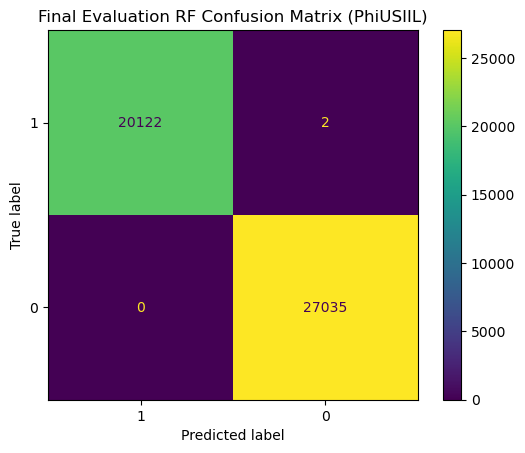

In [287]:
# '1' is the positive label corresponding to Phishing. All respective metrics will be in relation to '1'.

RF_accuracy = np.array([RF_eval_pred_cr_1['accuracy'], RF_eval_pred_cr_2['accuracy'], RF_eval_pred_cr_3['accuracy'], RF_eval_pred_cr_4['accuracy'],
              RF_eval_pred_cr_5['accuracy']])
RF_precision = np.array([RF_eval_pred_cr_1['1']['precision'], RF_eval_pred_cr_2['1']['precision'], RF_eval_pred_cr_3['1']['precision'],
               RF_eval_pred_cr_4['1']['precision'], RF_eval_pred_cr_5['1']['precision']])
RF_recall = np.array([RF_eval_pred_cr_1['1']['recall'], RF_eval_pred_cr_2['1']['recall'], RF_eval_pred_cr_3['1']['recall'], 
                      RF_eval_pred_cr_4['1']['recall'], RF_eval_pred_cr_5['1']['recall']])
RF_f1 = np.array([RF_eval_pred_cr_1['1']['f1-score'], RF_eval_pred_cr_2['1']['f1-score'], RF_eval_pred_cr_3['1']['f1-score'], 
                  RF_eval_pred_cr_4['1']['f1-score'], RF_eval_pred_cr_5['1']['f1-score']])

print("\nFinal evaluation results:")
print(f"RF Accuracy: {RF_accuracy.mean()} ± {RF_accuracy.std()}")
print(f"RF Precision: {RF_precision.mean()} ± {RF_precision.std()}")
print(f"RF Recall: {RF_recall.mean()} ± {RF_recall.std()}")
print(f"RF F1: {RF_f1.mean()} ± {RF_f1.std()}")

RF_eval_preds = np.concatenate([RF_eval_pred_1, RF_eval_pred_2, RF_eval_pred_3, RF_eval_pred_4, RF_eval_pred_5])
y_test_phi_RF_all = np.concatenate([y_test_phi_RF_1, y_test_phi_RF_2, y_test_phi_RF_3, y_test_phi_RF_4, y_test_phi_RF_5])

RF_eval_cv_cm = ConfusionMatrixDisplay.from_predictions(y_test_phi_RF_all, RF_eval_preds, values_format='d', 
                                                        labels=[1, 0], display_labels=[1, 0])
_ = RF_eval_cv_cm.ax_.set(title="Final Evaluation RF Confusion Matrix (PhiUSIIL)")

#### 11.1.2 No URLSimilarityIndex

label
0    107815
1     80821
Name: count, dtype: int64

Results on entire training set:
RF Accuracy: 0.9978265014124397 ± 0.00017260108764553857
RF Precision: 0.9996520272039389 ± 8.433008783078335e-05
RF Recall: 0.9952735038083584 ± 0.00036623551797340204
RF F1: 0.9974579302555971 ± 0.00020227698016639752


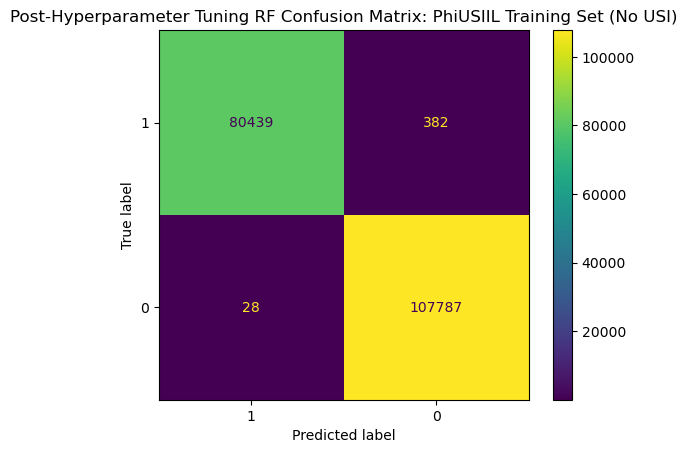

In [110]:
# Post hyperparameter tuning evaluation on entire training set. Refer to Section 8.

print(y_train_phi.value_counts())

RF_v2_cv = cross_validate(RF_v2_phi_rm_USI, x_train_phi_RF_rm_USI, y_train_phi, cv=StratifiedKFold(), scoring=scoring, n_jobs=-1, error_score='raise')

RF_v2_cv_pred = cross_val_predict(RF_v2_phi_rm_USI, x_train_phi_RF_rm_USI, y_train_phi, cv=StratifiedKFold(), n_jobs=-1)

print("\nResults on entire training set:")
print(f"RF Accuracy: {RF_v2_cv['test_accuracy'].mean()} ± {RF_v2_cv['test_accuracy'].std()}")
print(f"RF Precision: {RF_v2_cv['test_precision'].mean()} ± {RF_v2_cv['test_precision'].std()}")
print(f"RF Recall: {RF_v2_cv['test_recall'].mean()} ± {RF_v2_cv['test_recall'].std()}")
print(f"RF F1: {RF_v2_cv['test_f1'].mean()} ± {RF_v2_cv['test_f1'].std()}")

RF_v2_cv_cm = ConfusionMatrixDisplay.from_predictions(y_train_phi, RF_v2_cv_pred, values_format='d', labels=[1, 0], display_labels=[1, 0])
_ = RF_v2_cv_cm.ax_.set(title="Post-Hyperparameter Tuning RF Confusion Matrix: PhiUSIIL Training Set (No USI)")

In [309]:
# Split training and testing sets
# Training and testing sets are shuffled at the start to ensure randomness.
# Temp set is shuffled every train_test_split call.

train_indices = np.random.permutation(len(x_train_phi_RF_rm_USI))

x_train_phi_RF_rm_USI_shuffle = x_train_phi_RF_rm_USI.iloc[train_indices]
y_train_phi_RF_rm_USI_shuffle = y_train_phi.iloc[train_indices]

test_indices = np.random.permutation(len(x_test_phi_RF_rm_USI))

x_test_phi_RF_rm_USI_shuffle = x_test_phi_RF_rm_USI.iloc[test_indices]
y_test_phi_RF_rm_USI_shuffle = y_test_phi.iloc[test_indices]

# Each subset is 20% of the training set.
# Splitting Training set

x_train_phi_RF_rm_USI_1, x_temp, y_train_phi_RF_rm_USI_1, y_temp = train_test_split(x_train_phi_RF_rm_USI_shuffle, y_train_phi_RF_rm_USI_shuffle, 
                                                                             test_size=0.8, random_state=100)

# 2nd split is 25% of x_temp, which is 25% of 80% of the original training set. Meaning, 2nd split is 20% of the original training set.
x_train_phi_RF_rm_USI_2, x_temp, y_train_phi_RF_rm_USI_2, y_temp = train_test_split(x_temp, y_temp, test_size=0.75, random_state=101)

# 3rd split = 33.33% of 60% of original training set.
x_train_phi_RF_rm_USI_3, x_temp, y_train_phi_RF_rm_USI_3, y_temp = train_test_split(x_temp, y_temp, test_size=0.6666, random_state=102)

# 4th and 5th split = 50% of 40% of original training set.
x_train_phi_RF_rm_USI_4, x_train_phi_RF_rm_USI_5, y_train_phi_RF_rm_USI_4, y_train_phi_RF_rm_USI_5 = train_test_split(x_temp, y_temp, test_size=0.5, 
                                                                                                                      random_state=103)

# Splitting Testing set

x_test_phi_RF_rm_USI_1, x_temp, y_test_phi_RF_rm_USI_1, y_temp = train_test_split(x_test_phi_RF_rm_USI_shuffle, y_test_phi_RF_rm_USI_shuffle, 
                                                                                  test_size=0.8, random_state=104)
x_test_phi_RF_rm_USI_2, x_temp, y_test_phi_RF_rm_USI_2, y_temp = train_test_split(x_temp, y_temp, test_size=0.75, random_state=105)
x_test_phi_RF_rm_USI_3, x_temp, y_test_phi_RF_rm_USI_3, y_temp = train_test_split(x_temp, y_temp, test_size=0.6666, random_state=106)
x_test_phi_RF_rm_USI_4, x_test_phi_RF_rm_USI_5, y_test_phi_RF_rm_USI_4, y_test_phi_RF_rm_USI_5 = train_test_split(x_temp, y_temp, test_size=0.5, 
                                                                                                                  random_state=107)

In [311]:
RF_eval_rm_USI_1 = RF_v2_phi_rm_USI.fit(x_train_phi_RF_rm_USI_1, y_train_phi_RF_rm_USI_1)

RF_eval_rm_USI_pred_1 = RF_eval_rm_USI_1.predict(x_test_phi_RF_rm_USI_1)

RF_eval_rm_USI_pred_cr_1 = classification_report(y_test_phi_RF_rm_USI_1, RF_eval_rm_USI_pred_1, output_dict=True)

RF_eval_rm_USI_pred_cr_1

{'0': {'precision': 0.9960850111856824,
  'recall': 0.999812874251497,
  'f1-score': 0.997945461337318,
  'support': 5344.0},
 '1': {'precision': 0.9997541185148758,
  'recall': 0.9948617567898214,
  'f1-score': 0.9973019376992887,
  'support': 4087.0},
 'accuracy': 0.9976672675220019,
 'macro avg': {'precision': 0.9979195648502791,
  'recall': 0.9973373155206592,
  'f1-score': 0.9976236995183033,
  'support': 9431.0},
 'weighted avg': {'precision': 0.9976750484727583,
  'recall': 0.9976672675220019,
  'f1-score': 0.9976665851726879,
  'support': 9431.0}}

In [313]:
RF_eval_rm_USI_2 = RF_v2_phi_rm_USI.fit(x_train_phi_RF_rm_USI_2, y_train_phi_RF_rm_USI_2)

RF_eval_rm_USI_pred_2 = RF_eval_rm_USI_2.predict(x_test_phi_RF_rm_USI_2)

RF_eval_rm_USI_pred_cr_2 = classification_report(y_test_phi_RF_rm_USI_2, RF_eval_rm_USI_pred_2, output_dict=True)

RF_eval_rm_USI_pred_cr_2

{'0': {'precision': 0.9955841766329346,
  'recall': 0.9994458810491319,
  'f1-score': 0.9975112913632592,
  'support': 5414.0},
 '1': {'precision': 0.9992494370778083,
  'recall': 0.9940268790443006,
  'f1-score': 0.9966313162819712,
  'support': 4018.0},
 'accuracy': 0.9971374045801527,
 'macro avg': {'precision': 0.9974168068553715,
  'recall': 0.9967363800467163,
  'f1-score': 0.9970713038226152,
  'support': 9432.0},
 'weighted avg': {'precision': 0.9971455651473008,
  'recall': 0.9971374045801527,
  'f1-score': 0.997136424964127,
  'support': 9432.0}}

In [315]:
RF_eval_rm_USI_3 = RF_v2_phi_rm_USI.fit(x_train_phi_RF_rm_USI_3, y_train_phi_RF_rm_USI_3)

RF_eval_rm_USI_pred_3 = RF_eval_rm_USI_3.predict(x_test_phi_RF_rm_USI_3)

RF_eval_rm_USI_pred_cr_3 = classification_report(y_test_phi_RF_rm_USI_3, RF_eval_rm_USI_pred_3, output_dict=True)

RF_eval_rm_USI_pred_cr_3

{'0': {'precision': 0.9961325966850829,
  'recall': 0.9996303825540566,
  'f1-score': 0.9978784244995849,
  'support': 5411.0},
 '1': {'precision': 0.9995003747189608,
  'recall': 0.9947787170561909,
  'f1-score': 0.9971339563862929,
  'support': 4022.0},
 'accuracy': 0.9975617512986324,
 'macro avg': {'precision': 0.9978164857020219,
  'recall': 0.9972045498051237,
  'f1-score': 0.9975061904429389,
  'support': 9433.0},
 'weighted avg': {'precision': 0.9975685346954991,
  'recall': 0.9975617512986324,
  'f1-score': 0.9975610015427674,
  'support': 9433.0}}

In [317]:
RF_eval_rm_USI_4 = RF_v2_phi_rm_USI.fit(x_train_phi_RF_rm_USI_4, y_train_phi_RF_rm_USI_4)

RF_eval_rm_USI_pred_4 = RF_eval_rm_USI_4.predict(x_test_phi_RF_rm_USI_4)

RF_eval_rm_USI_pred_cr_4 = classification_report(y_test_phi_RF_rm_USI_4, RF_eval_rm_USI_pred_4, output_dict=True)

RF_eval_rm_USI_pred_cr_4

{'0': {'precision': 0.9968669369701437,
  'recall': 0.9996303825540566,
  'f1-score': 0.9982467472547754,
  'support': 5411.0},
 '1': {'precision': 0.9995006242197253,
  'recall': 0.9957711442786069,
  'f1-score': 0.997632398753894,
  'support': 4020.0},
 'accuracy': 0.9979853674053653,
 'macro avg': {'precision': 0.9981837805949345,
  'recall': 0.9977007634163317,
  'f1-score': 0.9979395730043347,
  'support': 9431.0},
 'weighted avg': {'precision': 0.9979895562833998,
  'recall': 0.9979853674053653,
  'f1-score': 0.9979848788448991,
  'support': 9431.0}}

In [319]:
RF_eval_rm_USI_5 = RF_v2_phi_rm_USI.fit(x_train_phi_RF_rm_USI_5, y_train_phi_RF_rm_USI_5)

RF_eval_rm_USI_pred_5 = RF_eval_rm_USI_5.predict(x_test_phi_RF_rm_USI_5)

RF_eval_rm_USI_pred_cr_5 = classification_report(y_test_phi_RF_rm_USI_5, RF_eval_rm_USI_pred_5, output_dict=True)

RF_eval_rm_USI_pred_cr_5

{'0': {'precision': 0.9950711938663745,
  'recall': 0.9992667277726857,
  'f1-score': 0.997164547699625,
  'support': 5455.0},
 '1': {'precision': 0.9989883662114315,
  'recall': 0.9932109630374655,
  'f1-score': 0.9960912873534233,
  'support': 3977.0},
 'accuracy': 0.9967133163698049,
 'macro avg': {'precision': 0.997029780038903,
  'recall': 0.9962388454050756,
  'f1-score': 0.9966279175265242,
  'support': 9432.0},
 'weighted avg': {'precision': 0.9967228684228092,
  'recall': 0.9967133163698049,
  'f1-score': 0.996712007793259,
  'support': 9432.0}}


Final evaluation results:
RF Accuracy: 0.9974130214351915 ± 0.00044269478962845067
RF Precision: 0.9993985841485603 ± 0.0002598852772410573
RF Recall: 0.9945298920412771 ± 0.000860854344041107
RF F1: 0.9969581792949741 ± 0.00054073660367143


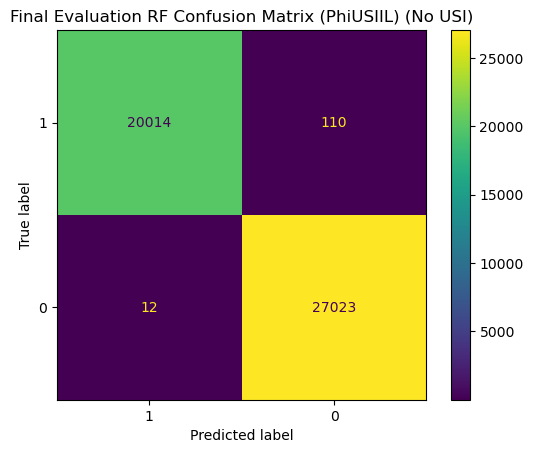

In [321]:
# '1' is the positive label corresponding to Phishing. All respective metrics will be in relation to '1'.

RF_rm_USI_accuracy = np.array([RF_eval_rm_USI_pred_cr_1['accuracy'], RF_eval_rm_USI_pred_cr_2['accuracy'], RF_eval_rm_USI_pred_cr_3['accuracy'], 
                        RF_eval_rm_USI_pred_cr_4['accuracy'], RF_eval_rm_USI_pred_cr_5['accuracy']])
RF_rm_USI_precision = np.array([RF_eval_rm_USI_pred_cr_1['1']['precision'], RF_eval_rm_USI_pred_cr_2['1']['precision'], 
                         RF_eval_rm_USI_pred_cr_3['1']['precision'], RF_eval_rm_USI_pred_cr_4['1']['precision'], 
                         RF_eval_rm_USI_pred_cr_5['1']['precision']])
RF_rm_USI_recall = np.array([RF_eval_rm_USI_pred_cr_1['1']['recall'], RF_eval_rm_USI_pred_cr_2['1']['recall'], RF_eval_rm_USI_pred_cr_3['1']['recall'], 
                      RF_eval_rm_USI_pred_cr_4['1']['recall'], RF_eval_rm_USI_pred_cr_5['1']['recall']])
RF_rm_USI_f1 = np.array([RF_eval_rm_USI_pred_cr_1['1']['f1-score'], RF_eval_rm_USI_pred_cr_2['1']['f1-score'], RF_eval_rm_USI_pred_cr_3['1']['f1-score'], 
                  RF_eval_rm_USI_pred_cr_4['1']['f1-score'], RF_eval_rm_USI_pred_cr_5['1']['f1-score']])

print("\nFinal evaluation results:")
print(f"RF Accuracy: {RF_rm_USI_accuracy.mean()} ± {RF_rm_USI_accuracy.std()}")
print(f"RF Precision: {RF_rm_USI_precision.mean()} ± {RF_rm_USI_precision.std()}")
print(f"RF Recall: {RF_rm_USI_recall.mean()} ± {RF_rm_USI_recall.std()}")
print(f"RF F1: {RF_rm_USI_f1.mean()} ± {RF_rm_USI_f1.std()}")

RF_eval_rm_USI_preds = np.concatenate([RF_eval_rm_USI_pred_1, RF_eval_rm_USI_pred_2, RF_eval_rm_USI_pred_3, RF_eval_rm_USI_pred_4, 
                                       RF_eval_rm_USI_pred_5])
y_test_phi_RF_rm_USI_all = np.concatenate([y_test_phi_RF_rm_USI_1, y_test_phi_RF_rm_USI_2, y_test_phi_RF_rm_USI_3, y_test_phi_RF_rm_USI_4, 
                                           y_test_phi_RF_rm_USI_5])

RF_eval_rm_USI_cv_cm = ConfusionMatrixDisplay.from_predictions(y_test_phi_RF_rm_USI_all, RF_eval_rm_USI_preds, values_format='d', 
                                                        labels=[1, 0], display_labels=[1, 0])
_ = RF_eval_rm_USI_cv_cm.ax_.set(title="Final Evaluation RF Confusion Matrix (PhiUSIIL) (No USI)")

### 11.2 Gaussian Naive Bayes

#### 11.2.1 With URLSimilarityIndex

label
0    107815
1     80821
Name: count, dtype: int64

Results on entire training set:
GNB Accuracy: 0.9999257831580675 ± 3.091071541276589e-05
GNB Precision: 1.0 ± 0.0
GNB Recall: 0.999826778612326 ± 7.214423766641956e-05
GNB F1: 0.999913380502582 ± 3.6077895440676326e-05


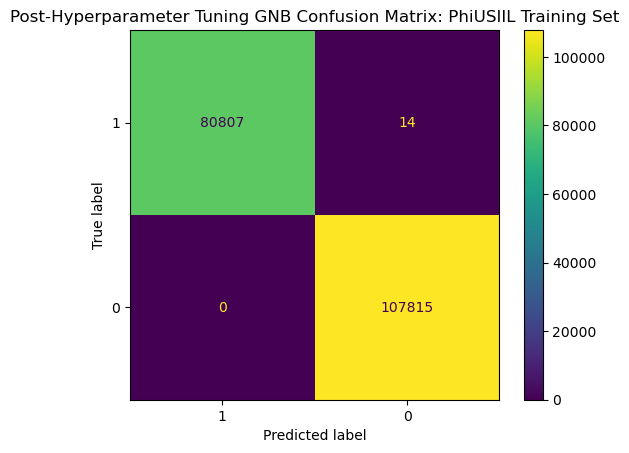

In [112]:
# Post hyperparameter tuning evaluation on entire training set. Refer to Section 8.

print(y_train_phi.value_counts())

GNB_v2_cv = cross_validate(GNB_v2_phi, x_train_phi_GNB, y_train_phi, cv=StratifiedKFold(), scoring=scoring, n_jobs=-1, error_score='raise')

GNB_v2_cv_pred = cross_val_predict(GNB_v2_phi, x_train_phi_GNB, y_train_phi, cv=StratifiedKFold(), n_jobs=-1)

print("\nResults on entire training set:")
print(f"GNB Accuracy: {GNB_v2_cv['test_accuracy'].mean()} ± {GNB_v2_cv['test_accuracy'].std()}")
print(f"GNB Precision: {GNB_v2_cv['test_precision'].mean()} ± {GNB_v2_cv['test_precision'].std()}")
print(f"GNB Recall: {GNB_v2_cv['test_recall'].mean()} ± {GNB_v2_cv['test_recall'].std()}")
print(f"GNB F1: {GNB_v2_cv['test_f1'].mean()} ± {GNB_v2_cv['test_f1'].std()}")

GNB_v2_cv_cm = ConfusionMatrixDisplay.from_predictions(y_train_phi, GNB_v2_cv_pred, values_format='d', labels=[1, 0], display_labels=[1, 0])
_ = GNB_v2_cv_cm.ax_.set(title="Post-Hyperparameter Tuning GNB Confusion Matrix: PhiUSIIL Training Set")

In [327]:
# Split training and testing sets
# Training and testing sets are shuffled at the start to ensure randomness.
# Temp set is shuffled every train_test_split call.

train_indices = np.random.permutation(len(x_train_phi_GNB))

x_train_phi_GNB_shuffle = x_train_phi_GNB.iloc[train_indices]
y_train_phi_shuffle = y_train_phi.iloc[train_indices]

test_indices = np.random.permutation(len(x_test_phi_GNB))

x_test_phi_GNB_shuffle = x_test_phi_GNB.iloc[test_indices]
y_test_phi_shuffle = y_test_phi.iloc[test_indices]

# Each subset is 20% of the training set.
# Splitting Training set

x_train_phi_GNB_1, x_temp, y_train_phi_GNB_1, y_temp = train_test_split(x_train_phi_GNB_shuffle, y_train_phi_shuffle, test_size=0.8, random_state=100)

# 2nd split is 25% of x_temp, which is 25% of 80% of the original training set. Meaning, 2nd split is 20% of the original training set.
x_train_phi_GNB_2, x_temp, y_train_phi_GNB_2, y_temp = train_test_split(x_temp, y_temp, test_size=0.75, random_state=101)

# 3rd split = 33.33% of 60% of original training set.
x_train_phi_GNB_3, x_temp, y_train_phi_GNB_3, y_temp = train_test_split(x_temp, y_temp, test_size=0.6666, random_state=102)

# 4th and 5th split = 50% of 40% of original training set.
x_train_phi_GNB_4, x_train_phi_GNB_5, y_train_phi_GNB_4, y_train_phi_GNB_5 = train_test_split(x_temp, y_temp, test_size=0.5, random_state=103)

# Splitting Testing set

x_test_phi_GNB_1, x_temp, y_test_phi_GNB_1, y_temp = train_test_split(x_test_phi_GNB_shuffle, y_test_phi_shuffle, test_size=0.8, random_state=104)
x_test_phi_GNB_2, x_temp, y_test_phi_GNB_2, y_temp = train_test_split(x_temp, y_temp, test_size=0.75, random_state=105)
x_test_phi_GNB_3, x_temp, y_test_phi_GNB_3, y_temp = train_test_split(x_temp, y_temp, test_size=0.6666, random_state=106)
x_test_phi_GNB_4, x_test_phi_GNB_5, y_test_phi_GNB_4, y_test_phi_GNB_5 = train_test_split(x_temp, y_temp, test_size=0.5, random_state=107)

In [329]:
GNB_eval_1 = GNB_v2_phi.fit(x_train_phi_GNB_1, y_train_phi_GNB_1)

GNB_eval_pred_1 = GNB_eval_1.predict(x_test_phi_GNB_1)

GNB_eval_pred_cr_1 = classification_report(y_test_phi_GNB_1, GNB_eval_pred_1, output_dict=True)

GNB_eval_pred_cr_1

{'0': {'precision': 1.0,
  'recall': 0.9998140918386317,
  'f1-score': 0.9999070372780515,
  'support': 5379.0},
 '1': {'precision': 0.999753269183321,
  'recall': 1.0,
  'f1-score': 0.9998766193707587,
  'support': 4052.0},
 'accuracy': 0.9998939667055455,
 'macro avg': {'precision': 0.9998766345916605,
  'recall': 0.9999070459193158,
  'f1-score': 0.9998918283244052,
  'support': 9431.0},
 'weighted avg': {'precision': 0.9998939928672269,
  'recall': 0.9998939667055455,
  'f1-score': 0.9998939683182009,
  'support': 9431.0}}

In [331]:
GNB_eval_2 = GNB_v2_phi.fit(x_train_phi_GNB_2, y_train_phi_GNB_2)

GNB_eval_pred_2 = GNB_eval_2.predict(x_test_phi_GNB_2)

GNB_eval_pred_cr_2 = classification_report(y_test_phi_GNB_2, GNB_eval_pred_2, output_dict=True)

GNB_eval_pred_cr_2

{'0': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 5496.0},
 '1': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 3936.0},
 'accuracy': 1.0,
 'macro avg': {'precision': 1.0,
  'recall': 1.0,
  'f1-score': 1.0,
  'support': 9432.0},
 'weighted avg': {'precision': 1.0,
  'recall': 1.0,
  'f1-score': 1.0,
  'support': 9432.0}}

In [333]:
GNB_eval_3 = GNB_v2_phi.fit(x_train_phi_GNB_3, y_train_phi_GNB_3)

GNB_eval_pred_3 = GNB_eval_3.predict(x_test_phi_GNB_3)

GNB_eval_pred_cr_3 = classification_report(y_test_phi_GNB_3, GNB_eval_pred_3, output_dict=True)

GNB_eval_pred_cr_3

{'0': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 5404.0},
 '1': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 4029.0},
 'accuracy': 1.0,
 'macro avg': {'precision': 1.0,
  'recall': 1.0,
  'f1-score': 1.0,
  'support': 9433.0},
 'weighted avg': {'precision': 1.0,
  'recall': 1.0,
  'f1-score': 1.0,
  'support': 9433.0}}

In [335]:
GNB_eval_4 = GNB_v2_phi.fit(x_train_phi_GNB_4, y_train_phi_GNB_4)

GNB_eval_pred_4 = GNB_eval_4.predict(x_test_phi_GNB_4)

GNB_eval_pred_cr_4 = classification_report(y_test_phi_GNB_4, GNB_eval_pred_4, output_dict=True)

GNB_eval_pred_cr_4

{'0': {'precision': 0.9998132935026139,
  'recall': 1.0,
  'f1-score': 0.9999066380356644,
  'support': 5355.0},
 '1': {'precision': 1.0,
  'recall': 0.9997546614327772,
  'f1-score': 0.9998773156667894,
  'support': 4076.0},
 'accuracy': 0.9998939667055455,
 'macro avg': {'precision': 0.9999066467513069,
  'recall': 0.9998773307163886,
  'f1-score': 0.9998919768512269,
  'support': 9431.0},
 'weighted avg': {'precision': 0.9998939865026505,
  'recall': 0.9998939667055455,
  'f1-score': 0.999893965150972,
  'support': 9431.0}}

In [337]:
GNB_eval_5 = GNB_v2_phi.fit(x_train_phi_GNB_5, y_train_phi_GNB_5)

GNB_eval_pred_5 = GNB_eval_5.predict(x_test_phi_GNB_5)

GNB_eval_pred_cr_5 = classification_report(y_test_phi_GNB_5, GNB_eval_pred_5, output_dict=True)

GNB_eval_pred_cr_5

{'0': {'precision': 0.9998148833765272,
  'recall': 1.0,
  'f1-score': 0.9999074331204295,
  'support': 5401.0},
 '1': {'precision': 1.0,
  'recall': 0.9997519225998511,
  'f1-score': 0.9998759459124179,
  'support': 4031.0},
 'accuracy': 0.9998939779474131,
 'macro avg': {'precision': 0.9999074416882636,
  'recall': 0.9998759612999255,
  'f1-score': 0.9998916895164237,
  'support': 9432.0},
 'weighted avg': {'precision': 0.9998939975738574,
  'recall': 0.9998939779474131,
  'f1-score': 0.9998939762782438,
  'support': 9432.0}}


Final evaluation results:
GNB Accuracy: 0.9999363822717008 ± 5.194365780486229e-05
GNB Precision: 0.9999506538366643 ± 9.86923266716122e-05
GNB Recall: 0.9999013168065257 ± 0.00012086483827820342
GNB F1: 0.9999259761899932 ± 6.044174003703942e-05


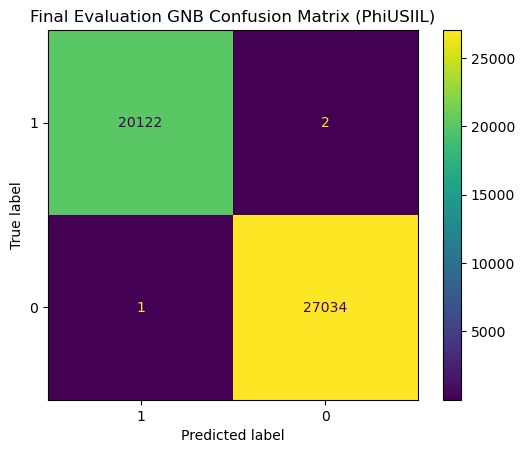

In [339]:
# '1' is the positive label corresponding to Phishing. All respective metrics will be in relation to '1'.

GNB_accuracy = np.array([GNB_eval_pred_cr_1['accuracy'], GNB_eval_pred_cr_2['accuracy'], GNB_eval_pred_cr_3['accuracy'], GNB_eval_pred_cr_4['accuracy'],
              GNB_eval_pred_cr_5['accuracy']])
GNB_precision = np.array([GNB_eval_pred_cr_1['1']['precision'], GNB_eval_pred_cr_2['1']['precision'], GNB_eval_pred_cr_3['1']['precision'],
               GNB_eval_pred_cr_4['1']['precision'], GNB_eval_pred_cr_5['1']['precision']])
GNB_recall = np.array([GNB_eval_pred_cr_1['1']['recall'], GNB_eval_pred_cr_2['1']['recall'], GNB_eval_pred_cr_3['1']['recall'], 
                      GNB_eval_pred_cr_4['1']['recall'], GNB_eval_pred_cr_5['1']['recall']])
GNB_f1 = np.array([GNB_eval_pred_cr_1['1']['f1-score'], GNB_eval_pred_cr_2['1']['f1-score'], GNB_eval_pred_cr_3['1']['f1-score'], 
                  GNB_eval_pred_cr_4['1']['f1-score'], GNB_eval_pred_cr_5['1']['f1-score']])

print("\nFinal evaluation results:")
print(f"GNB Accuracy: {GNB_accuracy.mean()} ± {GNB_accuracy.std()}")
print(f"GNB Precision: {GNB_precision.mean()} ± {GNB_precision.std()}")
print(f"GNB Recall: {GNB_recall.mean()} ± {GNB_recall.std()}")
print(f"GNB F1: {GNB_f1.mean()} ± {GNB_f1.std()}")

GNB_eval_preds = np.concatenate([GNB_eval_pred_1, GNB_eval_pred_2, GNB_eval_pred_3, GNB_eval_pred_4, GNB_eval_pred_5])
y_test_phi_GNB_all = np.concatenate([y_test_phi_GNB_1, y_test_phi_GNB_2, y_test_phi_GNB_3, y_test_phi_GNB_4, y_test_phi_GNB_5])

GNB_eval_cv_cm = ConfusionMatrixDisplay.from_predictions(y_test_phi_GNB_all, GNB_eval_preds, values_format='d', 
                                                        labels=[1, 0], display_labels=[1, 0])
_ = GNB_eval_cv_cm.ax_.set(title="Final Evaluation GNB Confusion Matrix (PhiUSIIL)")

#### 11.2.2 No URLSimilarityIndex

label
0    107815
1     80821
Name: count, dtype: int64

Results on entire training set:
GNB Accuracy: 0.9926154118626398 ± 0.000543821257955706
GNB Precision: 0.9978563648426627 ± 0.0003662256792508169
GNB Recall: 0.9848801861035735 ± 0.0011260206117840424
GNB F1: 0.9913255119396112 ± 0.0006426040741263298


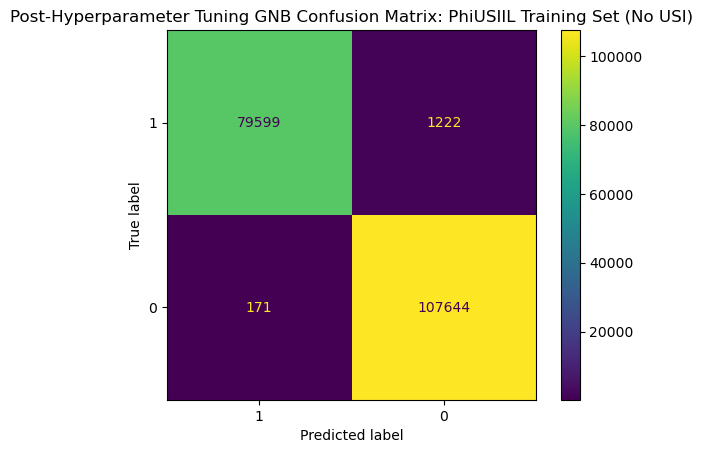

In [114]:
# Post hyperparameter tuning evaluation on entire training set. Refer to Section 8.

print(y_train_phi.value_counts())

GNB_v2_cv = cross_validate(GNB_v2_phi_rm_USI, x_train_phi_GNB_rm_USI, y_train_phi, cv=StratifiedKFold(), scoring=scoring, n_jobs=-1, error_score='raise')

GNB_v2_cv_pred = cross_val_predict(GNB_v2_phi_rm_USI, x_train_phi_GNB_rm_USI, y_train_phi, cv=StratifiedKFold(), n_jobs=-1)

print("\nResults on entire training set:")
print(f"GNB Accuracy: {GNB_v2_cv['test_accuracy'].mean()} ± {GNB_v2_cv['test_accuracy'].std()}")
print(f"GNB Precision: {GNB_v2_cv['test_precision'].mean()} ± {GNB_v2_cv['test_precision'].std()}")
print(f"GNB Recall: {GNB_v2_cv['test_recall'].mean()} ± {GNB_v2_cv['test_recall'].std()}")
print(f"GNB F1: {GNB_v2_cv['test_f1'].mean()} ± {GNB_v2_cv['test_f1'].std()}")

GNB_v2_cv_cm = ConfusionMatrixDisplay.from_predictions(y_train_phi, GNB_v2_cv_pred, values_format='d', labels=[1, 0], display_labels=[1, 0])
_ = GNB_v2_cv_cm.ax_.set(title="Post-Hyperparameter Tuning GNB Confusion Matrix: PhiUSIIL Training Set (No USI)")

In [341]:
# Split training and testing sets
# Training and testing sets are shuffled at the start to ensure randomness.
# Temp set is shuffled every train_test_split call.

train_indices = np.random.permutation(len(x_train_phi_GNB_rm_USI))

x_train_phi_GNB_rm_USI_shuffle = x_train_phi_GNB_rm_USI.iloc[train_indices]
y_train_phi_GNB_rm_USI_shuffle = y_train_phi.iloc[train_indices]

test_indices = np.random.permutation(len(x_test_phi_GNB_rm_USI))

x_test_phi_GNB_rm_USI_shuffle = x_test_phi_GNB_rm_USI.iloc[test_indices]
y_test_phi_GNB_rm_USI_shuffle = y_test_phi.iloc[test_indices]

# Each subset is 20% of the training set.
# Splitting Training set

x_train_phi_GNB_rm_USI_1, x_temp, y_train_phi_GNB_rm_USI_1, y_temp = train_test_split(x_train_phi_GNB_rm_USI_shuffle, y_train_phi_GNB_rm_USI_shuffle, 
                                                                             test_size=0.8, random_state=100)

# 2nd split is 25% of x_temp, which is 25% of 80% of the original training set. Meaning, 2nd split is 20% of the original training set.
x_train_phi_GNB_rm_USI_2, x_temp, y_train_phi_GNB_rm_USI_2, y_temp = train_test_split(x_temp, y_temp, test_size=0.75, random_state=101)

# 3rd split = 33.33% of 60% of original training set.
x_train_phi_GNB_rm_USI_3, x_temp, y_train_phi_GNB_rm_USI_3, y_temp = train_test_split(x_temp, y_temp, test_size=0.6666, random_state=102)

# 4th and 5th split = 50% of 40% of original training set.
x_train_phi_GNB_rm_USI_4, x_train_phi_GNB_rm_USI_5, y_train_phi_GNB_rm_USI_4, y_train_phi_GNB_rm_USI_5 = train_test_split(x_temp, y_temp, test_size=0.5, 
                                                                                                                      random_state=103)

# Splitting Testing set

x_test_phi_GNB_rm_USI_1, x_temp, y_test_phi_GNB_rm_USI_1, y_temp = train_test_split(x_test_phi_GNB_rm_USI_shuffle, y_test_phi_GNB_rm_USI_shuffle, 
                                                                                  test_size=0.8, random_state=104)
x_test_phi_GNB_rm_USI_2, x_temp, y_test_phi_GNB_rm_USI_2, y_temp = train_test_split(x_temp, y_temp, test_size=0.75, random_state=105)
x_test_phi_GNB_rm_USI_3, x_temp, y_test_phi_GNB_rm_USI_3, y_temp = train_test_split(x_temp, y_temp, test_size=0.6666, random_state=106)
x_test_phi_GNB_rm_USI_4, x_test_phi_GNB_rm_USI_5, y_test_phi_GNB_rm_USI_4, y_test_phi_GNB_rm_USI_5 = train_test_split(x_temp, y_temp, test_size=0.5, 
                                                                                                                  random_state=107)

In [343]:
GNB_eval_rm_USI_1 = GNB_v2_phi_rm_USI.fit(x_train_phi_GNB_rm_USI_1, y_train_phi_GNB_rm_USI_1)

GNB_eval_rm_USI_pred_1 = GNB_eval_rm_USI_1.predict(x_test_phi_GNB_rm_USI_1)

GNB_eval_rm_USI_pred_cr_1 = classification_report(y_test_phi_GNB_rm_USI_1, GNB_eval_rm_USI_pred_1, output_dict=True)

GNB_eval_rm_USI_pred_cr_1

{'0': {'precision': 0.9880646345941976,
  'recall': 0.9988862075366624,
  'f1-score': 0.9934459521831441,
  'support': 5387.0},
 '1': {'precision': 0.9984943538268507,
  'recall': 0.9839268051434223,
  'f1-score': 0.9911570556731847,
  'support': 4044.0},
 'accuracy': 0.9924716360937335,
 'macro avg': {'precision': 0.9932794942105241,
  'recall': 0.9914065063400423,
  'f1-score': 0.9923015039281644,
  'support': 9431.0},
 'weighted avg': {'precision': 0.9925368840456714,
  'recall': 0.9924716360937335,
  'f1-score': 0.9924644764662238,
  'support': 9431.0}}

In [345]:
GNB_eval_rm_USI_2 = GNB_v2_phi_rm_USI.fit(x_train_phi_GNB_rm_USI_2, y_train_phi_GNB_rm_USI_2)

GNB_eval_rm_USI_pred_2 = GNB_eval_rm_USI_2.predict(x_test_phi_GNB_rm_USI_2)

GNB_eval_rm_USI_pred_cr_2 = classification_report(y_test_phi_GNB_rm_USI_2, GNB_eval_rm_USI_pred_2, output_dict=True)

GNB_eval_rm_USI_pred_cr_2

{'0': {'precision': 0.9902680866691149,
  'recall': 0.998333950388745,
  'f1-score': 0.9942846607669616,
  'support': 5402.0},
 '1': {'precision': 0.9977420973406924,
  'recall': 0.986848635235732,
  'f1-score': 0.9922654690618762,
  'support': 4030.0},
 'accuracy': 0.9934266327396098,
 'macro avg': {'precision': 0.9940050920049037,
  'recall': 0.9925912928122385,
  'f1-score': 0.9932750649144189,
  'support': 9432.0},
 'weighted avg': {'precision': 0.9934614987775181,
  'recall': 0.9934266327396098,
  'f1-score': 0.9934219230049287,
  'support': 9432.0}}

In [347]:
GNB_eval_rm_USI_3 = GNB_v2_phi_rm_USI.fit(x_train_phi_GNB_rm_USI_3, y_train_phi_GNB_rm_USI_3)

GNB_eval_rm_USI_pred_3 = GNB_eval_rm_USI_3.predict(x_test_phi_GNB_rm_USI_3)

GNB_eval_rm_USI_pred_cr_3 = classification_report(y_test_phi_GNB_rm_USI_3, GNB_eval_rm_USI_pred_3, output_dict=True)

GNB_eval_rm_USI_pred_cr_3

{'0': {'precision': 0.989514348785872,
  'recall': 0.9985149433822165,
  'f1-score': 0.99399427145893,
  'support': 5387.0},
 '1': {'precision': 0.9979984988741556,
  'recall': 0.9859120118635689,
  'f1-score': 0.9919184383936342,
  'support': 4046.0},
 'accuracy': 0.9931092971483091,
 'macro avg': {'precision': 0.9937564238300138,
  'recall': 0.9922134776228927,
  'f1-score': 0.9929563549262821,
  'support': 9433.0},
 'weighted avg': {'precision': 0.9931533683191271,
  'recall': 0.9931092971483091,
  'f1-score': 0.9931039056599067,
  'support': 9433.0}}

In [349]:
GNB_eval_rm_USI_4 = GNB_v2_phi_rm_USI.fit(x_train_phi_GNB_rm_USI_4, y_train_phi_GNB_rm_USI_4)

GNB_eval_rm_USI_pred_4 = GNB_eval_rm_USI_4.predict(x_test_phi_GNB_rm_USI_4)

GNB_eval_rm_USI_pred_cr_4 = classification_report(y_test_phi_GNB_rm_USI_4, GNB_eval_rm_USI_pred_4, output_dict=True)

GNB_eval_rm_USI_pred_cr_4

{'0': {'precision': 0.9908709147343436,
  'recall': 0.9977937120794264,
  'f1-score': 0.9943202638329058,
  'support': 5439.0},
 '1': {'precision': 0.9969650986342944,
  'recall': 0.9874749498997996,
  'f1-score': 0.992197331990939,
  'support': 3992.0},
 'accuracy': 0.9934259357438235,
 'macro avg': {'precision': 0.993918006684319,
  'recall': 0.992634330989613,
  'f1-score': 0.9932587979119224,
  'support': 9431.0},
 'weighted avg': {'precision': 0.9934504908268686,
  'recall': 0.9934259357438235,
  'f1-score': 0.9934216588161386,
  'support': 9431.0}}

In [351]:
GNB_eval_rm_USI_5 = GNB_v2_phi_rm_USI.fit(x_train_phi_GNB_rm_USI_5, y_train_phi_GNB_rm_USI_5)

GNB_eval_rm_USI_pred_5 = GNB_eval_rm_USI_5.predict(x_test_phi_GNB_rm_USI_5)

GNB_eval_rm_USI_pred_cr_5 = classification_report(y_test_phi_GNB_rm_USI_5, GNB_eval_rm_USI_pred_5, output_dict=True)

GNB_eval_rm_USI_pred_cr_5

{'0': {'precision': 0.98921783625731,
  'recall': 0.9987084870848708,
  'f1-score': 0.9939405067939772,
  'support': 5420.0},
 '1': {'precision': 0.9982323232323232,
  'recall': 0.9852941176470589,
  'f1-score': 0.9917210235825389,
  'support': 4012.0},
 'accuracy': 0.9930025445292621,
 'macro avg': {'precision': 0.9937250797448166,
  'recall': 0.9920013023659648,
  'f1-score': 0.992830765188258,
  'support': 9432.0},
 'weighted avg': {'precision': 0.9930522427186917,
  'recall': 0.9930025445292621,
  'f1-score': 0.9929964263609524,
  'support': 9432.0}}


Final evaluation results:
GNB Accuracy: 0.9930872092509476 ± 0.00035114961022966176
GNB Precision: 0.9978864743816633 ± 0.0005237282371805884
GNB Recall: 0.9858913039579162 ± 0.0012361823121293765
GNB F1: 0.9918518637404345 ± 0.0003986796347228509


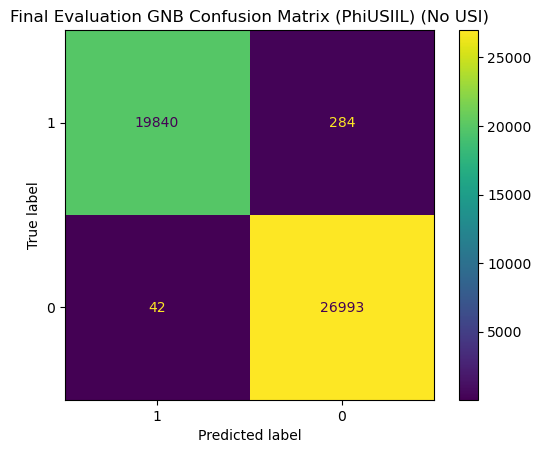

In [353]:
# '1' is the positive label corresponding to Phishing. All respective metrics will be in relation to '1'.

GNB_rm_USI_accuracy = np.array([GNB_eval_rm_USI_pred_cr_1['accuracy'], GNB_eval_rm_USI_pred_cr_2['accuracy'], GNB_eval_rm_USI_pred_cr_3['accuracy'], 
                        GNB_eval_rm_USI_pred_cr_4['accuracy'], GNB_eval_rm_USI_pred_cr_5['accuracy']])
GNB_rm_USI_precision = np.array([GNB_eval_rm_USI_pred_cr_1['1']['precision'], GNB_eval_rm_USI_pred_cr_2['1']['precision'], 
                         GNB_eval_rm_USI_pred_cr_3['1']['precision'], GNB_eval_rm_USI_pred_cr_4['1']['precision'], 
                         GNB_eval_rm_USI_pred_cr_5['1']['precision']])
GNB_rm_USI_recall = np.array([GNB_eval_rm_USI_pred_cr_1['1']['recall'], GNB_eval_rm_USI_pred_cr_2['1']['recall'], 
                              GNB_eval_rm_USI_pred_cr_3['1']['recall'], GNB_eval_rm_USI_pred_cr_4['1']['recall'], 
                              GNB_eval_rm_USI_pred_cr_5['1']['recall']])
GNB_rm_USI_f1 = np.array([GNB_eval_rm_USI_pred_cr_1['1']['f1-score'], GNB_eval_rm_USI_pred_cr_2['1']['f1-score'], 
                          GNB_eval_rm_USI_pred_cr_3['1']['f1-score'], GNB_eval_rm_USI_pred_cr_4['1']['f1-score'], 
                          GNB_eval_rm_USI_pred_cr_5['1']['f1-score']])

print("\nFinal evaluation results:")
print(f"GNB Accuracy: {GNB_rm_USI_accuracy.mean()} ± {GNB_rm_USI_accuracy.std()}")
print(f"GNB Precision: {GNB_rm_USI_precision.mean()} ± {GNB_rm_USI_precision.std()}")
print(f"GNB Recall: {GNB_rm_USI_recall.mean()} ± {GNB_rm_USI_recall.std()}")
print(f"GNB F1: {GNB_rm_USI_f1.mean()} ± {GNB_rm_USI_f1.std()}")

GNB_eval_rm_USI_preds = np.concatenate([GNB_eval_rm_USI_pred_1, GNB_eval_rm_USI_pred_2, GNB_eval_rm_USI_pred_3, GNB_eval_rm_USI_pred_4, 
                                       GNB_eval_rm_USI_pred_5])
y_test_phi_GNB_rm_USI_all = np.concatenate([y_test_phi_GNB_rm_USI_1, y_test_phi_GNB_rm_USI_2, y_test_phi_GNB_rm_USI_3, y_test_phi_GNB_rm_USI_4, 
                                           y_test_phi_GNB_rm_USI_5])

GNB_eval_rm_USI_cv_cm = ConfusionMatrixDisplay.from_predictions(y_test_phi_GNB_rm_USI_all, GNB_eval_rm_USI_preds, values_format='d', 
                                                        labels=[1, 0], display_labels=[1, 0])
_ = GNB_eval_rm_USI_cv_cm.ax_.set(title="Final Evaluation GNB Confusion Matrix (PhiUSIIL) (No USI)")

### 11.3 Support Vector Machine

#### 11.3.1 With URLSimilarityIndex

label
0    107815
1     80821
Name: count, dtype: int64

Results on entire training set:
SVM Accuracy: 0.9999151805312723 ± 3.0911366045380024e-05
SVM Precision: 1.0 ± 0.0
SVM Recall: 0.9998020314969827 ± 7.21477819145454e-05
SVM F1: 0.9999010046479103 ± 3.6081506460304016e-05


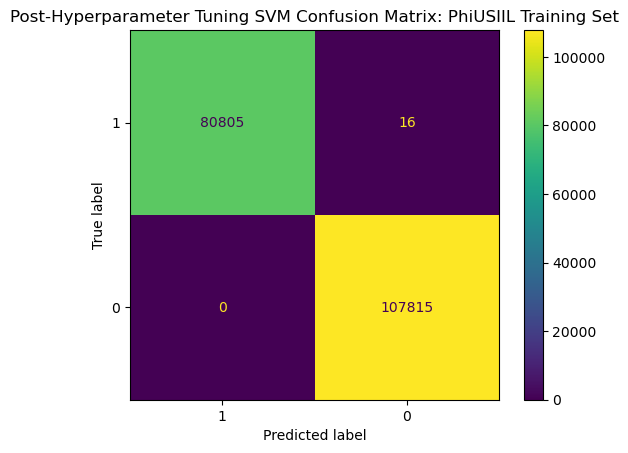

In [116]:
# Post hyperparameter tuning evaluation on entire training set. Refer to Section 8.

print(y_train_phi.value_counts())

SVM_v2_cv = cross_validate(SVM_v2_phi, x_train_phi_SVM, y_train_phi, cv=StratifiedKFold(), scoring=scoring, n_jobs=-1, error_score='raise')

SVM_v2_cv_pred = cross_val_predict(SVM_v2_phi, x_train_phi_SVM, y_train_phi, cv=StratifiedKFold(), n_jobs=-1)

print("\nResults on entire training set:")
print(f"SVM Accuracy: {SVM_v2_cv['test_accuracy'].mean()} ± {SVM_v2_cv['test_accuracy'].std()}")
print(f"SVM Precision: {SVM_v2_cv['test_precision'].mean()} ± {SVM_v2_cv['test_precision'].std()}")
print(f"SVM Recall: {SVM_v2_cv['test_recall'].mean()} ± {SVM_v2_cv['test_recall'].std()}")
print(f"SVM F1: {SVM_v2_cv['test_f1'].mean()} ± {SVM_v2_cv['test_f1'].std()}")

SVM_v2_cv_cm = ConfusionMatrixDisplay.from_predictions(y_train_phi, SVM_v2_cv_pred, values_format='d', labels=[1, 0], display_labels=[1, 0])
_ = SVM_v2_cv_cm.ax_.set(title="Post-Hyperparameter Tuning SVM Confusion Matrix: PhiUSIIL Training Set")

In [358]:
# Split training and testing sets
# Training and testing sets are shuffled at the start to ensure randomness.
# Temp set is shuffled every train_test_split call.

train_indices = np.random.permutation(len(x_train_phi_SVM))

x_train_phi_SVM_shuffle = x_train_phi_SVM.iloc[train_indices]
y_train_phi_SVM_shuffle = y_train_phi.iloc[train_indices]

test_indices = np.random.permutation(len(x_test_phi_SVM))

x_test_phi_SVM_shuffle = x_test_phi_SVM.iloc[test_indices]
y_test_phi_shuffle = y_test_phi.iloc[test_indices]

# Each subset is 20% of the training set.
# Splitting Training set

x_train_phi_SVM_1, x_temp, y_train_phi_SVM_1, y_temp = train_test_split(x_train_phi_SVM_shuffle, y_train_phi_SVM_shuffle, test_size=0.8, random_state=100)

# 2nd split is 25% of x_temp, which is 25% of 80% of the original training set. Meaning, 2nd split is 20% of the original training set.
x_train_phi_SVM_2, x_temp, y_train_phi_SVM_2, y_temp = train_test_split(x_temp, y_temp, test_size=0.75, random_state=101)

# 3rd split = 33.33% of 60% of original training set.
x_train_phi_SVM_3, x_temp, y_train_phi_SVM_3, y_temp = train_test_split(x_temp, y_temp, test_size=0.6666, random_state=102)

# 4th and 5th split = 50% of 40% of original training set.
x_train_phi_SVM_4, x_train_phi_SVM_5, y_train_phi_SVM_4, y_train_phi_SVM_5 = train_test_split(x_temp, y_temp, test_size=0.5, random_state=103)

# Splitting Testing set

x_test_phi_SVM_1, x_temp, y_test_phi_SVM_1, y_temp = train_test_split(x_test_phi_SVM_shuffle, y_test_phi_shuffle, test_size=0.8, random_state=104)
x_test_phi_SVM_2, x_temp, y_test_phi_SVM_2, y_temp = train_test_split(x_temp, y_temp, test_size=0.75, random_state=105)
x_test_phi_SVM_3, x_temp, y_test_phi_SVM_3, y_temp = train_test_split(x_temp, y_temp, test_size=0.6666, random_state=106)
x_test_phi_SVM_4, x_test_phi_SVM_5, y_test_phi_SVM_4, y_test_phi_SVM_5 = train_test_split(x_temp, y_temp, test_size=0.5, random_state=107)

In [360]:
SVM_eval_1 = SVM_v2_phi.fit(x_train_phi_SVM_1, y_train_phi_SVM_1)

SVM_eval_pred_1 = SVM_eval_1.predict(x_test_phi_SVM_1)

SVM_eval_pred_cr_1 = classification_report(y_test_phi_SVM_1, SVM_eval_pred_1, output_dict=True)

SVM_eval_pred_cr_1

{'0': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 5400.0},
 '1': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 4031.0},
 'accuracy': 1.0,
 'macro avg': {'precision': 1.0,
  'recall': 1.0,
  'f1-score': 1.0,
  'support': 9431.0},
 'weighted avg': {'precision': 1.0,
  'recall': 1.0,
  'f1-score': 1.0,
  'support': 9431.0}}

In [362]:
SVM_eval_2 = SVM_v2_phi.fit(x_train_phi_SVM_2, y_train_phi_SVM_2)

SVM_eval_pred_2 = SVM_eval_2.predict(x_test_phi_SVM_2)

SVM_eval_pred_cr_2 = classification_report(y_test_phi_SVM_2, SVM_eval_pred_2, output_dict=True)

SVM_eval_pred_cr_2

{'0': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 5497.0},
 '1': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 3935.0},
 'accuracy': 1.0,
 'macro avg': {'precision': 1.0,
  'recall': 1.0,
  'f1-score': 1.0,
  'support': 9432.0},
 'weighted avg': {'precision': 1.0,
  'recall': 1.0,
  'f1-score': 1.0,
  'support': 9432.0}}

In [364]:
SVM_eval_3 = SVM_v2_phi.fit(x_train_phi_SVM_3, y_train_phi_SVM_3)

SVM_eval_pred_3 = SVM_eval_3.predict(x_test_phi_SVM_3)

SVM_eval_pred_cr_3 = classification_report(y_test_phi_SVM_3, SVM_eval_pred_3, output_dict=True)

SVM_eval_pred_cr_3

{'0': {'precision': 0.9996303825540566,
  'recall': 1.0,
  'f1-score': 0.999815157116451,
  'support': 5409.0},
 '1': {'precision': 1.0,
  'recall': 0.9995029821073559,
  'f1-score': 0.9997514292816306,
  'support': 4024.0},
 'accuracy': 0.9997879783737941,
 'macro avg': {'precision': 0.9998151912770283,
  'recall': 0.999751491053678,
  'f1-score': 0.9997832931990408,
  'support': 9433.0},
 'weighted avg': {'precision': 0.9997880567406862,
  'recall': 0.9997879783737941,
  'f1-score': 0.9997879716179545,
  'support': 9433.0}}

In [366]:
SVM_eval_4 = SVM_v2_phi.fit(x_train_phi_SVM_4, y_train_phi_SVM_4)

SVM_eval_pred_4 = SVM_eval_4.predict(x_test_phi_SVM_4)

SVM_eval_pred_cr_4 = classification_report(y_test_phi_SVM_4, SVM_eval_pred_4, output_dict=True)

SVM_eval_pred_cr_4

{'0': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 5380.0},
 '1': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 4051.0},
 'accuracy': 1.0,
 'macro avg': {'precision': 1.0,
  'recall': 1.0,
  'f1-score': 1.0,
  'support': 9431.0},
 'weighted avg': {'precision': 1.0,
  'recall': 1.0,
  'f1-score': 1.0,
  'support': 9431.0}}

In [368]:
SVM_eval_5 = SVM_v2_phi.fit(x_train_phi_SVM_5, y_train_phi_SVM_5)

SVM_eval_pred_5 = SVM_eval_5.predict(x_test_phi_SVM_5)

SVM_eval_pred_cr_5 = classification_report(y_test_phi_SVM_5, SVM_eval_pred_5, output_dict=True)

SVM_eval_pred_cr_5

{'0': {'precision': 0.999439461883408,
  'recall': 1.0,
  'f1-score': 0.9997196523689375,
  'support': 5349.0},
 '1': {'precision': 1.0,
  'recall': 0.9992652461425422,
  'f1-score': 0.9996324880558618,
  'support': 4083.0},
 'accuracy': 0.9996819338422391,
 'macro avg': {'precision': 0.9997197309417041,
  'recall': 0.9996326230712711,
  'f1-score': 0.9996760702123997,
  'support': 9432.0},
 'weighted avg': {'precision': 0.9996821121304443,
  'recall': 0.9996819338422391,
  'f1-score': 0.99968191998023,
  'support': 9432.0}}


Final evaluation results:
SVM Accuracy: 0.9998939824432066 ± 0.00013410491336979472
SVM Precision: 1.0 ± 0.0
SVM Recall: 0.9997536456499796 ± 0.00031094619720707
SVM F1: 0.9998767834674984 ± 0.00015552547167999186


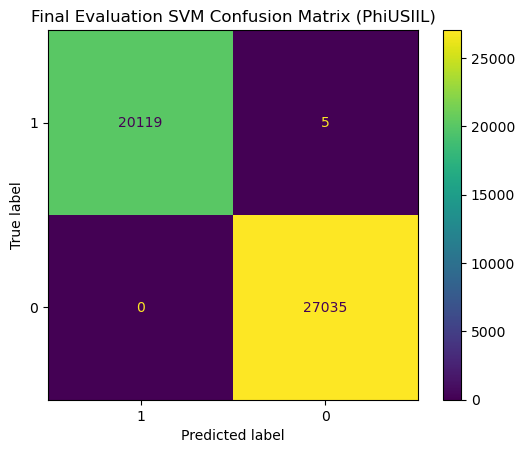

In [370]:
# '1' is the positive label corresponding to Phishing. All respective metrics will be in relation to '1'.

SVM_accuracy = np.array([SVM_eval_pred_cr_1['accuracy'], SVM_eval_pred_cr_2['accuracy'], SVM_eval_pred_cr_3['accuracy'], SVM_eval_pred_cr_4['accuracy'],
              SVM_eval_pred_cr_5['accuracy']])
SVM_precision = np.array([SVM_eval_pred_cr_1['1']['precision'], SVM_eval_pred_cr_2['1']['precision'], SVM_eval_pred_cr_3['1']['precision'],
               SVM_eval_pred_cr_4['1']['precision'], SVM_eval_pred_cr_5['1']['precision']])
SVM_recall = np.array([SVM_eval_pred_cr_1['1']['recall'], SVM_eval_pred_cr_2['1']['recall'], SVM_eval_pred_cr_3['1']['recall'], 
                      SVM_eval_pred_cr_4['1']['recall'], SVM_eval_pred_cr_5['1']['recall']])
SVM_f1 = np.array([SVM_eval_pred_cr_1['1']['f1-score'], SVM_eval_pred_cr_2['1']['f1-score'], SVM_eval_pred_cr_3['1']['f1-score'], 
                  SVM_eval_pred_cr_4['1']['f1-score'], SVM_eval_pred_cr_5['1']['f1-score']])

print("\nFinal evaluation results:")
print(f"SVM Accuracy: {SVM_accuracy.mean()} ± {SVM_accuracy.std()}")
print(f"SVM Precision: {SVM_precision.mean()} ± {SVM_precision.std()}")
print(f"SVM Recall: {SVM_recall.mean()} ± {SVM_recall.std()}")
print(f"SVM F1: {SVM_f1.mean()} ± {SVM_f1.std()}")

SVM_eval_preds = np.concatenate([SVM_eval_pred_1, SVM_eval_pred_2, SVM_eval_pred_3, SVM_eval_pred_4, SVM_eval_pred_5])
y_test_phi_SVM_all = np.concatenate([y_test_phi_SVM_1, y_test_phi_SVM_2, y_test_phi_SVM_3, y_test_phi_SVM_4, y_test_phi_SVM_5])

SVM_eval_cv_cm = ConfusionMatrixDisplay.from_predictions(y_test_phi_SVM_all, SVM_eval_preds, values_format='d', 
                                                        labels=[1, 0], display_labels=[1, 0])
_ = SVM_eval_cv_cm.ax_.set(title="Final Evaluation SVM Confusion Matrix (PhiUSIIL)")

#### 11.3.2 No URLSimilarityIndex

label
0    107815
1     80821
Name: count, dtype: int64

Results on entire training set:
SVM Accuracy: 0.9978954170112306 ± 0.0001467293207717775
SVM Precision: 0.999850864474045 ± 9.29316951622722e-05
SVM Recall: 0.9952363842834883 ± 0.0003893398797064574
SVM F1: 0.9975382368322571 ± 0.00017213544022984758


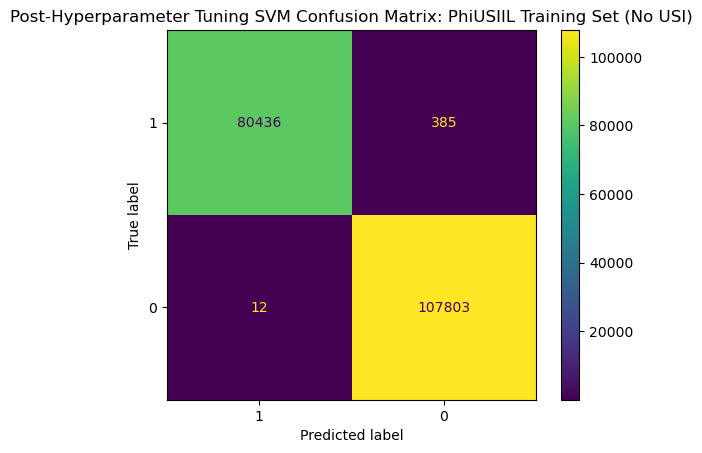

In [118]:
# Post hyperparameter tuning evaluation on entire training set. Refer to Section 8.

print(y_train_phi.value_counts())

SVM_v2_cv = cross_validate(SVM_v2_phi_rm_USI, x_train_phi_SVM3_rm_USI, y_train_phi, cv=StratifiedKFold(), scoring=scoring, n_jobs=-1, error_score='raise')

SVM_v2_cv_pred = cross_val_predict(SVM_v2_phi_rm_USI, x_train_phi_SVM3_rm_USI, y_train_phi, cv=StratifiedKFold(), n_jobs=-1)

print("\nResults on entire training set:")
print(f"SVM Accuracy: {SVM_v2_cv['test_accuracy'].mean()} ± {SVM_v2_cv['test_accuracy'].std()}")
print(f"SVM Precision: {SVM_v2_cv['test_precision'].mean()} ± {SVM_v2_cv['test_precision'].std()}")
print(f"SVM Recall: {SVM_v2_cv['test_recall'].mean()} ± {SVM_v2_cv['test_recall'].std()}")
print(f"SVM F1: {SVM_v2_cv['test_f1'].mean()} ± {SVM_v2_cv['test_f1'].std()}")

SVM_v2_cv_cm = ConfusionMatrixDisplay.from_predictions(y_train_phi, SVM_v2_cv_pred, values_format='d', labels=[1, 0], display_labels=[1, 0])
_ = SVM_v2_cv_cm.ax_.set(title="Post-Hyperparameter Tuning SVM Confusion Matrix: PhiUSIIL Training Set (No USI)")

In [488]:
# Split training and testing sets
# Training and testing sets are shuffled at the start to ensure randomness.
# Temp set is shuffled every train_test_split call.

train_indices = np.random.permutation(len(x_train_phi_SVM3_rm_USI))

x_train_phi_SVM_rm_USI_shuffle = x_train_phi_SVM3_rm_USI.iloc[train_indices]
y_train_phi_SVM_rm_USI_shuffle = y_train_phi.iloc[train_indices]

test_indices = np.random.permutation(len(x_test_phi_SVM3_rm_USI))

x_test_phi_SVM_rm_USI_shuffle = x_test_phi_SVM3_rm_USI.iloc[test_indices]
y_test_phi_SVM_rm_USI_shuffle = y_test_phi.iloc[test_indices]

# Each subset is 20% of the training set.
# Splitting Training set

x_train_phi_SVM_rm_USI_1, x_temp, y_train_phi_SVM_rm_USI_1, y_temp = train_test_split(x_train_phi_SVM_rm_USI_shuffle, y_train_phi_SVM_rm_USI_shuffle, 
                                                                             test_size=0.8, random_state=100)

# 2nd split is 25% of x_temp, which is 25% of 80% of the original training set. Meaning, 2nd split is 20% of the original training set.
x_train_phi_SVM_rm_USI_2, x_temp, y_train_phi_SVM_rm_USI_2, y_temp = train_test_split(x_temp, y_temp, test_size=0.75, random_state=101)

# 3rd split = 33.33% of 60% of original training set.
x_train_phi_SVM_rm_USI_3, x_temp, y_train_phi_SVM_rm_USI_3, y_temp = train_test_split(x_temp, y_temp, test_size=0.6666, random_state=102)

# 4th and 5th split = 50% of 40% of original training set.
x_train_phi_SVM_rm_USI_4, x_train_phi_SVM_rm_USI_5, y_train_phi_SVM_rm_USI_4, y_train_phi_SVM_rm_USI_5 = train_test_split(x_temp, y_temp, test_size=0.5, 
                                                                                                                      random_state=103)

# Splitting Testing set

x_test_phi_SVM_rm_USI_1, x_temp, y_test_phi_SVM_rm_USI_1, y_temp = train_test_split(x_test_phi_SVM_rm_USI_shuffle, y_test_phi_SVM_rm_USI_shuffle, 
                                                                                  test_size=0.8, random_state=101)
x_test_phi_SVM_rm_USI_2, x_temp, y_test_phi_SVM_rm_USI_2, y_temp = train_test_split(x_temp, y_temp, test_size=0.75, random_state=102)
x_test_phi_SVM_rm_USI_3, x_temp, y_test_phi_SVM_rm_USI_3, y_temp = train_test_split(x_temp, y_temp, test_size=0.6666, random_state=103)
x_test_phi_SVM_rm_USI_4, x_test_phi_SVM_rm_USI_5, y_test_phi_SVM_rm_USI_4, y_test_phi_SVM_rm_USI_5 = train_test_split(x_temp, y_temp, test_size=0.5, 
                                                                                                                  random_state=104)

In [490]:
SVM_eval_rm_USI_1 = SVM_v2_phi_rm_USI.fit(x_train_phi_SVM_rm_USI_1, y_train_phi_SVM_rm_USI_1)

SVM_eval_rm_USI_pred_1 = SVM_eval_rm_USI_1.predict(x_test_phi_SVM_rm_USI_1)

SVM_eval_rm_USI_pred_cr_1 = classification_report(y_test_phi_SVM_rm_USI_1, SVM_eval_rm_USI_pred_1, output_dict=True)

SVM_eval_rm_USI_pred_cr_1

{'0': {'precision': 0.9973763118440779,
  'recall': 1.0,
  'f1-score': 0.9986864327265903,
  'support': 5322.0},
 '1': {'precision': 1.0,
  'recall': 0.9965928449744463,
  'f1-score': 0.9982935153583617,
  'support': 4109.0},
 'accuracy': 0.9985155338776376,
 'macro avg': {'precision': 0.998688155922039,
  'recall': 0.9982964224872232,
  'f1-score': 0.998489974042476,
  'support': 9431.0},
 'weighted avg': {'precision': 0.9985194286538207,
  'recall': 0.9985155338776376,
  'f1-score': 0.9985152422413766,
  'support': 9431.0}}

In [492]:
SVM_eval_rm_USI_2 = SVM_v2_phi_rm_USI.fit(x_train_phi_SVM_rm_USI_2, y_train_phi_SVM_rm_USI_2)

SVM_eval_rm_USI_pred_2 = SVM_eval_rm_USI_2.predict(x_test_phi_SVM_rm_USI_2)

SVM_eval_rm_USI_pred_cr_2 = classification_report(y_test_phi_SVM_rm_USI_2, SVM_eval_rm_USI_pred_2, output_dict=True)

SVM_eval_rm_USI_pred_cr_2

{'0': {'precision': 0.9954321213228576,
  'recall': 0.9998164800880895,
  'f1-score': 0.9976194836110601,
  'support': 5449.0},
 '1': {'precision': 0.9997474109623642,
  'recall': 0.993723324127542,
  'f1-score': 0.9967262654243264,
  'support': 3983.0},
 'accuracy': 0.9972434266327396,
 'macro avg': {'precision': 0.997589766142611,
  'recall': 0.9967699021078158,
  'f1-score': 0.9971728745176933,
  'support': 9432.0},
 'weighted avg': {'precision': 0.9972544070135017,
  'recall': 0.9972434266327396,
  'f1-score': 0.9972422902228327,
  'support': 9432.0}}

In [493]:
SVM_eval_rm_USI_3 = SVM_v2_phi_rm_USI.fit(x_train_phi_SVM_rm_USI_3, y_train_phi_SVM_rm_USI_3)

SVM_eval_rm_USI_pred_3 = SVM_eval_rm_USI_3.predict(x_test_phi_SVM_rm_USI_3)

SVM_eval_rm_USI_pred_cr_3 = classification_report(y_test_phi_SVM_rm_USI_3, SVM_eval_rm_USI_pred_3, output_dict=True)

SVM_eval_rm_USI_pred_cr_3

{'0': {'precision': 0.9967260822117133,
  'recall': 1.0,
  'f1-score': 0.998360357077792,
  'support': 5480.0},
 '1': {'precision': 1.0,
  'recall': 0.9954464963318999,
  'f1-score': 0.9977180527383367,
  'support': 3953.0},
 'accuracy': 0.9980918053641471,
 'macro avg': {'precision': 0.9983630411058566,
  'recall': 0.9977232481659499,
  'f1-score': 0.9980392049080644,
  'support': 9433.0},
 'weighted avg': {'precision': 0.9980980526365091,
  'recall': 0.9980918053641471,
  'f1-score': 0.9980911925432996,
  'support': 9433.0}}

In [494]:
SVM_eval_rm_USI_4 = SVM_v2_phi_rm_USI.fit(x_train_phi_SVM_rm_USI_4, y_train_phi_SVM_rm_USI_4)

SVM_eval_rm_USI_pred_4 = SVM_eval_rm_USI_4.predict(x_test_phi_SVM_rm_USI_4)

SVM_eval_rm_USI_pred_cr_4 = classification_report(y_test_phi_SVM_rm_USI_4, SVM_eval_rm_USI_pred_4, output_dict=True)

SVM_eval_rm_USI_pred_cr_4

{'0': {'precision': 0.9961233154882776,
  'recall': 1.0,
  'f1-score': 0.9980578932766114,
  'support': 5396.0},
 '1': {'precision': 1.0,
  'recall': 0.9947955390334573,
  'f1-score': 0.9973909802459933,
  'support': 4035.0},
 'accuracy': 0.9977733008164563,
 'macro avg': {'precision': 0.9980616577441388,
  'recall': 0.9973977695167286,
  'f1-score': 0.9977244367613023,
  'support': 9431.0},
 'weighted avg': {'precision': 0.9977819330266936,
  'recall': 0.9977733008164563,
  'f1-score': 0.997772558309106,
  'support': 9431.0}}

In [495]:
SVM_eval_rm_USI_5 = SVM_v2_phi_rm_USI.fit(x_train_phi_SVM_rm_USI_5, y_train_phi_SVM_rm_USI_5)

SVM_eval_rm_USI_pred_5 = SVM_eval_rm_USI_5.predict(x_test_phi_SVM_rm_USI_5)

SVM_eval_rm_USI_pred_cr_5 = classification_report(y_test_phi_SVM_rm_USI_5, SVM_eval_rm_USI_pred_5, output_dict=True)

SVM_eval_rm_USI_pred_cr_5

{'0': {'precision': 0.9963010911781025,
  'recall': 0.9998144023756496,
  'f1-score': 0.9980546549328392,
  'support': 5388.0},
 '1': {'precision': 0.999751552795031,
  'recall': 0.9950544015825915,
  'f1-score': 0.9973974470194571,
  'support': 4044.0},
 'accuracy': 0.9977735368956743,
 'macro avg': {'precision': 0.9980263219865668,
  'recall': 0.9974344019791206,
  'f1-score': 0.9977260509761481,
  'support': 9432.0},
 'weighted avg': {'precision': 0.9977804875711114,
  'recall': 0.9977735368956743,
  'f1-score': 0.9977728749496206,
  'support': 9432.0}}


Final evaluation results:
SVM Accuracy: 0.997879520717331 ± 0.00041873820785880156
SVM Precision: 0.9998997927514791 ± 0.00012273530242760212
SVM Recall: 0.9951225212099875 ± 0.0009312488340802769
SVM F1: 0.997505252157295 ± 0.0005095376941984886


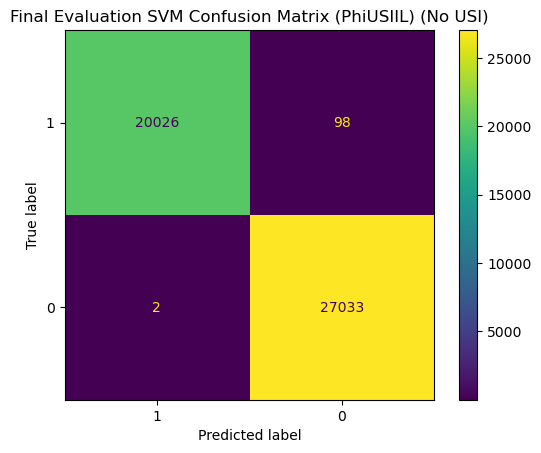

In [497]:
# '1' is the positive label corresponding to Phishing. All respective metrics will be in relation to '1'.

SVM_rm_USI_accuracy = np.array([SVM_eval_rm_USI_pred_cr_1['accuracy'], SVM_eval_rm_USI_pred_cr_2['accuracy'], SVM_eval_rm_USI_pred_cr_3['accuracy'], 
                        SVM_eval_rm_USI_pred_cr_4['accuracy'], SVM_eval_rm_USI_pred_cr_5['accuracy']])
SVM_rm_USI_precision = np.array([SVM_eval_rm_USI_pred_cr_1['1']['precision'], SVM_eval_rm_USI_pred_cr_2['1']['precision'], 
                         SVM_eval_rm_USI_pred_cr_3['1']['precision'], SVM_eval_rm_USI_pred_cr_4['1']['precision'], 
                         SVM_eval_rm_USI_pred_cr_5['1']['precision']])
SVM_rm_USI_recall = np.array([SVM_eval_rm_USI_pred_cr_1['1']['recall'], SVM_eval_rm_USI_pred_cr_2['1']['recall'], 
                              SVM_eval_rm_USI_pred_cr_3['1']['recall'], SVM_eval_rm_USI_pred_cr_4['1']['recall'], 
                              SVM_eval_rm_USI_pred_cr_5['1']['recall']])
SVM_rm_USI_f1 = np.array([SVM_eval_rm_USI_pred_cr_1['1']['f1-score'], SVM_eval_rm_USI_pred_cr_2['1']['f1-score'], 
                          SVM_eval_rm_USI_pred_cr_3['1']['f1-score'], SVM_eval_rm_USI_pred_cr_4['1']['f1-score'], 
                          SVM_eval_rm_USI_pred_cr_5['1']['f1-score']])

print("\nFinal evaluation results:")
print(f"SVM Accuracy: {SVM_rm_USI_accuracy.mean()} ± {SVM_rm_USI_accuracy.std()}")
print(f"SVM Precision: {SVM_rm_USI_precision.mean()} ± {SVM_rm_USI_precision.std()}")
print(f"SVM Recall: {SVM_rm_USI_recall.mean()} ± {SVM_rm_USI_recall.std()}")
print(f"SVM F1: {SVM_rm_USI_f1.mean()} ± {SVM_rm_USI_f1.std()}")

SVM_eval_rm_USI_preds = np.concatenate([SVM_eval_rm_USI_pred_1, SVM_eval_rm_USI_pred_2, SVM_eval_rm_USI_pred_3, SVM_eval_rm_USI_pred_4, 
                                       SVM_eval_rm_USI_pred_5])
y_test_phi_SVM_rm_USI_all = np.concatenate([y_test_phi_SVM_rm_USI_1, y_test_phi_SVM_rm_USI_2, y_test_phi_SVM_rm_USI_3, y_test_phi_SVM_rm_USI_4, 
                                           y_test_phi_SVM_rm_USI_5])

SVM_eval_rm_USI_cv_cm = ConfusionMatrixDisplay.from_predictions(y_test_phi_SVM_rm_USI_all, SVM_eval_rm_USI_preds, values_format='d', 
                                                        labels=[1, 0], display_labels=[1, 0])
_ = SVM_eval_rm_USI_cv_cm.ax_.set(title="Final Evaluation SVM Confusion Matrix (PhiUSIIL) (No USI)")

## 12. Final Evaluation (ISCXURL-2016)

In [154]:
# Final models being evaluated (ISCXURL-2016)

RF_ISCX = make_pipeline(StandardScaler(), RandomForestClassifier(max_depth=20, min_samples_leaf=1, min_samples_split=3, 
                                                                 random_state=42, n_jobs=-1))
GNB_ISCX = make_pipeline(StandardScaler(), GaussianNB(var_smoothing=1e-2))
SVM_ISCX = make_pipeline(StandardScaler(), SVC(C=4, gamma=0.1, random_state=42))

RF_ISCX_default = make_pipeline(StandardScaler(), RandomForestClassifier(random_state=42, n_jobs=-1))
GNB_ISCX_default = make_pipeline(StandardScaler(), GaussianNB())
SVM_ISCX_default = make_pipeline(StandardScaler(), SVC(random_state=42))

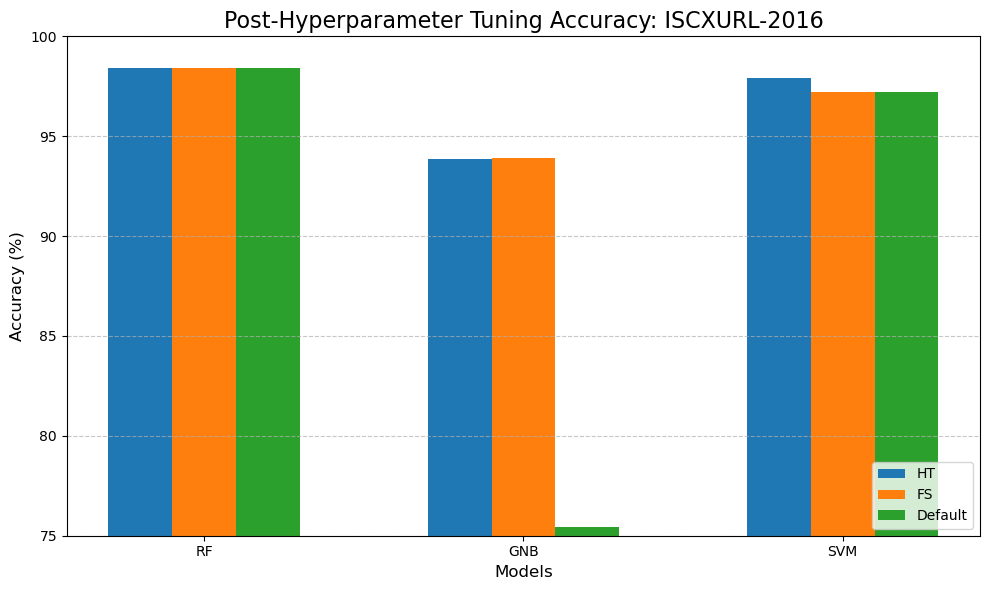

In [180]:
# Metrics for the models
models = ["RF", 'GNB', 'SVM']
ht = [98.430, 93.866, 97.893]
fs = [98.438, 93.932, 97.218]
default = [98.430, 75.433, 97.210]

# Combine metrics into a single data structure
metrics = [ht, fs, default]
metric_names = ['HT', 'FS', 'Default']

# Bar chart properties
x = np.arange(len(models))  # x positions for groups
width = 0.2  # Width of each bar

# Create the plot
fig, ax = plt.subplots(figsize=(10, 6))

# Plot each metric as a group of bars
for i, metric in enumerate(metrics):
    ax.bar(x + i * width, metric, width, label=metric_names[i])

# Formatting the chart
ax.set_title('Post-Hyperparameter Tuning Accuracy: ISCXURL-2016', fontsize=16)
ax.set_xlabel('Models', fontsize=12)
ax.set_ylabel('Accuracy (%)', fontsize=12)
ax.set_xticks(x + width)  # Center the group labels
ax.set_xticklabels(models, fontsize=10)
ax.legend(loc='lower right', fontsize=10)
ax.set_ylim(75, 100)  # Assuming metric scores are between 0 and 1

# Add gridlines for better readability
ax.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot
plt.tight_layout()
plt.show()

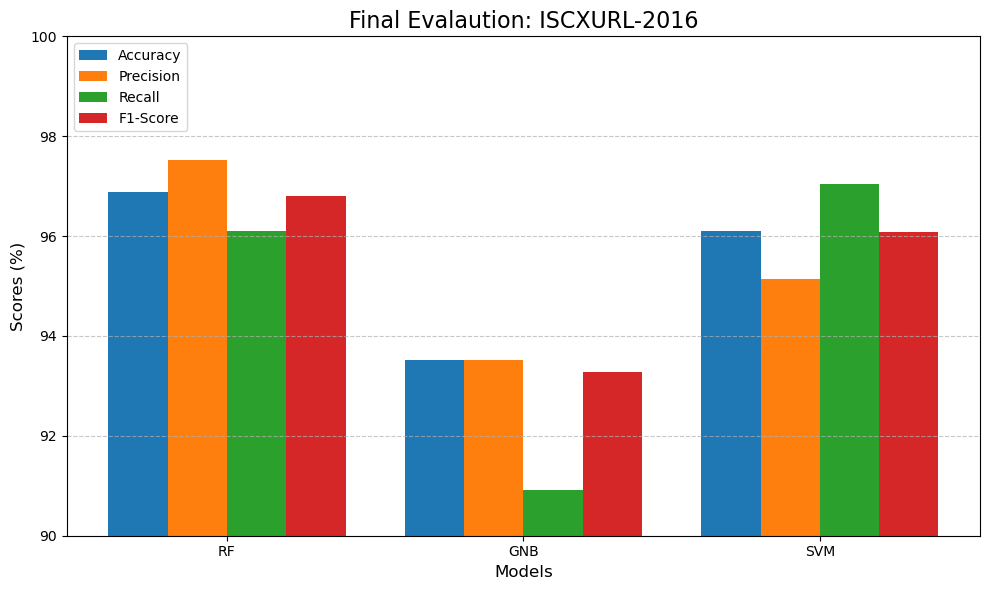

In [256]:
# Metrics for the models
models = ["RF", 'GNB', 'SVM']
accuracy = [96.877, 93.527, 96.096 ]
precision = [97.529, 93.527, 95.138 ]
recall = [96.095, 90.914, 97.049 ]
f1_score = [96.801, 93.269, 96.080 ]

# Combine metrics into a single data structure
metrics = [accuracy, precision, recall, f1_score]
metric_names = ['Accuracy', 'Precision', 'Recall', 'F1-Score']

# Bar chart properties
x = np.arange(len(models))  # x positions for groups
width = 0.2  # Width of each bar

# Create the plot
fig, ax = plt.subplots(figsize=(10, 6))

# Plot each metric as a group of bars
for i, metric in enumerate(metrics):
    ax.bar(x + i * width, metric, width, label=metric_names[i])

# Formatting the chart
ax.set_title('Final Evalaution: ISCXURL-2016', fontsize=16)
ax.set_xlabel('Models', fontsize=12)
ax.set_ylabel('Scores (%)', fontsize=12)
ax.set_xticks(x + 1.5 * width)  # Center the group labels
ax.set_xticklabels(models, fontsize=10)
ax.legend(loc='upper left', fontsize=10)
ax.set_ylim(90, 100)  # Assuming metric scores are between 0 and 1

# Add gridlines for better readability
ax.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot
plt.tight_layout()
plt.show()

### 12.1 Random Forest

URL_Type_obf_Type
0    6222
1    6071
Name: count, dtype: int64

Results on entire training set:
RF Accuracy: 0.9843002457553677 ± 0.0032891229939046723
RF Precision: 0.988066108373473 ± 0.004859160134656205
RF Recall: 0.9800694232581474 ± 0.003733626362739333
RF F1: 0.9840436370423398 ± 0.003319437267191793


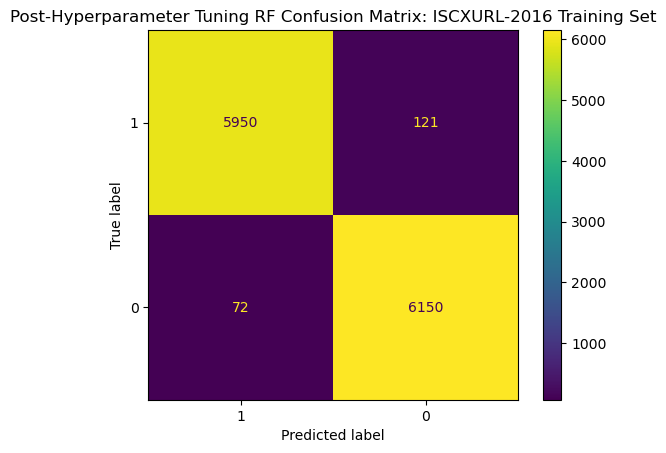

In [156]:
# Post hyperparameter tuning evaluation on entire training set. Refer to Section 8.

print(y_train_ISCX.value_counts())

RF_ISCX_cv = cross_validate(RF_ISCX, x_train_ISCX_RF2, y_train_ISCX, cv=StratifiedKFold(), scoring=scoring, n_jobs=-1, error_score='raise')

RF_ISCX_cv_pred = cross_val_predict(RF_ISCX, x_train_ISCX_RF2, y_train_ISCX, cv=StratifiedKFold(), n_jobs=-1)

print("\nResults on entire training set:")
print(f"RF Accuracy: {RF_ISCX_cv['test_accuracy'].mean()} ± {RF_ISCX_cv['test_accuracy'].std()}")
print(f"RF Precision: {RF_ISCX_cv['test_precision'].mean()} ± {RF_ISCX_cv['test_precision'].std()}")
print(f"RF Recall: {RF_ISCX_cv['test_recall'].mean()} ± {RF_ISCX_cv['test_recall'].std()}")
print(f"RF F1: {RF_ISCX_cv['test_f1'].mean()} ± {RF_ISCX_cv['test_f1'].std()}")

RF_ISCX_cv_cm = ConfusionMatrixDisplay.from_predictions(y_train_ISCX, RF_ISCX_cv_pred, values_format='d', labels=[1, 0], display_labels=[1, 0])
_ = RF_ISCX_cv_cm.ax_.set(title="Post-Hyperparameter Tuning RF Confusion Matrix: ISCXURL-2016 Training Set")

#### 12.1.1 Tuned Model

In [323]:
# Split training and testing sets
# Training and testing sets are shuffled at the start to ensure randomness.
# Temp set is shuffled every train_test_split call.

train_indices = np.random.permutation(len(x_train_ISCX_RF2))

x_train_ISCX_RF_shuffle = x_train_ISCX_RF2.iloc[train_indices]
y_train_ISCX_RF_shuffle = y_train_ISCX.iloc[train_indices]

test_indices = np.random.permutation(len(x_test_ISCX_RF))

x_test_ISCX_RF_shuffle = x_test_ISCX_RF.iloc[test_indices]
y_test_ISCX_shuffle = y_test_ISCX.iloc[test_indices]

# Each subset is 20% of the training set.
# Splitting Training set

x_train_ISCX_RF_1, x_temp, y_train_ISCX_RF_1, y_temp = train_test_split(x_train_ISCX_RF_shuffle, y_train_ISCX_RF_shuffle, test_size=0.8, random_state=100)

# 2nd split is 25% of x_temp, which is 25% of 80% of the original training set. Meaning, 2nd split is 20% of the original training set.
x_train_ISCX_RF_2, x_temp, y_train_ISCX_RF_2, y_temp = train_test_split(x_temp, y_temp, test_size=0.75, random_state=101)

# 3rd split = 33.33% of 60% of original training set.
x_train_ISCX_RF_3, x_temp, y_train_ISCX_RF_3, y_temp = train_test_split(x_temp, y_temp, test_size=0.6666, random_state=102)

# 4th and 5th split = 50% of 40% of original training set.
x_train_ISCX_RF_4, x_train_ISCX_RF_5, y_train_ISCX_RF_4, y_train_ISCX_RF_5 = train_test_split(x_temp, y_temp, test_size=0.5, random_state=103)

# Splitting Testing set

x_test_ISCX_RF_1, x_temp, y_test_ISCX_RF_1, y_temp = train_test_split(x_test_ISCX_RF_shuffle, y_test_ISCX_shuffle, test_size=0.8, random_state=101)
x_test_ISCX_RF_2, x_temp, y_test_ISCX_RF_2, y_temp = train_test_split(x_temp, y_temp, test_size=0.75, random_state=102)
x_test_ISCX_RF_3, x_temp, y_test_ISCX_RF_3, y_temp = train_test_split(x_temp, y_temp, test_size=0.6666, random_state=103)
x_test_ISCX_RF_4, x_test_ISCX_RF_5, y_test_ISCX_RF_4, y_test_ISCX_RF_5 = train_test_split(x_temp, y_temp, test_size=0.5, random_state=104)

In [325]:
RF_eval_1 = RF_ISCX.fit(x_train_ISCX_RF_1, y_train_ISCX_RF_1)

RF_eval_pred_1 = RF_eval_1.predict(x_test_ISCX_RF_1)

RF_eval_pred_cr_1 = classification_report(y_test_ISCX_RF_1, RF_eval_pred_1, output_dict=True)

RF_eval_pred_cr_1

{'0': {'precision': 0.9519230769230769,
  'recall': 0.9737704918032787,
  'f1-score': 0.9627228525121555,
  'support': 305.0},
 '1': {'precision': 0.9735099337748344,
  'recall': 0.9514563106796117,
  'f1-score': 0.9623567921440263,
  'support': 309.0},
 'accuracy': 0.9625407166123778,
 'macro avg': {'precision': 0.9627165053489557,
  'recall': 0.9626134012414451,
  'f1-score': 0.9625398223280909,
  'support': 614.0},
 'weighted avg': {'precision': 0.9627868208435868,
  'recall': 0.9625407166123778,
  'f1-score': 0.9625386299490417,
  'support': 614.0}}

In [327]:
RF_eval_2 = RF_ISCX.fit(x_train_ISCX_RF_2, y_train_ISCX_RF_2)

RF_eval_pred_2 = RF_eval_2.predict(x_test_ISCX_RF_2)

RF_eval_pred_cr_2 = classification_report(y_test_ISCX_RF_2, RF_eval_pred_2, output_dict=True)

RF_eval_pred_cr_2

{'0': {'precision': 0.9484848484848485,
  'recall': 0.9842767295597484,
  'f1-score': 0.9660493827160495,
  'support': 318.0},
 '1': {'precision': 0.9824561403508771,
  'recall': 0.9427609427609428,
  'f1-score': 0.9621993127147765,
  'support': 297.0},
 'accuracy': 0.9642276422764228,
 'macro avg': {'precision': 0.9654704944178628,
  'recall': 0.9635188361603456,
  'f1-score': 0.964124347715413,
  'support': 615.0},
 'weighted avg': {'precision': 0.9648904967518575,
  'recall': 0.9642276422764228,
  'f1-score': 0.9641900806178738,
  'support': 615.0}}

In [329]:
RF_eval_3 = RF_ISCX.fit(x_train_ISCX_RF_3, y_train_ISCX_RF_3)

RF_eval_pred_3 = RF_eval_3.predict(x_test_ISCX_RF_3)

RF_eval_pred_cr_3 = classification_report(y_test_ISCX_RF_3, RF_eval_pred_3, output_dict=True)

RF_eval_pred_cr_3

{'0': {'precision': 0.9727891156462585,
  'recall': 0.9694915254237289,
  'f1-score': 0.9711375212224109,
  'support': 295.0},
 '1': {'precision': 0.9719626168224299,
  'recall': 0.975,
  'f1-score': 0.9734789391575662,
  'support': 320.0},
 'accuracy': 0.9723577235772358,
 'macro avg': {'precision': 0.9723758662343442,
  'recall': 0.9722457627118644,
  'f1-score': 0.9723082301899886,
  'support': 615.0},
 'weighted avg': {'precision': 0.9723590674777624,
  'recall': 0.9723577235772358,
  'f1-score': 0.9723558199854185,
  'support': 615.0}}

In [331]:
RF_eval_4 = RF_ISCX.fit(x_train_ISCX_RF_4, y_train_ISCX_RF_4)

RF_eval_pred_4 = RF_eval_4.predict(x_test_ISCX_RF_4)

RF_eval_pred_cr_4 = classification_report(y_test_ISCX_RF_4, RF_eval_pred_4, output_dict=True)

RF_eval_pred_cr_4

{'0': {'precision': 0.972972972972973,
  'recall': 0.9759036144578314,
  'f1-score': 0.974436090225564,
  'support': 332.0},
 '1': {'precision': 0.9716312056737588,
  'recall': 0.9681978798586572,
  'f1-score': 0.9699115044247787,
  'support': 283.0},
 'accuracy': 0.9723577235772358,
 'macro avg': {'precision': 0.9723020893233659,
  'recall': 0.9720507471582442,
  'f1-score': 0.9721737973251714,
  'support': 615.0},
 'weighted avg': {'precision': 0.9723555418417898,
  'recall': 0.9723577235772358,
  'f1-score': 0.9723540450521946,
  'support': 615.0}}

In [333]:
RF_eval_5 = RF_ISCX.fit(x_train_ISCX_RF_5, y_train_ISCX_RF_5)

RF_eval_pred_5 = RF_eval_5.predict(x_test_ISCX_RF_5)

RF_eval_pred_cr_5 = classification_report(y_test_ISCX_RF_5, RF_eval_pred_5, output_dict=True)

RF_eval_pred_cr_5

{'0': {'precision': 0.967948717948718,
  'recall': 0.9773462783171522,
  'f1-score': 0.9726247987117552,
  'support': 309.0},
 '1': {'precision': 0.976897689768977,
  'recall': 0.9673202614379085,
  'f1-score': 0.9720853858784894,
  'support': 306.0},
 'accuracy': 0.9723577235772358,
 'macro avg': {'precision': 0.9724232038588474,
  'recall': 0.9723332698775303,
  'f1-score': 0.9723550922951223,
  'support': 615.0},
 'weighted avg': {'precision': 0.9724013770983101,
  'recall': 0.9723577235772358,
  'f1-score': 0.9723564079361791,
  'support': 615.0}}


Final evaluation results:
RF Accuracy: 0.9687683059241017 ± 0.004428368825261575
RF Precision: 0.9752915172781755 ± 0.004038938298839528
RF Recall: 0.960947078947424 ± 0.011928842280186678
RF F1: 0.9680063868639275 ± 0.004813659006638174


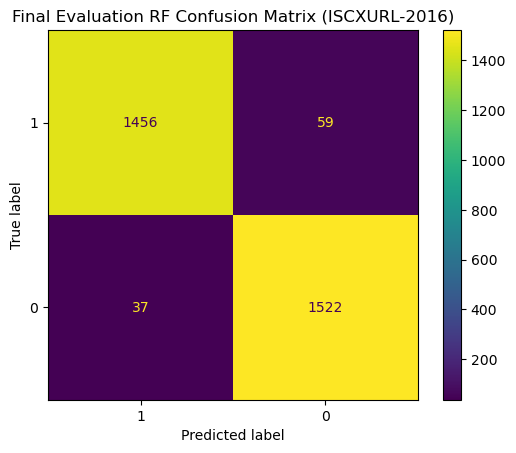

In [335]:
# '1' is the positive label corresponding to Phishing. All respective metrics will be in relation to '1'.

RF_accuracy = np.array([RF_eval_pred_cr_1['accuracy'], RF_eval_pred_cr_2['accuracy'], RF_eval_pred_cr_3['accuracy'], RF_eval_pred_cr_4['accuracy'],
              RF_eval_pred_cr_5['accuracy']])
RF_precision = np.array([RF_eval_pred_cr_1['1']['precision'], RF_eval_pred_cr_2['1']['precision'], RF_eval_pred_cr_3['1']['precision'],
               RF_eval_pred_cr_4['1']['precision'], RF_eval_pred_cr_5['1']['precision']])
RF_recall = np.array([RF_eval_pred_cr_1['1']['recall'], RF_eval_pred_cr_2['1']['recall'], RF_eval_pred_cr_3['1']['recall'], 
                      RF_eval_pred_cr_4['1']['recall'], RF_eval_pred_cr_5['1']['recall']])
RF_f1 = np.array([RF_eval_pred_cr_1['1']['f1-score'], RF_eval_pred_cr_2['1']['f1-score'], RF_eval_pred_cr_3['1']['f1-score'], 
                  RF_eval_pred_cr_4['1']['f1-score'], RF_eval_pred_cr_5['1']['f1-score']])

print("\nFinal evaluation results:")
print(f"RF Accuracy: {RF_accuracy.mean()} ± {RF_accuracy.std()}")
print(f"RF Precision: {RF_precision.mean()} ± {RF_precision.std()}")
print(f"RF Recall: {RF_recall.mean()} ± {RF_recall.std()}")
print(f"RF F1: {RF_f1.mean()} ± {RF_f1.std()}")

RF_eval_preds = np.concatenate([RF_eval_pred_1, RF_eval_pred_2, RF_eval_pred_3, RF_eval_pred_4, RF_eval_pred_5])
y_test_ISCX_RF_all = np.concatenate([y_test_ISCX_RF_1, y_test_ISCX_RF_2, y_test_ISCX_RF_3, y_test_ISCX_RF_4, y_test_ISCX_RF_5])

RF_eval_cv_cm = ConfusionMatrixDisplay.from_predictions(y_test_ISCX_RF_all, RF_eval_preds, values_format='d', 
                                                        labels=[1, 0], display_labels=[1, 0])
_ = RF_eval_cv_cm.ax_.set(title="Final Evaluation RF Confusion Matrix (ISCXURL-2016)")

#### 12.1.2 Baseline Model

In [215]:
# Baseline evaluation on test set to verify final evaluation results.

train_indices = np.random.permutation(len(x_train_ISCX))

x_train_ISCX_RF_shuffle = x_train_ISCX.iloc[train_indices]
y_train_ISCX_RF_shuffle = y_train_ISCX.iloc[train_indices]

test_indices = np.random.permutation(len(x_test_ISCX))

x_test_ISCX_RF_shuffle = x_test_ISCX.iloc[test_indices]
y_test_ISCX_shuffle = y_test_ISCX.iloc[test_indices]

# Each subset is 20% of the training set.
# Splitting Training set

x_train_ISCX_RF_1, x_temp, y_train_ISCX_RF_1, y_temp = train_test_split(x_train_ISCX_RF_shuffle, y_train_ISCX_RF_shuffle, test_size=0.8, random_state=100)

# 2nd split is 25% of x_temp, which is 25% of 80% of the original training set. Meaning, 2nd split is 20% of the original training set.
x_train_ISCX_RF_2, x_temp, y_train_ISCX_RF_2, y_temp = train_test_split(x_temp, y_temp, test_size=0.75, random_state=101)

# 3rd split = 33.33% of 60% of original training set.
x_train_ISCX_RF_3, x_temp, y_train_ISCX_RF_3, y_temp = train_test_split(x_temp, y_temp, test_size=0.6666, random_state=102)

# 4th and 5th split = 50% of 40% of original training set.
x_train_ISCX_RF_4, x_train_ISCX_RF_5, y_train_ISCX_RF_4, y_train_ISCX_RF_5 = train_test_split(x_temp, y_temp, test_size=0.5, random_state=103)

# Splitting Testing set

x_test_ISCX_RF_1, x_temp, y_test_ISCX_RF_1, y_temp = train_test_split(x_test_ISCX_RF_shuffle, y_test_ISCX_shuffle, test_size=0.8, random_state=101)
x_test_ISCX_RF_2, x_temp, y_test_ISCX_RF_2, y_temp = train_test_split(x_temp, y_temp, test_size=0.75, random_state=102)
x_test_ISCX_RF_3, x_temp, y_test_ISCX_RF_3, y_temp = train_test_split(x_temp, y_temp, test_size=0.6666, random_state=103)
x_test_ISCX_RF_4, x_test_ISCX_RF_5, y_test_ISCX_RF_4, y_test_ISCX_RF_5 = train_test_split(x_temp, y_temp, test_size=0.5, random_state=104)

In [289]:
RF_eval_1 = RF_ISCX_default.fit(x_train_ISCX_RF_1, y_train_ISCX_RF_1)

RF_eval_pred_1 = RF_eval_1.predict(x_test_ISCX_RF_1)

RF_eval_pred_cr_1 = classification_report(y_test_ISCX_RF_1, RF_eval_pred_1, output_dict=True)

RF_eval_pred_cr_1

{'0': {'precision': 0.9669669669669669,
  'recall': 0.9787234042553191,
  'f1-score': 0.972809667673716,
  'support': 329.0},
 '1': {'precision': 0.9750889679715302,
  'recall': 0.9614035087719298,
  'f1-score': 0.9681978798586572,
  'support': 285.0},
 'accuracy': 0.9706840390879479,
 'macro avg': {'precision': 0.9710279674692486,
  'recall': 0.9700634565136245,
  'f1-score': 0.9705037737661866,
  'support': 614.0},
 'weighted avg': {'precision': 0.9707369511466094,
  'recall': 0.9706840390879479,
  'f1-score': 0.9706690169778011,
  'support': 614.0}}

In [291]:
RF_eval_2 = RF_ISCX_default.fit(x_train_ISCX_RF_2, y_train_ISCX_RF_2)

RF_eval_pred_2 = RF_eval_2.predict(x_test_ISCX_RF_2)

RF_eval_pred_cr_2 = classification_report(y_test_ISCX_RF_2, RF_eval_pred_2, output_dict=True)

RF_eval_pred_cr_2

{'0': {'precision': 0.9807692307692307,
  'recall': 0.9652996845425867,
  'f1-score': 0.9729729729729729,
  'support': 317.0},
 '1': {'precision': 0.9636963696369637,
  'recall': 0.9798657718120806,
  'f1-score': 0.9717138103161398,
  'support': 298.0},
 'accuracy': 0.9723577235772358,
 'macro avg': {'precision': 0.9722328002030972,
  'recall': 0.9725827281773336,
  'f1-score': 0.9723433916445563,
  'support': 615.0},
 'weighted avg': {'precision': 0.9724965273262786,
  'recall': 0.9723577235772358,
  'f1-score': 0.9723628421246211,
  'support': 615.0}}

In [293]:
RF_eval_3 = RF_ISCX_default.fit(x_train_ISCX_RF_3, y_train_ISCX_RF_3)

RF_eval_pred_3 = RF_eval_3.predict(x_test_ISCX_RF_3)

RF_eval_pred_cr_3 = classification_report(y_test_ISCX_RF_3, RF_eval_pred_3, output_dict=True)

RF_eval_pred_cr_3

{'0': {'precision': 0.9488817891373802,
  'recall': 0.9705882352941176,
  'f1-score': 0.9596122778675282,
  'support': 306.0},
 '1': {'precision': 0.9701986754966887,
  'recall': 0.948220064724919,
  'f1-score': 0.9590834697217675,
  'support': 309.0},
 'accuracy': 0.959349593495935,
 'macro avg': {'precision': 0.9595402323170344,
  'recall': 0.9594041500095183,
  'f1-score': 0.9593478737946479,
  'support': 615.0},
 'weighted avg': {'precision': 0.9595922247227888,
  'recall': 0.959349593495935,
  'f1-score': 0.9593465840186826,
  'support': 615.0}}

In [295]:
RF_eval_4 = RF_ISCX_default.fit(x_train_ISCX_RF_4, y_train_ISCX_RF_4)

RF_eval_pred_4 = RF_eval_4.predict(x_test_ISCX_RF_4)

RF_eval_pred_cr_4 = classification_report(y_test_ISCX_RF_4, RF_eval_pred_4, output_dict=True)

RF_eval_pred_cr_4

{'0': {'precision': 0.9510703363914373,
  'recall': 0.9904458598726115,
  'f1-score': 0.9703588143525741,
  'support': 314.0},
 '1': {'precision': 0.9895833333333334,
  'recall': 0.946843853820598,
  'f1-score': 0.967741935483871,
  'support': 301.0},
 'accuracy': 0.9691056910569106,
 'macro avg': {'precision': 0.9703268348623854,
  'recall': 0.9686448568466047,
  'f1-score': 0.9690503749182225,
  'support': 615.0},
 'weighted avg': {'precision': 0.969919786927227,
  'recall': 0.9691056910569106,
  'f1-score': 0.9690780329875666,
  'support': 615.0}}

In [297]:
RF_eval_5 = RF_ISCX_default.fit(x_train_ISCX_RF_5, y_train_ISCX_RF_5)

RF_eval_pred_5 = RF_eval_5.predict(x_test_ISCX_RF_5)

RF_eval_pred_cr_5 = classification_report(y_test_ISCX_RF_5, RF_eval_pred_5, output_dict=True)

RF_eval_pred_cr_5

{'0': {'precision': 0.9533333333333334,
  'recall': 0.9761092150170648,
  'f1-score': 0.9645868465430016,
  'support': 293.0},
 '1': {'precision': 0.9777777777777777,
  'recall': 0.9565217391304348,
  'f1-score': 0.967032967032967,
  'support': 322.0},
 'accuracy': 0.9658536585365853,
 'macro avg': {'precision': 0.9655555555555555,
  'recall': 0.9663154770737499,
  'f1-score': 0.9658099067879844,
  'support': 615.0},
 'weighted avg': {'precision': 0.9661318879855464,
  'recall': 0.9658536585365853,
  'f1-score': 0.9658675795475038,
  'support': 615.0}}


Final evaluation results:
RF Accuracy: 0.9674701411509229 ± 0.004592361825422259
RF Precision: 0.9752690248432587 ± 0.008612322338749147
RF Recall: 0.9585709876519924 ± 0.011919376671322939
RF F1: 0.9667540124826806 ± 0.004161138817501743


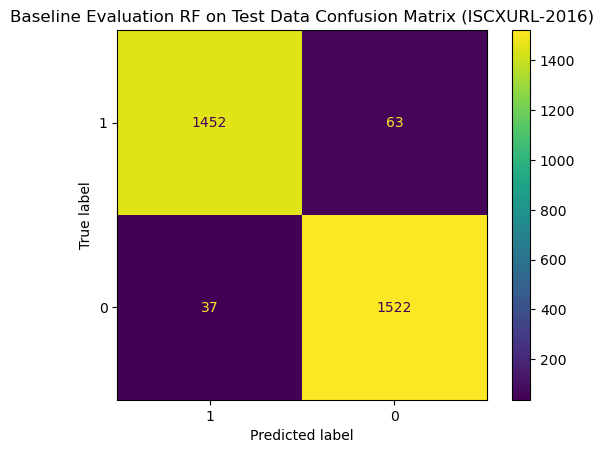

In [299]:
# '1' is the positive label corresponding to Phishing. All respective metrics will be in relation to '1'.

RF_accuracy = np.array([RF_eval_pred_cr_1['accuracy'], RF_eval_pred_cr_2['accuracy'], RF_eval_pred_cr_3['accuracy'], RF_eval_pred_cr_4['accuracy'],
              RF_eval_pred_cr_5['accuracy']])
RF_precision = np.array([RF_eval_pred_cr_1['1']['precision'], RF_eval_pred_cr_2['1']['precision'], RF_eval_pred_cr_3['1']['precision'],
               RF_eval_pred_cr_4['1']['precision'], RF_eval_pred_cr_5['1']['precision']])
RF_recall = np.array([RF_eval_pred_cr_1['1']['recall'], RF_eval_pred_cr_2['1']['recall'], RF_eval_pred_cr_3['1']['recall'], 
                      RF_eval_pred_cr_4['1']['recall'], RF_eval_pred_cr_5['1']['recall']])
RF_f1 = np.array([RF_eval_pred_cr_1['1']['f1-score'], RF_eval_pred_cr_2['1']['f1-score'], RF_eval_pred_cr_3['1']['f1-score'], 
                  RF_eval_pred_cr_4['1']['f1-score'], RF_eval_pred_cr_5['1']['f1-score']])

print("\nFinal evaluation results:")
print(f"RF Accuracy: {RF_accuracy.mean()} ± {RF_accuracy.std()}")
print(f"RF Precision: {RF_precision.mean()} ± {RF_precision.std()}")
print(f"RF Recall: {RF_recall.mean()} ± {RF_recall.std()}")
print(f"RF F1: {RF_f1.mean()} ± {RF_f1.std()}")

RF_eval_preds = np.concatenate([RF_eval_pred_1, RF_eval_pred_2, RF_eval_pred_3, RF_eval_pred_4, RF_eval_pred_5])
y_test_ISCX_RF_all = np.concatenate([y_test_ISCX_RF_1, y_test_ISCX_RF_2, y_test_ISCX_RF_3, y_test_ISCX_RF_4, y_test_ISCX_RF_5])

RF_eval_cv_cm = ConfusionMatrixDisplay.from_predictions(y_test_ISCX_RF_all, RF_eval_preds, values_format='d', 
                                                        labels=[1, 0], display_labels=[1, 0])
_ = RF_eval_cv_cm.ax_.set(title="Baseline Evaluation RF on Test Data Confusion Matrix (ISCXURL-2016)")

### 12.2 Gaussian Naive Bayes

URL_Type_obf_Type
0    6222
1    6071
Name: count, dtype: int64

Results on entire training set:
GNB Accuracy: 0.9386640993663038 ± 0.004468280701414986
GNB Precision: 0.965986127073533 ± 0.0027800606807091227
GNB Recall: 0.9077579135056713 ± 0.0070894647590975
GNB F1: 0.9359589861279701 ± 0.004829978525586568


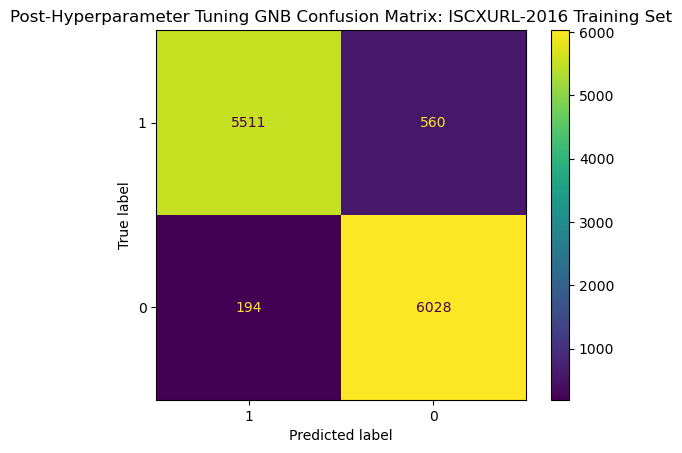

In [160]:
# Post hyperparameter tuning evaluation on entire training set. Refer to Section 8.

print(y_train_ISCX.value_counts())

GNB_ISCX_cv = cross_validate(GNB_ISCX, x_train_ISCX_GNB, y_train_ISCX, cv=StratifiedKFold(), scoring=scoring, n_jobs=-1, error_score='raise')

GNB_ISCX_cv_pred = cross_val_predict(GNB_ISCX, x_train_ISCX_GNB, y_train_ISCX, cv=StratifiedKFold(), n_jobs=-1)

print("\nResults on entire training set:")
print(f"GNB Accuracy: {GNB_ISCX_cv['test_accuracy'].mean()} ± {GNB_ISCX_cv['test_accuracy'].std()}")
print(f"GNB Precision: {GNB_ISCX_cv['test_precision'].mean()} ± {GNB_ISCX_cv['test_precision'].std()}")
print(f"GNB Recall: {GNB_ISCX_cv['test_recall'].mean()} ± {GNB_ISCX_cv['test_recall'].std()}")
print(f"GNB F1: {GNB_ISCX_cv['test_f1'].mean()} ± {GNB_ISCX_cv['test_f1'].std()}")

GNB_ISCX_cv_cm = ConfusionMatrixDisplay.from_predictions(y_train_ISCX, GNB_ISCX_cv_pred, values_format='d', labels=[1, 0], display_labels=[1, 0])
_ = GNB_ISCX_cv_cm.ax_.set(title="Post-Hyperparameter Tuning GNB Confusion Matrix: ISCXURL-2016 Training Set")

#### 12.2.1 Tuned Model

In [386]:
# Split training and testing sets
# Training and testing sets are shuffled at the start to ensure randomness.
# Temp set is shuffled every train_test_split call.

train_indices = np.random.permutation(len(x_train_ISCX_GNB))

x_train_ISCX_GNB_shuffle = x_train_ISCX_GNB.iloc[train_indices]
y_train_ISCX_GNB_shuffle = y_train_ISCX.iloc[train_indices]

test_indices = np.random.permutation(len(x_test_ISCX_GNB))

x_test_ISCX_GNB_shuffle = x_test_ISCX_GNB.iloc[test_indices]
y_test_ISCX_shuffle = y_test_ISCX.iloc[test_indices]

# Each subset is 20% of the training set.
# Splitting Training set

x_train_ISCX_GNB_1, x_temp, y_train_ISCX_GNB_1, y_temp = train_test_split(x_train_ISCX_GNB_shuffle, y_train_ISCX_GNB_shuffle, test_size=0.8, random_state=100)

# 2nd split is 25% of x_temp, which is 25% of 80% of the original training set. Meaning, 2nd split is 20% of the original training set.
x_train_ISCX_GNB_2, x_temp, y_train_ISCX_GNB_2, y_temp = train_test_split(x_temp, y_temp, test_size=0.75, random_state=101)

# 3rd split = 33.33% of 60% of original training set.
x_train_ISCX_GNB_3, x_temp, y_train_ISCX_GNB_3, y_temp = train_test_split(x_temp, y_temp, test_size=0.6666, random_state=102)

# 4th and 5th split = 50% of 40% of original training set.
x_train_ISCX_GNB_4, x_train_ISCX_GNB_5, y_train_ISCX_GNB_4, y_train_ISCX_GNB_5 = train_test_split(x_temp, y_temp, test_size=0.5, random_state=103)

# Splitting Testing set

x_test_ISCX_GNB_1, x_temp, y_test_ISCX_GNB_1, y_temp = train_test_split(x_test_ISCX_GNB_shuffle, y_test_ISCX_shuffle, test_size=0.8, random_state=101)
x_test_ISCX_GNB_2, x_temp, y_test_ISCX_GNB_2, y_temp = train_test_split(x_temp, y_temp, test_size=0.75, random_state=102)
x_test_ISCX_GNB_3, x_temp, y_test_ISCX_GNB_3, y_temp = train_test_split(x_temp, y_temp, test_size=0.6666, random_state=103)
x_test_ISCX_GNB_4, x_test_ISCX_GNB_5, y_test_ISCX_GNB_4, y_test_ISCX_GNB_5 = train_test_split(x_temp, y_temp, test_size=0.5, random_state=104)

In [388]:
GNB_eval_1 = GNB_ISCX.fit(x_train_ISCX_GNB_1, y_train_ISCX_GNB_1)

GNB_eval_pred_1 = GNB_eval_1.predict(x_test_ISCX_GNB_1)

GNB_eval_pred_cr_1 = classification_report(y_test_ISCX_GNB_1, GNB_eval_pred_1, output_dict=True)

GNB_eval_pred_cr_1

{'0': {'precision': 0.936231884057971,
  'recall': 0.9613095238095238,
  'f1-score': 0.9486049926578561,
  'support': 336.0},
 '1': {'precision': 0.9516728624535316,
  'recall': 0.920863309352518,
  'f1-score': 0.9360146252285192,
  'support': 278.0},
 'accuracy': 0.9429967426710097,
 'macro avg': {'precision': 0.9439523732557513,
  'recall': 0.9410864165810209,
  'f1-score': 0.9423098089431876,
  'support': 614.0},
 'weighted avg': {'precision': 0.9432230762305538,
  'recall': 0.9429967426710097,
  'f1-score': 0.942904467991153,
  'support': 614.0}}

In [390]:
GNB_eval_2 = GNB_ISCX.fit(x_train_ISCX_GNB_2, y_train_ISCX_GNB_2)

GNB_eval_pred_2 = GNB_eval_2.predict(x_test_ISCX_GNB_2)

GNB_eval_pred_cr_2 = classification_report(y_test_ISCX_GNB_2, GNB_eval_pred_2, output_dict=True)

GNB_eval_pred_cr_2

{'0': {'precision': 0.9161676646706587,
  'recall': 0.9714285714285714,
  'f1-score': 0.9429892141756547,
  'support': 315.0},
 '1': {'precision': 0.9679715302491103,
  'recall': 0.9066666666666666,
  'f1-score': 0.9363166953528398,
  'support': 300.0},
 'accuracy': 0.9398373983739837,
 'macro avg': {'precision': 0.9420695974598845,
  'recall': 0.939047619047619,
  'f1-score': 0.9396529547642473,
  'support': 615.0},
 'weighted avg': {'precision': 0.9414378430016106,
  'recall': 0.9398373983739837,
  'f1-score': 0.9397343269450135,
  'support': 615.0}}

In [392]:
GNB_eval_3 = GNB_ISCX.fit(x_train_ISCX_GNB_3, y_train_ISCX_GNB_3)

GNB_eval_pred_3 = GNB_eval_3.predict(x_test_ISCX_GNB_3)

GNB_eval_pred_cr_3 = classification_report(y_test_ISCX_GNB_3, GNB_eval_pred_3, output_dict=True)

GNB_eval_pred_cr_3

{'0': {'precision': 0.9009287925696594,
  'recall': 0.9572368421052632,
  'f1-score': 0.9282296650717704,
  'support': 304.0},
 '1': {'precision': 0.9554794520547946,
  'recall': 0.8971061093247589,
  'f1-score': 0.9253731343283582,
  'support': 311.0},
 'accuracy': 0.926829268292683,
 'macro avg': {'precision': 0.928204122312227,
  'recall': 0.927171475715011,
  'f1-score': 0.9268013997000644,
  'support': 615.0},
 'weighted avg': {'precision': 0.928514573219866,
  'recall': 0.926829268292683,
  'f1-score': 0.9267851430210369,
  'support': 615.0}}

In [394]:
GNB_eval_4 = GNB_ISCX.fit(x_train_ISCX_GNB_4, y_train_ISCX_GNB_4)

GNB_eval_pred_4 = GNB_eval_4.predict(x_test_ISCX_GNB_4)

GNB_eval_pred_cr_4 = classification_report(y_test_ISCX_GNB_4, GNB_eval_pred_4, output_dict=True)

GNB_eval_pred_cr_4

{'0': {'precision': 0.9203821656050956,
  'recall': 0.956953642384106,
  'f1-score': 0.9383116883116883,
  'support': 302.0},
 '1': {'precision': 0.9568106312292359,
  'recall': 0.9201277955271565,
  'f1-score': 0.9381107491856677,
  'support': 313.0},
 'accuracy': 0.9382113821138212,
 'macro avg': {'precision': 0.9385963984171657,
  'recall': 0.9385407189556312,
  'f1-score': 0.938211218748678,
  'support': 615.0},
 'weighted avg': {'precision': 0.9389221814430727,
  'recall': 0.9382113821138212,
  'f1-score': 0.9382094217321038,
  'support': 615.0}}

In [396]:
GNB_eval_5 = GNB_ISCX.fit(x_train_ISCX_GNB_5, y_train_ISCX_GNB_5)

GNB_eval_pred_5 = GNB_eval_5.predict(x_test_ISCX_GNB_5)

GNB_eval_pred_cr_5 = classification_report(y_test_ISCX_GNB_5, GNB_eval_pred_5, output_dict=True)

GNB_eval_pred_cr_5

{'0': {'precision': 0.903125,
  'recall': 0.956953642384106,
  'f1-score': 0.9292604501607716,
  'support': 302.0},
 '1': {'precision': 0.9559322033898305,
  'recall': 0.9009584664536742,
  'f1-score': 0.9276315789473686,
  'support': 313.0},
 'accuracy': 0.9284552845528455,
 'macro avg': {'precision': 0.9295286016949152,
  'recall': 0.9289560544188901,
  'f1-score': 0.92844601455407,
  'support': 615.0},
 'weighted avg': {'precision': 0.930000861237426,
  'recall': 0.9284552845528455,
  'f1-score': 0.9284314474131373,
  'support': 615.0}}


Final evaluation results:
GNB Accuracy: 0.9352660152008687 ± 0.006432754121488728
GNB Precision: 0.9575733358753006 ± 0.005488122019458051
GNB Recall: 0.909144469464955 ± 0.009757427187245015
GNB F1: 0.9326893566085508 ± 0.005151984444058915


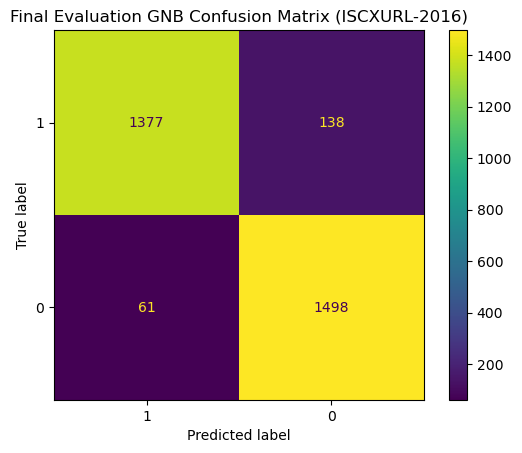

In [398]:
# '1' is the positive label corresponding to Phishing. All respective metrics will be in relation to '1'.

GNB_accuracy = np.array([GNB_eval_pred_cr_1['accuracy'], GNB_eval_pred_cr_2['accuracy'], GNB_eval_pred_cr_3['accuracy'], GNB_eval_pred_cr_4['accuracy'],
              GNB_eval_pred_cr_5['accuracy']])
GNB_precision = np.array([GNB_eval_pred_cr_1['1']['precision'], GNB_eval_pred_cr_2['1']['precision'], GNB_eval_pred_cr_3['1']['precision'],
               GNB_eval_pred_cr_4['1']['precision'], GNB_eval_pred_cr_5['1']['precision']])
GNB_recall = np.array([GNB_eval_pred_cr_1['1']['recall'], GNB_eval_pred_cr_2['1']['recall'], GNB_eval_pred_cr_3['1']['recall'], 
                      GNB_eval_pred_cr_4['1']['recall'], GNB_eval_pred_cr_5['1']['recall']])
GNB_f1 = np.array([GNB_eval_pred_cr_1['1']['f1-score'], GNB_eval_pred_cr_2['1']['f1-score'], GNB_eval_pred_cr_3['1']['f1-score'], 
                  GNB_eval_pred_cr_4['1']['f1-score'], GNB_eval_pred_cr_5['1']['f1-score']])

print("\nFinal evaluation results:")
print(f"GNB Accuracy: {GNB_accuracy.mean()} ± {GNB_accuracy.std()}")
print(f"GNB Precision: {GNB_precision.mean()} ± {GNB_precision.std()}")
print(f"GNB Recall: {GNB_recall.mean()} ± {GNB_recall.std()}")
print(f"GNB F1: {GNB_f1.mean()} ± {GNB_f1.std()}")

GNB_eval_preds = np.concatenate([GNB_eval_pred_1, GNB_eval_pred_2, GNB_eval_pred_3, GNB_eval_pred_4, GNB_eval_pred_5])
y_test_ISCX_GNB_all = np.concatenate([y_test_ISCX_GNB_1, y_test_ISCX_GNB_2, y_test_ISCX_GNB_3, y_test_ISCX_GNB_4, y_test_ISCX_GNB_5])

GNB_eval_cv_cm = ConfusionMatrixDisplay.from_predictions(y_test_ISCX_GNB_all, GNB_eval_preds, values_format='d', 
                                                        labels=[1, 0], display_labels=[1, 0])
_ = GNB_eval_cv_cm.ax_.set(title="Final Evaluation GNB Confusion Matrix (ISCXURL-2016)")

#### 12.2.2 Baseline Model

In [405]:
# Baseline evaluation on test set to verify final evaluation results.

train_indices = np.random.permutation(len(x_train_ISCX))

x_train_ISCX_GNB_shuffle = x_train_ISCX.iloc[train_indices]
y_train_ISCX_GNB_shuffle = y_train_ISCX.iloc[train_indices]

test_indices = np.random.permutation(len(x_test_ISCX))

x_test_ISCX_GNB_shuffle = x_test_ISCX.iloc[test_indices]
y_test_ISCX_shuffle = y_test_ISCX.iloc[test_indices]

# Each subset is 20% of the training set.
# Splitting Training set

x_train_ISCX_GNB_1, x_temp, y_train_ISCX_GNB_1, y_temp = train_test_split(x_train_ISCX_GNB_shuffle, y_train_ISCX_GNB_shuffle, test_size=0.8, random_state=100)

# 2nd split is 25% of x_temp, which is 25% of 80% of the original training set. Meaning, 2nd split is 20% of the original training set.
x_train_ISCX_GNB_2, x_temp, y_train_ISCX_GNB_2, y_temp = train_test_split(x_temp, y_temp, test_size=0.75, random_state=101)

# 3rd split = 33.33% of 60% of original training set.
x_train_ISCX_GNB_3, x_temp, y_train_ISCX_GNB_3, y_temp = train_test_split(x_temp, y_temp, test_size=0.6666, random_state=102)

# 4th and 5th split = 50% of 40% of original training set.
x_train_ISCX_GNB_4, x_train_ISCX_GNB_5, y_train_ISCX_GNB_4, y_train_ISCX_GNB_5 = train_test_split(x_temp, y_temp, test_size=0.5, random_state=103)

# Splitting Testing set

x_test_ISCX_GNB_1, x_temp, y_test_ISCX_GNB_1, y_temp = train_test_split(x_test_ISCX_GNB_shuffle, y_test_ISCX_shuffle, test_size=0.8, random_state=101)
x_test_ISCX_GNB_2, x_temp, y_test_ISCX_GNB_2, y_temp = train_test_split(x_temp, y_temp, test_size=0.75, random_state=102)
x_test_ISCX_GNB_3, x_temp, y_test_ISCX_GNB_3, y_temp = train_test_split(x_temp, y_temp, test_size=0.6666, random_state=103)
x_test_ISCX_GNB_4, x_test_ISCX_GNB_5, y_test_ISCX_GNB_4, y_test_ISCX_GNB_5 = train_test_split(x_temp, y_temp, test_size=0.5, random_state=104)

In [407]:
GNB_eval_1 = GNB_ISCX_default.fit(x_train_ISCX_GNB_1, y_train_ISCX_GNB_1)

GNB_eval_pred_1 = GNB_eval_1.predict(x_test_ISCX_GNB_1)

GNB_eval_pred_cr_1 = classification_report(y_test_ISCX_GNB_1, GNB_eval_pred_1, output_dict=True)

GNB_eval_pred_cr_1

{'0': {'precision': 0.7531806615776081,
  'recall': 0.9833887043189369,
  'f1-score': 0.8530259365994236,
  'support': 301.0},
 '1': {'precision': 0.9773755656108597,
  'recall': 0.6900958466453674,
  'f1-score': 0.8089887640449437,
  'support': 313.0},
 'accuracy': 0.8338762214983714,
 'macro avg': {'precision': 0.8652781135942339,
  'recall': 0.8367422754821521,
  'f1-score': 0.8310073503221836,
  'support': 614.0},
 'weighted avg': {'precision': 0.8674689432753406,
  'recall': 0.8338762214983714,
  'f1-score': 0.8305770196457555,
  'support': 614.0}}

In [409]:
GNB_eval_2 = GNB_ISCX_default.fit(x_train_ISCX_GNB_2, y_train_ISCX_GNB_2)

GNB_eval_pred_2 = GNB_eval_2.predict(x_test_ISCX_GNB_2)

GNB_eval_pred_cr_2 = classification_report(y_test_ISCX_GNB_2, GNB_eval_pred_2, output_dict=True)

GNB_eval_pred_cr_2

{'0': {'precision': 0.7581863979848866,
  'recall': 0.9772727272727273,
  'f1-score': 0.8539007092198582,
  'support': 308.0},
 '1': {'precision': 0.9678899082568807,
  'recall': 0.6872964169381107,
  'f1-score': 0.8038095238095239,
  'support': 307.0},
 'accuracy': 0.832520325203252,
 'macro avg': {'precision': 0.8630381531208837,
  'recall': 0.8322845721054191,
  'f1-score': 0.828855116514691,
  'support': 615.0},
 'weighted avg': {'precision': 0.862867662462126,
  'recall': 0.832520325203252,
  'f1-score': 0.828895841055675,
  'support': 615.0}}

In [411]:
GNB_eval_3 = GNB_ISCX_default.fit(x_train_ISCX_GNB_3, y_train_ISCX_GNB_3)

GNB_eval_pred_3 = GNB_eval_3.predict(x_test_ISCX_GNB_3)

GNB_eval_pred_cr_3 = classification_report(y_test_ISCX_GNB_3, GNB_eval_pred_3, output_dict=True)

GNB_eval_pred_cr_3

{'0': {'precision': 0.7165532879818595,
  'recall': 0.9968454258675079,
  'f1-score': 0.8337730870712401,
  'support': 317.0},
 '1': {'precision': 0.9942528735632183,
  'recall': 0.5805369127516778,
  'f1-score': 0.733050847457627,
  'support': 298.0},
 'accuracy': 0.7951219512195122,
 'macro avg': {'precision': 0.8554030807725389,
  'recall': 0.7886911693095928,
  'f1-score': 0.7834119672644335,
  'support': 615.0},
 'weighted avg': {'precision': 0.8511134123773796,
  'recall': 0.7951219512195122,
  'f1-score': 0.784967839258465,
  'support': 615.0}}

In [413]:
GNB_eval_4 = GNB_ISCX_default.fit(x_train_ISCX_GNB_4, y_train_ISCX_GNB_4)

GNB_eval_pred_4 = GNB_eval_4.predict(x_test_ISCX_GNB_4)

GNB_eval_pred_cr_4 = classification_report(y_test_ISCX_GNB_4, GNB_eval_pred_4, output_dict=True)

GNB_eval_pred_cr_4

{'0': {'precision': 0.7334851936218679,
  'recall': 0.9787234042553191,
  'f1-score': 0.8385416666666667,
  'support': 329.0},
 '1': {'precision': 0.9602272727272727,
  'recall': 0.5909090909090909,
  'f1-score': 0.7316017316017316,
  'support': 286.0},
 'accuracy': 0.7983739837398374,
 'macro avg': {'precision': 0.8468562331745704,
  'recall': 0.784816247582205,
  'f1-score': 0.7850716991341992,
  'support': 615.0},
 'weighted avg': {'precision': 0.8389294775635683,
  'recall': 0.7983739837398374,
  'f1-score': 0.78881024970964,
  'support': 615.0}}

In [415]:
GNB_eval_5 = GNB_ISCX_default.fit(x_train_ISCX_GNB_5, y_train_ISCX_GNB_5)

GNB_eval_pred_5 = GNB_eval_5.predict(x_test_ISCX_GNB_5)

GNB_eval_pred_cr_5 = classification_report(y_test_ISCX_GNB_5, GNB_eval_pred_5, output_dict=True)

GNB_eval_pred_cr_5

{'0': {'precision': 0.6988505747126437,
  'recall': 1.0,
  'f1-score': 0.8227334235453315,
  'support': 304.0},
 '1': {'precision': 1.0,
  'recall': 0.5787781350482315,
  'f1-score': 0.7331975560081466,
  'support': 311.0},
 'accuracy': 0.7869918699186992,
 'macro avg': {'precision': 0.8494252873563218,
  'recall': 0.7893890675241158,
  'f1-score': 0.7779654897767391,
  'support': 615.0},
 'weighted avg': {'precision': 0.8511391458742172,
  'recall': 0.7869918699186992,
  'f1-score': 0.7774559360590477,
  'support': 615.0}}


Final evaluation results:
GNB Accuracy: 0.8093768703159343 ± 0.019805010410085123
GNB Precision: 0.9799491240316464 ± 0.015150143132522748
GNB Recall: 0.6255232804584956 ± 0.05175434418776642
GNB F1: 0.7621296845843946 ± 0.03618724933352072


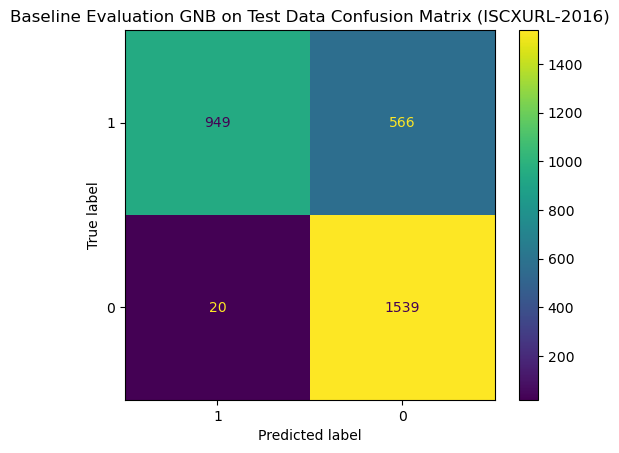

In [417]:
# '1' is the positive label corresponding to Phishing. All respective metrics will be in relation to '1'.

GNB_accuracy = np.array([GNB_eval_pred_cr_1['accuracy'], GNB_eval_pred_cr_2['accuracy'], GNB_eval_pred_cr_3['accuracy'], GNB_eval_pred_cr_4['accuracy'],
              GNB_eval_pred_cr_5['accuracy']])
GNB_precision = np.array([GNB_eval_pred_cr_1['1']['precision'], GNB_eval_pred_cr_2['1']['precision'], GNB_eval_pred_cr_3['1']['precision'],
               GNB_eval_pred_cr_4['1']['precision'], GNB_eval_pred_cr_5['1']['precision']])
GNB_recall = np.array([GNB_eval_pred_cr_1['1']['recall'], GNB_eval_pred_cr_2['1']['recall'], GNB_eval_pred_cr_3['1']['recall'], 
                      GNB_eval_pred_cr_4['1']['recall'], GNB_eval_pred_cr_5['1']['recall']])
GNB_f1 = np.array([GNB_eval_pred_cr_1['1']['f1-score'], GNB_eval_pred_cr_2['1']['f1-score'], GNB_eval_pred_cr_3['1']['f1-score'], 
                  GNB_eval_pred_cr_4['1']['f1-score'], GNB_eval_pred_cr_5['1']['f1-score']])

print("\nFinal evaluation results:")
print(f"GNB Accuracy: {GNB_accuracy.mean()} ± {GNB_accuracy.std()}")
print(f"GNB Precision: {GNB_precision.mean()} ± {GNB_precision.std()}")
print(f"GNB Recall: {GNB_recall.mean()} ± {GNB_recall.std()}")
print(f"GNB F1: {GNB_f1.mean()} ± {GNB_f1.std()}")

GNB_eval_preds = np.concatenate([GNB_eval_pred_1, GNB_eval_pred_2, GNB_eval_pred_3, GNB_eval_pred_4, GNB_eval_pred_5])
y_test_ISCX_GNB_all = np.concatenate([y_test_ISCX_GNB_1, y_test_ISCX_GNB_2, y_test_ISCX_GNB_3, y_test_ISCX_GNB_4, y_test_ISCX_GNB_5])

GNB_eval_cv_cm = ConfusionMatrixDisplay.from_predictions(y_test_ISCX_GNB_all, GNB_eval_preds, values_format='d', 
                                                        labels=[1, 0], display_labels=[1, 0])
_ = GNB_eval_cv_cm.ax_.set(title="Baseline Evaluation GNB on Test Data Confusion Matrix (ISCXURL-2016)")

### 12.3 Support Vector Machine

URL_Type_obf_Type
0    6222
1    6071
Name: count, dtype: int64

Results on entire training set:
SVM Accuracy: 0.9789314158215896 ± 0.0022306348150809706
SVM Precision: 0.9739261884969356 ± 0.004014815603935823
SVM Recall: 0.9836925851350161 ± 0.002296947771634773
SVM F1: 0.9787790074426246 ± 0.002217559289760915


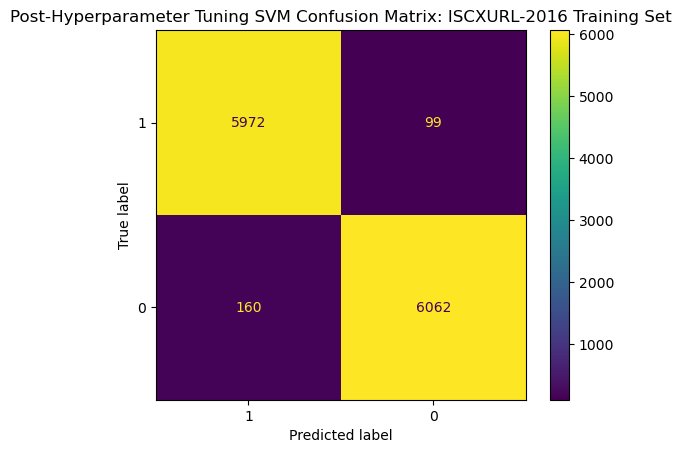

In [162]:
# Post hyperparameter tuning evaluation on entire training set. Refer to Section 8.

print(y_train_ISCX.value_counts())

SVM_ISCX_cv = cross_validate(SVM_ISCX, x_train_ISCX_SVM3, y_train_ISCX, cv=StratifiedKFold(), scoring=scoring, n_jobs=-1, error_score='raise')

SVM_ISCX_cv_pred = cross_val_predict(SVM_ISCX, x_train_ISCX_SVM3, y_train_ISCX, cv=StratifiedKFold(), n_jobs=-1)

print("\nResults on entire training set:")
print(f"SVM Accuracy: {SVM_ISCX_cv['test_accuracy'].mean()} ± {SVM_ISCX_cv['test_accuracy'].std()}")
print(f"SVM Precision: {SVM_ISCX_cv['test_precision'].mean()} ± {SVM_ISCX_cv['test_precision'].std()}")
print(f"SVM Recall: {SVM_ISCX_cv['test_recall'].mean()} ± {SVM_ISCX_cv['test_recall'].std()}")
print(f"SVM F1: {SVM_ISCX_cv['test_f1'].mean()} ± {SVM_ISCX_cv['test_f1'].std()}")

SVM_ISCX_cv_cm = ConfusionMatrixDisplay.from_predictions(y_train_ISCX, SVM_ISCX_cv_pred, values_format='d', labels=[1, 0], display_labels=[1, 0])
_ = SVM_ISCX_cv_cm.ax_.set(title="Post-Hyperparameter Tuning SVM Confusion Matrix: ISCXURL-2016 Training Set")

#### 12.3.1 Tuned Model

In [179]:
# Split training and testing sets
# Training and testing sets are shuffled at the start to ensure randomness.
# Temp set is shuffled every train_test_split call.

train_indices = np.random.permutation(len(x_train_ISCX_SVM3))

x_train_ISCX_SVM_shuffle = x_train_ISCX_SVM3.iloc[train_indices]
y_train_ISCX_SVM_shuffle = y_train_ISCX.iloc[train_indices]

test_indices = np.random.permutation(len(x_test_ISCX_SVM))

x_test_ISCX_SVM_shuffle = x_test_ISCX_SVM.iloc[test_indices]
y_test_ISCX_shuffle = y_test_ISCX.iloc[test_indices]

# Each subset is 20% of the training set.
# Splitting Training set

x_train_ISCX_SVM_1, x_temp, y_train_ISCX_SVM_1, y_temp = train_test_split(x_train_ISCX_SVM_shuffle, y_train_ISCX_SVM_shuffle, test_size=0.8, random_state=100)

# 2nd split is 25% of x_temp, which is 25% of 80% of the original training set. Meaning, 2nd split is 20% of the original training set.
x_train_ISCX_SVM_2, x_temp, y_train_ISCX_SVM_2, y_temp = train_test_split(x_temp, y_temp, test_size=0.75, random_state=101)

# 3rd split = 33.33% of 60% of original training set.
x_train_ISCX_SVM_3, x_temp, y_train_ISCX_SVM_3, y_temp = train_test_split(x_temp, y_temp, test_size=0.6666, random_state=102)

# 4th and 5th split = 50% of 40% of original training set.
x_train_ISCX_SVM_4, x_train_ISCX_SVM_5, y_train_ISCX_SVM_4, y_train_ISCX_SVM_5 = train_test_split(x_temp, y_temp, test_size=0.5, random_state=103)

# Splitting Testing set

x_test_ISCX_SVM_1, x_temp, y_test_ISCX_SVM_1, y_temp = train_test_split(x_test_ISCX_SVM_shuffle, y_test_ISCX_shuffle, test_size=0.8, random_state=101)
x_test_ISCX_SVM_2, x_temp, y_test_ISCX_SVM_2, y_temp = train_test_split(x_temp, y_temp, test_size=0.75, random_state=102)
x_test_ISCX_SVM_3, x_temp, y_test_ISCX_SVM_3, y_temp = train_test_split(x_temp, y_temp, test_size=0.6666, random_state=103)
x_test_ISCX_SVM_4, x_test_ISCX_SVM_5, y_test_ISCX_SVM_4, y_test_ISCX_SVM_5 = train_test_split(x_temp, y_temp, test_size=0.5, random_state=104)

In [181]:
SVM_eval_1 = SVM_ISCX.fit(x_train_ISCX_SVM_1, y_train_ISCX_SVM_1)

SVM_eval_pred_1 = SVM_eval_1.predict(x_test_ISCX_SVM_1)

SVM_eval_pred_cr_1 = classification_report(y_test_ISCX_SVM_1, SVM_eval_pred_1, output_dict=True)

SVM_eval_pred_cr_1

{'0': {'precision': 0.9839743589743589,
  'recall': 0.9446153846153846,
  'f1-score': 0.9638932496075352,
  'support': 325.0},
 '1': {'precision': 0.9403973509933775,
  'recall': 0.9826989619377162,
  'f1-score': 0.9610829103214891,
  'support': 289.0},
 'accuracy': 0.9625407166123778,
 'macro avg': {'precision': 0.9621858549838682,
  'recall': 0.9636571732765504,
  'f1-score': 0.9624880799645121,
  'support': 614.0},
 'weighted avg': {'precision': 0.9634633568465027,
  'recall': 0.9625407166123778,
  'f1-score': 0.9625704677611715,
  'support': 614.0}}

In [183]:
SVM_eval_2 = SVM_ISCX.fit(x_train_ISCX_SVM_2, y_train_ISCX_SVM_2)

SVM_eval_pred_2 = SVM_eval_2.predict(x_test_ISCX_SVM_2)

SVM_eval_pred_cr_2 = classification_report(y_test_ISCX_SVM_2, SVM_eval_pred_2, output_dict=True)

SVM_eval_pred_cr_2

{'0': {'precision': 0.966996699669967,
  'recall': 0.9543973941368078,
  'f1-score': 0.9606557377049181,
  'support': 307.0},
 '1': {'precision': 0.9551282051282052,
  'recall': 0.9675324675324676,
  'f1-score': 0.9612903225806452,
  'support': 308.0},
 'accuracy': 0.9609756097560975,
 'macro avg': {'precision': 0.961062452399086,
  'recall': 0.9609649308346377,
  'f1-score': 0.9609730301427817,
  'support': 615.0},
 'weighted avg': {'precision': 0.9610528032165319,
  'recall': 0.9609756097560975,
  'f1-score': 0.9609735460654447,
  'support': 615.0}}

In [185]:
SVM_eval_3 = SVM_ISCX.fit(x_train_ISCX_SVM_3, y_train_ISCX_SVM_3)

SVM_eval_pred_3 = SVM_eval_3.predict(x_test_ISCX_SVM_3)

SVM_eval_pred_cr_3 = classification_report(y_test_ISCX_SVM_3, SVM_eval_pred_3, output_dict=True)

SVM_eval_pred_cr_3

{'0': {'precision': 0.9801324503311258,
  'recall': 0.9641693811074918,
  'f1-score': 0.9720853858784892,
  'support': 307.0},
 '1': {'precision': 0.9648562300319489,
  'recall': 0.9805194805194806,
  'f1-score': 0.9726247987117552,
  'support': 308.0},
 'accuracy': 0.9723577235772358,
 'macro avg': {'precision': 0.9724943401815374,
  'recall': 0.9723444308134862,
  'f1-score': 0.9723550922951223,
  'support': 615.0},
 'weighted avg': {'precision': 0.9724819204902373,
  'recall': 0.9723577235772358,
  'f1-score': 0.972355530842141,
  'support': 615.0}}

In [187]:
SVM_eval_4 = SVM_ISCX.fit(x_train_ISCX_SVM_4, y_train_ISCX_SVM_4)

SVM_eval_pred_4 = SVM_eval_4.predict(x_test_ISCX_SVM_4)

SVM_eval_pred_cr_4 = classification_report(y_test_ISCX_SVM_4, SVM_eval_pred_4, output_dict=True)

SVM_eval_pred_cr_4

{'0': {'precision': 0.9710610932475884,
  'recall': 0.9526813880126183,
  'f1-score': 0.9617834394904459,
  'support': 317.0},
 '1': {'precision': 0.9506578947368421,
  'recall': 0.9697986577181208,
  'f1-score': 0.9601328903654486,
  'support': 298.0},
 'accuracy': 0.9609756097560975,
 'macro avg': {'precision': 0.9608594939922153,
  'recall': 0.9612400228653695,
  'f1-score': 0.9609581649279473,
  'support': 615.0},
 'weighted avg': {'precision': 0.9611746653513242,
  'recall': 0.9609756097560975,
  'f1-score': 0.9609836612152439,
  'support': 615.0}}

In [189]:
SVM_eval_5 = SVM_ISCX.fit(x_train_ISCX_SVM_5, y_train_ISCX_SVM_5)

SVM_eval_pred_5 = SVM_eval_5.predict(x_test_ISCX_SVM_5)

SVM_eval_pred_cr_5 = classification_report(y_test_ISCX_SVM_5, SVM_eval_pred_5, output_dict=True)

SVM_eval_pred_cr_5

{'0': {'precision': 0.9501661129568106,
  'recall': 0.9438943894389439,
  'f1-score': 0.9470198675496689,
  'support': 303.0},
 '1': {'precision': 0.945859872611465,
  'recall': 0.9519230769230769,
  'f1-score': 0.9488817891373802,
  'support': 312.0},
 'accuracy': 0.9479674796747968,
 'macro avg': {'precision': 0.9480129927841379,
  'recall': 0.9479087331810103,
  'f1-score': 0.9479508283435245,
  'support': 615.0},
 'weighted avg': {'precision': 0.9479814837084403,
  'recall': 0.9479674796747968,
  'f1-score': 0.9479644521600199,
  'support': 615.0}}


Final evaluation results:
SVM Accuracy: 0.9609634278753211 ± 0.007761607832528879
SVM Precision: 0.9513799107003678 ± 0.00833390231664174
SVM Recall: 0.9704945289261724 ± 0.010987308255646467
SVM F1: 0.9608025422233437 ± 0.0075184449478932274


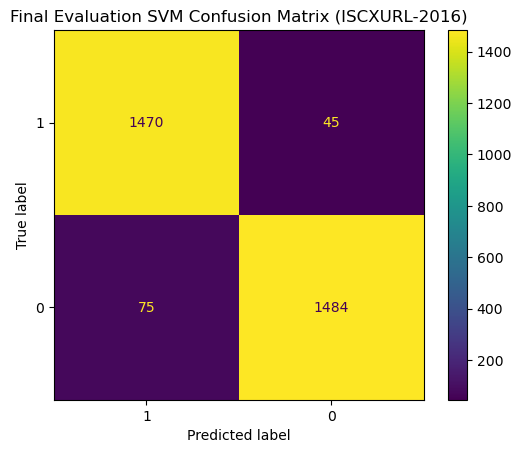

In [191]:
# '1' is the positive label corresponding to Phishing. All respective metrics will be in relation to '1'.

SVM_accuracy = np.array([SVM_eval_pred_cr_1['accuracy'], SVM_eval_pred_cr_2['accuracy'], SVM_eval_pred_cr_3['accuracy'], SVM_eval_pred_cr_4['accuracy'],
              SVM_eval_pred_cr_5['accuracy']])
SVM_precision = np.array([SVM_eval_pred_cr_1['1']['precision'], SVM_eval_pred_cr_2['1']['precision'], SVM_eval_pred_cr_3['1']['precision'],
               SVM_eval_pred_cr_4['1']['precision'], SVM_eval_pred_cr_5['1']['precision']])
SVM_recall = np.array([SVM_eval_pred_cr_1['1']['recall'], SVM_eval_pred_cr_2['1']['recall'], SVM_eval_pred_cr_3['1']['recall'], 
                      SVM_eval_pred_cr_4['1']['recall'], SVM_eval_pred_cr_5['1']['recall']])
SVM_f1 = np.array([SVM_eval_pred_cr_1['1']['f1-score'], SVM_eval_pred_cr_2['1']['f1-score'], SVM_eval_pred_cr_3['1']['f1-score'], 
                  SVM_eval_pred_cr_4['1']['f1-score'], SVM_eval_pred_cr_5['1']['f1-score']])

print("\nFinal evaluation results:")
print(f"SVM Accuracy: {SVM_accuracy.mean()} ± {SVM_accuracy.std()}")
print(f"SVM Precision: {SVM_precision.mean()} ± {SVM_precision.std()}")
print(f"SVM Recall: {SVM_recall.mean()} ± {SVM_recall.std()}")
print(f"SVM F1: {SVM_f1.mean()} ± {SVM_f1.std()}")

SVM_eval_preds = np.concatenate([SVM_eval_pred_1, SVM_eval_pred_2, SVM_eval_pred_3, SVM_eval_pred_4, SVM_eval_pred_5])
y_test_ISCX_SVM_all = np.concatenate([y_test_ISCX_SVM_1, y_test_ISCX_SVM_2, y_test_ISCX_SVM_3, y_test_ISCX_SVM_4, y_test_ISCX_SVM_5])

SVM_eval_cv_cm = ConfusionMatrixDisplay.from_predictions(y_test_ISCX_SVM_all, SVM_eval_preds, values_format='d', 
                                                        labels=[1, 0], display_labels=[1, 0])
_ = SVM_eval_cv_cm.ax_.set(title="Final Evaluation SVM Confusion Matrix (ISCXURL-2016)")

#### 12.3.2 Baseline Model

In [434]:
# Baseline evaluation on test set to verify final evaluation results.

train_indices = np.random.permutation(len(x_train_ISCX))

x_train_ISCX_SVM_shuffle = x_train_ISCX.iloc[train_indices]
y_train_ISCX_SVM_shuffle = y_train_ISCX.iloc[train_indices]

test_indices = np.random.permutation(len(x_test_ISCX))

x_test_ISCX_SVM_shuffle = x_test_ISCX.iloc[test_indices]
y_test_ISCX_shuffle = y_test_ISCX.iloc[test_indices]

# Each subset is 20% of the training set.
# Splitting Training set

x_train_ISCX_SVM_1, x_temp, y_train_ISCX_SVM_1, y_temp = train_test_split(x_train_ISCX_SVM_shuffle, y_train_ISCX_SVM_shuffle, test_size=0.8, random_state=100)

# 2nd split is 25% of x_temp, which is 25% of 80% of the original training set. Meaning, 2nd split is 20% of the original training set.
x_train_ISCX_SVM_2, x_temp, y_train_ISCX_SVM_2, y_temp = train_test_split(x_temp, y_temp, test_size=0.75, random_state=101)

# 3rd split = 33.33% of 60% of original training set.
x_train_ISCX_SVM_3, x_temp, y_train_ISCX_SVM_3, y_temp = train_test_split(x_temp, y_temp, test_size=0.6666, random_state=102)

# 4th and 5th split = 50% of 40% of original training set.
x_train_ISCX_SVM_4, x_train_ISCX_SVM_5, y_train_ISCX_SVM_4, y_train_ISCX_SVM_5 = train_test_split(x_temp, y_temp, test_size=0.5, random_state=103)

# Splitting Testing set

x_test_ISCX_SVM_1, x_temp, y_test_ISCX_SVM_1, y_temp = train_test_split(x_test_ISCX_SVM_shuffle, y_test_ISCX_shuffle, test_size=0.8, random_state=101)
x_test_ISCX_SVM_2, x_temp, y_test_ISCX_SVM_2, y_temp = train_test_split(x_temp, y_temp, test_size=0.75, random_state=102)
x_test_ISCX_SVM_3, x_temp, y_test_ISCX_SVM_3, y_temp = train_test_split(x_temp, y_temp, test_size=0.6666, random_state=103)
x_test_ISCX_SVM_4, x_test_ISCX_SVM_5, y_test_ISCX_SVM_4, y_test_ISCX_SVM_5 = train_test_split(x_temp, y_temp, test_size=0.5, random_state=104)

In [436]:
SVM_eval_1 = SVM_ISCX_default.fit(x_train_ISCX_SVM_1, y_train_ISCX_SVM_1)

SVM_eval_pred_1 = SVM_eval_1.predict(x_test_ISCX_SVM_1)

SVM_eval_pred_cr_1 = classification_report(y_test_ISCX_SVM_1, SVM_eval_pred_1, output_dict=True)

SVM_eval_pred_cr_1

{'0': {'precision': 0.9777070063694268,
  'recall': 0.9623824451410659,
  'f1-score': 0.9699842022116905,
  'support': 319.0},
 '1': {'precision': 0.96,
  'recall': 0.976271186440678,
  'f1-score': 0.9680672268907563,
  'support': 295.0},
 'accuracy': 0.9690553745928339,
 'macro avg': {'precision': 0.9688535031847134,
  'recall': 0.9693268157908719,
  'f1-score': 0.9690257145512233,
  'support': 614.0},
 'weighted avg': {'precision': 0.9691995684557771,
  'recall': 0.9690553745928339,
  'f1-score': 0.969063179866942,
  'support': 614.0}}

In [438]:
SVM_eval_2 = SVM_ISCX_default.fit(x_train_ISCX_SVM_2, y_train_ISCX_SVM_2)

SVM_eval_pred_2 = SVM_eval_2.predict(x_test_ISCX_SVM_2)

SVM_eval_pred_cr_2 = classification_report(y_test_ISCX_SVM_2, SVM_eval_pred_2, output_dict=True)

SVM_eval_pred_cr_2

{'0': {'precision': 0.946875,
  'recall': 0.9711538461538461,
  'f1-score': 0.9588607594936709,
  'support': 312.0},
 '1': {'precision': 0.9694915254237289,
  'recall': 0.9438943894389439,
  'f1-score': 0.9565217391304348,
  'support': 303.0},
 'accuracy': 0.9577235772357724,
 'macro avg': {'precision': 0.9581832627118645,
  'recall': 0.957524117796395,
  'f1-score': 0.9576912493120529,
  'support': 615.0},
 'weighted avg': {'precision': 0.9580177759404712,
  'recall': 0.9577235772357724,
  'f1-score': 0.9577083640951983,
  'support': 615.0}}

In [440]:
SVM_eval_3 = SVM_ISCX_default.fit(x_train_ISCX_SVM_3, y_train_ISCX_SVM_3)

SVM_eval_pred_3 = SVM_eval_3.predict(x_test_ISCX_SVM_3)

SVM_eval_pred_cr_3 = classification_report(y_test_ISCX_SVM_3, SVM_eval_pred_3, output_dict=True)

SVM_eval_pred_cr_3

{'0': {'precision': 0.9559748427672956,
  'recall': 0.9743589743589743,
  'f1-score': 0.9650793650793651,
  'support': 312.0},
 '1': {'precision': 0.9730639730639731,
  'recall': 0.9537953795379538,
  'f1-score': 0.9633333333333334,
  'support': 303.0},
 'accuracy': 0.9642276422764228,
 'macro avg': {'precision': 0.9645194079156343,
  'recall': 0.9640771769484641,
  'f1-score': 0.9642063492063493,
  'support': 615.0},
 'weighted avg': {'precision': 0.9643943654988293,
  'recall': 0.9642276422764228,
  'f1-score': 0.9642191250483932,
  'support': 615.0}}

In [442]:
SVM_eval_4 = SVM_ISCX_default.fit(x_train_ISCX_SVM_4, y_train_ISCX_SVM_4)

SVM_eval_pred_4 = SVM_eval_4.predict(x_test_ISCX_SVM_4)

SVM_eval_pred_cr_4 = classification_report(y_test_ISCX_SVM_4, SVM_eval_pred_4, output_dict=True)

SVM_eval_pred_cr_4

{'0': {'precision': 0.9801324503311258,
  'recall': 0.9548387096774194,
  'f1-score': 0.9673202614379085,
  'support': 310.0},
 '1': {'precision': 0.9552715654952076,
  'recall': 0.980327868852459,
  'f1-score': 0.9676375404530745,
  'support': 305.0},
 'accuracy': 0.967479674796748,
 'macro avg': {'precision': 0.9677020079131667,
  'recall': 0.9675832892649392,
  'f1-score': 0.9674789009454915,
  'support': 615.0},
 'weighted avg': {'precision': 0.9678030684206298,
  'recall': 0.967479674796748,
  'f1-score': 0.9674776111933973,
  'support': 615.0}}

In [444]:
SVM_eval_5 = SVM_ISCX_default.fit(x_train_ISCX_SVM_5, y_train_ISCX_SVM_5)

SVM_eval_pred_5 = SVM_eval_5.predict(x_test_ISCX_SVM_5)

SVM_eval_pred_cr_5 = classification_report(y_test_ISCX_SVM_5, SVM_eval_pred_5, output_dict=True)

SVM_eval_pred_cr_5

{'0': {'precision': 0.9240506329113924,
  'recall': 0.954248366013072,
  'f1-score': 0.9389067524115756,
  'support': 306.0},
 '1': {'precision': 0.9531772575250836,
  'recall': 0.9223300970873787,
  'f1-score': 0.9375,
  'support': 309.0},
 'accuracy': 0.9382113821138212,
 'macro avg': {'precision': 0.938613945218238,
  'recall': 0.9382892315502254,
  'f1-score': 0.9382033762057878,
  'support': 615.0},
 'weighted avg': {'precision': 0.9386849857660764,
  'recall': 0.9382113821138212,
  'f1-score': 0.938199945102345,
  'support': 615.0}}


Final evaluation results:
SVM Accuracy: 0.9593395302031198 ± 0.011256670658125306
SVM Precision: 0.9622008643015987 ± 0.007815949545133817
SVM Recall: 0.9553237842714827 ± 0.021380123407691902
SVM F1: 0.9586119679615198 ± 0.011342296231080486


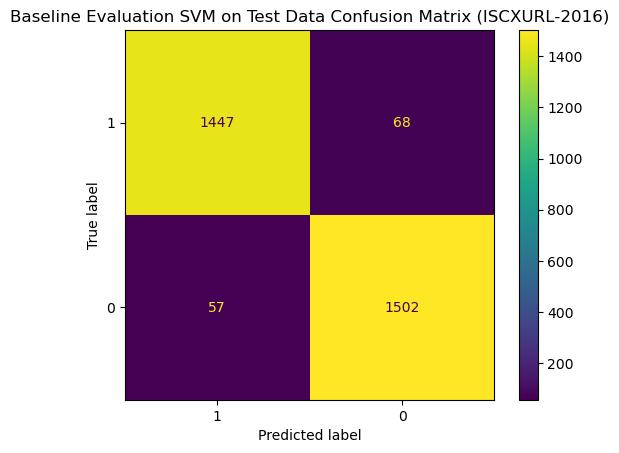

In [446]:
# '1' is the positive label corresponding to Phishing. All respective metrics will be in relation to '1'.

SVM_accuracy = np.array([SVM_eval_pred_cr_1['accuracy'], SVM_eval_pred_cr_2['accuracy'], SVM_eval_pred_cr_3['accuracy'], SVM_eval_pred_cr_4['accuracy'],
              SVM_eval_pred_cr_5['accuracy']])
SVM_precision = np.array([SVM_eval_pred_cr_1['1']['precision'], SVM_eval_pred_cr_2['1']['precision'], SVM_eval_pred_cr_3['1']['precision'],
               SVM_eval_pred_cr_4['1']['precision'], SVM_eval_pred_cr_5['1']['precision']])
SVM_recall = np.array([SVM_eval_pred_cr_1['1']['recall'], SVM_eval_pred_cr_2['1']['recall'], SVM_eval_pred_cr_3['1']['recall'], 
                      SVM_eval_pred_cr_4['1']['recall'], SVM_eval_pred_cr_5['1']['recall']])
SVM_f1 = np.array([SVM_eval_pred_cr_1['1']['f1-score'], SVM_eval_pred_cr_2['1']['f1-score'], SVM_eval_pred_cr_3['1']['f1-score'], 
                  SVM_eval_pred_cr_4['1']['f1-score'], SVM_eval_pred_cr_5['1']['f1-score']])

print("\nFinal evaluation results:")
print(f"SVM Accuracy: {SVM_accuracy.mean()} ± {SVM_accuracy.std()}")
print(f"SVM Precision: {SVM_precision.mean()} ± {SVM_precision.std()}")
print(f"SVM Recall: {SVM_recall.mean()} ± {SVM_recall.std()}")
print(f"SVM F1: {SVM_f1.mean()} ± {SVM_f1.std()}")

SVM_eval_preds = np.concatenate([SVM_eval_pred_1, SVM_eval_pred_2, SVM_eval_pred_3, SVM_eval_pred_4, SVM_eval_pred_5])
y_test_ISCX_SVM_all = np.concatenate([y_test_ISCX_SVM_1, y_test_ISCX_SVM_2, y_test_ISCX_SVM_3, y_test_ISCX_SVM_4, y_test_ISCX_SVM_5])

SVM_eval_cv_cm = ConfusionMatrixDisplay.from_predictions(y_test_ISCX_SVM_all, SVM_eval_preds, values_format='d', 
                                                        labels=[1, 0], display_labels=[1, 0])
_ = SVM_eval_cv_cm.ax_.set(title="Baseline Evaluation SVM on Test Data Confusion Matrix (ISCXURL-2016)")

## Graph Comparison of Existing Approaches

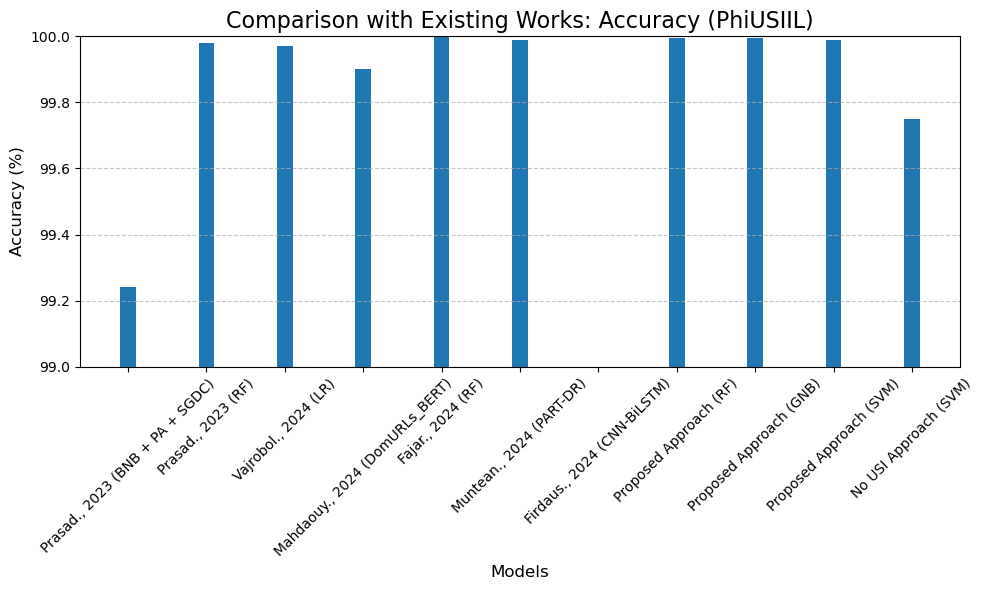

In [233]:
# Metrics for the models
models = ['Prasad., 2023 (BNB + PA + SGDC)', 'Prasad., 2023 (RF)', 'Vajrobol., 2024 (LR)', 'Mahdaouy., 2024 (DomURLs_BERT)',
         'Fajar., 2024 (RF)', 'Muntean., 2024 (PART-DR)', 'Firdaus., 2024 (CNN-BiLSTM)', 'Proposed Approach (RF)', 'Proposed Approach (GNB)',
          'Proposed Approach (SVM)', 'No USI Approach (SVM)']
accuracy = [99.24, 99.98, 99.97, 99.90, 100, 99.99, 89.5, 99.996, 99.994, 99.989, 99.751]

# Combine metrics into a single data structure
metrics = [accuracy]
metric_names = ['Accuracy']

# Bar chart properties
x = np.arange(len(models))  # x positions for groups
width = 0.2  # Width of each bar

# Create the plot
fig, ax = plt.subplots(figsize=(10, 6))

# Plot each metric as a group of bars
for i, metric in enumerate(metrics):
    ax.bar(x, metric, width, label=metric_names[i])

# Formatting the chart
ax.set_title('Comparison with Existing Works: Accuracy (PhiUSIIL)', fontsize=16)
ax.set_xlabel('Models', fontsize=12)
ax.set_ylabel('Accuracy (%)', fontsize=12)
ax.set_xticks(x)  # Center the group labels
ax.set_xticklabels(models, fontsize=10, rotation=45)
ax.set_ylim(99, 100)  # Assuming metric scores are between 0 and 1

# Add gridlines for better readability
ax.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot
plt.tight_layout()
plt.show()

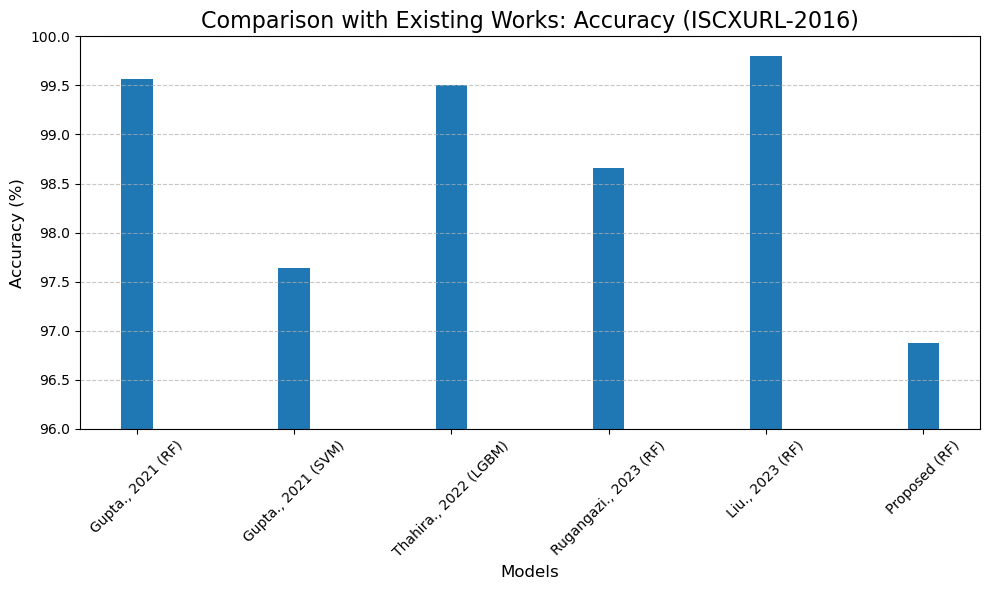

In [231]:
# Metrics for the models
models = ['Gupta., 2021 (RF)', 'Gupta., 2021 (SVM)', 'Thahira., 2022 (LGBM)', 'Rugangazi., 2023 (RF)', 'Liu., 2023 (RF)', 'Proposed (RF)']
accuracy = [99.57, 97.64, 99.5, 98.66, 99.8, 96.877]

# Combine metrics into a single data structure
metrics = [accuracy]
metric_names = ['Accuracy']

# Bar chart properties
x = np.arange(len(models))  # x positions for groups
width = 0.2  # Width of each bar

# Create the plot
fig, ax = plt.subplots(figsize=(10, 6))

# Plot each metric as a group of bars
for i, metric in enumerate(metrics):
    ax.bar(x, metric, width, label=metric_names[i])

# Formatting the chart
ax.set_title('Comparison with Existing Works: Accuracy (ISCXURL-2016)', fontsize=16)
ax.set_xlabel('Models', fontsize=12)
ax.set_ylabel('Accuracy (%)', fontsize=12)
ax.set_xticks(x)  # Center the group labels
ax.set_xticklabels(models, fontsize=10, rotation=45)
ax.set_ylim(96, 100)  # Assuming metric scores are between 0 and 1

# Add gridlines for better readability
ax.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot
plt.tight_layout()
plt.show()